In [1]:
from google.colab import drive
drive.mount('/content/drive')

Mounted at /content/drive


In [2]:
!unzip /content/drive/MyDrive/flickr8k.zip

Streaming output truncated to the last 5000 lines.
  inflating: flickr8k/Flickr8k_Dataset/Flicker8k_Dataset/2847514745_9a35493023.jpg  
  inflating: flickr8k/Flickr8k_Dataset/Flicker8k_Dataset/2847615962_c330bded6e.jpg  
  inflating: flickr8k/Flickr8k_Dataset/Flicker8k_Dataset/2847859796_4d9cb0d31f.jpg  
  inflating: flickr8k/Flickr8k_Dataset/Flicker8k_Dataset/2848266893_9693c66275.jpg  
  inflating: flickr8k/Flickr8k_Dataset/Flicker8k_Dataset/2848571082_26454cb981.jpg  
  inflating: flickr8k/Flickr8k_Dataset/Flicker8k_Dataset/2848895544_6d06210e9d.jpg  
  inflating: flickr8k/Flickr8k_Dataset/Flicker8k_Dataset/2848977044_446a31d86e.jpg  
  inflating: flickr8k/Flickr8k_Dataset/Flicker8k_Dataset/2849194983_2968c72832.jpg  
  inflating: flickr8k/Flickr8k_Dataset/Flicker8k_Dataset/2850719435_221f15e951.jpg  
  inflating: flickr8k/Flickr8k_Dataset/Flicker8k_Dataset/2851198725_37b6027625.jpg  
  inflating: flickr8k/Flickr8k_Dataset/Flicker8k_Dataset/2851304910_b5721199bc.jpg  
  inflating: f

In [3]:
caption_file = "/content/flickr8k/Flickr8k_text/Flickr8k.token.txt"

#Reading the caption file

def load_captions (filename):
  with open(filename, "r") as fp:
    # Read all text in the file
    text = fp.read()
    return (text)

#making a dictionary based on each image identifier and thier captions

def captions_dict (text):
  dict = {}
  
  # Make a List of each line in the file
  lines = text.split ('\n')
  for line in lines:
    
    # Split into the <image_data> and <caption>
    line_split = line.split ('\t')
    if (len(line_split) != 2):
      # Added this check because dataset contains some blank lines
      continue
    else:
      image_data, caption = line_split

    # Split into <image_file> and <caption_idx> , the second one contains the 
    # number count of the capton for each image
    image_file, caption_idx = image_data.split ('#')
    # Split the <image_file> into <image_name>.jpg
    image_name = image_file.split ('.')[0]
    
    # If this is the first caption for this image, create a new list for that
    # image and add the caption to it. Otherwise append the caption to the 
    # existing list
    if (int(caption_idx) == 0):
      dict [image_name] = [caption]
    else:
      dict [image_name].append (caption)
  
  return (dict)

# lets call them

doc = load_captions (caption_file)
image_dict = captions_dict (doc)

In [4]:
print(image_dict)

{'1000268201_693b08cb0e': ['A child in a pink dress is climbing up a set of stairs in an entry way .', 'A girl going into a wooden building .', 'A little girl climbing into a wooden playhouse .', 'A little girl climbing the stairs to her playhouse .', 'A little girl in a pink dress going into a wooden cabin .'], '1001773457_577c3a7d70': ['A black dog and a spotted dog are fighting', 'A black dog and a tri-colored dog playing with each other on the road .', 'A black dog and a white dog with brown spots are staring at each other in the street .', 'Two dogs of different breeds looking at each other on the road .', 'Two dogs on pavement moving toward each other .'], '1002674143_1b742ab4b8': ['A little girl covered in paint sits in front of a painted rainbow with her hands in a bowl .', 'A little girl is sitting in front of a large painted rainbow .', 'A small girl in the grass plays with fingerpaints in front of a white canvas with a rainbow on it .', 'There is a girl with pigtails sitting

In [5]:
#now we write a function to extract the images based on the test and train and validation files

def subset_image_name (filename):
  data = []
  
  with open(filename, "r") as fp:
    # Read all text in the file
    text = fp.read()
  
    # Make a List of each line in the file
    lines = text.split ('\n')
    for line in lines:
      # skip empty lines
      if (len(line) < 1):
        continue
      
      # Each line is the <image_file>
      # Split the <image_file> into <image_name>.jpg
      image_name = line.split ('.')[0]
      
      # Add the <image_name> to the list
      data.append (image_name)

    return (set(data))


training_image_name_file = "/content/flickr8k/Flickr8k_text/Flickr_8k.trainImages.txt"
training_image_names = subset_image_name (training_image_name_file)

In [6]:
#using inception pre trained model to exctract features for each image
import numpy as np
import tensorflow as tf

def load_image(image_path):
    img = tf.io.read_file(image_path)
    img = tf.image.decode_jpeg(img, channels=3)
    img = tf.image.resize(img, (299, 299))
    img = tf.keras.applications.inception_v3.preprocess_input(img)
    return img, image_path
    
image_model = tf.keras.applications.InceptionV3(include_top=False,
                                                weights='imagenet')
new_input = image_model.input
hidden_layer = image_model.layers[-1].output

image_features_extract_model = tf.keras.Model(new_input, hidden_layer)

from tqdm import tqdm

image_dir = "/content/flickr8k/Flickr8k_Dataset/Flicker8k_Dataset/"
training_image_paths = [image_dir + name + '.jpg' for name in training_image_names]

# Get unique images
encode_train = sorted(set(training_image_paths))

# Feel free to change batch_size according to your system configuration
image_dataset = tf.data.Dataset.from_tensor_slices(encode_train)
image_dataset = image_dataset.map(
  load_image, num_parallel_calls=tf.data.experimental.AUTOTUNE).batch(16)

for img, path in tqdm(image_dataset):
  batch_features = image_features_extract_model(img)
  print(batch_features)
  batch_features = tf.reshape(batch_features,
                              (batch_features.shape[0], -1, batch_features.shape[3]))

  for bf, p in zip(batch_features, path):
    path_of_feature = p.numpy().decode("utf-8")
    np.save(path_of_feature, bf.numpy())

87916544/87910968 [==============================] - 0s 0us/step


  1%|          | 2/375 [00:30<2:13:11, 21.42s/it]

tf.Tensor(
[[[[0.00000000e+00 0.00000000e+00 0.00000000e+00 ... 0.00000000e+00
    0.00000000e+00 0.00000000e+00]
   [0.00000000e+00 0.00000000e+00 0.00000000e+00 ... 0.00000000e+00
    0.00000000e+00 1.69782713e-01]
   [0.00000000e+00 0.00000000e+00 1.01051378e+00 ... 0.00000000e+00
    0.00000000e+00 6.11276925e-02]
   ...
   [0.00000000e+00 0.00000000e+00 0.00000000e+00 ... 0.00000000e+00
    4.02287215e-01 0.00000000e+00]
   [0.00000000e+00 0.00000000e+00 0.00000000e+00 ... 6.00213647e-01
    3.74549985e-01 0.00000000e+00]
   [0.00000000e+00 0.00000000e+00 9.27410960e-01 ... 7.58855462e-01
    8.66299421e-02 0.00000000e+00]]

  [[0.00000000e+00 0.00000000e+00 4.75354463e-01 ... 0.00000000e+00
    0.00000000e+00 1.20302709e-02]
   [0.00000000e+00 0.00000000e+00 0.00000000e+00 ... 0.00000000e+00
    0.00000000e+00 2.64887601e-01]
   [0.00000000e+00 0.00000000e+00 5.81788063e-01 ... 0.00000000e+00
    0.00000000e+00 1.54589057e-01]
   ...
   [0.00000000e+00 9.93533075e-01 2.50562042e-

  1%|          | 4/375 [00:31<1:05:25, 10.58s/it]

tf.Tensor(
[[[[0.00000000e+00 0.00000000e+00 0.00000000e+00 ... 0.00000000e+00
    0.00000000e+00 3.56708050e-01]
   [0.00000000e+00 7.56028667e-02 0.00000000e+00 ... 3.36807035e-02
    0.00000000e+00 3.02393407e-01]
   [0.00000000e+00 1.65281147e-01 2.57586390e-01 ... 1.04942970e-01
    0.00000000e+00 0.00000000e+00]
   ...
   [0.00000000e+00 0.00000000e+00 1.28757048e+00 ... 0.00000000e+00
    0.00000000e+00 0.00000000e+00]
   [0.00000000e+00 0.00000000e+00 0.00000000e+00 ... 0.00000000e+00
    1.80665925e-01 0.00000000e+00]
   [3.90917212e-01 0.00000000e+00 2.43060544e-01 ... 5.47760986e-02
    2.61358380e-01 0.00000000e+00]]

  [[1.03015669e-01 0.00000000e+00 1.38331771e-01 ... 0.00000000e+00
    0.00000000e+00 6.59885630e-02]
   [0.00000000e+00 0.00000000e+00 1.80699453e-01 ... 2.78486200e-02
    0.00000000e+00 1.30283877e-01]
   [1.97562471e-01 7.14593351e-01 5.62845111e-01 ... 0.00000000e+00
    0.00000000e+00 0.00000000e+00]
   ...
   [0.00000000e+00 2.77817100e-01 2.98666149e-

  2%|▏         | 6/375 [00:31<32:23,  5.27s/it]

tf.Tensor(
[[[[0.         0.11624262 0.         ... 0.         1.0421159
    0.        ]
   [0.         0.         0.         ... 0.         1.2646511
    0.        ]
   [0.         0.         0.         ... 0.         0.9887367
    0.        ]
   ...
   [0.4651439  0.         0.         ... 0.99386597 0.0754715
    0.        ]
   [0.752593   0.         0.9422357  ... 0.78703135 0.
    0.        ]
   [0.         0.         0.         ... 0.42357737 0.
    0.        ]]

  [[0.06036839 0.         0.         ... 0.06470468 0.8234701
    0.        ]
   [0.05568305 0.         0.         ... 0.31772155 1.1203771
    0.        ]
   [0.21151508 0.         0.         ... 0.7027042  1.1900103
    0.        ]
   ...
   [1.0478619  0.         0.737195   ... 1.2844081  0.41196632
    0.        ]
   [0.67931026 0.         0.68300956 ... 1.0232404  0.
    0.        ]
   [0.         0.         0.         ... 0.6197788  0.
    0.        ]]

  [[0.26059943 0.5049027  0.         ... 0.9419193  0.65269667

  2%|▏         | 8/375 [00:31<16:17,  2.66s/it]

tf.Tensor(
[[[[0.00000000e+00 0.00000000e+00 1.70343983e+00 ... 0.00000000e+00
    1.09089971e+00 7.08169460e-01]
   [0.00000000e+00 0.00000000e+00 1.17079592e+00 ... 0.00000000e+00
    1.42791677e+00 8.99709702e-01]
   [0.00000000e+00 0.00000000e+00 3.38851213e-01 ... 0.00000000e+00
    2.20442796e+00 9.47238207e-01]
   ...
   [0.00000000e+00 0.00000000e+00 0.00000000e+00 ... 4.54800844e-01
    2.24465060e+00 1.32153416e+00]
   [0.00000000e+00 0.00000000e+00 0.00000000e+00 ... 0.00000000e+00
    1.37302899e+00 8.40902209e-01]
   [0.00000000e+00 0.00000000e+00 0.00000000e+00 ... 0.00000000e+00
    1.25629485e+00 5.25943279e-01]]

  [[0.00000000e+00 0.00000000e+00 1.58793509e-01 ... 0.00000000e+00
    1.10865843e+00 6.96860552e-01]
   [0.00000000e+00 0.00000000e+00 0.00000000e+00 ... 0.00000000e+00
    1.35846341e+00 8.58825326e-01]
   [8.10976982e-01 0.00000000e+00 0.00000000e+00 ... 0.00000000e+00
    1.94416595e+00 9.34632123e-01]
   ...
   [0.00000000e+00 0.00000000e+00 3.38289350e-

  3%|▎         | 10/375 [00:31<08:24,  1.38s/it]

tf.Tensor(
[[[[0.0928253  0.3182609  0.         ... 1.6584996  0.92770964
    0.        ]
   [1.1280874  0.42211452 0.21393542 ... 3.3849533  1.2345347
    0.        ]
   [1.0942509  0.06144519 2.2489188  ... 4.8019323  1.8804839
    0.        ]
   ...
   [0.         0.7475317  0.         ... 1.8264209  1.8574951
    0.01383509]
   [0.8852528  0.5972477  0.         ... 1.2879025  0.58615166
    0.        ]
   [0.         0.         0.         ... 0.69027203 0.
    0.        ]]

  [[0.40385127 0.         0.         ... 1.2554289  0.4381168
    0.        ]
   [0.5001524  0.2224002  0.         ... 2.5338867  0.7153805
    0.        ]
   [0.         0.65500563 0.7938799  ... 3.629405   1.1779435
    0.        ]
   ...
   [0.97957945 2.669786   1.1985048  ... 1.3635117  1.9673893
    0.26005957]
   [0.         3.2555327  0.05140567 ... 1.146624   1.1978844
    0.        ]
   [0.         0.7834324  0.46795535 ... 0.71331215 0.67404854
    0.        ]]

  [[0.4841081  0.         0.         ..

  3%|▎         | 12/375 [00:32<04:36,  1.31it/s]

tf.Tensor(
[[[[2.30677128e-01 1.55342266e-01 1.94811951e-02 ... 3.59136850e-01
    0.00000000e+00 0.00000000e+00]
   [2.81501174e-01 0.00000000e+00 5.34929693e-01 ... 3.13511699e-01
    0.00000000e+00 0.00000000e+00]
   [0.00000000e+00 0.00000000e+00 2.21020371e-01 ... 2.88061440e-01
    1.38077542e-01 6.75391436e-01]
   ...
   [0.00000000e+00 0.00000000e+00 0.00000000e+00 ... 0.00000000e+00
    0.00000000e+00 0.00000000e+00]
   [0.00000000e+00 0.00000000e+00 0.00000000e+00 ... 0.00000000e+00
    0.00000000e+00 0.00000000e+00]
   [0.00000000e+00 0.00000000e+00 7.03030109e-01 ... 0.00000000e+00
    2.00374469e-01 3.23271304e-01]]

  [[0.00000000e+00 0.00000000e+00 1.77156115e+00 ... 3.76006693e-01
    0.00000000e+00 0.00000000e+00]
   [6.33758307e-01 0.00000000e+00 0.00000000e+00 ... 2.36110821e-01
    0.00000000e+00 0.00000000e+00]
   [0.00000000e+00 0.00000000e+00 0.00000000e+00 ... 0.00000000e+00
    0.00000000e+00 3.08940232e-01]
   ...
   [0.00000000e+00 0.00000000e+00 0.00000000e+

  3%|▎         | 13/375 [00:32<03:31,  1.71it/s]

tf.Tensor(
[[[[2.88739830e-01 7.16238439e-01 1.80884683e+00 ... 0.00000000e+00
    2.88877040e-01 0.00000000e+00]
   [1.45852968e-01 0.00000000e+00 0.00000000e+00 ... 0.00000000e+00
    6.17684305e-01 0.00000000e+00]
   [0.00000000e+00 2.28664130e-01 0.00000000e+00 ... 7.76064277e-01
    1.57146263e+00 3.93248886e-01]
   ...
   [3.08039218e-01 0.00000000e+00 0.00000000e+00 ... 0.00000000e+00
    2.71693277e+00 0.00000000e+00]
   [0.00000000e+00 0.00000000e+00 0.00000000e+00 ... 3.78482431e-01
    1.78625810e+00 0.00000000e+00]
   [0.00000000e+00 0.00000000e+00 0.00000000e+00 ... 6.09393299e-01
    1.04664731e+00 0.00000000e+00]]

  [[5.98096728e-01 0.00000000e+00 1.40016034e-01 ... 0.00000000e+00
    1.30248636e-01 0.00000000e+00]
   [2.67620772e-01 4.60355133e-01 0.00000000e+00 ... 0.00000000e+00
    4.55550641e-01 0.00000000e+00]
   [0.00000000e+00 0.00000000e+00 0.00000000e+00 ... 5.02144158e-01
    1.32018304e+00 2.10192487e-01]
   ...
   [0.00000000e+00 0.00000000e+00 0.00000000e+

  4%|▍         | 15/375 [00:32<02:19,  2.57it/s]

tf.Tensor(
[[[[0.00000000e+00 0.00000000e+00 3.24490458e-01 ... 0.00000000e+00
    0.00000000e+00 0.00000000e+00]
   [1.48190603e-01 0.00000000e+00 2.24121377e-01 ... 0.00000000e+00
    0.00000000e+00 0.00000000e+00]
   [4.14198525e-02 0.00000000e+00 3.14052612e-01 ... 0.00000000e+00
    0.00000000e+00 0.00000000e+00]
   ...
   [0.00000000e+00 0.00000000e+00 0.00000000e+00 ... 0.00000000e+00
    0.00000000e+00 0.00000000e+00]
   [1.05964139e-01 0.00000000e+00 1.57565963e+00 ... 0.00000000e+00
    0.00000000e+00 0.00000000e+00]
   [0.00000000e+00 0.00000000e+00 1.01084054e+00 ... 0.00000000e+00
    0.00000000e+00 0.00000000e+00]]

  [[0.00000000e+00 0.00000000e+00 3.61714780e-01 ... 0.00000000e+00
    0.00000000e+00 0.00000000e+00]
   [0.00000000e+00 0.00000000e+00 1.40460312e+00 ... 0.00000000e+00
    0.00000000e+00 0.00000000e+00]
   [0.00000000e+00 0.00000000e+00 5.63760065e-02 ... 0.00000000e+00
    0.00000000e+00 2.53168225e-01]
   ...
   [0.00000000e+00 0.00000000e+00 0.00000000e+

  4%|▍         | 16/375 [00:33<01:57,  3.06it/s]

tf.Tensor(
[[[[0.00000000e+00 2.30393216e-01 0.00000000e+00 ... 1.40374631e-01
    0.00000000e+00 0.00000000e+00]
   [0.00000000e+00 0.00000000e+00 0.00000000e+00 ... 2.26538748e-01
    0.00000000e+00 0.00000000e+00]
   [0.00000000e+00 0.00000000e+00 0.00000000e+00 ... 6.09638572e-01
    0.00000000e+00 0.00000000e+00]
   ...
   [4.30225760e-01 0.00000000e+00 0.00000000e+00 ... 2.74985600e+00
    2.38537565e-01 0.00000000e+00]
   [0.00000000e+00 0.00000000e+00 0.00000000e+00 ... 1.99683571e+00
    0.00000000e+00 0.00000000e+00]
   [3.40998232e-01 1.42107561e-01 0.00000000e+00 ... 1.26717722e+00
    0.00000000e+00 0.00000000e+00]]

  [[0.00000000e+00 0.00000000e+00 0.00000000e+00 ... 0.00000000e+00
    0.00000000e+00 0.00000000e+00]
   [0.00000000e+00 0.00000000e+00 0.00000000e+00 ... 2.67660990e-02
    0.00000000e+00 0.00000000e+00]
   [0.00000000e+00 1.31001532e-01 5.43607295e-01 ... 4.08252209e-01
    2.82550100e-02 0.00000000e+00]
   ...
   [0.00000000e+00 1.24185890e-01 0.00000000e+

  5%|▌         | 19/375 [00:33<01:19,  4.45it/s]

tf.Tensor(
[[[[0.00000000e+00 2.31425405e+00 0.00000000e+00 ... 2.70391852e-01
    1.80811822e+00 3.95783275e-01]
   [0.00000000e+00 2.66398287e+00 0.00000000e+00 ... 1.12699497e+00
    2.59413075e+00 6.73555553e-01]
   [4.47739065e-01 0.00000000e+00 0.00000000e+00 ... 1.58783925e+00
    3.80459237e+00 8.60414565e-01]
   ...
   [9.87193286e-01 0.00000000e+00 3.89749855e-01 ... 1.30869436e+00
    3.17118692e+00 4.21540707e-01]
   [6.19409919e-01 0.00000000e+00 4.92511630e-01 ... 1.88828576e+00
    1.79276991e+00 2.80752718e-01]
   [0.00000000e+00 0.00000000e+00 1.26824284e+00 ... 2.51425886e+00
    9.85783219e-01 4.79356647e-01]]

  [[0.00000000e+00 5.53866684e-01 0.00000000e+00 ... 6.80760384e-01
    9.47016120e-01 3.91609728e-01]
   [0.00000000e+00 3.38463873e-01 0.00000000e+00 ... 1.20573807e+00
    1.70711780e+00 6.37373269e-01]
   [0.00000000e+00 0.00000000e+00 0.00000000e+00 ... 1.49967170e+00
    3.02342200e+00 5.63321650e-01]
   ...
   [1.16208196e+00 0.00000000e+00 0.00000000e+

  6%|▌         | 21/375 [00:33<01:08,  5.14it/s]

tf.Tensor(
[[[[2.99092531e-01 0.00000000e+00 0.00000000e+00 ... 0.00000000e+00
    1.00847805e+00 0.00000000e+00]
   [1.13295567e+00 0.00000000e+00 0.00000000e+00 ... 0.00000000e+00
    1.39700854e+00 0.00000000e+00]
   [0.00000000e+00 0.00000000e+00 0.00000000e+00 ... 0.00000000e+00
    6.62499487e-01 0.00000000e+00]
   ...
   [0.00000000e+00 0.00000000e+00 4.35337014e-02 ... 5.98777235e-01
    1.20746538e-01 0.00000000e+00]
   [0.00000000e+00 0.00000000e+00 0.00000000e+00 ... 1.15514791e+00
    1.30885017e+00 0.00000000e+00]
   [0.00000000e+00 0.00000000e+00 0.00000000e+00 ... 1.00771856e+00
    1.94106185e+00 0.00000000e+00]]

  [[1.34894145e+00 1.43603563e-01 0.00000000e+00 ... 0.00000000e+00
    3.37949753e-01 0.00000000e+00]
   [1.42274702e+00 1.98097616e-01 0.00000000e+00 ... 0.00000000e+00
    3.36794227e-01 0.00000000e+00]
   [0.00000000e+00 0.00000000e+00 0.00000000e+00 ... 2.36738041e-01
    0.00000000e+00 0.00000000e+00]
   ...
   [0.00000000e+00 0.00000000e+00 1.28630185e+

  6%|▌         | 23/375 [00:34<01:02,  5.68it/s]

tf.Tensor(
[[[[0.00000000e+00 0.00000000e+00 4.96042296e-02 ... 0.00000000e+00
    0.00000000e+00 0.00000000e+00]
   [3.08950394e-01 0.00000000e+00 0.00000000e+00 ... 0.00000000e+00
    0.00000000e+00 0.00000000e+00]
   [0.00000000e+00 3.87036018e-02 0.00000000e+00 ... 0.00000000e+00
    0.00000000e+00 0.00000000e+00]
   ...
   [0.00000000e+00 1.53977036e-01 1.23057038e-01 ... 0.00000000e+00
    0.00000000e+00 1.32730991e-01]
   [0.00000000e+00 3.19100678e-01 0.00000000e+00 ... 0.00000000e+00
    0.00000000e+00 0.00000000e+00]
   [0.00000000e+00 9.60748196e-01 5.68599366e-02 ... 0.00000000e+00
    0.00000000e+00 0.00000000e+00]]

  [[0.00000000e+00 0.00000000e+00 0.00000000e+00 ... 0.00000000e+00
    0.00000000e+00 0.00000000e+00]
   [0.00000000e+00 0.00000000e+00 0.00000000e+00 ... 0.00000000e+00
    0.00000000e+00 0.00000000e+00]
   [0.00000000e+00 4.03759390e-01 0.00000000e+00 ... 0.00000000e+00
    0.00000000e+00 0.00000000e+00]
   ...
   [1.81375723e-02 2.30442792e-01 0.00000000e+

  6%|▋         | 24/375 [00:34<01:06,  5.29it/s]

tf.Tensor(
[[[[9.6201551e-01 0.0000000e+00 0.0000000e+00 ... 6.1125034e-01
    0.0000000e+00 0.0000000e+00]
   [5.7095706e-01 0.0000000e+00 0.0000000e+00 ... 5.8057380e-01
    0.0000000e+00 0.0000000e+00]
   [0.0000000e+00 0.0000000e+00 2.6123020e-01 ... 4.3725815e-01
    0.0000000e+00 0.0000000e+00]
   ...
   [0.0000000e+00 0.0000000e+00 0.0000000e+00 ... 0.0000000e+00
    1.1053482e-03 1.5659468e-01]
   [7.5654888e-01 3.4639794e-01 0.0000000e+00 ... 3.2447755e-01
    0.0000000e+00 9.5325476e-01]
   [4.3986905e-03 0.0000000e+00 0.0000000e+00 ... 4.0497902e-01
    0.0000000e+00 1.4930905e+00]]

  [[1.2647218e+00 4.7306448e-02 0.0000000e+00 ... 6.7210245e-01
    0.0000000e+00 0.0000000e+00]
   [4.2457864e-02 0.0000000e+00 0.0000000e+00 ... 5.6063086e-01
    0.0000000e+00 0.0000000e+00]
   [0.0000000e+00 0.0000000e+00 1.8860421e-01 ... 3.9597598e-01
    0.0000000e+00 0.0000000e+00]
   ...
   [7.8503184e-02 0.0000000e+00 0.0000000e+00 ... 1.2946697e-01
    1.0817888e+00 9.7231627e-01]
   

  7%|▋         | 27/375 [00:34<01:01,  5.61it/s]

tf.Tensor(
[[[[0.00000000e+00 0.00000000e+00 5.51629066e-01 ... 9.94628549e-01
    2.68153884e-02 0.00000000e+00]
   [0.00000000e+00 0.00000000e+00 4.29551840e-01 ... 7.65571475e-01
    1.54294193e-01 0.00000000e+00]
   [0.00000000e+00 0.00000000e+00 0.00000000e+00 ... 6.99947551e-02
    1.89544424e-01 0.00000000e+00]
   ...
   [1.53157294e+00 0.00000000e+00 3.89899015e-02 ... 0.00000000e+00
    3.61522734e-01 0.00000000e+00]
   [8.24712873e-01 0.00000000e+00 3.60288858e-01 ... 0.00000000e+00
    0.00000000e+00 0.00000000e+00]
   [0.00000000e+00 1.97174363e-02 0.00000000e+00 ... 0.00000000e+00
    0.00000000e+00 0.00000000e+00]]

  [[0.00000000e+00 0.00000000e+00 1.21074402e+00 ... 7.53095567e-01
    1.37103796e-01 0.00000000e+00]
   [0.00000000e+00 0.00000000e+00 8.21091712e-01 ... 6.50073946e-01
    2.14165345e-01 0.00000000e+00]
   [2.02029631e-01 0.00000000e+00 0.00000000e+00 ... 2.67367661e-01
    2.77701885e-01 0.00000000e+00]
   ...
   [1.95575666e+00 0.00000000e+00 1.15346003e+

  8%|▊         | 29/375 [00:35<01:00,  5.74it/s]

tf.Tensor(
[[[[1.02125371e+00 0.00000000e+00 0.00000000e+00 ... 7.41773844e-02
    0.00000000e+00 9.45614874e-01]
   [1.61407307e-01 0.00000000e+00 0.00000000e+00 ... 0.00000000e+00
    0.00000000e+00 7.94451058e-01]
   [5.51377833e-01 0.00000000e+00 0.00000000e+00 ... 0.00000000e+00
    0.00000000e+00 5.50907612e-01]
   ...
   [0.00000000e+00 0.00000000e+00 0.00000000e+00 ... 0.00000000e+00
    0.00000000e+00 0.00000000e+00]
   [0.00000000e+00 0.00000000e+00 0.00000000e+00 ... 0.00000000e+00
    0.00000000e+00 0.00000000e+00]
   [0.00000000e+00 0.00000000e+00 0.00000000e+00 ... 0.00000000e+00
    0.00000000e+00 0.00000000e+00]]

  [[8.38875771e-01 5.38482331e-02 0.00000000e+00 ... 3.97098325e-02
    0.00000000e+00 1.32404280e+00]
   [3.14584464e-01 8.61756578e-02 0.00000000e+00 ... 1.07374452e-02
    0.00000000e+00 1.00257885e+00]
   [3.72122794e-01 6.31415546e-01 1.88823327e-01 ... 0.00000000e+00
    0.00000000e+00 7.16358006e-01]
   ...
   [0.00000000e+00 0.00000000e+00 0.00000000e+

  8%|▊         | 31/375 [00:35<01:06,  5.18it/s]

tf.Tensor(
[[[[3.43788415e-01 0.00000000e+00 0.00000000e+00 ... 0.00000000e+00
    0.00000000e+00 0.00000000e+00]
   [1.57318994e-01 1.33550003e-01 0.00000000e+00 ... 0.00000000e+00
    1.07174166e-01 0.00000000e+00]
   [2.37233937e-01 0.00000000e+00 0.00000000e+00 ... 2.49576241e-01
    7.32486248e-01 0.00000000e+00]
   ...
   [0.00000000e+00 0.00000000e+00 0.00000000e+00 ... 0.00000000e+00
    3.04117501e-01 0.00000000e+00]
   [2.25103334e-01 0.00000000e+00 0.00000000e+00 ... 0.00000000e+00
    4.73438531e-01 0.00000000e+00]
   [0.00000000e+00 0.00000000e+00 0.00000000e+00 ... 0.00000000e+00
    7.60501444e-01 2.96306759e-01]]

  [[5.60491145e-01 0.00000000e+00 0.00000000e+00 ... 1.64805815e-01
    0.00000000e+00 0.00000000e+00]
   [7.60870695e-01 0.00000000e+00 0.00000000e+00 ... 4.36282128e-01
    0.00000000e+00 0.00000000e+00]
   [2.84648478e-01 5.57128012e-01 0.00000000e+00 ... 1.00060499e+00
    3.23926866e-01 0.00000000e+00]
   ...
   [0.00000000e+00 0.00000000e+00 0.00000000e+

  9%|▉         | 33/375 [00:36<01:03,  5.42it/s]

tf.Tensor(
[[[[0.00000000e+00 6.77091718e-01 1.49997795e+00 ... 1.72883368e+00
    2.64294267e+00 1.68948340e+00]
   [0.00000000e+00 0.00000000e+00 0.00000000e+00 ... 1.26927149e+00
    2.50367594e+00 1.70718598e+00]
   [0.00000000e+00 0.00000000e+00 0.00000000e+00 ... 5.10811388e-01
    1.55163550e+00 1.24256945e+00]
   ...
   [0.00000000e+00 0.00000000e+00 1.51795775e-01 ... 0.00000000e+00
    1.19193113e+00 2.37859702e+00]
   [0.00000000e+00 0.00000000e+00 0.00000000e+00 ... 0.00000000e+00
    1.40855849e+00 2.52025819e+00]
   [0.00000000e+00 0.00000000e+00 0.00000000e+00 ... 0.00000000e+00
    1.60193563e+00 2.28796768e+00]]

  [[7.03610420e-01 0.00000000e+00 3.68241668e-01 ... 9.56093013e-01
    1.48869264e+00 2.28299928e+00]
   [0.00000000e+00 0.00000000e+00 0.00000000e+00 ... 7.72305250e-01
    1.49442828e+00 1.94681334e+00]
   [0.00000000e+00 0.00000000e+00 0.00000000e+00 ... 7.05481470e-01
    8.74082923e-01 1.26097572e+00]
   ...
   [0.00000000e+00 0.00000000e+00 0.00000000e+

  9%|▉         | 35/375 [00:36<00:59,  5.67it/s]

tf.Tensor(
[[[[5.66821575e-01 6.12375379e-01 7.25350261e-01 ... 0.00000000e+00
    0.00000000e+00 0.00000000e+00]
   [7.31299996e-01 6.10457718e-01 4.44669500e-02 ... 0.00000000e+00
    0.00000000e+00 0.00000000e+00]
   [3.78498852e-01 1.54238105e-01 0.00000000e+00 ... 0.00000000e+00
    8.51119906e-02 2.70522237e-01]
   ...
   [1.58295155e+00 0.00000000e+00 0.00000000e+00 ... 0.00000000e+00
    1.50966144e+00 1.46254361e+00]
   [1.99869931e+00 0.00000000e+00 0.00000000e+00 ... 0.00000000e+00
    2.09341335e+00 1.66759360e+00]
   [7.68951118e-01 0.00000000e+00 0.00000000e+00 ... 0.00000000e+00
    2.23297358e+00 1.74783778e+00]]

  [[0.00000000e+00 1.76030807e-02 0.00000000e+00 ... 0.00000000e+00
    0.00000000e+00 1.93892702e-01]
   [2.58412778e-01 2.99755186e-01 1.49786294e-01 ... 0.00000000e+00
    1.12304412e-01 3.53467554e-01]
   [6.14861667e-01 0.00000000e+00 4.42524217e-02 ... 0.00000000e+00
    5.09980440e-01 4.89620030e-01]
   ...
   [9.34848547e-01 0.00000000e+00 2.90125936e-

 10%|▉         | 36/375 [00:36<01:00,  5.56it/s]

tf.Tensor(
[[[[0.00000000e+00 0.00000000e+00 0.00000000e+00 ... 0.00000000e+00
    3.27123225e-01 6.77987467e-03]
   [0.00000000e+00 1.28490999e-01 0.00000000e+00 ... 0.00000000e+00
    5.22648692e-02 0.00000000e+00]
   [0.00000000e+00 0.00000000e+00 0.00000000e+00 ... 0.00000000e+00
    0.00000000e+00 0.00000000e+00]
   ...
   [0.00000000e+00 0.00000000e+00 0.00000000e+00 ... 0.00000000e+00
    0.00000000e+00 1.35778457e-01]
   [0.00000000e+00 4.44297373e-01 2.74932325e-01 ... 0.00000000e+00
    4.34620947e-01 4.78828371e-01]
   [0.00000000e+00 0.00000000e+00 1.77429414e+00 ... 0.00000000e+00
    7.92760968e-01 1.01899302e+00]]

  [[0.00000000e+00 0.00000000e+00 0.00000000e+00 ... 0.00000000e+00
    2.87353665e-01 3.56757306e-02]
   [0.00000000e+00 0.00000000e+00 0.00000000e+00 ... 0.00000000e+00
    4.27017733e-02 0.00000000e+00]
   [0.00000000e+00 4.62635577e-01 0.00000000e+00 ... 0.00000000e+00
    0.00000000e+00 0.00000000e+00]
   ...
   [0.00000000e+00 3.02513372e-02 0.00000000e+

 10%|█         | 39/375 [00:37<01:02,  5.42it/s]

tf.Tensor(
[[[[0.00000000e+00 9.81113493e-01 0.00000000e+00 ... 0.00000000e+00
    6.51872754e-02 2.02695459e-01]
   [0.00000000e+00 4.46686834e-01 3.16663506e-03 ... 0.00000000e+00
    1.51601031e-01 0.00000000e+00]
   [2.05633119e-01 0.00000000e+00 5.84010422e-01 ... 1.47436917e-01
    3.44330668e-01 0.00000000e+00]
   ...
   [4.16543990e-01 0.00000000e+00 4.53270644e-01 ... 4.32368696e-01
    7.72754252e-01 0.00000000e+00]
   [0.00000000e+00 2.22651228e-01 0.00000000e+00 ... 1.07616894e-01
    8.32732916e-02 0.00000000e+00]
   [3.38649422e-01 4.65555042e-01 0.00000000e+00 ... 0.00000000e+00
    0.00000000e+00 0.00000000e+00]]

  [[0.00000000e+00 0.00000000e+00 0.00000000e+00 ... 7.26480633e-02
    4.11445588e-01 7.50753609e-03]
   [0.00000000e+00 0.00000000e+00 1.59194335e-01 ... 1.51638150e-01
    5.78872800e-01 0.00000000e+00]
   [0.00000000e+00 0.00000000e+00 0.00000000e+00 ... 4.21888173e-01
    6.89942539e-01 0.00000000e+00]
   ...
   [0.00000000e+00 0.00000000e+00 3.25113297e-

 11%|█         | 40/375 [00:37<01:02,  5.38it/s]

tf.Tensor(
[[[[0.00000000e+00 0.00000000e+00 1.39664575e-01 ... 0.00000000e+00
    0.00000000e+00 0.00000000e+00]
   [0.00000000e+00 0.00000000e+00 0.00000000e+00 ... 0.00000000e+00
    0.00000000e+00 3.65523361e-02]
   [1.24315964e-02 3.67784292e-01 5.34403145e-01 ... 0.00000000e+00
    0.00000000e+00 0.00000000e+00]
   ...
   [0.00000000e+00 0.00000000e+00 0.00000000e+00 ... 3.81397992e-01
    3.50806415e-01 2.64707327e-01]
   [0.00000000e+00 8.31851721e-01 0.00000000e+00 ... 3.55044216e-01
    0.00000000e+00 6.63479865e-01]
   [0.00000000e+00 4.81125325e-01 0.00000000e+00 ... 2.34661922e-01
    0.00000000e+00 8.30573857e-01]]

  [[0.00000000e+00 0.00000000e+00 7.52439350e-02 ... 2.32228056e-01
    0.00000000e+00 1.63718045e-01]
   [0.00000000e+00 0.00000000e+00 5.27810037e-01 ... 1.37765616e-01
    0.00000000e+00 3.79074514e-01]
   [2.22191304e-01 0.00000000e+00 3.08171138e-02 ... 8.39640647e-02
    8.65038186e-02 6.10057950e-01]
   ...
   [0.00000000e+00 2.36480776e-02 0.00000000e+

 11%|█         | 42/375 [00:37<01:03,  5.26it/s]

tf.Tensor(
[[[[1.06302595e+00 5.06378889e-01 0.00000000e+00 ... 0.00000000e+00
    0.00000000e+00 4.83534485e-01]
   [0.00000000e+00 1.01014316e+00 1.22099064e-01 ... 0.00000000e+00
    0.00000000e+00 1.38930723e-01]
   [0.00000000e+00 4.66779590e-01 8.76259148e-01 ... 0.00000000e+00
    0.00000000e+00 0.00000000e+00]
   ...
   [0.00000000e+00 1.74059868e+00 4.47376102e-01 ... 6.99976683e-01
    5.49587548e-01 8.23604167e-01]
   [0.00000000e+00 1.12052619e+00 8.68192494e-01 ... 7.55449474e-01
    0.00000000e+00 5.83052218e-01]
   [9.69101965e-01 1.22934067e+00 0.00000000e+00 ... 6.36290371e-01
    0.00000000e+00 2.99617648e-01]]

  [[0.00000000e+00 1.11566710e+00 0.00000000e+00 ... 0.00000000e+00
    0.00000000e+00 7.14655519e-01]
   [0.00000000e+00 4.49879736e-01 0.00000000e+00 ... 0.00000000e+00
    0.00000000e+00 6.50924027e-01]
   [1.95252860e+00 5.11770248e-01 7.46290088e-01 ... 0.00000000e+00
    0.00000000e+00 6.54773712e-01]
   ...
   [0.00000000e+00 6.58382714e-01 1.25905097e+

 12%|█▏        | 45/375 [00:38<01:00,  5.44it/s]

tf.Tensor(
[[[[0.00000000e+00 7.48261094e-01 0.00000000e+00 ... 0.00000000e+00
    6.66046619e-01 5.90720892e-01]
   [0.00000000e+00 5.14367456e-03 0.00000000e+00 ... 0.00000000e+00
    6.80315316e-01 8.24490845e-01]
   [0.00000000e+00 0.00000000e+00 0.00000000e+00 ... 0.00000000e+00
    6.67709708e-01 8.51504564e-01]
   ...
   [0.00000000e+00 0.00000000e+00 0.00000000e+00 ... 0.00000000e+00
    0.00000000e+00 2.60164708e-01]
   [0.00000000e+00 0.00000000e+00 0.00000000e+00 ... 0.00000000e+00
    0.00000000e+00 1.18209524e-02]
   [0.00000000e+00 5.40629268e-01 0.00000000e+00 ... 0.00000000e+00
    0.00000000e+00 0.00000000e+00]]

  [[0.00000000e+00 0.00000000e+00 7.93481618e-02 ... 0.00000000e+00
    4.91646737e-01 6.23850763e-01]
   [0.00000000e+00 0.00000000e+00 2.71347731e-01 ... 0.00000000e+00
    5.93741834e-01 1.06305552e+00]
   [0.00000000e+00 0.00000000e+00 3.88761878e-01 ... 0.00000000e+00
    5.86030781e-01 1.37959361e+00]
   ...
   [4.72281963e-01 0.00000000e+00 0.00000000e+

 13%|█▎        | 47/375 [00:38<00:58,  5.59it/s]

tf.Tensor(
[[[[0.00000000e+00 7.92507291e-01 0.00000000e+00 ... 0.00000000e+00
    0.00000000e+00 0.00000000e+00]
   [1.03111669e-01 1.23370206e+00 0.00000000e+00 ... 0.00000000e+00
    0.00000000e+00 0.00000000e+00]
   [0.00000000e+00 0.00000000e+00 0.00000000e+00 ... 3.63186181e-01
    0.00000000e+00 1.69157028e-01]
   ...
   [1.08595836e+00 0.00000000e+00 0.00000000e+00 ... 0.00000000e+00
    0.00000000e+00 2.36924931e-01]
   [1.52934894e-01 1.78991601e-01 1.36201456e-01 ... 0.00000000e+00
    0.00000000e+00 8.65213573e-02]
   [0.00000000e+00 0.00000000e+00 0.00000000e+00 ... 0.00000000e+00
    0.00000000e+00 0.00000000e+00]]

  [[0.00000000e+00 0.00000000e+00 0.00000000e+00 ... 0.00000000e+00
    0.00000000e+00 0.00000000e+00]
   [1.51589070e-03 0.00000000e+00 0.00000000e+00 ... 2.17786450e-02
    0.00000000e+00 0.00000000e+00]
   [0.00000000e+00 0.00000000e+00 0.00000000e+00 ... 3.69203836e-01
    0.00000000e+00 0.00000000e+00]
   ...
   [3.41626823e-01 0.00000000e+00 1.71915680e-

 13%|█▎        | 49/375 [00:39<00:57,  5.67it/s]

tf.Tensor(
[[[[0.00000000e+00 0.00000000e+00 0.00000000e+00 ... 0.00000000e+00
    0.00000000e+00 0.00000000e+00]
   [0.00000000e+00 0.00000000e+00 0.00000000e+00 ... 0.00000000e+00
    0.00000000e+00 0.00000000e+00]
   [0.00000000e+00 0.00000000e+00 0.00000000e+00 ... 0.00000000e+00
    0.00000000e+00 0.00000000e+00]
   ...
   [0.00000000e+00 0.00000000e+00 0.00000000e+00 ... 0.00000000e+00
    0.00000000e+00 0.00000000e+00]
   [0.00000000e+00 0.00000000e+00 8.26785743e-01 ... 0.00000000e+00
    0.00000000e+00 1.92476183e-01]
   [0.00000000e+00 5.79959691e-01 6.31112397e-01 ... 0.00000000e+00
    0.00000000e+00 5.42468071e-01]]

  [[0.00000000e+00 0.00000000e+00 0.00000000e+00 ... 0.00000000e+00
    8.59562010e-02 0.00000000e+00]
   [0.00000000e+00 0.00000000e+00 0.00000000e+00 ... 0.00000000e+00
    0.00000000e+00 2.70965517e-01]
   [0.00000000e+00 0.00000000e+00 0.00000000e+00 ... 0.00000000e+00
    0.00000000e+00 6.17532313e-01]
   ...
   [2.20768210e-02 0.00000000e+00 0.00000000e+

 13%|█▎        | 50/375 [00:39<00:58,  5.57it/s]

tf.Tensor(
[[[[0.00000000e+00 0.00000000e+00 0.00000000e+00 ... 0.00000000e+00
    5.20359933e-01 1.77173521e-02]
   [0.00000000e+00 0.00000000e+00 0.00000000e+00 ... 0.00000000e+00
    5.82517207e-01 3.63689512e-01]
   [0.00000000e+00 0.00000000e+00 0.00000000e+00 ... 0.00000000e+00
    5.48590064e-01 4.86649841e-01]
   ...
   [0.00000000e+00 0.00000000e+00 0.00000000e+00 ... 0.00000000e+00
    0.00000000e+00 2.31026459e+00]
   [0.00000000e+00 0.00000000e+00 0.00000000e+00 ... 0.00000000e+00
    0.00000000e+00 2.07048225e+00]
   [0.00000000e+00 1.38515010e-01 0.00000000e+00 ... 1.01682045e-01
    0.00000000e+00 1.78938425e+00]]

  [[0.00000000e+00 0.00000000e+00 0.00000000e+00 ... 0.00000000e+00
    5.92838526e-01 5.22948384e-01]
   [0.00000000e+00 4.54013608e-02 0.00000000e+00 ... 0.00000000e+00
    7.94714868e-01 1.04520762e+00]
   [0.00000000e+00 2.96435446e-01 0.00000000e+00 ... 0.00000000e+00
    9.30342317e-01 1.59975171e+00]
   ...
   [0.00000000e+00 0.00000000e+00 0.00000000e+

 14%|█▍        | 52/375 [00:39<01:01,  5.25it/s]

tf.Tensor(
[[[[0.00000000e+00 1.42060256e+00 0.00000000e+00 ... 0.00000000e+00
    9.78244066e-01 7.01260418e-02]
   [0.00000000e+00 0.00000000e+00 4.34025675e-01 ... 0.00000000e+00
    1.41280746e+00 0.00000000e+00]
   [0.00000000e+00 0.00000000e+00 0.00000000e+00 ... 0.00000000e+00
    1.15833473e+00 0.00000000e+00]
   ...
   [0.00000000e+00 0.00000000e+00 7.59530365e-02 ... 0.00000000e+00
    1.88362002e+00 0.00000000e+00]
   [0.00000000e+00 9.18107778e-02 0.00000000e+00 ... 0.00000000e+00
    1.97206271e+00 0.00000000e+00]
   [0.00000000e+00 6.18815422e-01 0.00000000e+00 ... 3.65114599e-01
    1.67622328e+00 0.00000000e+00]]

  [[0.00000000e+00 9.14283216e-01 8.87436092e-01 ... 0.00000000e+00
    1.15588641e+00 0.00000000e+00]
   [0.00000000e+00 0.00000000e+00 6.91886842e-01 ... 0.00000000e+00
    1.29455519e+00 0.00000000e+00]
   [0.00000000e+00 7.86295354e-01 1.57344079e+00 ... 0.00000000e+00
    6.26485705e-01 0.00000000e+00]
   ...
   [2.99824685e-01 0.00000000e+00 1.98963106e+

 14%|█▍        | 54/375 [00:40<01:02,  5.10it/s]

tf.Tensor(
[[[[1.11002229e-01 0.00000000e+00 4.08556312e-01 ... 3.78738105e-01
    0.00000000e+00 2.04925850e-01]
   [0.00000000e+00 0.00000000e+00 4.60846163e-02 ... 1.22686076e+00
    0.00000000e+00 0.00000000e+00]
   [0.00000000e+00 1.68204486e+00 0.00000000e+00 ... 1.98693287e+00
    0.00000000e+00 0.00000000e+00]
   ...
   [0.00000000e+00 2.81767547e-02 3.56429935e-01 ... 3.84298861e-01
    0.00000000e+00 1.38494837e+00]
   [0.00000000e+00 0.00000000e+00 3.12031955e-01 ... 0.00000000e+00
    0.00000000e+00 1.82587588e+00]
   [0.00000000e+00 0.00000000e+00 1.35919839e-01 ... 0.00000000e+00
    0.00000000e+00 1.95693862e+00]]

  [[0.00000000e+00 0.00000000e+00 0.00000000e+00 ... 2.66376376e-01
    0.00000000e+00 3.53066832e-01]
   [0.00000000e+00 0.00000000e+00 5.84332980e-02 ... 1.22816372e+00
    0.00000000e+00 0.00000000e+00]
   [0.00000000e+00 7.88833201e-01 3.43450576e-01 ... 2.12953305e+00
    0.00000000e+00 1.92305148e-01]
   ...
   [0.00000000e+00 0.00000000e+00 2.95654926e-

 15%|█▍        | 56/375 [00:40<01:01,  5.17it/s]

tf.Tensor(
[[[[8.91416818e-02 1.18166363e+00 8.68305743e-01 ... 0.00000000e+00
    0.00000000e+00 0.00000000e+00]
   [0.00000000e+00 1.47664389e-02 5.95723748e-01 ... 0.00000000e+00
    0.00000000e+00 0.00000000e+00]
   [7.49092877e-01 0.00000000e+00 0.00000000e+00 ... 0.00000000e+00
    0.00000000e+00 0.00000000e+00]
   ...
   [0.00000000e+00 0.00000000e+00 2.69675944e-02 ... 0.00000000e+00
    0.00000000e+00 0.00000000e+00]
   [0.00000000e+00 0.00000000e+00 4.36782807e-01 ... 0.00000000e+00
    0.00000000e+00 0.00000000e+00]
   [0.00000000e+00 1.29007900e+00 9.67929184e-01 ... 0.00000000e+00
    0.00000000e+00 0.00000000e+00]]

  [[1.94019929e-01 6.15445860e-02 0.00000000e+00 ... 8.35450366e-02
    3.08872219e-02 0.00000000e+00]
   [4.40482616e-01 0.00000000e+00 0.00000000e+00 ... 0.00000000e+00
    0.00000000e+00 0.00000000e+00]
   [8.97060484e-02 0.00000000e+00 0.00000000e+00 ... 0.00000000e+00
    0.00000000e+00 1.56581178e-01]
   ...
   [0.00000000e+00 1.33371338e-01 0.00000000e+

 16%|█▌        | 59/375 [00:40<00:58,  5.38it/s]

tf.Tensor(
[[[[0.00000000e+00 0.00000000e+00 0.00000000e+00 ... 0.00000000e+00
    0.00000000e+00 2.57167220e-01]
   [4.47098941e-01 0.00000000e+00 0.00000000e+00 ... 0.00000000e+00
    0.00000000e+00 0.00000000e+00]
   [1.60876238e+00 0.00000000e+00 2.84549981e-01 ... 0.00000000e+00
    0.00000000e+00 0.00000000e+00]
   ...
   [1.32066405e+00 0.00000000e+00 0.00000000e+00 ... 0.00000000e+00
    0.00000000e+00 0.00000000e+00]
   [3.74903798e-01 0.00000000e+00 0.00000000e+00 ... 0.00000000e+00
    9.57445949e-02 0.00000000e+00]
   [1.51994275e-02 0.00000000e+00 0.00000000e+00 ... 9.00657475e-02
    4.82444823e-01 0.00000000e+00]]

  [[0.00000000e+00 0.00000000e+00 0.00000000e+00 ... 0.00000000e+00
    0.00000000e+00 0.00000000e+00]
   [7.33622909e-01 0.00000000e+00 0.00000000e+00 ... 0.00000000e+00
    2.13464186e-01 0.00000000e+00]
   [2.54355931e+00 0.00000000e+00 0.00000000e+00 ... 0.00000000e+00
    2.84551740e-01 0.00000000e+00]
   ...
   [1.36473417e+00 0.00000000e+00 0.00000000e+

 16%|█▋        | 61/375 [00:41<00:57,  5.49it/s]

tf.Tensor(
[[[[6.88828170e-01 2.72311687e-01 0.00000000e+00 ... 1.04415464e+00
    4.64748114e-01 0.00000000e+00]
   [0.00000000e+00 0.00000000e+00 0.00000000e+00 ... 3.84039134e-01
    3.37649375e-01 0.00000000e+00]
   [0.00000000e+00 0.00000000e+00 0.00000000e+00 ... 0.00000000e+00
    0.00000000e+00 0.00000000e+00]
   ...
   [0.00000000e+00 1.14100061e-01 2.91922569e-01 ... 0.00000000e+00
    4.42359716e-01 0.00000000e+00]
   [1.61175692e+00 0.00000000e+00 1.89518183e-01 ... 0.00000000e+00
    2.02738094e+00 0.00000000e+00]
   [1.65714622e+00 0.00000000e+00 0.00000000e+00 ... 0.00000000e+00
    3.21442342e+00 0.00000000e+00]]

  [[1.48749113e+00 0.00000000e+00 0.00000000e+00 ... 4.98946011e-01
    4.02298450e-01 0.00000000e+00]
   [0.00000000e+00 0.00000000e+00 0.00000000e+00 ... 0.00000000e+00
    5.72111793e-02 0.00000000e+00]
   [0.00000000e+00 0.00000000e+00 0.00000000e+00 ... 0.00000000e+00
    0.00000000e+00 0.00000000e+00]
   ...
   [0.00000000e+00 3.75126839e-01 0.00000000e+

 17%|█▋        | 63/375 [00:41<00:55,  5.61it/s]

tf.Tensor(
[[[[0.00000000e+00 0.00000000e+00 0.00000000e+00 ... 8.16312671e-01
    4.79220867e-01 0.00000000e+00]
   [0.00000000e+00 2.84196645e-01 1.69301748e-01 ... 1.66030574e+00
    6.95901155e-01 0.00000000e+00]
   [0.00000000e+00 0.00000000e+00 0.00000000e+00 ... 2.80148625e+00
    4.58536953e-01 0.00000000e+00]
   ...
   [3.07788849e-01 0.00000000e+00 0.00000000e+00 ... 8.43454674e-02
    9.38070893e-01 4.17160057e-02]
   [3.39773476e-01 0.00000000e+00 3.16807270e-01 ... 0.00000000e+00
    7.41504550e-01 5.14044821e-01]
   [0.00000000e+00 0.00000000e+00 4.90206659e-01 ... 0.00000000e+00
    0.00000000e+00 8.52452934e-01]]

  [[0.00000000e+00 3.48150343e-01 8.42337489e-01 ... 1.08964157e+00
    4.30680305e-01 0.00000000e+00]
   [0.00000000e+00 0.00000000e+00 4.78057824e-02 ... 1.75662792e+00
    9.73020673e-01 0.00000000e+00]
   [6.30934536e-01 5.00786351e-03 1.63579297e+00 ... 2.41439080e+00
    1.13275564e+00 0.00000000e+00]
   ...
   [0.00000000e+00 0.00000000e+00 2.47956291e-

 17%|█▋        | 65/375 [00:42<00:53,  5.74it/s]

tf.Tensor(
[[[[0.00000000e+00 0.00000000e+00 0.00000000e+00 ... 6.09224260e-01
    4.45234507e-01 1.17353058e+00]
   [0.00000000e+00 0.00000000e+00 0.00000000e+00 ... 2.31272012e-01
    5.32067835e-01 1.56848669e+00]
   [0.00000000e+00 0.00000000e+00 0.00000000e+00 ... 0.00000000e+00
    2.31464028e-01 1.96468377e+00]
   ...
   [3.61067921e-01 0.00000000e+00 0.00000000e+00 ... 4.24522310e-01
    0.00000000e+00 5.18217921e-01]
   [6.82967529e-02 3.77631247e-01 0.00000000e+00 ... 7.48687267e-01
    0.00000000e+00 2.15884984e-01]
   [3.09068054e-01 2.23560125e-01 5.39757669e-01 ... 7.05155015e-01
    0.00000000e+00 2.30924878e-02]]

  [[0.00000000e+00 0.00000000e+00 0.00000000e+00 ... 4.93264467e-01
    5.41844904e-01 1.33048344e+00]
   [7.19950721e-02 0.00000000e+00 0.00000000e+00 ... 2.35028818e-01
    8.12476277e-01 1.66956782e+00]
   [1.62752301e-01 0.00000000e+00 0.00000000e+00 ... 0.00000000e+00
    1.03798223e+00 1.93729568e+00]
   ...
   [6.26197875e-01 0.00000000e+00 0.00000000e+

 18%|█▊        | 67/375 [00:42<00:54,  5.65it/s]

tf.Tensor(
[[[[0.00000000e+00 3.95038366e-01 1.11361094e-01 ... 0.00000000e+00
    0.00000000e+00 4.37374830e-01]
   [0.00000000e+00 0.00000000e+00 3.17138284e-02 ... 0.00000000e+00
    0.00000000e+00 0.00000000e+00]
   [0.00000000e+00 0.00000000e+00 0.00000000e+00 ... 0.00000000e+00
    0.00000000e+00 0.00000000e+00]
   ...
   [0.00000000e+00 0.00000000e+00 0.00000000e+00 ... 4.31485057e-01
    0.00000000e+00 0.00000000e+00]
   [0.00000000e+00 0.00000000e+00 0.00000000e+00 ... 0.00000000e+00
    0.00000000e+00 0.00000000e+00]
   [0.00000000e+00 2.74936557e-02 0.00000000e+00 ... 0.00000000e+00
    0.00000000e+00 0.00000000e+00]]

  [[0.00000000e+00 0.00000000e+00 0.00000000e+00 ... 0.00000000e+00
    0.00000000e+00 4.69349980e-01]
   [0.00000000e+00 0.00000000e+00 0.00000000e+00 ... 0.00000000e+00
    0.00000000e+00 7.55042732e-02]
   [0.00000000e+00 0.00000000e+00 3.66479576e-01 ... 7.09581912e-01
    0.00000000e+00 0.00000000e+00]
   ...
   [0.00000000e+00 0.00000000e+00 0.00000000e+

 18%|█▊        | 68/375 [00:42<00:57,  5.37it/s]

tf.Tensor(
[[[[0.00000000e+00 3.35982502e-01 5.57793044e-02 ... 4.96102013e-02
    2.03737408e-01 0.00000000e+00]
   [0.00000000e+00 6.06044412e-01 1.71740159e-01 ... 5.46003282e-01
    6.47309124e-01 0.00000000e+00]
   [0.00000000e+00 0.00000000e+00 0.00000000e+00 ... 1.17947638e+00
    1.31290388e+00 0.00000000e+00]
   ...
   [0.00000000e+00 2.71536708e-01 4.69953388e-01 ... 6.48152649e-01
    4.00844872e-01 0.00000000e+00]
   [0.00000000e+00 0.00000000e+00 4.55516130e-01 ... 3.58815044e-01
    2.30147690e-01 0.00000000e+00]
   [0.00000000e+00 3.47325772e-01 4.79420692e-01 ... 5.70208281e-02
    2.54272342e-01 2.46127043e-02]]

  [[0.00000000e+00 0.00000000e+00 1.78007156e-01 ... 5.03339112e-01
    8.70146573e-01 0.00000000e+00]
   [0.00000000e+00 3.37229818e-01 2.65204191e-01 ... 1.00658286e+00
    1.32551193e+00 0.00000000e+00]
   [0.00000000e+00 8.87707531e-01 0.00000000e+00 ... 1.48193645e+00
    1.89542854e+00 0.00000000e+00]
   ...
   [1.79246217e-01 1.01555192e+00 8.81981730e-

 18%|█▊        | 69/375 [00:42<01:02,  4.91it/s]

tf.Tensor(
[[[[0.00000000e+00 1.57880321e-01 0.00000000e+00 ... 0.00000000e+00
    0.00000000e+00 0.00000000e+00]
   [0.00000000e+00 1.48298234e-01 0.00000000e+00 ... 0.00000000e+00
    2.90070683e-01 0.00000000e+00]
   [0.00000000e+00 2.75954485e-01 0.00000000e+00 ... 6.58837408e-02
    9.39099133e-01 0.00000000e+00]
   ...
   [0.00000000e+00 1.23918831e-01 0.00000000e+00 ... 8.89631808e-01
    0.00000000e+00 0.00000000e+00]
   [3.75908911e-01 2.75257170e-01 0.00000000e+00 ... 1.29086590e+00
    4.15870966e-03 0.00000000e+00]
   [8.29467773e-01 2.12640554e-01 0.00000000e+00 ... 1.34842384e+00
    0.00000000e+00 0.00000000e+00]]

  [[0.00000000e+00 0.00000000e+00 0.00000000e+00 ... 0.00000000e+00
    0.00000000e+00 0.00000000e+00]
   [0.00000000e+00 0.00000000e+00 0.00000000e+00 ... 0.00000000e+00
    1.17688831e-02 0.00000000e+00]
   [0.00000000e+00 0.00000000e+00 0.00000000e+00 ... 0.00000000e+00
    4.86270607e-01 0.00000000e+00]
   ...
   [0.00000000e+00 0.00000000e+00 0.00000000e+

 19%|█▉        | 71/375 [00:43<01:02,  4.83it/s]

tf.Tensor(
[[[[3.20228711e-02 0.00000000e+00 0.00000000e+00 ... 0.00000000e+00
    1.55553177e-01 0.00000000e+00]
   [0.00000000e+00 0.00000000e+00 0.00000000e+00 ... 0.00000000e+00
    0.00000000e+00 0.00000000e+00]
   [0.00000000e+00 0.00000000e+00 0.00000000e+00 ... 0.00000000e+00
    0.00000000e+00 0.00000000e+00]
   ...
   [0.00000000e+00 4.44693211e-03 3.79921612e-03 ... 0.00000000e+00
    0.00000000e+00 0.00000000e+00]
   [0.00000000e+00 0.00000000e+00 1.75541937e-01 ... 0.00000000e+00
    0.00000000e+00 0.00000000e+00]
   [0.00000000e+00 0.00000000e+00 5.65056026e-01 ... 0.00000000e+00
    0.00000000e+00 0.00000000e+00]]

  [[8.21194112e-01 0.00000000e+00 0.00000000e+00 ... 0.00000000e+00
    1.15893677e-01 0.00000000e+00]
   [5.40677369e-01 0.00000000e+00 0.00000000e+00 ... 2.39779614e-02
    6.82258606e-02 0.00000000e+00]
   [0.00000000e+00 0.00000000e+00 4.15682584e-01 ... 3.48595083e-01
    0.00000000e+00 0.00000000e+00]
   ...
   [0.00000000e+00 0.00000000e+00 0.00000000e+

 20%|█▉        | 74/375 [00:43<00:57,  5.26it/s]

tf.Tensor(
[[[[0.00000000e+00 2.12937936e-01 0.00000000e+00 ... 6.23157442e-01
    0.00000000e+00 1.19413793e+00]
   [0.00000000e+00 1.70193994e+00 7.48672783e-01 ... 2.86820173e-01
    3.94335836e-02 1.08890390e+00]
   [0.00000000e+00 2.10508752e+00 0.00000000e+00 ... 4.20746922e-01
    0.00000000e+00 1.29419637e+00]
   ...
   [1.10597253e+00 0.00000000e+00 0.00000000e+00 ... 6.38910770e-01
    0.00000000e+00 0.00000000e+00]
   [9.01557088e-01 0.00000000e+00 6.51864484e-02 ... 4.02263761e-01
    0.00000000e+00 2.10251153e-01]
   [2.88982660e-01 0.00000000e+00 0.00000000e+00 ... 0.00000000e+00
    0.00000000e+00 6.79208815e-01]]

  [[0.00000000e+00 0.00000000e+00 2.27840319e-01 ... 5.86022913e-01
    0.00000000e+00 7.71972001e-01]
   [0.00000000e+00 4.33883108e-02 1.66367039e-01 ... 2.26674199e-01
    1.12543076e-01 8.53619993e-01]
   [0.00000000e+00 1.41782832e+00 1.54038206e-01 ... 2.92577714e-01
    0.00000000e+00 1.18419051e+00]
   ...
   [2.37913299e+00 0.00000000e+00 0.00000000e+

 20%|██        | 76/375 [00:44<00:54,  5.50it/s]

tf.Tensor(
[[[[0.00000000e+00 0.00000000e+00 0.00000000e+00 ... 1.64491248e+00
    3.29055190e-01 0.00000000e+00]
   [0.00000000e+00 0.00000000e+00 0.00000000e+00 ... 1.17270136e+00
    0.00000000e+00 0.00000000e+00]
   [0.00000000e+00 0.00000000e+00 0.00000000e+00 ... 3.35704923e-01
    0.00000000e+00 0.00000000e+00]
   ...
   [0.00000000e+00 3.47471386e-01 0.00000000e+00 ... 7.21788347e-01
    0.00000000e+00 0.00000000e+00]
   [8.97807956e-01 5.89628279e-01 5.86582609e-02 ... 1.35887992e+00
    0.00000000e+00 1.29032210e-01]
   [0.00000000e+00 1.30263889e+00 5.02640307e-01 ... 1.75680876e+00
    0.00000000e+00 0.00000000e+00]]

  [[0.00000000e+00 0.00000000e+00 6.47155523e-01 ... 2.30919433e+00
    1.08817530e+00 0.00000000e+00]
   [0.00000000e+00 5.78983366e-01 0.00000000e+00 ... 1.63388109e+00
    5.37785769e-01 0.00000000e+00]
   [0.00000000e+00 0.00000000e+00 5.46978652e-01 ... 7.26118565e-01
    0.00000000e+00 0.00000000e+00]
   ...
   [6.71106756e-01 5.18186986e-01 3.91027898e-

 21%|██        | 78/375 [00:44<00:54,  5.43it/s]

tf.Tensor(
[[[[2.52597022e+00 0.00000000e+00 5.47441959e-01 ... 1.94060922e+00
    0.00000000e+00 1.97793055e+00]
   [4.11515522e+00 0.00000000e+00 9.30450797e-01 ... 2.61389065e+00
    9.11001936e-02 2.36733270e+00]
   [4.05979013e+00 0.00000000e+00 3.60699385e-01 ... 2.57004952e+00
    0.00000000e+00 2.27854705e+00]
   ...
   [2.46120811e+00 1.47844529e+00 4.39434886e-01 ... 0.00000000e+00
    6.57777349e-03 0.00000000e+00]
   [2.25151086e+00 1.01362705e+00 2.89521903e-01 ... 0.00000000e+00
    1.21619272e+00 0.00000000e+00]
   [2.06748009e+00 4.40888517e-02 0.00000000e+00 ... 0.00000000e+00
    1.09243596e+00 0.00000000e+00]]

  [[1.71122825e+00 0.00000000e+00 0.00000000e+00 ... 1.53008389e+00
    4.35636878e-01 1.29699373e+00]
   [2.36607122e+00 0.00000000e+00 0.00000000e+00 ... 1.94913542e+00
    4.41875398e-01 1.39204335e+00]
   [2.77185655e+00 0.00000000e+00 8.63853022e-02 ... 1.75203276e+00
    1.05291300e-01 1.05574322e+00]
   ...
   [1.62213767e+00 9.49953794e-01 1.12809706e+

 21%|██▏       | 80/375 [00:44<00:53,  5.55it/s]

tf.Tensor(
[[[[0.00000000e+00 4.52066898e-01 0.00000000e+00 ... 9.24679264e-02
    0.00000000e+00 5.05556881e-01]
   [0.00000000e+00 0.00000000e+00 0.00000000e+00 ... 0.00000000e+00
    0.00000000e+00 2.89387584e-01]
   [6.61611438e-01 0.00000000e+00 0.00000000e+00 ... 0.00000000e+00
    2.86276221e-01 0.00000000e+00]
   ...
   [0.00000000e+00 0.00000000e+00 0.00000000e+00 ... 0.00000000e+00
    0.00000000e+00 0.00000000e+00]
   [0.00000000e+00 0.00000000e+00 3.14706951e-01 ... 0.00000000e+00
    0.00000000e+00 0.00000000e+00]
   [0.00000000e+00 6.56461179e-01 3.88304561e-01 ... 0.00000000e+00
    0.00000000e+00 4.43177104e-01]]

  [[0.00000000e+00 0.00000000e+00 0.00000000e+00 ... 0.00000000e+00
    0.00000000e+00 1.14141953e+00]
   [0.00000000e+00 0.00000000e+00 0.00000000e+00 ... 0.00000000e+00
    8.06396455e-02 1.40903759e+00]
   [0.00000000e+00 0.00000000e+00 4.66561049e-01 ... 0.00000000e+00
    9.50239241e-01 1.43596077e+00]
   ...
   [0.00000000e+00 0.00000000e+00 2.24499896e-

 22%|██▏       | 82/375 [00:45<00:51,  5.68it/s]

tf.Tensor(
[[[[0.00000000e+00 0.00000000e+00 5.43798029e-01 ... 0.00000000e+00
    3.24746341e-01 6.76276028e-01]
   [0.00000000e+00 5.50513029e-01 6.09517634e-01 ... 0.00000000e+00
    2.64730006e-01 7.31179059e-01]
   [0.00000000e+00 0.00000000e+00 0.00000000e+00 ... 0.00000000e+00
    2.90383965e-01 5.05001426e-01]
   ...
   [0.00000000e+00 0.00000000e+00 0.00000000e+00 ... 0.00000000e+00
    0.00000000e+00 2.76455402e-01]
   [5.77841163e-01 0.00000000e+00 3.87582302e-01 ... 1.65583968e-01
    0.00000000e+00 1.84088275e-01]
   [5.65631628e-01 5.80806077e-01 0.00000000e+00 ... 4.46379125e-01
    0.00000000e+00 0.00000000e+00]]

  [[0.00000000e+00 0.00000000e+00 1.12603354e+00 ... 0.00000000e+00
    2.68029273e-01 5.10165393e-01]
   [0.00000000e+00 0.00000000e+00 7.58232772e-01 ... 0.00000000e+00
    4.70957905e-01 4.66800332e-01]
   [0.00000000e+00 0.00000000e+00 0.00000000e+00 ... 0.00000000e+00
    7.57475138e-01 2.45958596e-01]
   ...
   [0.00000000e+00 0.00000000e+00 0.00000000e+

 22%|██▏       | 83/375 [00:45<00:54,  5.34it/s]

tf.Tensor(
[[[[5.86044751e-02 0.00000000e+00 1.99453488e-01 ... 3.88025880e-01
    8.29083383e-01 8.20084274e-01]
   [0.00000000e+00 4.77069110e-01 2.45780870e-01 ... 3.05717111e-01
    8.35210264e-01 4.14806366e-01]
   [0.00000000e+00 0.00000000e+00 0.00000000e+00 ... 5.48762977e-01
    5.50606847e-01 4.63608474e-01]
   ...
   [4.01464179e-02 0.00000000e+00 1.03379035e+00 ... 0.00000000e+00
    1.57706961e-01 1.36843193e+00]
   [0.00000000e+00 5.62368989e-01 0.00000000e+00 ... 0.00000000e+00
    7.41154328e-02 2.48144031e+00]
   [0.00000000e+00 0.00000000e+00 0.00000000e+00 ... 0.00000000e+00
    2.24410802e-01 2.89583397e+00]]

  [[0.00000000e+00 0.00000000e+00 0.00000000e+00 ... 0.00000000e+00
    6.67889357e-01 7.27517962e-01]
   [0.00000000e+00 0.00000000e+00 0.00000000e+00 ... 0.00000000e+00
    7.58760571e-01 3.79828721e-01]
   [0.00000000e+00 0.00000000e+00 0.00000000e+00 ... 0.00000000e+00
    5.86531222e-01 6.04239762e-01]
   ...
   [2.01583922e-01 0.00000000e+00 0.00000000e+

 22%|██▏       | 84/375 [00:45<00:59,  4.89it/s]

tf.Tensor(
[[[[5.89165509e-01 0.00000000e+00 2.59093761e-01 ... 0.00000000e+00
    2.64072686e-01 0.00000000e+00]
   [0.00000000e+00 0.00000000e+00 0.00000000e+00 ... 4.43473607e-02
    0.00000000e+00 0.00000000e+00]
   [0.00000000e+00 0.00000000e+00 0.00000000e+00 ... 8.20429504e-01
    0.00000000e+00 1.06531054e-01]
   ...
   [0.00000000e+00 0.00000000e+00 0.00000000e+00 ... 2.51121998e-01
    2.23893393e-02 0.00000000e+00]
   [0.00000000e+00 0.00000000e+00 0.00000000e+00 ... 6.86042547e-01
    0.00000000e+00 0.00000000e+00]
   [0.00000000e+00 0.00000000e+00 0.00000000e+00 ... 1.02490306e+00
    0.00000000e+00 0.00000000e+00]]

  [[0.00000000e+00 0.00000000e+00 1.49928689e+00 ... 5.39297938e-01
    5.09777308e-01 4.46520299e-02]
   [0.00000000e+00 0.00000000e+00 0.00000000e+00 ... 5.90049744e-01
    3.32339883e-01 1.48480218e-02]
   [0.00000000e+00 0.00000000e+00 0.00000000e+00 ... 8.58910024e-01
    2.36087870e-02 1.20171539e-01]
   ...
   [0.00000000e+00 0.00000000e+00 0.00000000e+

 23%|██▎       | 86/375 [00:46<00:57,  5.06it/s]

tf.Tensor(
[[[[3.36248612e+00 0.00000000e+00 0.00000000e+00 ... 3.74466014e+00
    0.00000000e+00 1.58332884e+00]
   [3.41463375e+00 0.00000000e+00 9.63629007e-01 ... 3.59739637e+00
    3.72929513e-01 1.68369389e+00]
   [1.70592427e+00 8.63908529e-02 0.00000000e+00 ... 3.69777083e+00
    6.44844472e-01 2.39982820e+00]
   ...
   [6.58745170e-01 0.00000000e+00 0.00000000e+00 ... 1.72897995e+00
    2.31778592e-01 1.47422063e+00]
   [3.06760609e-01 0.00000000e+00 0.00000000e+00 ... 6.84401393e-01
    0.00000000e+00 2.40041494e+00]
   [0.00000000e+00 0.00000000e+00 0.00000000e+00 ... 1.23940548e-02
    0.00000000e+00 3.42177820e+00]]

  [[3.64527655e+00 0.00000000e+00 2.79271513e-01 ... 2.93621016e+00
    0.00000000e+00 1.97276020e+00]
   [4.08690691e+00 0.00000000e+00 0.00000000e+00 ... 2.65299964e+00
    1.18138142e-01 2.09342456e+00]
   [1.22416943e-01 0.00000000e+00 0.00000000e+00 ... 2.37678409e+00
    2.70700872e-01 2.75413346e+00]
   ...
   [2.42682010e-01 0.00000000e+00 1.44153118e-

 24%|██▎       | 89/375 [00:46<00:55,  5.14it/s]

tf.Tensor(
[[[[0.00000000e+00 0.00000000e+00 4.06358987e-01 ... 0.00000000e+00
    0.00000000e+00 0.00000000e+00]
   [0.00000000e+00 0.00000000e+00 9.35956299e-01 ... 0.00000000e+00
    0.00000000e+00 0.00000000e+00]
   [0.00000000e+00 0.00000000e+00 1.10987318e+00 ... 0.00000000e+00
    0.00000000e+00 0.00000000e+00]
   ...
   [3.71017605e-01 7.41224110e-01 1.35232687e+00 ... 2.14427058e-02
    0.00000000e+00 5.22926487e-02]
   [1.64330673e+00 0.00000000e+00 0.00000000e+00 ... 0.00000000e+00
    3.87906581e-01 0.00000000e+00]
   [8.74410212e-01 0.00000000e+00 0.00000000e+00 ... 0.00000000e+00
    8.92071784e-01 0.00000000e+00]]

  [[0.00000000e+00 0.00000000e+00 4.31914866e-01 ... 0.00000000e+00
    0.00000000e+00 0.00000000e+00]
   [0.00000000e+00 0.00000000e+00 0.00000000e+00 ... 0.00000000e+00
    0.00000000e+00 0.00000000e+00]
   [0.00000000e+00 0.00000000e+00 8.00720811e-01 ... 0.00000000e+00
    0.00000000e+00 0.00000000e+00]
   ...
   [5.94790101e-01 0.00000000e+00 2.23641232e-

 24%|██▍       | 91/375 [00:47<00:55,  5.16it/s]

tf.Tensor(
[[[[0.00000000e+00 6.77570701e-01 0.00000000e+00 ... 0.00000000e+00
    4.45948780e-01 2.59521544e-01]
   [5.39058506e-01 0.00000000e+00 0.00000000e+00 ... 1.29220203e-01
    4.15843278e-01 0.00000000e+00]
   [0.00000000e+00 0.00000000e+00 0.00000000e+00 ... 1.33970439e-01
    9.53719541e-02 0.00000000e+00]
   ...
   [0.00000000e+00 0.00000000e+00 0.00000000e+00 ... 0.00000000e+00
    3.58710170e-01 7.79655159e-01]
   [0.00000000e+00 0.00000000e+00 0.00000000e+00 ... 0.00000000e+00
    2.69558877e-01 8.51039112e-01]
   [0.00000000e+00 0.00000000e+00 0.00000000e+00 ... 0.00000000e+00
    4.40500230e-01 8.74633789e-01]]

  [[5.34637570e-01 3.53435203e-02 0.00000000e+00 ... 0.00000000e+00
    2.48600304e-01 3.55264604e-01]
   [0.00000000e+00 0.00000000e+00 3.07849318e-01 ... 1.71616673e-02
    4.29871500e-01 0.00000000e+00]
   [5.22297025e-01 0.00000000e+00 1.04456019e+00 ... 0.00000000e+00
    5.12106359e-01 0.00000000e+00]
   ...
   [1.02163844e-01 0.00000000e+00 3.94813210e-

 25%|██▍       | 93/375 [00:47<00:54,  5.19it/s]

tf.Tensor(
[[[[0.00000000e+00 0.00000000e+00 0.00000000e+00 ... 7.74199069e-02
    3.89863491e-01 0.00000000e+00]
   [0.00000000e+00 0.00000000e+00 0.00000000e+00 ... 4.73543964e-02
    5.15962243e-01 0.00000000e+00]
   [0.00000000e+00 0.00000000e+00 0.00000000e+00 ... 0.00000000e+00
    1.02745259e+00 0.00000000e+00]
   ...
   [0.00000000e+00 0.00000000e+00 0.00000000e+00 ... 2.63362885e-01
    1.06497514e+00 9.10442352e-01]
   [8.21134865e-01 0.00000000e+00 0.00000000e+00 ... 2.27566630e-01
    4.37882572e-01 4.96939242e-01]
   [1.01072073e+00 0.00000000e+00 0.00000000e+00 ... 2.01482415e-01
    3.52937698e-01 3.57807875e-01]]

  [[0.00000000e+00 0.00000000e+00 0.00000000e+00 ... 8.46252680e-01
    6.26209319e-01 0.00000000e+00]
   [0.00000000e+00 0.00000000e+00 0.00000000e+00 ... 7.12736964e-01
    4.28725451e-01 0.00000000e+00]
   [0.00000000e+00 0.00000000e+00 0.00000000e+00 ... 5.10079265e-01
    9.52165961e-01 0.00000000e+00]
   ...
   [0.00000000e+00 0.00000000e+00 0.00000000e+

 25%|██▌       | 95/375 [00:47<00:52,  5.36it/s]

tf.Tensor(
[[[[1.15316379e+00 1.85368523e-01 5.09033859e-01 ... 0.00000000e+00
    0.00000000e+00 9.27223802e-01]
   [6.65164649e-01 5.95641911e-01 0.00000000e+00 ... 4.91869152e-01
    0.00000000e+00 9.42710698e-01]
   [1.26069701e+00 0.00000000e+00 0.00000000e+00 ... 1.32941830e+00
    0.00000000e+00 6.58722639e-01]
   ...
   [8.80396426e-01 3.03020209e-01 0.00000000e+00 ... 0.00000000e+00
    0.00000000e+00 0.00000000e+00]
   [8.09496224e-01 5.58833741e-02 2.61591196e-01 ... 0.00000000e+00
    0.00000000e+00 0.00000000e+00]
   [1.24527168e+00 0.00000000e+00 0.00000000e+00 ... 0.00000000e+00
    0.00000000e+00 0.00000000e+00]]

  [[1.05481461e-01 0.00000000e+00 0.00000000e+00 ... 6.59814775e-02
    0.00000000e+00 6.98479295e-01]
   [0.00000000e+00 0.00000000e+00 0.00000000e+00 ... 6.20444357e-01
    0.00000000e+00 5.38486898e-01]
   [1.89153016e-01 1.14447055e-02 6.63059007e-04 ... 1.51072180e+00
    0.00000000e+00 9.54358056e-02]
   ...
   [1.98227447e-02 7.49073625e-02 0.00000000e+

 26%|██▌       | 97/375 [00:48<00:51,  5.38it/s]

tf.Tensor(
[[[[6.41091401e-03 0.00000000e+00 0.00000000e+00 ... 0.00000000e+00
    4.28387702e-01 0.00000000e+00]
   [0.00000000e+00 0.00000000e+00 0.00000000e+00 ... 1.31956339e-01
    0.00000000e+00 1.28782168e-03]
   [6.88410997e-02 0.00000000e+00 0.00000000e+00 ... 5.83161950e-01
    0.00000000e+00 1.74111053e-01]
   ...
   [0.00000000e+00 0.00000000e+00 0.00000000e+00 ... 0.00000000e+00
    0.00000000e+00 6.85753882e-01]
   [0.00000000e+00 0.00000000e+00 0.00000000e+00 ... 0.00000000e+00
    0.00000000e+00 2.43336290e-01]
   [0.00000000e+00 0.00000000e+00 5.42853713e-01 ... 2.87814617e-01
    1.29130810e-01 0.00000000e+00]]

  [[0.00000000e+00 0.00000000e+00 0.00000000e+00 ... 0.00000000e+00
    2.38818079e-01 0.00000000e+00]
   [0.00000000e+00 0.00000000e+00 0.00000000e+00 ... 1.23583041e-01
    0.00000000e+00 0.00000000e+00]
   [8.09152126e-02 0.00000000e+00 0.00000000e+00 ... 5.09418368e-01
    0.00000000e+00 8.78062621e-02]
   ...
   [0.00000000e+00 2.32483353e-06 9.14651901e-

 26%|██▌       | 98/375 [00:48<00:53,  5.20it/s]

tf.Tensor(
[[[[3.08354616e-01 3.04594010e-01 0.00000000e+00 ... 0.00000000e+00
    0.00000000e+00 4.30847369e-02]
   [0.00000000e+00 0.00000000e+00 0.00000000e+00 ... 0.00000000e+00
    0.00000000e+00 0.00000000e+00]
   [3.91074449e-01 0.00000000e+00 0.00000000e+00 ... 0.00000000e+00
    4.27005440e-02 0.00000000e+00]
   ...
   [0.00000000e+00 0.00000000e+00 0.00000000e+00 ... 1.74651697e-01
    6.14330322e-02 0.00000000e+00]
   [0.00000000e+00 0.00000000e+00 0.00000000e+00 ... 0.00000000e+00
    0.00000000e+00 0.00000000e+00]
   [0.00000000e+00 0.00000000e+00 0.00000000e+00 ... 0.00000000e+00
    0.00000000e+00 0.00000000e+00]]

  [[0.00000000e+00 9.38208997e-02 0.00000000e+00 ... 0.00000000e+00
    0.00000000e+00 0.00000000e+00]
   [0.00000000e+00 0.00000000e+00 1.71316825e-02 ... 0.00000000e+00
    0.00000000e+00 0.00000000e+00]
   [5.64339340e-01 0.00000000e+00 0.00000000e+00 ... 0.00000000e+00
    3.51320922e-01 0.00000000e+00]
   ...
   [2.47779712e-01 9.13325667e-01 0.00000000e+

 27%|██▋       | 100/375 [00:48<00:54,  5.02it/s]

tf.Tensor(
[[[[0.00000000e+00 4.50133830e-01 1.24523866e+00 ... 0.00000000e+00
    7.73634762e-02 8.53767216e-01]
   [0.00000000e+00 0.00000000e+00 3.17804180e-02 ... 0.00000000e+00
    8.52118656e-02 9.75811183e-01]
   [1.52210072e-01 0.00000000e+00 2.07168266e-01 ... 0.00000000e+00
    3.56505334e-01 1.37926984e+00]
   ...
   [1.04031026e+00 0.00000000e+00 1.95874989e+00 ... 0.00000000e+00
    7.22023606e-01 1.05635107e+00]
   [7.18670905e-01 3.57257217e-01 1.44668972e+00 ... 0.00000000e+00
    8.56808245e-01 1.18669331e+00]
   [1.23052835e+00 9.33663547e-03 3.08000016e+00 ... 4.49147135e-01
    8.87267590e-01 1.66338897e+00]]

  [[0.00000000e+00 0.00000000e+00 1.15954888e+00 ... 0.00000000e+00
    5.63885272e-01 9.71343398e-01]
   [0.00000000e+00 0.00000000e+00 3.27409834e-01 ... 0.00000000e+00
    5.99147260e-01 8.19137335e-01]
   [8.59572113e-01 8.70434642e-02 1.45126271e+00 ... 0.00000000e+00
    6.60657585e-01 1.02110326e+00]
   ...
   [1.34119689e+00 1.46904159e+00 1.10603106e+

 27%|██▋       | 101/375 [00:49<00:58,  4.66it/s]

tf.Tensor(
[[[[0.00000000e+00 0.00000000e+00 0.00000000e+00 ... 2.63459414e-01
    1.61357909e-01 0.00000000e+00]
   [0.00000000e+00 0.00000000e+00 0.00000000e+00 ... 3.51612791e-02
    0.00000000e+00 0.00000000e+00]
   [0.00000000e+00 0.00000000e+00 0.00000000e+00 ... 0.00000000e+00
    0.00000000e+00 0.00000000e+00]
   ...
   [0.00000000e+00 0.00000000e+00 4.22768116e-01 ... 0.00000000e+00
    0.00000000e+00 0.00000000e+00]
   [0.00000000e+00 0.00000000e+00 0.00000000e+00 ... 0.00000000e+00
    0.00000000e+00 4.32124972e-01]
   [0.00000000e+00 0.00000000e+00 0.00000000e+00 ... 0.00000000e+00
    0.00000000e+00 1.02969444e+00]]

  [[0.00000000e+00 0.00000000e+00 0.00000000e+00 ... 3.51097494e-01
    0.00000000e+00 0.00000000e+00]
   [0.00000000e+00 0.00000000e+00 0.00000000e+00 ... 2.82991260e-01
    0.00000000e+00 0.00000000e+00]
   [0.00000000e+00 0.00000000e+00 0.00000000e+00 ... 1.60052836e-01
    0.00000000e+00 0.00000000e+00]
   ...
   [0.00000000e+00 0.00000000e+00 0.00000000e+

 27%|██▋       | 103/375 [00:49<00:56,  4.79it/s]

tf.Tensor(
[[[[2.42735219e+00 5.19817919e-02 2.11500573e+00 ... 9.10959303e-01
    1.94810629e+00 0.00000000e+00]
   [3.28495812e+00 1.47965097e+00 1.50369263e+00 ... 1.06420994e+00
    2.20348501e+00 0.00000000e+00]
   [1.98316133e+00 0.00000000e+00 2.03864980e+00 ... 6.69443130e-01
    2.41171336e+00 4.14050698e-01]
   ...
   [0.00000000e+00 6.55007482e-01 1.58810222e+00 ... 0.00000000e+00
    0.00000000e+00 0.00000000e+00]
   [0.00000000e+00 1.48976612e+00 1.34600139e+00 ... 0.00000000e+00
    0.00000000e+00 0.00000000e+00]
   [0.00000000e+00 2.10263467e+00 1.25388300e+00 ... 0.00000000e+00
    0.00000000e+00 4.13033098e-01]]

  [[2.65157700e+00 1.03285182e+00 2.67170787e+00 ... 1.69484451e-01
    1.68715525e+00 0.00000000e+00]
   [2.49822044e+00 6.18089199e-01 3.83643246e+00 ... 3.61667782e-01
    1.88856709e+00 0.00000000e+00]
   [1.91367626e+00 0.00000000e+00 3.23210740e+00 ... 0.00000000e+00
    2.09622669e+00 0.00000000e+00]
   ...
   [7.89889991e-01 5.87111652e-01 2.66607571e+

 28%|██▊       | 105/375 [00:49<00:57,  4.68it/s]

tf.Tensor(
[[[[0.00000000e+00 9.57415625e-02 0.00000000e+00 ... 0.00000000e+00
    0.00000000e+00 0.00000000e+00]
   [0.00000000e+00 0.00000000e+00 0.00000000e+00 ... 0.00000000e+00
    0.00000000e+00 7.31817484e-02]
   [0.00000000e+00 0.00000000e+00 0.00000000e+00 ... 0.00000000e+00
    0.00000000e+00 8.60049054e-02]
   ...
   [1.06549576e-01 0.00000000e+00 0.00000000e+00 ... 3.44202995e-01
    1.32455552e+00 5.11568785e-02]
   [1.47495639e+00 5.50243974e-01 0.00000000e+00 ... 6.42480135e-01
    1.50130355e+00 3.98509324e-01]
   [1.52504587e+00 3.76962662e-01 0.00000000e+00 ... 4.14683014e-01
    1.48335505e+00 0.00000000e+00]]

  [[0.00000000e+00 0.00000000e+00 0.00000000e+00 ... 0.00000000e+00
    0.00000000e+00 0.00000000e+00]
   [0.00000000e+00 0.00000000e+00 0.00000000e+00 ... 0.00000000e+00
    0.00000000e+00 0.00000000e+00]
   [7.62510449e-02 0.00000000e+00 0.00000000e+00 ... 0.00000000e+00
    0.00000000e+00 0.00000000e+00]
   ...
   [0.00000000e+00 7.14481771e-01 0.00000000e+

 29%|██▊       | 107/375 [00:50<00:54,  4.91it/s]

tf.Tensor(
[[[[0.00000000e+00 7.40535259e-01 0.00000000e+00 ... 0.00000000e+00
    0.00000000e+00 0.00000000e+00]
   [5.29861227e-02 0.00000000e+00 4.07297492e-01 ... 0.00000000e+00
    0.00000000e+00 0.00000000e+00]
   [1.68640032e-01 0.00000000e+00 0.00000000e+00 ... 0.00000000e+00
    0.00000000e+00 0.00000000e+00]
   ...
   [0.00000000e+00 0.00000000e+00 0.00000000e+00 ... 0.00000000e+00
    0.00000000e+00 0.00000000e+00]
   [1.10269561e-01 0.00000000e+00 0.00000000e+00 ... 0.00000000e+00
    0.00000000e+00 0.00000000e+00]
   [0.00000000e+00 2.01805800e-01 0.00000000e+00 ... 0.00000000e+00
    0.00000000e+00 0.00000000e+00]]

  [[0.00000000e+00 0.00000000e+00 0.00000000e+00 ... 0.00000000e+00
    0.00000000e+00 0.00000000e+00]
   [0.00000000e+00 0.00000000e+00 3.43835264e-01 ... 0.00000000e+00
    0.00000000e+00 0.00000000e+00]
   [9.94781032e-02 0.00000000e+00 5.71778297e-01 ... 1.79250613e-02
    0.00000000e+00 0.00000000e+00]
   ...
   [0.00000000e+00 0.00000000e+00 0.00000000e+

 29%|██▉       | 110/375 [00:50<00:50,  5.22it/s]

tf.Tensor(
[[[[2.00138599e-01 8.33526552e-01 0.00000000e+00 ... 0.00000000e+00
    0.00000000e+00 3.11343402e-01]
   [1.21325576e+00 0.00000000e+00 0.00000000e+00 ... 0.00000000e+00
    0.00000000e+00 7.04375505e-01]
   [7.42924690e-01 0.00000000e+00 0.00000000e+00 ... 0.00000000e+00
    0.00000000e+00 1.32912183e+00]
   ...
   [0.00000000e+00 0.00000000e+00 0.00000000e+00 ... 0.00000000e+00
    0.00000000e+00 0.00000000e+00]
   [0.00000000e+00 0.00000000e+00 0.00000000e+00 ... 0.00000000e+00
    0.00000000e+00 0.00000000e+00]
   [2.39870939e-02 0.00000000e+00 0.00000000e+00 ... 0.00000000e+00
    0.00000000e+00 0.00000000e+00]]

  [[0.00000000e+00 0.00000000e+00 0.00000000e+00 ... 0.00000000e+00
    0.00000000e+00 3.38084608e-01]
   [0.00000000e+00 5.94007671e-01 0.00000000e+00 ... 0.00000000e+00
    0.00000000e+00 1.21924567e+00]
   [1.77930295e+00 1.48465186e-01 2.79205739e-01 ... 0.00000000e+00
    0.00000000e+00 2.12317562e+00]
   ...
   [0.00000000e+00 2.91564167e-01 0.00000000e+

 30%|██▉       | 111/375 [00:51<00:51,  5.12it/s]

tf.Tensor(
[[[[3.12027454e-01 0.00000000e+00 0.00000000e+00 ... 0.00000000e+00
    3.44014335e+00 7.16122031e-01]
   [2.86452532e-01 0.00000000e+00 1.79094478e-01 ... 0.00000000e+00
    3.05725336e+00 1.08248854e+00]
   [0.00000000e+00 0.00000000e+00 0.00000000e+00 ... 5.43547869e-01
    2.65896106e+00 1.92014408e+00]
   ...
   [0.00000000e+00 0.00000000e+00 0.00000000e+00 ... 4.43028986e-01
    6.42331362e-01 2.22928309e+00]
   [0.00000000e+00 1.74589410e-01 0.00000000e+00 ... 0.00000000e+00
    4.04703349e-01 1.12304628e+00]
   [0.00000000e+00 0.00000000e+00 0.00000000e+00 ... 0.00000000e+00
    1.45053685e-01 6.65611446e-01]]

  [[2.75664609e-02 6.28490672e-02 5.75056136e-01 ... 0.00000000e+00
    2.41346693e+00 1.42954245e-01]
   [0.00000000e+00 0.00000000e+00 1.16868675e+00 ... 0.00000000e+00
    2.04352784e+00 6.11525834e-01]
   [0.00000000e+00 0.00000000e+00 4.70321029e-01 ... 0.00000000e+00
    1.67361987e+00 1.42326343e+00]
   ...
   [0.00000000e+00 1.54931045e+00 0.00000000e+

 30%|███       | 113/375 [00:51<00:50,  5.21it/s]

tf.Tensor(
[[[[0.00000000e+00 0.00000000e+00 0.00000000e+00 ... 4.88793962e-02
    0.00000000e+00 0.00000000e+00]
   [0.00000000e+00 0.00000000e+00 0.00000000e+00 ... 4.32145268e-01
    0.00000000e+00 0.00000000e+00]
   [6.50822759e-01 2.80482501e-01 0.00000000e+00 ... 5.77494502e-01
    0.00000000e+00 4.60992992e-01]
   ...
   [0.00000000e+00 0.00000000e+00 6.90733373e-01 ... 2.03271914e+00
    5.41207910e-01 2.95654655e-01]
   [1.33905008e-01 8.77831802e-02 0.00000000e+00 ... 2.08440161e+00
    5.64122677e-01 0.00000000e+00]
   [9.60012674e-01 1.50062847e+00 4.57170635e-01 ... 1.76501775e+00
    2.96760708e-01 0.00000000e+00]]

  [[3.52539510e-01 6.60408735e-02 0.00000000e+00 ... 3.05286527e-01
    0.00000000e+00 0.00000000e+00]
   [5.95873475e-01 0.00000000e+00 5.82331493e-02 ... 6.26735747e-01
    0.00000000e+00 0.00000000e+00]
   [2.00403690e-01 0.00000000e+00 2.93315262e-01 ... 7.50890076e-01
    1.22767404e-01 1.33324832e-01]
   ...
   [3.95080209e-01 0.00000000e+00 1.43111134e+

 30%|███       | 114/375 [00:51<00:50,  5.13it/s]

tf.Tensor(
[[[[0.00000000e+00 1.60635307e-01 4.63674188e-01 ... 9.94087040e-01
    4.95269239e-01 0.00000000e+00]
   [0.00000000e+00 6.04627371e-01 0.00000000e+00 ... 9.83789265e-01
    8.28332782e-01 0.00000000e+00]
   [1.74625382e-01 2.37052679e-01 2.35654190e-01 ... 9.06758070e-01
    9.88623798e-01 0.00000000e+00]
   ...
   [2.93173701e-01 0.00000000e+00 1.33188158e-01 ... 1.58674109e+00
    1.52422041e-01 0.00000000e+00]
   [0.00000000e+00 0.00000000e+00 5.39842120e-04 ... 3.07444334e-01
    0.00000000e+00 0.00000000e+00]
   [0.00000000e+00 0.00000000e+00 2.88242221e-01 ... 0.00000000e+00
    0.00000000e+00 0.00000000e+00]]

  [[0.00000000e+00 6.18065111e-02 0.00000000e+00 ... 8.54576826e-01
    7.01628745e-01 0.00000000e+00]
   [1.00900702e-01 2.48577565e-01 0.00000000e+00 ... 1.10035396e+00
    1.11614358e+00 0.00000000e+00]
   [1.08609140e+00 9.98432338e-02 0.00000000e+00 ... 1.27557147e+00
    1.37969196e+00 2.84216911e-01]
   ...
   [0.00000000e+00 5.67797780e-01 4.74579275e-

 31%|███       | 116/375 [00:52<00:51,  5.06it/s]

tf.Tensor(
[[[[4.38265443e-01 1.01620853e-01 0.00000000e+00 ... 0.00000000e+00
    0.00000000e+00 0.00000000e+00]
   [0.00000000e+00 0.00000000e+00 9.86534894e-01 ... 0.00000000e+00
    4.65099700e-02 1.25792101e-01]
   [2.51580421e-02 0.00000000e+00 1.46108425e+00 ... 0.00000000e+00
    7.30500817e-01 2.19802901e-01]
   ...
   [0.00000000e+00 0.00000000e+00 0.00000000e+00 ... 0.00000000e+00
    1.39882076e+00 3.97093713e-01]
   [0.00000000e+00 3.58656824e-01 0.00000000e+00 ... 0.00000000e+00
    1.44787443e+00 1.14791739e+00]
   [0.00000000e+00 9.67233360e-01 0.00000000e+00 ... 0.00000000e+00
    1.22448349e+00 1.22636485e+00]]

  [[0.00000000e+00 0.00000000e+00 8.32593441e-01 ... 0.00000000e+00
    1.36743665e-01 0.00000000e+00]
   [2.40021020e-01 0.00000000e+00 8.30858231e-01 ... 0.00000000e+00
    4.60473955e-01 9.59312692e-02]
   [1.32964551e+00 0.00000000e+00 2.66868383e-01 ... 6.67964369e-02
    1.14844680e+00 3.15664820e-02]
   ...
   [1.38030839e+00 1.06690705e+00 0.00000000e+

 31%|███▏      | 118/375 [00:52<00:57,  4.50it/s]

tf.Tensor(
[[[[7.22049177e-01 3.46619159e-01 0.00000000e+00 ... 0.00000000e+00
    0.00000000e+00 0.00000000e+00]
   [0.00000000e+00 0.00000000e+00 1.29693401e+00 ... 0.00000000e+00
    0.00000000e+00 0.00000000e+00]
   [0.00000000e+00 0.00000000e+00 5.47017276e-01 ... 0.00000000e+00
    0.00000000e+00 0.00000000e+00]
   ...
   [0.00000000e+00 1.69277355e-01 0.00000000e+00 ... 0.00000000e+00
    0.00000000e+00 2.84200454e+00]
   [3.35791141e-01 6.29704297e-01 5.67970932e-01 ... 0.00000000e+00
    0.00000000e+00 2.72481012e+00]
   [0.00000000e+00 0.00000000e+00 6.93801939e-01 ... 0.00000000e+00
    1.57582298e-01 2.91081524e+00]]

  [[0.00000000e+00 9.45924446e-02 3.57794873e-02 ... 0.00000000e+00
    0.00000000e+00 0.00000000e+00]
   [0.00000000e+00 0.00000000e+00 3.89955223e-01 ... 0.00000000e+00
    0.00000000e+00 0.00000000e+00]
   [0.00000000e+00 0.00000000e+00 4.82863724e-01 ... 0.00000000e+00
    0.00000000e+00 6.17164113e-02]
   ...
   [0.00000000e+00 0.00000000e+00 3.61795813e-

 32%|███▏      | 120/375 [00:52<00:53,  4.76it/s]

tf.Tensor(
[[[[2.69076079e-01 1.25562757e-01 0.00000000e+00 ... 0.00000000e+00
    0.00000000e+00 0.00000000e+00]
   [1.04726350e+00 0.00000000e+00 0.00000000e+00 ... 0.00000000e+00
    0.00000000e+00 0.00000000e+00]
   [0.00000000e+00 1.21886656e-01 2.18026549e-01 ... 0.00000000e+00
    2.42455199e-01 1.14515861e-02]
   ...
   [0.00000000e+00 0.00000000e+00 0.00000000e+00 ... 1.04436755e+00
    1.54549503e+00 1.43371987e+00]
   [3.94516915e-01 0.00000000e+00 5.17066121e-01 ... 4.23862308e-01
    1.07876229e+00 8.65217090e-01]
   [0.00000000e+00 0.00000000e+00 4.02698368e-01 ... 0.00000000e+00
    7.29519665e-01 1.46887928e-01]]

  [[2.68239379e-01 0.00000000e+00 0.00000000e+00 ... 0.00000000e+00
    0.00000000e+00 0.00000000e+00]
   [3.11558098e-01 0.00000000e+00 0.00000000e+00 ... 0.00000000e+00
    0.00000000e+00 0.00000000e+00]
   [8.16743076e-02 0.00000000e+00 0.00000000e+00 ... 0.00000000e+00
    2.88200438e-01 3.18954259e-01]
   ...
   [2.95283943e-01 0.00000000e+00 0.00000000e+

 33%|███▎      | 122/375 [00:53<00:51,  4.92it/s]

tf.Tensor(
[[[[0.00000000e+00 0.00000000e+00 0.00000000e+00 ... 0.00000000e+00
    0.00000000e+00 0.00000000e+00]
   [0.00000000e+00 0.00000000e+00 3.45217623e-02 ... 0.00000000e+00
    1.84924856e-01 0.00000000e+00]
   [0.00000000e+00 0.00000000e+00 1.14315124e-02 ... 0.00000000e+00
    7.97272980e-01 1.13040723e-01]
   ...
   [0.00000000e+00 0.00000000e+00 0.00000000e+00 ... 0.00000000e+00
    0.00000000e+00 1.66429013e-01]
   [0.00000000e+00 0.00000000e+00 0.00000000e+00 ... 0.00000000e+00
    0.00000000e+00 0.00000000e+00]
   [1.12855643e-01 3.35450888e-01 0.00000000e+00 ... 0.00000000e+00
    0.00000000e+00 0.00000000e+00]]

  [[0.00000000e+00 0.00000000e+00 3.95281494e-01 ... 0.00000000e+00
    0.00000000e+00 0.00000000e+00]
   [0.00000000e+00 0.00000000e+00 0.00000000e+00 ... 0.00000000e+00
    4.79747951e-02 0.00000000e+00]
   [6.66594088e-01 4.59710449e-01 8.04256052e-02 ... 0.00000000e+00
    6.55977905e-01 4.07029539e-01]
   ...
   [3.59071165e-01 0.00000000e+00 0.00000000e+

 33%|███▎      | 125/375 [00:53<00:49,  5.04it/s]

tf.Tensor(
[[[[8.51203263e-01 5.13562024e-01 0.00000000e+00 ... 5.97642422e-01
    0.00000000e+00 0.00000000e+00]
   [5.23150623e-01 3.44579034e-02 0.00000000e+00 ... 1.12127692e-01
    0.00000000e+00 0.00000000e+00]
   [1.70982087e+00 1.21739411e+00 0.00000000e+00 ... 3.05899829e-01
    0.00000000e+00 0.00000000e+00]
   ...
   [5.55374026e-01 0.00000000e+00 0.00000000e+00 ... 5.58254600e-01
    8.65449011e-01 9.35652945e-03]
   [1.13325201e-01 0.00000000e+00 0.00000000e+00 ... 6.79237068e-01
    2.70055950e-01 0.00000000e+00]
   [0.00000000e+00 5.89460492e-01 0.00000000e+00 ... 6.56320989e-01
    0.00000000e+00 0.00000000e+00]]

  [[0.00000000e+00 5.81250608e-01 3.77696902e-02 ... 1.03571451e+00
    0.00000000e+00 0.00000000e+00]
   [4.11692381e-01 0.00000000e+00 0.00000000e+00 ... 1.05741274e+00
    1.49557397e-01 0.00000000e+00]
   [1.38137710e+00 0.00000000e+00 1.09223180e-01 ... 1.64253378e+00
    1.47949323e-01 0.00000000e+00]
   ...
   [1.26253510e+00 8.34193081e-02 0.00000000e+

 34%|███▎      | 126/375 [00:54<00:50,  4.96it/s]

tf.Tensor(
[[[[0.00000000e+00 5.87046266e-01 0.00000000e+00 ... 0.00000000e+00
    0.00000000e+00 0.00000000e+00]
   [0.00000000e+00 2.55668759e-01 0.00000000e+00 ... 0.00000000e+00
    0.00000000e+00 0.00000000e+00]
   [0.00000000e+00 1.49125266e+00 0.00000000e+00 ... 0.00000000e+00
    0.00000000e+00 0.00000000e+00]
   ...
   [0.00000000e+00 0.00000000e+00 0.00000000e+00 ... 0.00000000e+00
    0.00000000e+00 2.10625187e-01]
   [0.00000000e+00 0.00000000e+00 3.41726691e-01 ... 0.00000000e+00
    0.00000000e+00 0.00000000e+00]
   [0.00000000e+00 1.86587960e-01 2.08553433e+00 ... 0.00000000e+00
    0.00000000e+00 0.00000000e+00]]

  [[0.00000000e+00 8.64062846e-01 0.00000000e+00 ... 0.00000000e+00
    0.00000000e+00 0.00000000e+00]
   [0.00000000e+00 9.60174501e-02 0.00000000e+00 ... 0.00000000e+00
    0.00000000e+00 0.00000000e+00]
   [0.00000000e+00 1.65908134e+00 0.00000000e+00 ... 0.00000000e+00
    0.00000000e+00 0.00000000e+00]
   ...
   [0.00000000e+00 0.00000000e+00 1.53020486e-

 34%|███▍      | 128/375 [00:54<00:50,  4.93it/s]

tf.Tensor(
[[[[0.0000000e+00 0.0000000e+00 0.0000000e+00 ... 0.0000000e+00
    0.0000000e+00 0.0000000e+00]
   [0.0000000e+00 0.0000000e+00 0.0000000e+00 ... 7.5682145e-01
    0.0000000e+00 0.0000000e+00]
   [9.3174332e-01 0.0000000e+00 1.0225872e+00 ... 2.2131219e+00
    2.5990367e-01 0.0000000e+00]
   ...
   [7.8236647e-02 0.0000000e+00 4.1461799e-02 ... 5.0430435e-01
    7.5888693e-01 2.9673377e-01]
   [0.0000000e+00 7.3078364e-01 0.0000000e+00 ... 0.0000000e+00
    2.8326154e-01 3.6923522e-01]
   [1.1406591e+00 2.1029308e+00 0.0000000e+00 ... 0.0000000e+00
    1.1635909e-01 3.3313438e-01]]

  [[0.0000000e+00 0.0000000e+00 0.0000000e+00 ... 0.0000000e+00
    0.0000000e+00 0.0000000e+00]
   [0.0000000e+00 0.0000000e+00 0.0000000e+00 ... 5.1083893e-01
    0.0000000e+00 0.0000000e+00]
   [7.9141253e-01 0.0000000e+00 0.0000000e+00 ... 1.7089428e+00
    0.0000000e+00 3.1194535e-01]
   ...
   [0.0000000e+00 0.0000000e+00 0.0000000e+00 ... 5.4301351e-01
    6.8704671e-01 2.2961628e-01]
   

 34%|███▍      | 129/375 [00:54<00:55,  4.42it/s]

tf.Tensor(
[[[[0.3266946  1.5160526  0.         ... 0.         0.
    0.        ]
   [0.         0.         0.         ... 0.         0.
    0.        ]
   [0.         0.         0.         ... 0.         0.13346794
    0.        ]
   ...
   [0.04270095 1.214461   1.3980277  ... 0.         0.
    0.31894472]
   [0.373952   0.23778346 1.015061   ... 0.         0.
    0.        ]
   [0.01530849 0.31753796 0.47166035 ... 0.         0.
    0.        ]]

  [[0.         0.         0.         ... 0.         0.
    0.        ]
   [0.         0.         0.18517315 ... 0.         0.
    0.        ]
   [0.24600768 0.         1.5988927  ... 0.         0.34165552
    0.        ]
   ...
   [0.         0.         1.8435555  ... 0.         0.1794852
    0.24547303]
   [0.         0.         1.300189   ... 0.         0.11979248
    0.        ]
   [0.         0.         1.0975691  ... 0.         0.22295126
    0.        ]]

  [[0.         0.31381625 0.         ... 0.         0.
    0.        ]
   [0.   

 35%|███▍      | 131/375 [00:55<00:53,  4.57it/s]

tf.Tensor(
[[[[0.00000000e+00 1.14831023e-01 0.00000000e+00 ... 3.92547786e-01
    0.00000000e+00 0.00000000e+00]
   [2.06637919e-01 1.20387483e+00 0.00000000e+00 ... 5.98889768e-01
    3.29058915e-01 0.00000000e+00]
   [5.07362962e-01 0.00000000e+00 0.00000000e+00 ... 1.39213681e+00
    1.68993473e+00 0.00000000e+00]
   ...
   [1.90308118e+00 0.00000000e+00 9.72015321e-01 ... 7.91075885e-01
    9.08721030e-01 0.00000000e+00]
   [8.19047809e-01 0.00000000e+00 1.78360188e+00 ... 1.33103192e+00
    9.41394866e-01 0.00000000e+00]
   [0.00000000e+00 5.76497674e-01 2.43707553e-01 ... 1.42219675e+00
    5.16605675e-01 0.00000000e+00]]

  [[0.00000000e+00 2.94182181e-01 0.00000000e+00 ... 5.40652692e-01
    0.00000000e+00 0.00000000e+00]
   [0.00000000e+00 6.02259994e-01 0.00000000e+00 ... 1.26699066e+00
    1.05399512e-01 0.00000000e+00]
   [0.00000000e+00 0.00000000e+00 0.00000000e+00 ... 2.67336607e+00
    1.26729119e+00 0.00000000e+00]
   ...
   [0.00000000e+00 0.00000000e+00 0.00000000e+

 35%|███▌      | 133/375 [00:55<00:52,  4.57it/s]

tf.Tensor(
[[[[0.00000000e+00 0.00000000e+00 3.53281587e-01 ... 5.38247049e-01
    0.00000000e+00 0.00000000e+00]
   [1.21393171e-03 0.00000000e+00 0.00000000e+00 ... 5.14040470e-01
    0.00000000e+00 0.00000000e+00]
   [0.00000000e+00 7.04564750e-02 0.00000000e+00 ... 4.81293619e-01
    0.00000000e+00 0.00000000e+00]
   ...
   [0.00000000e+00 0.00000000e+00 0.00000000e+00 ... 0.00000000e+00
    0.00000000e+00 2.57043481e-01]
   [0.00000000e+00 0.00000000e+00 0.00000000e+00 ... 0.00000000e+00
    0.00000000e+00 8.78224492e-01]
   [0.00000000e+00 0.00000000e+00 3.63059225e-03 ... 0.00000000e+00
    0.00000000e+00 7.66103983e-01]]

  [[3.04501206e-01 0.00000000e+00 1.68262732e+00 ... 1.40855646e+00
    2.74936587e-01 0.00000000e+00]
   [6.40331149e-01 0.00000000e+00 3.39312881e-01 ... 1.01537621e+00
    3.48373383e-01 0.00000000e+00]
   [4.08399403e-01 0.00000000e+00 0.00000000e+00 ... 6.95843995e-01
    7.58295059e-02 0.00000000e+00]
   ...
   [0.00000000e+00 9.12460923e-01 1.70684487e-

 36%|███▌      | 135/375 [00:56<00:50,  4.71it/s]

tf.Tensor(
[[[[0.00000000e+00 0.00000000e+00 0.00000000e+00 ... 2.64705896e+00
    1.64409554e+00 2.85928786e-01]
   [0.00000000e+00 0.00000000e+00 0.00000000e+00 ... 1.84753430e+00
    1.36251450e+00 4.15140510e-01]
   [9.60577726e-01 0.00000000e+00 0.00000000e+00 ... 5.57857275e-01
    1.13182807e+00 0.00000000e+00]
   ...
   [0.00000000e+00 0.00000000e+00 0.00000000e+00 ... 1.23203851e-01
    1.44204569e+00 0.00000000e+00]
   [0.00000000e+00 0.00000000e+00 0.00000000e+00 ... 2.97197402e-01
    1.64962995e+00 0.00000000e+00]
   [0.00000000e+00 0.00000000e+00 0.00000000e+00 ... 8.27279627e-01
    1.44332743e+00 0.00000000e+00]]

  [[0.00000000e+00 0.00000000e+00 0.00000000e+00 ... 3.17516184e+00
    1.86845052e+00 6.33509278e-01]
   [0.00000000e+00 0.00000000e+00 0.00000000e+00 ... 2.36637783e+00
    1.63445628e+00 5.78521073e-01]
   [4.29582834e-01 0.00000000e+00 3.28927368e-01 ... 9.56388354e-01
    1.35348451e+00 0.00000000e+00]
   ...
   [0.00000000e+00 0.00000000e+00 3.20701391e-

 37%|███▋      | 137/375 [00:56<00:48,  4.94it/s]

tf.Tensor(
[[[[1.09266567e+00 4.15683657e-01 0.00000000e+00 ... 0.00000000e+00
    4.49842072e+00 0.00000000e+00]
   [0.00000000e+00 0.00000000e+00 0.00000000e+00 ... 0.00000000e+00
    3.71265292e+00 0.00000000e+00]
   [5.73546350e-01 0.00000000e+00 4.56165910e-01 ... 0.00000000e+00
    2.96007872e+00 0.00000000e+00]
   ...
   [4.41306382e-01 2.92905986e-01 1.28249788e+00 ... 0.00000000e+00
    0.00000000e+00 3.81561458e-01]
   [2.36910224e-01 0.00000000e+00 0.00000000e+00 ... 0.00000000e+00
    0.00000000e+00 0.00000000e+00]
   [5.90706646e-01 1.41630378e-02 0.00000000e+00 ... 0.00000000e+00
    0.00000000e+00 0.00000000e+00]]

  [[3.55444938e-01 1.19783461e+00 0.00000000e+00 ... 0.00000000e+00
    3.38540506e+00 0.00000000e+00]
   [0.00000000e+00 0.00000000e+00 0.00000000e+00 ... 0.00000000e+00
    2.99630880e+00 0.00000000e+00]
   [1.11248827e+00 0.00000000e+00 0.00000000e+00 ... 0.00000000e+00
    3.30563569e+00 0.00000000e+00]
   ...
   [5.30775964e-01 0.00000000e+00 1.88972259e+

 37%|███▋      | 138/375 [00:56<00:48,  4.89it/s]

tf.Tensor(
[[[[7.81766117e-01 2.51925290e-01 0.00000000e+00 ... 0.00000000e+00
    0.00000000e+00 0.00000000e+00]
   [5.17814040e-01 0.00000000e+00 0.00000000e+00 ... 0.00000000e+00
    0.00000000e+00 0.00000000e+00]
   [3.38816732e-01 0.00000000e+00 0.00000000e+00 ... 0.00000000e+00
    0.00000000e+00 0.00000000e+00]
   ...
   [7.96168447e-02 8.80658031e-01 0.00000000e+00 ... 0.00000000e+00
    8.21644723e-01 6.85448825e-01]
   [6.73736781e-02 7.26489067e-01 0.00000000e+00 ... 1.44154821e-02
    0.00000000e+00 3.98079425e-01]
   [1.24426210e+00 1.25479460e-01 0.00000000e+00 ... 2.61061229e-02
    0.00000000e+00 1.24021754e-01]]

  [[2.11018007e-02 1.48765481e+00 0.00000000e+00 ... 0.00000000e+00
    0.00000000e+00 0.00000000e+00]
   [3.32507432e-01 0.00000000e+00 0.00000000e+00 ... 0.00000000e+00
    0.00000000e+00 0.00000000e+00]
   [3.85967761e-01 1.34036994e+00 2.51825124e-01 ... 0.00000000e+00
    0.00000000e+00 0.00000000e+00]
   ...
   [1.50649524e+00 1.19235933e+00 0.00000000e+

 37%|███▋      | 139/375 [00:56<00:49,  4.79it/s]

tf.Tensor(
[[[[0.00000000e+00 1.00145328e+00 8.88236314e-02 ... 1.41557312e+00
    8.60344946e-01 9.18046460e-02]
   [6.29694248e-03 1.50566912e+00 0.00000000e+00 ... 1.30419493e+00
    7.92678177e-01 1.82430074e-01]
   [6.49664178e-03 3.98087710e-01 0.00000000e+00 ... 1.20177698e+00
    1.06918085e+00 3.39958340e-01]
   ...
   [0.00000000e+00 0.00000000e+00 0.00000000e+00 ... 0.00000000e+00
    4.82778847e-01 0.00000000e+00]
   [0.00000000e+00 0.00000000e+00 7.67519176e-02 ... 0.00000000e+00
    2.61795282e-01 0.00000000e+00]
   [0.00000000e+00 0.00000000e+00 3.77169311e-01 ... 0.00000000e+00
    0.00000000e+00 0.00000000e+00]]

  [[4.34051216e-01 0.00000000e+00 0.00000000e+00 ... 1.22506452e+00
    9.38238680e-01 0.00000000e+00]
   [1.02888870e+00 6.61853030e-02 0.00000000e+00 ... 1.02785611e+00
    8.95482719e-01 0.00000000e+00]
   [1.19201875e+00 0.00000000e+00 0.00000000e+00 ... 7.81734288e-01
    1.08858049e+00 0.00000000e+00]
   ...
   [0.00000000e+00 0.00000000e+00 0.00000000e+

 37%|███▋      | 140/375 [00:57<00:53,  4.41it/s]

tf.Tensor(
[[[[0.00000000e+00 1.27157018e-01 0.00000000e+00 ... 1.55635607e+00
    6.50112808e-01 0.00000000e+00]
   [0.00000000e+00 0.00000000e+00 0.00000000e+00 ... 1.39487219e+00
    7.20182598e-01 0.00000000e+00]
   [0.00000000e+00 0.00000000e+00 0.00000000e+00 ... 1.31977725e+00
    7.95900404e-01 2.39424244e-01]
   ...
   [0.00000000e+00 0.00000000e+00 1.10343182e+00 ... 4.00260001e-01
    0.00000000e+00 0.00000000e+00]
   [0.00000000e+00 1.50719404e-01 0.00000000e+00 ... 0.00000000e+00
    2.43233498e-02 0.00000000e+00]
   [2.58230865e-01 1.85635872e-02 0.00000000e+00 ... 0.00000000e+00
    0.00000000e+00 0.00000000e+00]]

  [[0.00000000e+00 0.00000000e+00 0.00000000e+00 ... 1.68371451e+00
    9.94312286e-01 0.00000000e+00]
   [0.00000000e+00 0.00000000e+00 0.00000000e+00 ... 1.41030896e+00
    6.65834010e-01 0.00000000e+00]
   [0.00000000e+00 0.00000000e+00 0.00000000e+00 ... 1.20582044e+00
    5.05479395e-01 2.03043565e-01]
   ...
   [0.00000000e+00 4.36203271e-01 2.02643108e+

 38%|███▊      | 142/375 [00:57<00:50,  4.62it/s]

tf.Tensor(
[[[[1.40188599e+00 0.00000000e+00 0.00000000e+00 ... 8.88510644e-01
    7.92499959e-01 0.00000000e+00]
   [1.07531321e+00 0.00000000e+00 1.00049756e-01 ... 1.24945843e+00
    7.63123751e-01 0.00000000e+00]
   [1.01828527e+00 4.86152247e-02 1.39686152e-01 ... 9.32971299e-01
    1.05710602e+00 1.35071591e-01]
   ...
   [0.00000000e+00 0.00000000e+00 0.00000000e+00 ... 0.00000000e+00
    0.00000000e+00 1.32745004e+00]
   [0.00000000e+00 0.00000000e+00 0.00000000e+00 ... 0.00000000e+00
    0.00000000e+00 4.95145917e-01]
   [5.30253291e-01 0.00000000e+00 1.08854301e-01 ... 0.00000000e+00
    0.00000000e+00 3.17102112e-02]]

  [[7.66462982e-01 0.00000000e+00 0.00000000e+00 ... 1.22211468e+00
    2.20004067e-01 0.00000000e+00]
   [1.24621916e+00 0.00000000e+00 0.00000000e+00 ... 1.36190951e+00
    0.00000000e+00 0.00000000e+00]
   [7.34877169e-01 0.00000000e+00 0.00000000e+00 ... 1.03522706e+00
    1.27576292e-01 5.83487868e-01]
   ...
   [0.00000000e+00 0.00000000e+00 0.00000000e+

 38%|███▊      | 143/375 [00:57<00:53,  4.34it/s]

tf.Tensor(
[[[[4.18972850e-01 1.17753565e+00 3.12074482e-01 ... 0.00000000e+00
    3.16111781e-02 0.00000000e+00]
   [0.00000000e+00 0.00000000e+00 0.00000000e+00 ... 0.00000000e+00
    3.53107929e-01 0.00000000e+00]
   [0.00000000e+00 0.00000000e+00 0.00000000e+00 ... 0.00000000e+00
    7.67004907e-01 0.00000000e+00]
   ...
   [0.00000000e+00 3.46175320e-02 0.00000000e+00 ... 0.00000000e+00
    0.00000000e+00 2.42950216e-01]
   [0.00000000e+00 0.00000000e+00 6.42192289e-02 ... 0.00000000e+00
    0.00000000e+00 7.52041459e-01]
   [0.00000000e+00 6.64748177e-02 1.86709237e+00 ... 4.74513024e-01
    1.73275322e-01 9.51157033e-01]]

  [[2.28757694e-01 3.84681523e-01 0.00000000e+00 ... 0.00000000e+00
    3.49081874e-01 0.00000000e+00]
   [0.00000000e+00 1.81938440e-01 0.00000000e+00 ... 0.00000000e+00
    4.88356084e-01 0.00000000e+00]
   [0.00000000e+00 1.16931033e+00 0.00000000e+00 ... 0.00000000e+00
    7.38104761e-01 0.00000000e+00]
   ...
   [2.02400756e+00 2.25319520e-01 5.05499780e-

 38%|███▊      | 144/375 [00:58<00:51,  4.45it/s]

tf.Tensor(
[[[[0.00000000e+00 0.00000000e+00 0.00000000e+00 ... 3.13328713e-01
    2.49300599e+00 2.22020924e-01]
   [0.00000000e+00 0.00000000e+00 6.62734151e-01 ... 3.34573418e-01
    2.63775516e+00 5.04345238e-01]
   [0.00000000e+00 5.28910458e-01 1.00579405e+00 ... 1.97194323e-01
    1.74282897e+00 2.49608848e-02]
   ...
   [0.00000000e+00 0.00000000e+00 0.00000000e+00 ... 0.00000000e+00
    0.00000000e+00 2.43509710e-01]
   [0.00000000e+00 0.00000000e+00 0.00000000e+00 ... 0.00000000e+00
    0.00000000e+00 0.00000000e+00]
   [3.61624748e-01 0.00000000e+00 8.56960237e-01 ... 0.00000000e+00
    5.10775328e-01 0.00000000e+00]]

  [[0.00000000e+00 0.00000000e+00 3.75688851e-01 ... 0.00000000e+00
    1.64713490e+00 0.00000000e+00]
   [0.00000000e+00 0.00000000e+00 1.22704947e+00 ... 0.00000000e+00
    1.72953463e+00 0.00000000e+00]
   [0.00000000e+00 0.00000000e+00 6.52622461e-01 ... 0.00000000e+00
    8.23294878e-01 0.00000000e+00]
   ...
   [0.00000000e+00 0.00000000e+00 0.00000000e+

 39%|███▊      | 145/375 [00:58<00:51,  4.45it/s]

tf.Tensor(
[[[[1.68682396e+00 0.00000000e+00 0.00000000e+00 ... 0.00000000e+00
    1.81575015e-01 1.28812683e+00]
   [0.00000000e+00 0.00000000e+00 0.00000000e+00 ... 0.00000000e+00
    0.00000000e+00 5.51838040e-01]
   [1.71981677e-01 0.00000000e+00 0.00000000e+00 ... 0.00000000e+00
    1.07081048e-02 0.00000000e+00]
   ...
   [7.95648918e-02 0.00000000e+00 0.00000000e+00 ... 2.26598129e-01
    0.00000000e+00 0.00000000e+00]
   [1.09064412e+00 3.47712725e-01 3.50202739e-01 ... 2.22152010e-01
    0.00000000e+00 6.92482442e-02]
   [1.02406991e+00 0.00000000e+00 0.00000000e+00 ... 1.73150837e-01
    0.00000000e+00 3.67114484e-01]]

  [[2.15504050e+00 0.00000000e+00 1.52418435e-01 ... 0.00000000e+00
    2.16716513e-01 6.23037815e-01]
   [1.24373734e+00 0.00000000e+00 0.00000000e+00 ... 0.00000000e+00
    0.00000000e+00 2.28965476e-01]
   [4.03565109e-01 0.00000000e+00 0.00000000e+00 ... 0.00000000e+00
    2.04355732e-01 0.00000000e+00]
   ...
   [1.39785558e-01 5.69842219e-01 0.00000000e+

 39%|███▉      | 146/375 [00:58<00:50,  4.54it/s]

tf.Tensor(
[[[[2.0437226e+00 6.4465588e-01 0.0000000e+00 ... 0.0000000e+00
    0.0000000e+00 0.0000000e+00]
   [9.6428865e-01 0.0000000e+00 0.0000000e+00 ... 0.0000000e+00
    0.0000000e+00 3.3704552e-01]
   [1.0390360e+00 6.4490298e-03 0.0000000e+00 ... 1.2256044e+00
    0.0000000e+00 1.4162585e-01]
   ...
   [5.7800829e-01 2.4562633e-01 0.0000000e+00 ... 1.8752277e-01
    1.1253963e+00 1.5388377e-01]
   [1.9753058e-01 0.0000000e+00 6.3001007e-01 ... 0.0000000e+00
    1.1334310e+00 0.0000000e+00]
   [0.0000000e+00 0.0000000e+00 0.0000000e+00 ... 0.0000000e+00
    6.6297269e-01 0.0000000e+00]]

  [[4.1775340e-01 6.8664245e-02 0.0000000e+00 ... 0.0000000e+00
    0.0000000e+00 0.0000000e+00]
   [1.1240689e+00 0.0000000e+00 0.0000000e+00 ... 0.0000000e+00
    0.0000000e+00 1.4902483e-01]
   [1.0832121e+00 0.0000000e+00 0.0000000e+00 ... 1.0264800e+00
    0.0000000e+00 3.7547395e-02]
   ...
   [8.2497263e-01 4.5234218e-01 0.0000000e+00 ... 2.8570226e-01
    3.9014208e-01 6.7621358e-02]
   

 39%|███▉      | 147/375 [00:58<00:51,  4.40it/s]

tf.Tensor(
[[[[1.05492163e+00 0.00000000e+00 0.00000000e+00 ... 2.69325233e+00
    3.16204876e-01 3.52436155e-01]
   [1.56463301e+00 0.00000000e+00 0.00000000e+00 ... 2.04529047e+00
    6.16011083e-01 2.99275666e-01]
   [0.00000000e+00 0.00000000e+00 0.00000000e+00 ... 1.31301594e+00
    5.83518147e-01 3.79374713e-01]
   ...
   [4.60981131e-02 0.00000000e+00 0.00000000e+00 ... 0.00000000e+00
    0.00000000e+00 2.32541934e-01]
   [0.00000000e+00 2.63638377e-01 2.59830564e-01 ... 0.00000000e+00
    0.00000000e+00 1.01786777e-01]
   [0.00000000e+00 0.00000000e+00 0.00000000e+00 ... 0.00000000e+00
    2.36950852e-02 6.55422360e-02]]

  [[1.75659108e+00 0.00000000e+00 0.00000000e+00 ... 2.86286473e+00
    9.80827510e-01 1.03140557e+00]
   [1.67661381e+00 0.00000000e+00 0.00000000e+00 ... 2.06387377e+00
    1.11374009e+00 7.74660945e-01]
   [1.37722164e-01 0.00000000e+00 0.00000000e+00 ... 1.05612266e+00
    9.00804937e-01 4.30683225e-01]
   ...
   [0.00000000e+00 0.00000000e+00 0.00000000e+

 39%|███▉      | 148/375 [00:59<00:50,  4.51it/s]

tf.Tensor(
[[[[0.00000000e+00 6.51056767e-01 0.00000000e+00 ... 0.00000000e+00
    0.00000000e+00 0.00000000e+00]
   [0.00000000e+00 1.82722099e-02 0.00000000e+00 ... 0.00000000e+00
    1.59361735e-01 0.00000000e+00]
   [1.73221543e-01 5.50613582e-01 0.00000000e+00 ... 0.00000000e+00
    7.64877200e-01 0.00000000e+00]
   ...
   [0.00000000e+00 7.38694310e-01 1.63503159e-02 ... 0.00000000e+00
    9.81097639e-01 8.43011677e-01]
   [4.45875078e-01 5.29065490e-01 6.94892585e-01 ... 3.87429386e-01
    6.95033222e-02 8.62571359e-01]
   [1.10269737e+00 8.61180127e-01 6.48247957e-01 ... 5.11368930e-01
    0.00000000e+00 5.88298142e-01]]

  [[0.00000000e+00 4.76697594e-01 0.00000000e+00 ... 0.00000000e+00
    0.00000000e+00 0.00000000e+00]
   [1.51452035e-01 5.96942678e-02 0.00000000e+00 ... 0.00000000e+00
    1.55583918e-01 0.00000000e+00]
   [2.40709051e-01 2.86813706e-01 2.05639437e-01 ... 0.00000000e+00
    7.46252000e-01 2.68379688e-01]
   ...
   [0.00000000e+00 1.39186132e+00 1.56926006e-

 40%|███▉      | 149/375 [00:59<00:49,  4.55it/s]

tf.Tensor(
[[[[9.67110544e-02 0.00000000e+00 0.00000000e+00 ... 3.44563544e-01
    8.33527446e-01 2.65036315e-01]
   [0.00000000e+00 0.00000000e+00 0.00000000e+00 ... 3.99369061e-01
    3.71175528e-01 9.72288325e-02]
   [0.00000000e+00 0.00000000e+00 0.00000000e+00 ... 7.74148926e-02
    0.00000000e+00 0.00000000e+00]
   ...
   [0.00000000e+00 0.00000000e+00 4.39995855e-01 ... 0.00000000e+00
    0.00000000e+00 0.00000000e+00]
   [0.00000000e+00 0.00000000e+00 3.50803673e-01 ... 0.00000000e+00
    0.00000000e+00 0.00000000e+00]
   [0.00000000e+00 0.00000000e+00 0.00000000e+00 ... 0.00000000e+00
    0.00000000e+00 0.00000000e+00]]

  [[0.00000000e+00 0.00000000e+00 0.00000000e+00 ... 1.06309235e-01
    4.14480805e-01 0.00000000e+00]
   [0.00000000e+00 0.00000000e+00 0.00000000e+00 ... 1.58616975e-01
    5.25574274e-02 0.00000000e+00]
   [0.00000000e+00 0.00000000e+00 0.00000000e+00 ... 0.00000000e+00
    0.00000000e+00 0.00000000e+00]
   ...
   [0.00000000e+00 0.00000000e+00 4.23731297e-

 40%|████      | 150/375 [00:59<00:48,  4.66it/s]

tf.Tensor(
[[[[9.48537111e-01 0.00000000e+00 0.00000000e+00 ... 0.00000000e+00
    3.82337761e+00 0.00000000e+00]
   [1.23146880e+00 0.00000000e+00 7.89638996e-01 ... 8.38325262e-01
    3.05934906e+00 0.00000000e+00]
   [6.62152827e-01 0.00000000e+00 7.19302952e-01 ... 1.36378992e+00
    2.20811844e+00 0.00000000e+00]
   ...
   [0.00000000e+00 0.00000000e+00 0.00000000e+00 ... 2.41847324e+00
    2.75166535e+00 0.00000000e+00]
   [0.00000000e+00 0.00000000e+00 0.00000000e+00 ... 2.74706578e+00
    3.08883309e+00 0.00000000e+00]
   [0.00000000e+00 0.00000000e+00 0.00000000e+00 ... 2.34578252e+00
    3.62419987e+00 0.00000000e+00]]

  [[4.13658333e+00 0.00000000e+00 3.96101665e+00 ... 6.14977062e-01
    3.54331994e+00 0.00000000e+00]
   [1.97540367e+00 0.00000000e+00 4.74502468e+00 ... 1.16260529e+00
    2.64372110e+00 0.00000000e+00]
   [1.18910754e+00 0.00000000e+00 1.64233291e+00 ... 1.51604319e+00
    1.64475441e+00 0.00000000e+00]
   ...
   [0.00000000e+00 4.33871222e+00 0.00000000e+

 40%|████      | 151/375 [00:59<00:50,  4.46it/s]

tf.Tensor(
[[[[0.00000000e+00 1.33948207e+00 0.00000000e+00 ... 0.00000000e+00
    0.00000000e+00 2.81996846e-01]
   [0.00000000e+00 0.00000000e+00 0.00000000e+00 ... 0.00000000e+00
    0.00000000e+00 5.28857470e-01]
   [0.00000000e+00 0.00000000e+00 0.00000000e+00 ... 0.00000000e+00
    0.00000000e+00 3.36987317e-01]
   ...
   [0.00000000e+00 6.64519906e-01 4.36446428e-01 ... 0.00000000e+00
    6.79537002e-03 0.00000000e+00]
   [1.44559015e-02 3.17524791e-01 4.13083017e-01 ... 0.00000000e+00
    3.93434577e-02 0.00000000e+00]
   [0.00000000e+00 8.80611837e-01 2.22799089e-02 ... 0.00000000e+00
    0.00000000e+00 0.00000000e+00]]

  [[0.00000000e+00 1.54982463e-01 0.00000000e+00 ... 0.00000000e+00
    0.00000000e+00 0.00000000e+00]
   [0.00000000e+00 0.00000000e+00 0.00000000e+00 ... 0.00000000e+00
    0.00000000e+00 2.13415340e-01]
   [0.00000000e+00 0.00000000e+00 8.62477005e-01 ... 4.81527485e-02
    1.21761434e-01 2.85523646e-02]
   ...
   [0.00000000e+00 8.82243097e-01 4.12554890e-

 41%|████      | 153/375 [01:00<00:48,  4.62it/s]

tf.Tensor(
[[[[0.00000000e+00 9.69539106e-01 5.36966063e-02 ... 1.66543856e-01
    0.00000000e+00 0.00000000e+00]
   [0.00000000e+00 0.00000000e+00 0.00000000e+00 ... 3.23703408e-01
    0.00000000e+00 0.00000000e+00]
   [0.00000000e+00 0.00000000e+00 0.00000000e+00 ... 6.30582094e-01
    0.00000000e+00 0.00000000e+00]
   ...
   [0.00000000e+00 2.90901005e-01 0.00000000e+00 ... 5.78898251e-01
    2.89700478e-01 0.00000000e+00]
   [0.00000000e+00 0.00000000e+00 0.00000000e+00 ... 1.42293072e+00
    9.25581694e-01 0.00000000e+00]
   [0.00000000e+00 0.00000000e+00 0.00000000e+00 ... 1.67142344e+00
    1.13149178e+00 0.00000000e+00]]

  [[0.00000000e+00 0.00000000e+00 0.00000000e+00 ... 0.00000000e+00
    0.00000000e+00 0.00000000e+00]
   [0.00000000e+00 0.00000000e+00 0.00000000e+00 ... 0.00000000e+00
    0.00000000e+00 0.00000000e+00]
   [0.00000000e+00 3.53800267e-01 0.00000000e+00 ... 1.23260602e-01
    0.00000000e+00 0.00000000e+00]
   ...
   [0.00000000e+00 7.59218574e-01 0.00000000e+

 41%|████      | 154/375 [01:00<00:54,  4.04it/s]

tf.Tensor(
[[[[0.00000000e+00 1.06385993e-02 0.00000000e+00 ... 0.00000000e+00
    0.00000000e+00 0.00000000e+00]
   [0.00000000e+00 0.00000000e+00 0.00000000e+00 ... 0.00000000e+00
    0.00000000e+00 3.94361556e-01]
   [3.60645466e-02 0.00000000e+00 0.00000000e+00 ... 0.00000000e+00
    0.00000000e+00 1.20693302e+00]
   ...
   [4.73744214e-01 5.58943570e-01 0.00000000e+00 ... 0.00000000e+00
    8.31769034e-02 4.02439737e+00]
   [0.00000000e+00 0.00000000e+00 0.00000000e+00 ... 0.00000000e+00
    0.00000000e+00 3.65667295e+00]
   [0.00000000e+00 0.00000000e+00 5.70235014e-01 ... 0.00000000e+00
    0.00000000e+00 3.74681449e+00]]

  [[0.00000000e+00 6.89813256e-01 0.00000000e+00 ... 0.00000000e+00
    0.00000000e+00 9.06975940e-02]
   [0.00000000e+00 0.00000000e+00 0.00000000e+00 ... 0.00000000e+00
    0.00000000e+00 5.79636037e-01]
   [0.00000000e+00 0.00000000e+00 0.00000000e+00 ... 4.72870469e-02
    0.00000000e+00 1.24230552e+00]
   ...
   [0.00000000e+00 0.00000000e+00 0.00000000e+

 41%|████▏     | 155/375 [01:00<00:52,  4.17it/s]

tf.Tensor(
[[[[0.00000000e+00 3.68499666e-01 0.00000000e+00 ... 9.86957908e-01
    5.74197412e-01 0.00000000e+00]
   [0.00000000e+00 0.00000000e+00 0.00000000e+00 ... 6.07778311e-01
    1.83852002e-01 0.00000000e+00]
   [0.00000000e+00 0.00000000e+00 1.03285059e-01 ... 1.55283436e-02
    1.61106437e-01 0.00000000e+00]
   ...
   [0.00000000e+00 0.00000000e+00 0.00000000e+00 ... 1.00763187e-01
    9.04398501e-01 0.00000000e+00]
   [0.00000000e+00 0.00000000e+00 0.00000000e+00 ... 0.00000000e+00
    5.05235612e-01 0.00000000e+00]
   [0.00000000e+00 0.00000000e+00 0.00000000e+00 ... 0.00000000e+00
    5.77694029e-02 0.00000000e+00]]

  [[0.00000000e+00 0.00000000e+00 0.00000000e+00 ... 7.25120008e-01
    1.08456686e-01 0.00000000e+00]
   [0.00000000e+00 0.00000000e+00 4.65549260e-01 ... 4.30567890e-01
    0.00000000e+00 0.00000000e+00]
   [0.00000000e+00 0.00000000e+00 7.95486793e-02 ... 0.00000000e+00
    6.55009300e-02 0.00000000e+00]
   ...
   [0.00000000e+00 0.00000000e+00 0.00000000e+

 42%|████▏     | 156/375 [01:00<00:51,  4.28it/s]

tf.Tensor(
[[[[1.09279728e+00 6.04530811e-01 0.00000000e+00 ... 1.57875761e-01
    3.65321308e-01 0.00000000e+00]
   [6.72374785e-01 0.00000000e+00 0.00000000e+00 ... 3.12348425e-01
    3.33716840e-01 0.00000000e+00]
   [0.00000000e+00 0.00000000e+00 3.30491424e-01 ... 3.09720248e-01
    1.00853637e-01 0.00000000e+00]
   ...
   [0.00000000e+00 0.00000000e+00 0.00000000e+00 ... 4.96116988e-02
    0.00000000e+00 0.00000000e+00]
   [6.54238522e-01 0.00000000e+00 3.18870246e-01 ... 0.00000000e+00
    0.00000000e+00 0.00000000e+00]
   [9.63652015e-01 6.72656953e-01 1.89394152e+00 ... 0.00000000e+00
    0.00000000e+00 0.00000000e+00]]

  [[8.92537475e-01 5.17120898e-01 7.90820718e-01 ... 3.43036562e-01
    2.36468121e-01 0.00000000e+00]
   [8.37242424e-01 0.00000000e+00 1.62741661e+00 ... 2.95569271e-01
    0.00000000e+00 0.00000000e+00]
   [8.17426264e-01 0.00000000e+00 8.94082725e-01 ... 1.63199350e-01
    0.00000000e+00 0.00000000e+00]
   ...
   [9.74795997e-01 0.00000000e+00 7.21702933e-

 42%|████▏     | 157/375 [01:01<00:49,  4.41it/s]

tf.Tensor(
[[[[1.79678768e-01 0.00000000e+00 0.00000000e+00 ... 3.91835856e+00
    6.45866871e-01 0.00000000e+00]
   [3.01729172e-01 0.00000000e+00 0.00000000e+00 ... 4.26958513e+00
    6.56145513e-01 0.00000000e+00]
   [0.00000000e+00 0.00000000e+00 1.88072965e-01 ... 4.61216879e+00
    1.04451776e+00 0.00000000e+00]
   ...
   [1.49446344e+00 6.27165675e-01 1.69178724e+00 ... 0.00000000e+00
    9.01228189e-01 0.00000000e+00]
   [0.00000000e+00 1.31931394e-01 7.50992060e-01 ... 6.64017379e-01
    5.65159023e-01 1.00393496e-01]
   [1.21644592e+00 7.88607836e-01 3.44088599e-02 ... 1.43900847e+00
    2.53070921e-01 4.75854993e-01]]

  [[1.10267985e+00 2.62099244e-02 0.00000000e+00 ... 4.27707911e+00
    9.51554850e-02 1.31741062e-01]
   [8.99977386e-01 1.47422612e-01 0.00000000e+00 ... 4.26425600e+00
    1.37091130e-01 1.60273731e-01]
   [3.13057721e-01 0.00000000e+00 7.75613546e-01 ... 4.29388714e+00
    4.42525327e-01 8.82889479e-02]
   ...
   [5.42658925e-01 2.63508648e-01 3.51761532e+

 42%|████▏     | 158/375 [01:01<00:47,  4.53it/s]

tf.Tensor(
[[[[0.00000000e+00 0.00000000e+00 0.00000000e+00 ... 6.73329115e-01
    3.28395933e-01 0.00000000e+00]
   [0.00000000e+00 0.00000000e+00 0.00000000e+00 ... 1.02988958e+00
    5.32184124e-01 0.00000000e+00]
   [0.00000000e+00 0.00000000e+00 0.00000000e+00 ... 1.15668607e+00
    5.33938110e-01 0.00000000e+00]
   ...
   [1.85710266e-01 1.35398163e-02 0.00000000e+00 ... 0.00000000e+00
    1.40901077e+00 3.05027932e-01]
   [4.19575185e-01 3.36195230e-01 0.00000000e+00 ... 3.82528275e-01
    1.41024125e+00 3.53038579e-01]
   [7.70132959e-01 4.44455177e-01 0.00000000e+00 ... 7.26349890e-01
    1.31641495e+00 2.54226625e-01]]

  [[0.00000000e+00 0.00000000e+00 0.00000000e+00 ... 8.34942639e-01
    4.74812686e-01 0.00000000e+00]
   [0.00000000e+00 0.00000000e+00 0.00000000e+00 ... 1.31671238e+00
    6.00439310e-01 0.00000000e+00]
   [0.00000000e+00 0.00000000e+00 0.00000000e+00 ... 1.50409353e+00
    4.94993120e-01 0.00000000e+00]
   ...
   [0.00000000e+00 0.00000000e+00 0.00000000e+

 42%|████▏     | 159/375 [01:01<00:47,  4.54it/s]

tf.Tensor(
[[[[0.00000000e+00 0.00000000e+00 0.00000000e+00 ... 2.84674495e-01
    0.00000000e+00 0.00000000e+00]
   [0.00000000e+00 0.00000000e+00 0.00000000e+00 ... 2.64319450e-01
    0.00000000e+00 0.00000000e+00]
   [0.00000000e+00 0.00000000e+00 0.00000000e+00 ... 5.04869342e-01
    0.00000000e+00 0.00000000e+00]
   ...
   [0.00000000e+00 0.00000000e+00 0.00000000e+00 ... 2.06015453e-01
    0.00000000e+00 0.00000000e+00]
   [1.99135676e-01 0.00000000e+00 0.00000000e+00 ... 0.00000000e+00
    3.01690906e-01 0.00000000e+00]
   [2.86651492e-01 0.00000000e+00 4.12218302e-01 ... 0.00000000e+00
    7.82248974e-01 0.00000000e+00]]

  [[0.00000000e+00 0.00000000e+00 6.85364380e-02 ... 6.68009520e-02
    0.00000000e+00 2.07158439e-02]
   [0.00000000e+00 0.00000000e+00 1.40080547e+00 ... 0.00000000e+00
    0.00000000e+00 1.40487984e-01]
   [0.00000000e+00 0.00000000e+00 8.82273257e-01 ... 0.00000000e+00
    0.00000000e+00 2.71078914e-01]
   ...
   [4.85772610e-01 0.00000000e+00 0.00000000e+

 43%|████▎     | 160/375 [01:01<00:48,  4.47it/s]

tf.Tensor(
[[[[0.00000000e+00 6.66311502e-01 0.00000000e+00 ... 0.00000000e+00
    0.00000000e+00 0.00000000e+00]
   [0.00000000e+00 0.00000000e+00 0.00000000e+00 ... 0.00000000e+00
    0.00000000e+00 0.00000000e+00]
   [0.00000000e+00 0.00000000e+00 3.62574875e-01 ... 0.00000000e+00
    0.00000000e+00 0.00000000e+00]
   ...
   [0.00000000e+00 3.39654386e-01 0.00000000e+00 ... 0.00000000e+00
    1.36591637e+00 6.37328804e-01]
   [0.00000000e+00 0.00000000e+00 0.00000000e+00 ... 0.00000000e+00
    1.38630831e+00 7.84411132e-01]
   [0.00000000e+00 0.00000000e+00 5.84762394e-01 ... 0.00000000e+00
    1.11912119e+00 3.99919301e-01]]

  [[0.00000000e+00 0.00000000e+00 0.00000000e+00 ... 0.00000000e+00
    0.00000000e+00 0.00000000e+00]
   [0.00000000e+00 0.00000000e+00 0.00000000e+00 ... 0.00000000e+00
    1.14591435e-01 0.00000000e+00]
   [1.95717379e-01 0.00000000e+00 5.91775894e-01 ... 9.73408744e-02
    2.36839540e-02 0.00000000e+00]
   ...
   [0.00000000e+00 0.00000000e+00 0.00000000e+

 43%|████▎     | 161/375 [01:01<00:47,  4.53it/s]

tf.Tensor(
[[[[8.01138043e-01 0.00000000e+00 0.00000000e+00 ... 3.77682433e-03
    7.04164624e-01 9.63458776e-01]
   [0.00000000e+00 0.00000000e+00 0.00000000e+00 ... 0.00000000e+00
    6.58567071e-01 1.13169456e+00]
   [0.00000000e+00 1.35998178e+00 1.10375183e-02 ... 0.00000000e+00
    8.94931495e-01 1.67505574e+00]
   ...
   [0.00000000e+00 6.27638102e-01 0.00000000e+00 ... 0.00000000e+00
    0.00000000e+00 1.70725822e+00]
   [0.00000000e+00 0.00000000e+00 1.37619436e-01 ... 0.00000000e+00
    2.69948728e-02 1.35689366e+00]
   [0.00000000e+00 0.00000000e+00 0.00000000e+00 ... 0.00000000e+00
    3.61302435e-01 1.27998626e+00]]

  [[1.79808366e+00 0.00000000e+00 0.00000000e+00 ... 2.45466292e-01
    6.08222544e-01 8.94271433e-01]
   [2.62194228e+00 0.00000000e+00 2.07627296e-01 ... 1.95090845e-02
    6.29024863e-01 9.15055573e-01]
   [9.39309716e-01 0.00000000e+00 4.38134760e-01 ... 0.00000000e+00
    8.18197548e-01 1.37695432e+00]
   ...
   [0.00000000e+00 1.07760572e+00 8.79479706e-

 43%|████▎     | 162/375 [01:02<00:47,  4.53it/s]

tf.Tensor(
[[[[9.39057887e-01 5.41396737e-01 2.79735357e-01 ... 0.00000000e+00
    0.00000000e+00 5.57671301e-02]
   [7.43871570e-01 0.00000000e+00 1.11002527e-01 ... 0.00000000e+00
    0.00000000e+00 0.00000000e+00]
   [0.00000000e+00 0.00000000e+00 0.00000000e+00 ... 0.00000000e+00
    4.87232387e-01 0.00000000e+00]
   ...
   [2.01025456e-01 0.00000000e+00 4.32622999e-01 ... 2.98361275e-02
    8.67906153e-01 0.00000000e+00]
   [1.18540716e+00 0.00000000e+00 7.20972657e-01 ... 9.76839364e-02
    2.04782456e-01 0.00000000e+00]
   [1.38550818e+00 0.00000000e+00 1.80426314e-01 ... 2.71614105e-01
    0.00000000e+00 3.56848203e-02]]

  [[0.00000000e+00 0.00000000e+00 0.00000000e+00 ... 3.88275743e-01
    0.00000000e+00 8.73745680e-02]
   [0.00000000e+00 0.00000000e+00 1.10059887e-01 ... 3.33604127e-01
    9.44808796e-02 0.00000000e+00]
   [0.00000000e+00 0.00000000e+00 0.00000000e+00 ... 6.13233149e-02
    1.10459173e+00 0.00000000e+00]
   ...
   [0.00000000e+00 0.00000000e+00 5.18872976e-

 43%|████▎     | 163/375 [01:02<00:46,  4.56it/s]

tf.Tensor(
[[[[1.67678088e-01 3.36843729e+00 0.00000000e+00 ... 0.00000000e+00
    0.00000000e+00 1.89371645e-01]
   [0.00000000e+00 6.08643651e-01 0.00000000e+00 ... 0.00000000e+00
    0.00000000e+00 4.18306500e-01]
   [0.00000000e+00 6.36412382e-01 0.00000000e+00 ... 0.00000000e+00
    4.94254798e-01 5.62089458e-02]
   ...
   [2.09706903e-01 3.19815785e-01 6.66321576e-01 ... 0.00000000e+00
    7.39831626e-01 4.74970132e-01]
   [4.93446469e-01 0.00000000e+00 0.00000000e+00 ... 0.00000000e+00
    1.31363297e+00 1.27149630e+00]
   [1.46629286e+00 1.58082306e-01 0.00000000e+00 ... 4.89575751e-02
    1.75835419e+00 1.57298481e+00]]

  [[5.10019772e-02 1.73293376e+00 0.00000000e+00 ... 0.00000000e+00
    0.00000000e+00 7.92203322e-02]
   [0.00000000e+00 5.02801299e-01 0.00000000e+00 ... 0.00000000e+00
    0.00000000e+00 3.03810894e-01]
   [0.00000000e+00 1.40658140e+00 3.33041012e-01 ... 2.27089524e-01
    5.05435288e-01 8.78281072e-02]
   ...
   [5.59561372e-01 2.75594175e-01 0.00000000e+

 44%|████▍     | 165/375 [01:02<00:46,  4.54it/s]

tf.Tensor(
[[[[8.80282000e-02 5.30704618e-01 0.00000000e+00 ... 0.00000000e+00
    0.00000000e+00 2.14212745e-01]
   [0.00000000e+00 0.00000000e+00 2.67199278e-01 ... 0.00000000e+00
    0.00000000e+00 0.00000000e+00]
   [0.00000000e+00 0.00000000e+00 1.77993122e-02 ... 0.00000000e+00
    0.00000000e+00 0.00000000e+00]
   ...
   [5.94285987e-02 0.00000000e+00 0.00000000e+00 ... 0.00000000e+00
    0.00000000e+00 0.00000000e+00]
   [4.00097780e-02 0.00000000e+00 0.00000000e+00 ... 0.00000000e+00
    0.00000000e+00 0.00000000e+00]
   [0.00000000e+00 0.00000000e+00 0.00000000e+00 ... 0.00000000e+00
    0.00000000e+00 1.21630915e-01]]

  [[0.00000000e+00 3.36335659e-01 1.94111273e-01 ... 0.00000000e+00
    0.00000000e+00 3.46359670e-01]
   [0.00000000e+00 2.28936106e-01 0.00000000e+00 ... 0.00000000e+00
    0.00000000e+00 7.60728940e-02]
   [0.00000000e+00 1.16297722e-01 3.42327729e-02 ... 0.00000000e+00
    0.00000000e+00 3.72030586e-01]
   ...
   [1.35103256e-01 0.00000000e+00 0.00000000e+

 45%|████▍     | 167/375 [01:03<00:50,  4.09it/s]

tf.Tensor(
[[[[1.03493631e-01 5.59936643e-01 4.91589278e-01 ... 0.00000000e+00
    4.50795978e-01 0.00000000e+00]
   [4.90343004e-01 1.94785386e-01 7.12969065e-01 ... 0.00000000e+00
    1.60692155e-01 0.00000000e+00]
   [0.00000000e+00 3.91646385e-01 0.00000000e+00 ... 0.00000000e+00
    0.00000000e+00 0.00000000e+00]
   ...
   [7.88265824e-01 0.00000000e+00 0.00000000e+00 ... 0.00000000e+00
    3.23827207e-01 1.57021391e+00]
   [0.00000000e+00 3.37592475e-02 3.41630392e-02 ... 0.00000000e+00
    1.57920018e-01 1.15754783e+00]
   [0.00000000e+00 0.00000000e+00 0.00000000e+00 ... 0.00000000e+00
    0.00000000e+00 7.20046401e-01]]

  [[9.67269957e-01 2.25625709e-02 3.49315643e-01 ... 1.96826488e-01
    4.50328201e-01 0.00000000e+00]
   [1.63071132e+00 2.31444538e-01 8.96079302e-01 ... 3.05072695e-01
    1.80966973e-01 0.00000000e+00]
   [1.00280726e+00 5.16363800e-01 1.28982770e+00 ... 3.13499689e-01
    1.43695459e-01 0.00000000e+00]
   ...
   [1.09721875e+00 0.00000000e+00 0.00000000e+

 45%|████▌     | 169/375 [01:03<00:48,  4.28it/s]

tf.Tensor(
[[[[0.00000000e+00 0.00000000e+00 1.41969192e+00 ... 0.00000000e+00
    0.00000000e+00 0.00000000e+00]
   [0.00000000e+00 0.00000000e+00 0.00000000e+00 ... 0.00000000e+00
    0.00000000e+00 0.00000000e+00]
   [0.00000000e+00 0.00000000e+00 0.00000000e+00 ... 0.00000000e+00
    0.00000000e+00 0.00000000e+00]
   ...
   [0.00000000e+00 4.45592463e-01 0.00000000e+00 ... 0.00000000e+00
    0.00000000e+00 0.00000000e+00]
   [0.00000000e+00 3.97604108e-01 0.00000000e+00 ... 0.00000000e+00
    0.00000000e+00 0.00000000e+00]
   [0.00000000e+00 2.69110836e-02 1.65574387e-01 ... 0.00000000e+00
    0.00000000e+00 0.00000000e+00]]

  [[0.00000000e+00 3.09098344e-02 5.88935241e-03 ... 1.48938298e-01
    0.00000000e+00 2.21676081e-01]
   [0.00000000e+00 0.00000000e+00 0.00000000e+00 ... 0.00000000e+00
    0.00000000e+00 6.04825020e-01]
   [0.00000000e+00 0.00000000e+00 0.00000000e+00 ... 0.00000000e+00
    0.00000000e+00 6.33501470e-01]
   ...
   [4.59471434e-01 3.11011910e-01 0.00000000e+

 46%|████▌     | 171/375 [01:04<00:44,  4.63it/s]

tf.Tensor(
[[[[2.21142799e-01 0.00000000e+00 2.18220845e-01 ... 7.07395256e-01
    0.00000000e+00 0.00000000e+00]
   [9.96208563e-02 0.00000000e+00 6.10954523e-01 ... 5.24192750e-01
    0.00000000e+00 0.00000000e+00]
   [0.00000000e+00 0.00000000e+00 1.05732583e-01 ... 1.90913215e-01
    0.00000000e+00 0.00000000e+00]
   ...
   [0.00000000e+00 0.00000000e+00 0.00000000e+00 ... 0.00000000e+00
    0.00000000e+00 9.71252382e-01]
   [2.35662580e-01 0.00000000e+00 0.00000000e+00 ... 0.00000000e+00
    0.00000000e+00 6.77769661e-01]
   [0.00000000e+00 0.00000000e+00 0.00000000e+00 ... 0.00000000e+00
    0.00000000e+00 5.71490765e-01]]

  [[4.37110096e-01 0.00000000e+00 8.65430117e-01 ... 3.05428177e-01
    0.00000000e+00 0.00000000e+00]
   [1.56669974e-01 0.00000000e+00 4.74863291e-01 ... 1.28628775e-01
    0.00000000e+00 0.00000000e+00]
   [2.79792964e-01 0.00000000e+00 0.00000000e+00 ... 0.00000000e+00
    0.00000000e+00 2.27323413e-01]
   ...
   [0.00000000e+00 0.00000000e+00 0.00000000e+

 46%|████▌     | 173/375 [01:04<00:42,  4.77it/s]

tf.Tensor(
[[[[0.00000000e+00 0.00000000e+00 0.00000000e+00 ... 0.00000000e+00
    2.02790394e-01 0.00000000e+00]
   [2.25833520e-01 5.21734536e-01 0.00000000e+00 ... 0.00000000e+00
    1.86519022e-03 2.85395086e-01]
   [0.00000000e+00 2.63510019e-01 0.00000000e+00 ... 0.00000000e+00
    2.52950281e-01 1.18410110e+00]
   ...
   [0.00000000e+00 0.00000000e+00 0.00000000e+00 ... 5.24373889e-01
    4.30910587e-01 1.54198670e+00]
   [0.00000000e+00 0.00000000e+00 0.00000000e+00 ... 7.46604502e-02
    0.00000000e+00 7.59948492e-01]
   [0.00000000e+00 0.00000000e+00 0.00000000e+00 ... 0.00000000e+00
    0.00000000e+00 7.19402075e-01]]

  [[0.00000000e+00 0.00000000e+00 0.00000000e+00 ... 0.00000000e+00
    0.00000000e+00 0.00000000e+00]
   [0.00000000e+00 8.84694755e-02 0.00000000e+00 ... 0.00000000e+00
    0.00000000e+00 2.15090930e-01]
   [0.00000000e+00 4.32402194e-01 0.00000000e+00 ... 0.00000000e+00
    0.00000000e+00 1.14667523e+00]
   ...
   [0.00000000e+00 0.00000000e+00 0.00000000e+

 47%|████▋     | 175/375 [01:05<00:42,  4.73it/s]

tf.Tensor(
[[[[0.00000000e+00 0.00000000e+00 2.85330623e-01 ... 4.68721148e-03
    0.00000000e+00 0.00000000e+00]
   [0.00000000e+00 0.00000000e+00 0.00000000e+00 ... 0.00000000e+00
    0.00000000e+00 0.00000000e+00]
   [0.00000000e+00 0.00000000e+00 0.00000000e+00 ... 0.00000000e+00
    7.04614297e-02 0.00000000e+00]
   ...
   [0.00000000e+00 7.02588037e-02 1.43765047e-01 ... 0.00000000e+00
    1.39373407e-01 1.02965140e+00]
   [0.00000000e+00 0.00000000e+00 8.92254531e-01 ... 2.47105286e-01
    9.29805219e-01 9.21763122e-01]
   [0.00000000e+00 0.00000000e+00 7.93207064e-03 ... 2.53178000e-01
    1.25033796e+00 5.98096788e-01]]

  [[0.00000000e+00 0.00000000e+00 0.00000000e+00 ... 0.00000000e+00
    0.00000000e+00 0.00000000e+00]
   [0.00000000e+00 0.00000000e+00 0.00000000e+00 ... 0.00000000e+00
    0.00000000e+00 0.00000000e+00]
   [0.00000000e+00 0.00000000e+00 0.00000000e+00 ... 0.00000000e+00
    1.88005194e-01 0.00000000e+00]
   ...
   [0.00000000e+00 0.00000000e+00 0.00000000e+

 47%|████▋     | 177/375 [01:05<00:42,  4.65it/s]

tf.Tensor(
[[[[2.48272562e+00 0.00000000e+00 1.00417517e-01 ... 7.85930574e-01
    0.00000000e+00 0.00000000e+00]
   [2.00251508e+00 0.00000000e+00 0.00000000e+00 ... 7.08423674e-01
    4.95608538e-01 0.00000000e+00]
   [7.60410845e-01 0.00000000e+00 0.00000000e+00 ... 3.97377491e-01
    2.74992645e-01 0.00000000e+00]
   ...
   [0.00000000e+00 0.00000000e+00 0.00000000e+00 ... 0.00000000e+00
    0.00000000e+00 3.36006135e-01]
   [0.00000000e+00 0.00000000e+00 0.00000000e+00 ... 0.00000000e+00
    0.00000000e+00 6.60221279e-01]
   [0.00000000e+00 4.98024404e-01 0.00000000e+00 ... 0.00000000e+00
    0.00000000e+00 8.85797977e-01]]

  [[7.68295348e-01 1.14439261e+00 0.00000000e+00 ... 9.41039979e-01
    8.58288445e-03 0.00000000e+00]
   [1.52457997e-01 1.34024954e+00 2.99987465e-01 ... 8.19042444e-01
    7.36812472e-01 4.05781679e-02]
   [5.53217769e-01 4.10583407e-01 4.00419146e-01 ... 4.95596051e-01
    6.59306467e-01 0.00000000e+00]
   ...
   [1.31461120e+00 9.17948037e-03 0.00000000e+

 47%|████▋     | 178/375 [01:05<00:42,  4.60it/s]

tf.Tensor(
[[[[0.00000000e+00 0.00000000e+00 0.00000000e+00 ... 0.00000000e+00
    0.00000000e+00 0.00000000e+00]
   [0.00000000e+00 0.00000000e+00 3.96223396e-01 ... 0.00000000e+00
    6.41699374e-01 0.00000000e+00]
   [0.00000000e+00 0.00000000e+00 1.35129070e+00 ... 0.00000000e+00
    1.12325633e+00 0.00000000e+00]
   ...
   [0.00000000e+00 0.00000000e+00 1.48312405e-01 ... 3.72314513e-01
    0.00000000e+00 0.00000000e+00]
   [0.00000000e+00 0.00000000e+00 0.00000000e+00 ... 8.08559954e-01
    4.45509821e-01 0.00000000e+00]
   [0.00000000e+00 3.31434339e-01 0.00000000e+00 ... 9.22028661e-01
    7.11873114e-01 3.39365631e-01]]

  [[0.00000000e+00 0.00000000e+00 0.00000000e+00 ... 0.00000000e+00
    0.00000000e+00 0.00000000e+00]
   [0.00000000e+00 0.00000000e+00 0.00000000e+00 ... 0.00000000e+00
    0.00000000e+00 0.00000000e+00]
   [0.00000000e+00 0.00000000e+00 0.00000000e+00 ... 0.00000000e+00
    3.76215577e-01 0.00000000e+00]
   ...
   [0.00000000e+00 8.80903363e-01 1.55128014e+

 48%|████▊     | 179/375 [01:05<00:48,  4.05it/s]

tf.Tensor(
[[[[1.06716967e+00 0.00000000e+00 3.96353692e-01 ... 0.00000000e+00
    2.59647250e-01 0.00000000e+00]
   [3.17790270e-01 0.00000000e+00 0.00000000e+00 ... 0.00000000e+00
    3.60335410e-01 1.81481361e-01]
   [0.00000000e+00 8.78914058e-01 1.48597717e-01 ... 6.67912662e-01
    7.77292490e-01 5.05896926e-01]
   ...
   [1.53799069e+00 0.00000000e+00 1.54496968e+00 ... 0.00000000e+00
    4.30901110e-01 1.13802421e+00]
   [2.90272921e-01 0.00000000e+00 6.69358075e-01 ... 0.00000000e+00
    2.05568805e-01 1.08868062e+00]
   [0.00000000e+00 0.00000000e+00 5.60382418e-02 ... 0.00000000e+00
    3.39256734e-01 4.49504852e-01]]

  [[1.50594831e-01 0.00000000e+00 0.00000000e+00 ... 0.00000000e+00
    7.33023942e-01 0.00000000e+00]
   [0.00000000e+00 0.00000000e+00 2.03094501e-02 ... 0.00000000e+00
    6.21375442e-01 3.32062244e-02]
   [0.00000000e+00 2.28608847e-01 3.33906174e-01 ... 8.04714933e-02
    7.02122331e-01 3.60345989e-01]
   ...
   [3.06474924e+00 0.00000000e+00 8.03914964e-

 48%|████▊     | 180/375 [01:06<00:49,  3.95it/s]

tf.Tensor(
[[[[0.00000000e+00 0.00000000e+00 0.00000000e+00 ... 0.00000000e+00
    1.10872149e+00 1.21272087e+00]
   [0.00000000e+00 0.00000000e+00 0.00000000e+00 ... 0.00000000e+00
    1.26858675e+00 1.75225008e+00]
   [0.00000000e+00 0.00000000e+00 0.00000000e+00 ... 0.00000000e+00
    1.54679894e+00 1.87379777e+00]
   ...
   [0.00000000e+00 9.04824495e-01 0.00000000e+00 ... 0.00000000e+00
    2.96658035e-02 1.11964869e+00]
   [0.00000000e+00 4.30239379e-01 0.00000000e+00 ... 0.00000000e+00
    0.00000000e+00 5.87031543e-01]
   [3.54043812e-01 1.20408975e-01 0.00000000e+00 ... 0.00000000e+00
    0.00000000e+00 3.47517103e-01]]

  [[0.00000000e+00 0.00000000e+00 0.00000000e+00 ... 0.00000000e+00
    9.91158962e-01 9.25400376e-01]
   [0.00000000e+00 0.00000000e+00 0.00000000e+00 ... 0.00000000e+00
    1.06375837e+00 1.36064625e+00]
   [0.00000000e+00 0.00000000e+00 0.00000000e+00 ... 0.00000000e+00
    1.34366655e+00 1.72676945e+00]
   ...
   [0.00000000e+00 0.00000000e+00 0.00000000e+

 48%|████▊     | 181/375 [01:06<00:46,  4.18it/s]

tf.Tensor(
[[[[0.00000000e+00 0.00000000e+00 4.68173802e-01 ... 9.14066672e-01
    1.90024757e+00 5.25592625e-01]
   [1.16052233e-01 0.00000000e+00 2.15150189e+00 ... 4.66922492e-01
    2.42610979e+00 7.96330646e-02]
   [5.82327306e-01 0.00000000e+00 2.63823414e+00 ... 1.71363987e-02
    2.77066326e+00 5.05468436e-02]
   ...
   [2.40932386e-02 5.56074679e-01 0.00000000e+00 ... 0.00000000e+00
    2.75265574e-02 3.39249261e-02]
   [0.00000000e+00 9.40515339e-01 0.00000000e+00 ... 0.00000000e+00
    0.00000000e+00 1.12490192e-01]
   [0.00000000e+00 1.34282482e+00 0.00000000e+00 ... 1.46919116e-01
    0.00000000e+00 1.82040587e-01]]

  [[0.00000000e+00 0.00000000e+00 5.28455198e-01 ... 5.48670053e-01
    1.53954315e+00 2.09825635e-01]
   [5.74012339e-01 0.00000000e+00 2.40144849e+00 ... 4.71403785e-02
    1.92739058e+00 0.00000000e+00]
   [9.01621401e-01 0.00000000e+00 3.16695833e+00 ... 0.00000000e+00
    2.40977764e+00 0.00000000e+00]
   ...
   [0.00000000e+00 1.60623476e-01 2.00662255e-

 49%|████▊     | 182/375 [01:06<00:46,  4.15it/s]

tf.Tensor(
[[[[0.00000000e+00 3.54050905e-01 0.00000000e+00 ... 0.00000000e+00
    0.00000000e+00 0.00000000e+00]
   [4.59518582e-01 2.00388536e-01 0.00000000e+00 ... 0.00000000e+00
    0.00000000e+00 0.00000000e+00]
   [0.00000000e+00 0.00000000e+00 3.79207619e-02 ... 0.00000000e+00
    6.64322525e-02 0.00000000e+00]
   ...
   [0.00000000e+00 0.00000000e+00 0.00000000e+00 ... 0.00000000e+00
    0.00000000e+00 0.00000000e+00]
   [0.00000000e+00 0.00000000e+00 0.00000000e+00 ... 0.00000000e+00
    0.00000000e+00 0.00000000e+00]
   [0.00000000e+00 0.00000000e+00 0.00000000e+00 ... 0.00000000e+00
    0.00000000e+00 0.00000000e+00]]

  [[2.93145269e-01 0.00000000e+00 0.00000000e+00 ... 0.00000000e+00
    0.00000000e+00 0.00000000e+00]
   [5.35911284e-02 0.00000000e+00 1.00745089e-01 ... 0.00000000e+00
    0.00000000e+00 1.04455553e-01]
   [0.00000000e+00 0.00000000e+00 1.26255250e+00 ... 0.00000000e+00
    2.38757491e-01 4.95903462e-01]
   ...
   [0.00000000e+00 0.00000000e+00 3.39360386e-

 49%|████▉     | 183/375 [01:06<00:46,  4.11it/s]

tf.Tensor(
[[[[0.00000000e+00 3.11555147e-01 0.00000000e+00 ... 0.00000000e+00
    0.00000000e+00 0.00000000e+00]
   [0.00000000e+00 0.00000000e+00 0.00000000e+00 ... 0.00000000e+00
    0.00000000e+00 0.00000000e+00]
   [8.05531517e-02 0.00000000e+00 6.81768000e-01 ... 0.00000000e+00
    0.00000000e+00 5.00983000e-01]
   ...
   [0.00000000e+00 0.00000000e+00 0.00000000e+00 ... 0.00000000e+00
    0.00000000e+00 1.07580878e-01]
   [3.04603934e-01 0.00000000e+00 0.00000000e+00 ... 0.00000000e+00
    4.77067769e-01 1.52501568e-01]
   [0.00000000e+00 0.00000000e+00 0.00000000e+00 ... 2.81228632e-01
    1.51885986e+00 8.20366204e-01]]

  [[0.00000000e+00 6.12999916e-01 2.14960173e-01 ... 0.00000000e+00
    0.00000000e+00 1.55472025e-01]
   [0.00000000e+00 0.00000000e+00 0.00000000e+00 ... 0.00000000e+00
    0.00000000e+00 5.74199677e-01]
   [5.84030092e-01 0.00000000e+00 1.23831272e+00 ... 0.00000000e+00
    0.00000000e+00 1.47411942e+00]
   ...
   [0.00000000e+00 0.00000000e+00 0.00000000e+

 49%|████▉     | 185/375 [01:07<00:42,  4.45it/s]

tf.Tensor(
[[[[7.44085968e-01 1.48687613e+00 0.00000000e+00 ... 0.00000000e+00
    0.00000000e+00 3.72627831e+00]
   [2.44268179e+00 3.25870538e+00 0.00000000e+00 ... 0.00000000e+00
    0.00000000e+00 4.81599665e+00]
   [2.62508941e+00 5.00989914e+00 0.00000000e+00 ... 0.00000000e+00
    0.00000000e+00 5.37628794e+00]
   ...
   [0.00000000e+00 0.00000000e+00 0.00000000e+00 ... 0.00000000e+00
    9.45494354e-01 0.00000000e+00]
   [0.00000000e+00 0.00000000e+00 0.00000000e+00 ... 0.00000000e+00
    5.84551871e-01 0.00000000e+00]
   [0.00000000e+00 4.83189255e-01 0.00000000e+00 ... 0.00000000e+00
    7.62468100e-01 5.79948444e-03]]

  [[1.44369006e+00 6.22816801e+00 0.00000000e+00 ... 0.00000000e+00
    2.40135998e-01 4.17210531e+00]
   [3.51486278e+00 1.05942402e+01 0.00000000e+00 ... 0.00000000e+00
    1.75668851e-01 5.30973101e+00]
   [5.30270624e+00 1.21115294e+01 0.00000000e+00 ... 0.00000000e+00
    2.50453264e-01 5.82225275e+00]
   ...
   [0.00000000e+00 0.00000000e+00 0.00000000e+

 50%|████▉     | 187/375 [01:07<00:41,  4.50it/s]

tf.Tensor(
[[[[7.85886109e-01 0.00000000e+00 0.00000000e+00 ... 0.00000000e+00
    8.54856670e-02 6.10489547e-02]
   [2.62053579e-01 6.19777478e-02 2.81444281e-01 ... 6.06623054e-01
    1.02618590e-01 0.00000000e+00]
   [3.96852136e-01 7.93573439e-01 1.96775660e-01 ... 1.86872876e+00
    6.14377022e-01 0.00000000e+00]
   ...
   [0.00000000e+00 0.00000000e+00 0.00000000e+00 ... 7.05114841e-01
    0.00000000e+00 0.00000000e+00]
   [0.00000000e+00 0.00000000e+00 0.00000000e+00 ... 0.00000000e+00
    0.00000000e+00 0.00000000e+00]
   [0.00000000e+00 0.00000000e+00 0.00000000e+00 ... 1.19945101e-01
    0.00000000e+00 0.00000000e+00]]

  [[2.28782773e-01 0.00000000e+00 0.00000000e+00 ... 0.00000000e+00
    0.00000000e+00 2.02076063e-01]
   [1.12293854e-01 0.00000000e+00 0.00000000e+00 ... 2.06776500e-01
    0.00000000e+00 7.59301409e-02]
   [9.68351662e-02 1.19471872e+00 1.39492199e-01 ... 1.21780634e+00
    6.67068660e-02 0.00000000e+00]
   ...
   [0.00000000e+00 1.86290786e-01 0.00000000e+

 50%|█████     | 189/375 [01:08<00:41,  4.45it/s]

tf.Tensor(
[[[[0.00000000e+00 0.00000000e+00 0.00000000e+00 ... 0.00000000e+00
    0.00000000e+00 0.00000000e+00]
   [0.00000000e+00 0.00000000e+00 0.00000000e+00 ... 0.00000000e+00
    0.00000000e+00 3.14007580e-01]
   [0.00000000e+00 1.79535103e+00 0.00000000e+00 ... 0.00000000e+00
    0.00000000e+00 6.22433364e-01]
   ...
   [7.82727599e-02 0.00000000e+00 0.00000000e+00 ... 0.00000000e+00
    0.00000000e+00 0.00000000e+00]
   [1.14340656e-01 0.00000000e+00 0.00000000e+00 ... 0.00000000e+00
    0.00000000e+00 0.00000000e+00]
   [0.00000000e+00 0.00000000e+00 0.00000000e+00 ... 0.00000000e+00
    0.00000000e+00 3.53236407e-01]]

  [[0.00000000e+00 0.00000000e+00 0.00000000e+00 ... 0.00000000e+00
    0.00000000e+00 0.00000000e+00]
   [0.00000000e+00 0.00000000e+00 0.00000000e+00 ... 0.00000000e+00
    0.00000000e+00 3.52626890e-01]
   [0.00000000e+00 2.63873649e+00 6.07625186e-01 ... 0.00000000e+00
    0.00000000e+00 9.87231612e-01]
   ...
   [0.00000000e+00 1.52987570e-01 0.00000000e+

 51%|█████     | 190/375 [01:08<00:42,  4.40it/s]

tf.Tensor(
[[[[0.         0.12962872 0.         ... 0.         0.01089941
    0.        ]
   [0.         0.         0.         ... 0.         0.
    0.        ]
   [0.         0.0125145  0.         ... 0.         0.
    0.        ]
   ...
   [0.01512963 0.         0.2949723  ... 0.         0.
    0.4420863 ]
   [0.         0.         0.         ... 0.         0.
    0.09882076]
   [0.         0.         0.         ... 0.         0.
    0.        ]]

  [[0.06722808 0.         0.41136304 ... 0.         0.00793852
    0.        ]
   [0.5041445  0.18487597 0.         ... 0.         0.00728114
    0.        ]
   [0.14387278 0.         0.         ... 0.         0.043942
    0.        ]
   ...
   [0.         0.         0.         ... 0.         0.
    0.        ]
   [0.         0.         0.         ... 0.         0.
    0.        ]
   [0.         0.         0.         ... 0.         0.
    0.        ]]

  [[0.         0.30346277 0.63902164 ... 0.         0.28478163
    0.        ]
   [0.2935

 51%|█████     | 191/375 [01:08<00:44,  4.18it/s]

tf.Tensor(
[[[[0.00000000e+00 0.00000000e+00 5.01982570e-01 ... 1.58133030e+00
    0.00000000e+00 0.00000000e+00]
   [0.00000000e+00 0.00000000e+00 0.00000000e+00 ... 1.17743826e+00
    0.00000000e+00 0.00000000e+00]
   [0.00000000e+00 0.00000000e+00 0.00000000e+00 ... 8.92126977e-01
    0.00000000e+00 4.57900912e-02]
   ...
   [7.05377609e-02 0.00000000e+00 0.00000000e+00 ... 0.00000000e+00
    0.00000000e+00 0.00000000e+00]
   [0.00000000e+00 0.00000000e+00 0.00000000e+00 ... 0.00000000e+00
    0.00000000e+00 0.00000000e+00]
   [0.00000000e+00 3.28498989e-01 0.00000000e+00 ... 0.00000000e+00
    0.00000000e+00 0.00000000e+00]]

  [[0.00000000e+00 0.00000000e+00 0.00000000e+00 ... 8.96721601e-01
    0.00000000e+00 7.59602904e-01]
   [0.00000000e+00 0.00000000e+00 5.20729601e-01 ... 7.54684985e-01
    0.00000000e+00 1.05692482e+00]
   [0.00000000e+00 0.00000000e+00 0.00000000e+00 ... 7.63624370e-01
    0.00000000e+00 1.24742484e+00]
   ...
   [0.00000000e+00 0.00000000e+00 0.00000000e+

 51%|█████     | 192/375 [01:09<00:46,  3.91it/s]

tf.Tensor(
[[[[0.00000000e+00 1.01356924e+00 0.00000000e+00 ... 0.00000000e+00
    3.50743771e-01 1.89033985e+00]
   [0.00000000e+00 1.06602766e-01 4.40452248e-02 ... 0.00000000e+00
    9.06063974e-01 1.97695899e+00]
   [0.00000000e+00 3.16576362e-01 2.87209988e+00 ... 0.00000000e+00
    1.07084918e+00 2.13268018e+00]
   ...
   [0.00000000e+00 9.39298451e-01 0.00000000e+00 ... 0.00000000e+00
    6.45796359e-01 6.71944395e-02]
   [0.00000000e+00 0.00000000e+00 5.94747365e-01 ... 3.80568802e-01
    0.00000000e+00 0.00000000e+00]
   [1.88786350e-02 4.33291793e-01 0.00000000e+00 ... 8.52185547e-01
    0.00000000e+00 0.00000000e+00]]

  [[0.00000000e+00 3.51649702e-01 0.00000000e+00 ... 0.00000000e+00
    0.00000000e+00 1.62330842e+00]
   [1.04753959e+00 7.30817735e-01 1.63780406e-01 ... 0.00000000e+00
    4.53175038e-01 1.67103541e+00]
   [1.13011539e+00 2.78415889e-01 0.00000000e+00 ... 0.00000000e+00
    9.38236535e-01 1.62132776e+00]
   ...
   [3.60141844e-01 6.60535812e-01 0.00000000e+

 51%|█████▏    | 193/375 [01:09<00:48,  3.77it/s]

tf.Tensor(
[[[[0.00000000e+00 0.00000000e+00 1.66611783e-02 ... 0.00000000e+00
    7.04362214e-01 0.00000000e+00]
   [0.00000000e+00 0.00000000e+00 0.00000000e+00 ... 6.84353039e-02
    5.78176856e-01 0.00000000e+00]
   [0.00000000e+00 1.15699041e+00 0.00000000e+00 ... 7.09283531e-01
    6.88279450e-01 0.00000000e+00]
   ...
   [0.00000000e+00 0.00000000e+00 0.00000000e+00 ... 1.27397680e+00
    1.14511395e+00 0.00000000e+00]
   [1.93345293e-01 0.00000000e+00 0.00000000e+00 ... 1.57199848e+00
    6.50035322e-01 7.22456500e-02]
   [1.28528321e+00 1.16290200e+00 0.00000000e+00 ... 2.19114423e+00
    0.00000000e+00 3.80110562e-01]]

  [[0.00000000e+00 0.00000000e+00 0.00000000e+00 ... 0.00000000e+00
    1.47263482e-01 0.00000000e+00]
   [0.00000000e+00 0.00000000e+00 0.00000000e+00 ... 1.65008038e-01
    7.35947341e-02 0.00000000e+00]
   [0.00000000e+00 0.00000000e+00 0.00000000e+00 ... 7.48407423e-01
    4.54342753e-01 0.00000000e+00]
   ...
   [0.00000000e+00 0.00000000e+00 0.00000000e+

 52%|█████▏    | 194/375 [01:09<00:45,  4.00it/s]

tf.Tensor(
[[[[3.46456021e-02 0.00000000e+00 1.38695920e+00 ... 0.00000000e+00
    2.46361089e+00 1.59674358e+00]
   [0.00000000e+00 0.00000000e+00 7.18056917e-01 ... 0.00000000e+00
    2.30736017e+00 1.12569547e+00]
   [0.00000000e+00 0.00000000e+00 5.51902652e-01 ... 0.00000000e+00
    1.76275408e+00 0.00000000e+00]
   ...
   [0.00000000e+00 0.00000000e+00 0.00000000e+00 ... 0.00000000e+00
    5.17100930e-01 0.00000000e+00]
   [0.00000000e+00 0.00000000e+00 0.00000000e+00 ... 0.00000000e+00
    1.73061311e-01 0.00000000e+00]
   [2.81313479e-01 0.00000000e+00 3.85581940e-01 ... 0.00000000e+00
    4.36050236e-01 0.00000000e+00]]

  [[1.36726487e+00 0.00000000e+00 0.00000000e+00 ... 1.39251471e-01
    2.77362275e+00 3.27215523e-01]
   [1.21838273e-02 0.00000000e+00 0.00000000e+00 ... 0.00000000e+00
    2.40406799e+00 3.26942146e-01]
   [0.00000000e+00 0.00000000e+00 8.35433364e-01 ... 0.00000000e+00
    1.72325361e+00 0.00000000e+00]
   ...
   [0.00000000e+00 0.00000000e+00 3.34901839e-

 52%|█████▏    | 195/375 [01:09<00:46,  3.90it/s]

tf.Tensor(
[[[[0.00000000e+00 0.00000000e+00 0.00000000e+00 ... 1.23799026e-01
    0.00000000e+00 0.00000000e+00]
   [0.00000000e+00 0.00000000e+00 0.00000000e+00 ... 5.67931347e-02
    0.00000000e+00 0.00000000e+00]
   [0.00000000e+00 0.00000000e+00 0.00000000e+00 ... 4.12131369e-01
    4.52964336e-01 0.00000000e+00]
   ...
   [0.00000000e+00 0.00000000e+00 3.84748966e-01 ... 7.56972253e-01
    1.67337418e+00 5.81130981e-01]
   [0.00000000e+00 0.00000000e+00 0.00000000e+00 ... 1.81995094e+00
    1.55743349e+00 8.18520546e-01]
   [0.00000000e+00 0.00000000e+00 0.00000000e+00 ... 2.17697668e+00
    1.60899639e+00 9.36598837e-01]]

  [[0.00000000e+00 0.00000000e+00 0.00000000e+00 ... 2.12593213e-01
    2.05560952e-01 2.69634545e-01]
   [0.00000000e+00 2.00847447e-01 0.00000000e+00 ... 0.00000000e+00
    2.59788156e-01 2.16374829e-01]
   [2.96742655e-02 2.65715092e-01 0.00000000e+00 ... 0.00000000e+00
    5.03760099e-01 2.01087207e-01]
   ...
   [2.17353791e-01 0.00000000e+00 1.08447003e+

 52%|█████▏    | 196/375 [01:10<00:44,  3.99it/s]

tf.Tensor(
[[[[0.0000000e+00 0.0000000e+00 0.0000000e+00 ... 0.0000000e+00
    0.0000000e+00 0.0000000e+00]
   [0.0000000e+00 0.0000000e+00 1.7627314e-01 ... 0.0000000e+00
    0.0000000e+00 0.0000000e+00]
   [1.0196471e+00 0.0000000e+00 0.0000000e+00 ... 0.0000000e+00
    0.0000000e+00 0.0000000e+00]
   ...
   [2.4999749e-02 1.3472111e+00 9.6998745e-01 ... 0.0000000e+00
    0.0000000e+00 6.1072782e-02]
   [0.0000000e+00 1.3463576e+00 8.2787246e-01 ... 0.0000000e+00
    0.0000000e+00 0.0000000e+00]
   [2.9131970e-01 8.0861789e-01 4.4553004e-02 ... 0.0000000e+00
    0.0000000e+00 0.0000000e+00]]

  [[0.0000000e+00 3.8777050e-01 0.0000000e+00 ... 0.0000000e+00
    0.0000000e+00 0.0000000e+00]
   [4.9017677e-01 7.2922540e-01 2.4469803e-01 ... 0.0000000e+00
    0.0000000e+00 0.0000000e+00]
   [0.0000000e+00 0.0000000e+00 0.0000000e+00 ... 0.0000000e+00
    0.0000000e+00 0.0000000e+00]
   ...
   [0.0000000e+00 1.1933954e+00 0.0000000e+00 ... 0.0000000e+00
    0.0000000e+00 9.4156899e-02]
   

 53%|█████▎    | 197/375 [01:10<00:43,  4.08it/s]

tf.Tensor(
[[[[3.57940376e-01 4.03782010e-01 0.00000000e+00 ... 0.00000000e+00
    0.00000000e+00 1.20454751e-01]
   [5.24668515e-01 2.93003898e-02 5.08324206e-01 ... 0.00000000e+00
    0.00000000e+00 0.00000000e+00]
   [2.21186921e-01 0.00000000e+00 0.00000000e+00 ... 0.00000000e+00
    0.00000000e+00 0.00000000e+00]
   ...
   [6.83612943e-01 0.00000000e+00 0.00000000e+00 ... 1.24519491e+00
    0.00000000e+00 0.00000000e+00]
   [7.80001462e-01 0.00000000e+00 5.86187005e-01 ... 1.25333667e+00
    0.00000000e+00 2.38680318e-01]
   [3.31101239e-01 1.32063413e-02 0.00000000e+00 ... 1.04560304e+00
    3.21584009e-02 6.64147854e-01]]

  [[0.00000000e+00 0.00000000e+00 0.00000000e+00 ... 0.00000000e+00
    0.00000000e+00 5.55067420e-01]
   [0.00000000e+00 0.00000000e+00 0.00000000e+00 ... 0.00000000e+00
    0.00000000e+00 3.46667767e-01]
   [4.55328584e-01 0.00000000e+00 1.10227481e-01 ... 0.00000000e+00
    0.00000000e+00 0.00000000e+00]
   ...
   [1.78716576e+00 0.00000000e+00 0.00000000e+

 53%|█████▎    | 198/375 [01:10<00:42,  4.13it/s]

tf.Tensor(
[[[[2.33995628e+00 0.00000000e+00 0.00000000e+00 ... 0.00000000e+00
    0.00000000e+00 0.00000000e+00]
   [2.54629660e+00 0.00000000e+00 0.00000000e+00 ... 0.00000000e+00
    0.00000000e+00 0.00000000e+00]
   [2.93405676e+00 0.00000000e+00 0.00000000e+00 ... 0.00000000e+00
    0.00000000e+00 0.00000000e+00]
   ...
   [1.49868757e-01 0.00000000e+00 1.22779942e+00 ... 0.00000000e+00
    0.00000000e+00 0.00000000e+00]
   [5.52222691e-02 3.57017130e-01 7.00832754e-02 ... 0.00000000e+00
    0.00000000e+00 0.00000000e+00]
   [0.00000000e+00 0.00000000e+00 0.00000000e+00 ... 0.00000000e+00
    0.00000000e+00 0.00000000e+00]]

  [[1.51003373e+00 0.00000000e+00 0.00000000e+00 ... 0.00000000e+00
    0.00000000e+00 1.30344868e-01]
   [2.65166140e+00 0.00000000e+00 3.24148387e-01 ... 0.00000000e+00
    0.00000000e+00 1.67045310e-01]
   [4.20278788e+00 0.00000000e+00 8.47746015e-01 ... 0.00000000e+00
    0.00000000e+00 6.58222735e-02]
   ...
   [5.17984688e-01 0.00000000e+00 1.41394854e+

 53%|█████▎    | 199/375 [01:10<00:42,  4.14it/s]

tf.Tensor(
[[[[0.00000000e+00 0.00000000e+00 0.00000000e+00 ... 3.39354753e-01
    7.55590200e-02 1.71793067e+00]
   [0.00000000e+00 1.71383336e-01 0.00000000e+00 ... 4.15761352e-01
    1.31252691e-01 2.21209645e+00]
   [0.00000000e+00 1.19920158e+00 0.00000000e+00 ... 1.65416166e-01
    1.79520652e-01 3.11078930e+00]
   ...
   [0.00000000e+00 1.74918085e-01 3.72880965e-01 ... 4.45179075e-01
    1.25077462e+00 7.18819082e-01]
   [0.00000000e+00 6.79053128e-01 0.00000000e+00 ... 1.19604003e+00
    1.57361341e+00 0.00000000e+00]
   [3.87006104e-01 4.10241097e-01 8.50584805e-02 ... 1.74889648e+00
    1.89204502e+00 0.00000000e+00]]

  [[0.00000000e+00 0.00000000e+00 0.00000000e+00 ... 5.81048787e-01
    1.51048845e-03 1.25939107e+00]
   [9.74377990e-02 0.00000000e+00 0.00000000e+00 ... 7.43442953e-01
    0.00000000e+00 1.60134339e+00]
   [3.67226034e-01 1.27208209e+00 0.00000000e+00 ... 6.84616446e-01
    0.00000000e+00 2.48315215e+00]
   ...
   [0.00000000e+00 9.48612630e-01 2.31377482e-

 53%|█████▎    | 200/375 [01:10<00:41,  4.19it/s]

tf.Tensor(
[[[[0.00000000e+00 0.00000000e+00 1.25634956e+00 ... 7.47635245e-01
    0.00000000e+00 1.29970992e+00]
   [0.00000000e+00 0.00000000e+00 1.34507453e+00 ... 3.85681897e-01
    0.00000000e+00 8.07890594e-01]
   [0.00000000e+00 0.00000000e+00 9.29200202e-02 ... 0.00000000e+00
    0.00000000e+00 1.36659905e-01]
   ...
   [0.00000000e+00 0.00000000e+00 0.00000000e+00 ... 0.00000000e+00
    9.86986995e-01 0.00000000e+00]
   [0.00000000e+00 1.37646750e-01 0.00000000e+00 ... 0.00000000e+00
    4.40105230e-01 1.47199154e-01]
   [0.00000000e+00 0.00000000e+00 0.00000000e+00 ... 0.00000000e+00
    5.29846922e-02 6.39231801e-01]]

  [[0.00000000e+00 0.00000000e+00 1.37890697e+00 ... 2.87522823e-01
    0.00000000e+00 9.95473146e-01]
   [0.00000000e+00 0.00000000e+00 5.99769175e-01 ... 4.96713407e-02
    0.00000000e+00 6.23684049e-01]
   [0.00000000e+00 0.00000000e+00 8.11894163e-02 ... 0.00000000e+00
    0.00000000e+00 5.24962723e-01]
   ...
   [0.00000000e+00 1.49167016e-01 4.98017490e-

 54%|█████▎    | 201/375 [01:11<00:43,  4.03it/s]

tf.Tensor(
[[[[0.00000000e+00 0.00000000e+00 1.53812146e+00 ... 6.75692976e-01
    3.67004931e-01 0.00000000e+00]
   [1.76496997e-01 0.00000000e+00 4.25381362e-01 ... 6.40926421e-01
    3.41362059e-02 0.00000000e+00]
   [0.00000000e+00 0.00000000e+00 0.00000000e+00 ... 1.00619340e+00
    0.00000000e+00 0.00000000e+00]
   ...
   [0.00000000e+00 0.00000000e+00 0.00000000e+00 ... 2.63043612e-01
    0.00000000e+00 0.00000000e+00]
   [0.00000000e+00 0.00000000e+00 0.00000000e+00 ... 1.68766856e-01
    0.00000000e+00 0.00000000e+00]
   [0.00000000e+00 0.00000000e+00 0.00000000e+00 ... 1.75494164e-01
    0.00000000e+00 0.00000000e+00]]

  [[0.00000000e+00 0.00000000e+00 0.00000000e+00 ... 9.48796809e-01
    3.51768702e-01 0.00000000e+00]
   [0.00000000e+00 0.00000000e+00 0.00000000e+00 ... 1.07769310e+00
    1.29475698e-01 0.00000000e+00]
   [0.00000000e+00 0.00000000e+00 6.68106675e-01 ... 1.35617995e+00
    0.00000000e+00 0.00000000e+00]
   ...
   [0.00000000e+00 5.17108552e-02 0.00000000e+

 54%|█████▍    | 202/375 [01:11<00:44,  3.91it/s]

tf.Tensor(
[[[[0.03368836 0.         0.         ... 0.         0.
    0.        ]
   [0.321582   0.13881584 0.         ... 0.         0.
    0.        ]
   [0.         0.51488286 0.         ... 0.         0.02473438
    0.        ]
   ...
   [0.         0.9385486  0.         ... 0.24170257 0.69159484
    0.        ]
   [0.04536123 0.         0.         ... 0.4660967  0.58834034
    0.        ]
   [0.         0.         1.9401543  ... 0.6470619  0.6049574
    0.        ]]

  [[0.38595742 0.         0.5103234  ... 0.         0.
    0.        ]
   [0.6819194  0.         0.74997216 ... 0.         0.17712183
    0.        ]
   [0.87203676 0.         1.3975656  ... 0.         0.83482397
    0.        ]
   ...
   [0.         0.         0.07888263 ... 0.2530307  1.2433877
    0.        ]
   [0.         0.         2.3312008  ... 0.3144095  1.3041986
    0.        ]
   [0.97064346 0.44392622 1.7399096  ... 0.6743811  1.3836012
    0.        ]]

  [[0.         0.02177759 0.         ... 0.        

 54%|█████▍    | 203/375 [01:11<00:43,  3.94it/s]

tf.Tensor(
[[[[0.0000000e+00 0.0000000e+00 1.4283374e-02 ... 0.0000000e+00
    0.0000000e+00 0.0000000e+00]
   [5.1709499e-02 3.0612245e-01 0.0000000e+00 ... 0.0000000e+00
    0.0000000e+00 0.0000000e+00]
   [0.0000000e+00 0.0000000e+00 0.0000000e+00 ... 0.0000000e+00
    0.0000000e+00 0.0000000e+00]
   ...
   [0.0000000e+00 0.0000000e+00 0.0000000e+00 ... 4.1998416e-01
    6.4659226e-01 0.0000000e+00]
   [0.0000000e+00 0.0000000e+00 0.0000000e+00 ... 0.0000000e+00
    3.5513985e-01 0.0000000e+00]
   [0.0000000e+00 3.8443455e-01 0.0000000e+00 ... 0.0000000e+00
    0.0000000e+00 0.0000000e+00]]

  [[1.0732919e+00 1.2364192e+00 5.2766007e-01 ... 0.0000000e+00
    0.0000000e+00 0.0000000e+00]
   [1.0836129e+00 8.1280339e-01 0.0000000e+00 ... 0.0000000e+00
    0.0000000e+00 0.0000000e+00]
   [0.0000000e+00 0.0000000e+00 0.0000000e+00 ... 0.0000000e+00
    0.0000000e+00 0.0000000e+00]
   ...
   [1.3369317e+00 1.7022641e+00 3.1921303e-01 ... 1.1910198e+00
    9.0441400e-01 0.0000000e+00]
   

 54%|█████▍    | 204/375 [01:12<00:48,  3.53it/s]

tf.Tensor(
[[[[0.00000000e+00 7.59244144e-01 1.15505442e-01 ... 8.85712266e-01
    4.82838303e-02 2.87602812e-01]
   [3.07743400e-01 0.00000000e+00 0.00000000e+00 ... 9.08543527e-01
    1.99579448e-01 4.37051088e-01]
   [0.00000000e+00 0.00000000e+00 0.00000000e+00 ... 8.55742276e-01
    8.00292492e-01 4.92579043e-01]
   ...
   [0.00000000e+00 0.00000000e+00 0.00000000e+00 ... 4.73177135e-02
    0.00000000e+00 0.00000000e+00]
   [0.00000000e+00 0.00000000e+00 0.00000000e+00 ... 1.36668399e-01
    0.00000000e+00 0.00000000e+00]
   [0.00000000e+00 0.00000000e+00 0.00000000e+00 ... 4.31137860e-01
    0.00000000e+00 0.00000000e+00]]

  [[2.37196498e-02 7.32825935e-01 0.00000000e+00 ... 1.53504670e+00
    5.69638193e-01 9.34775472e-01]
   [7.74311483e-01 1.54130054e+00 3.87934357e-01 ... 1.49085152e+00
    7.43207157e-01 1.23090100e+00]
   [1.82960546e+00 1.18759847e+00 1.13669002e+00 ... 1.36262822e+00
    1.09904695e+00 1.36196899e+00]
   ...
   [0.00000000e+00 0.00000000e+00 0.00000000e+

 55%|█████▍    | 206/375 [01:12<00:42,  3.97it/s]

tf.Tensor(
[[[[0.00000000e+00 1.84208417e+00 0.00000000e+00 ... 0.00000000e+00
    0.00000000e+00 4.42546457e-02]
   [0.00000000e+00 4.68450002e-02 0.00000000e+00 ... 1.18486352e-01
    0.00000000e+00 0.00000000e+00]
   [0.00000000e+00 0.00000000e+00 0.00000000e+00 ... 0.00000000e+00
    0.00000000e+00 2.65325427e-01]
   ...
   [0.00000000e+00 0.00000000e+00 3.41509759e-01 ... 2.47934043e-01
    0.00000000e+00 8.84983063e-01]
   [0.00000000e+00 0.00000000e+00 8.23760778e-02 ... 1.66390464e-01
    0.00000000e+00 3.87059122e-01]
   [0.00000000e+00 9.90410924e-01 0.00000000e+00 ... 0.00000000e+00
    0.00000000e+00 0.00000000e+00]]

  [[0.00000000e+00 9.87134427e-02 0.00000000e+00 ... 0.00000000e+00
    0.00000000e+00 4.33873832e-01]
   [0.00000000e+00 0.00000000e+00 0.00000000e+00 ... 0.00000000e+00
    0.00000000e+00 3.52491021e-01]
   [0.00000000e+00 0.00000000e+00 0.00000000e+00 ... 0.00000000e+00
    0.00000000e+00 1.20378840e+00]
   ...
   [0.00000000e+00 0.00000000e+00 0.00000000e+

 55%|█████▌    | 207/375 [01:12<00:40,  4.17it/s]

tf.Tensor(
[[[[6.63399816e-01 1.27428865e+00 5.58502495e-01 ... 3.47704321e-01
    2.37853765e-01 0.00000000e+00]
   [0.00000000e+00 2.51946181e-01 0.00000000e+00 ... 1.55526176e-01
    1.52244657e-01 0.00000000e+00]
   [0.00000000e+00 7.03118801e-01 2.72744000e-01 ... 0.00000000e+00
    4.67002720e-01 0.00000000e+00]
   ...
   [6.78550065e-01 2.99179888e+00 4.08970833e-01 ... 1.00414526e+00
    1.12199080e+00 6.04735851e-01]
   [5.47405422e-01 1.14772224e+00 3.86154681e-01 ... 5.61369419e-01
    2.84954369e-01 4.42853421e-01]
   [1.49231732e+00 0.00000000e+00 0.00000000e+00 ... 5.00330865e-01
    1.04882255e-01 0.00000000e+00]]

  [[0.00000000e+00 3.50612015e-01 3.48218858e-01 ... 0.00000000e+00
    0.00000000e+00 0.00000000e+00]
   [0.00000000e+00 0.00000000e+00 1.39186075e-02 ... 0.00000000e+00
    0.00000000e+00 0.00000000e+00]
   [3.88215899e-01 1.05036008e+00 0.00000000e+00 ... 0.00000000e+00
    5.61060786e-01 0.00000000e+00]
   ...
   [3.95192564e-01 5.85133374e-01 0.00000000e+

 55%|█████▌    | 208/375 [01:13<00:38,  4.34it/s]

tf.Tensor(
[[[[1.62007809e-01 4.77889925e-01 1.93105459e-01 ... 0.00000000e+00
    0.00000000e+00 4.70775694e-01]
   [0.00000000e+00 0.00000000e+00 0.00000000e+00 ... 0.00000000e+00
    0.00000000e+00 1.24342978e-01]
   [0.00000000e+00 0.00000000e+00 1.43283570e+00 ... 0.00000000e+00
    1.05436015e+00 0.00000000e+00]
   ...
   [1.00237213e-01 0.00000000e+00 6.69422030e-01 ... 8.65771770e-02
    4.79159117e-01 2.77430177e-01]
   [0.00000000e+00 0.00000000e+00 3.47655505e-01 ... 0.00000000e+00
    1.30660802e-01 6.94594324e-01]
   [0.00000000e+00 5.27880430e-01 3.91673028e-01 ... 0.00000000e+00
    0.00000000e+00 9.41101909e-01]]

  [[0.00000000e+00 1.60835490e-01 0.00000000e+00 ... 0.00000000e+00
    0.00000000e+00 3.18794012e-01]
   [0.00000000e+00 0.00000000e+00 0.00000000e+00 ... 0.00000000e+00
    9.41237211e-02 1.53496757e-01]
   [8.31506133e-01 0.00000000e+00 0.00000000e+00 ... 0.00000000e+00
    1.30833232e+00 0.00000000e+00]
   ...
   [4.25054103e-01 0.00000000e+00 4.79939789e-

 56%|█████▌    | 209/375 [01:13<00:39,  4.16it/s]

tf.Tensor(
[[[[0.         0.         0.         ... 0.         0.
    0.        ]
   [0.06568384 0.         0.         ... 0.         0.10319068
    0.        ]
   [0.         0.         0.         ... 0.         0.
    0.        ]
   ...
   [0.12259591 0.         0.         ... 0.         0.
    0.        ]
   [0.42701268 0.         0.         ... 0.         0.
    0.        ]
   [0.0957554  0.         0.         ... 0.         0.
    0.        ]]

  [[0.         0.04270013 0.         ... 0.         0.13443466
    0.        ]
   [0.         0.         0.         ... 0.         0.29537988
    0.        ]
   [0.         0.         0.11673629 ... 0.         0.01132048
    0.        ]
   ...
   [0.         0.         0.27030423 ... 0.         0.
    0.        ]
   [0.         0.         0.62831205 ... 0.         0.
    0.        ]
   [0.15036379 0.         0.8288344  ... 0.         0.
    0.        ]]

  [[0.         0.         0.         ... 0.         0.287113
    0.62763196]
   [0.    

 56%|█████▌    | 210/375 [01:13<00:39,  4.21it/s]

tf.Tensor(
[[[[0.         0.1919034  1.324863   ... 0.         0.
    0.        ]
   [0.         0.         0.7856591  ... 0.         0.
    0.        ]
   [0.         0.         0.2942667  ... 0.         0.
    0.        ]
   ...
   [0.         0.         0.         ... 0.         0.
    0.        ]
   [0.         0.         0.         ... 0.         0.
    0.        ]
   [0.         0.         0.22715744 ... 0.         0.
    0.        ]]

  [[0.         0.         0.         ... 0.         0.
    0.        ]
   [0.         0.         0.0944787  ... 0.         0.
    0.        ]
   [0.         0.         0.07719734 ... 0.         0.
    0.        ]
   ...
   [0.         0.506477   0.         ... 0.         0.
    0.        ]
   [0.         0.         0.         ... 0.         0.
    0.        ]
   [0.         0.         0.08429332 ... 0.         0.
    0.        ]]

  [[0.         0.         0.39052516 ... 1.1917295  0.505367
    0.        ]
   [0.         0.         0.         ... 0

 56%|█████▋    | 211/375 [01:13<00:39,  4.19it/s]

tf.Tensor(
[[[[0.00000000e+00 0.00000000e+00 2.83769280e-01 ... 0.00000000e+00
    0.00000000e+00 2.87823260e-01]
   [0.00000000e+00 0.00000000e+00 0.00000000e+00 ... 0.00000000e+00
    0.00000000e+00 3.42817195e-02]
   [0.00000000e+00 0.00000000e+00 4.70981807e-01 ... 0.00000000e+00
    0.00000000e+00 0.00000000e+00]
   ...
   [0.00000000e+00 0.00000000e+00 0.00000000e+00 ... 0.00000000e+00
    0.00000000e+00 0.00000000e+00]
   [5.91017723e-01 3.34055603e-01 0.00000000e+00 ... 0.00000000e+00
    0.00000000e+00 0.00000000e+00]
   [1.33725226e-01 5.52692376e-02 0.00000000e+00 ... 0.00000000e+00
    0.00000000e+00 0.00000000e+00]]

  [[0.00000000e+00 0.00000000e+00 2.55261332e-01 ... 0.00000000e+00
    0.00000000e+00 1.30806476e-01]
   [0.00000000e+00 0.00000000e+00 0.00000000e+00 ... 0.00000000e+00
    0.00000000e+00 0.00000000e+00]
   [0.00000000e+00 1.15527153e-01 0.00000000e+00 ... 0.00000000e+00
    0.00000000e+00 0.00000000e+00]
   ...
   [6.91157222e-01 7.43900716e-01 5.69739997e-

 57%|█████▋    | 212/375 [01:13<00:39,  4.16it/s]

tf.Tensor(
[[[[2.18830258e-01 0.00000000e+00 0.00000000e+00 ... 2.32320234e-01
    8.47604796e-02 0.00000000e+00]
   [1.05714238e+00 0.00000000e+00 0.00000000e+00 ... 4.24536347e-01
    3.95273983e-01 1.32524371e-01]
   [9.42472994e-01 0.00000000e+00 0.00000000e+00 ... 8.23892772e-01
    7.41635978e-01 4.06210452e-01]
   ...
   [5.25752068e-01 0.00000000e+00 0.00000000e+00 ... 0.00000000e+00
    0.00000000e+00 1.38332856e+00]
   [4.74395603e-01 0.00000000e+00 0.00000000e+00 ... 0.00000000e+00
    0.00000000e+00 5.01408756e-01]
   [0.00000000e+00 3.29199135e-01 0.00000000e+00 ... 0.00000000e+00
    0.00000000e+00 0.00000000e+00]]

  [[2.91028619e-01 0.00000000e+00 0.00000000e+00 ... 5.17635226e-01
    3.28284502e-01 0.00000000e+00]
   [1.36806834e+00 0.00000000e+00 0.00000000e+00 ... 6.77399457e-01
    5.31606257e-01 5.86835623e-01]
   [1.21582627e+00 0.00000000e+00 0.00000000e+00 ... 9.73144472e-01
    8.99328947e-01 1.25113261e+00]
   ...
   [0.00000000e+00 0.00000000e+00 0.00000000e+

 57%|█████▋    | 213/375 [01:14<00:38,  4.18it/s]

tf.Tensor(
[[[[2.19089532e+00 0.00000000e+00 0.00000000e+00 ... 3.11394967e-02
    0.00000000e+00 3.06618899e-01]
   [1.79045928e+00 0.00000000e+00 0.00000000e+00 ... 9.18628126e-02
    0.00000000e+00 0.00000000e+00]
   [1.06699944e+00 0.00000000e+00 0.00000000e+00 ... 6.90454662e-01
    0.00000000e+00 0.00000000e+00]
   ...
   [3.91279042e-01 1.94642901e+00 0.00000000e+00 ... 1.22157526e+00
    0.00000000e+00 3.44501669e-03]
   [8.64337027e-01 8.70042026e-01 0.00000000e+00 ... 1.31048346e+00
    0.00000000e+00 6.83314130e-02]
   [1.10551262e+00 0.00000000e+00 3.53483707e-01 ... 1.19534636e+00
    0.00000000e+00 2.74396464e-02]]

  [[2.27932358e+00 0.00000000e+00 0.00000000e+00 ... 0.00000000e+00
    0.00000000e+00 0.00000000e+00]
   [2.26229858e+00 0.00000000e+00 0.00000000e+00 ... 0.00000000e+00
    0.00000000e+00 0.00000000e+00]
   [2.30451751e+00 0.00000000e+00 0.00000000e+00 ... 3.66231024e-01
    0.00000000e+00 0.00000000e+00]
   ...
   [6.54921651e-01 1.39064205e+00 0.00000000e+

 57%|█████▋    | 214/375 [01:14<00:43,  3.67it/s]

tf.Tensor(
[[[[1.51635841e-01 8.65459740e-02 2.79924721e-01 ... 3.68963897e-01
    6.60264134e-01 0.00000000e+00]
   [0.00000000e+00 0.00000000e+00 7.50951767e-01 ... 3.24425876e-01
    4.11854059e-01 0.00000000e+00]
   [0.00000000e+00 0.00000000e+00 6.66268170e-01 ... 5.08342505e-01
    0.00000000e+00 0.00000000e+00]
   ...
   [0.00000000e+00 0.00000000e+00 0.00000000e+00 ... 0.00000000e+00
    0.00000000e+00 0.00000000e+00]
   [2.01410905e-01 0.00000000e+00 0.00000000e+00 ... 0.00000000e+00
    0.00000000e+00 0.00000000e+00]
   [0.00000000e+00 0.00000000e+00 0.00000000e+00 ... 0.00000000e+00
    0.00000000e+00 0.00000000e+00]]

  [[0.00000000e+00 6.10716343e-02 0.00000000e+00 ... 3.98134381e-01
    2.81405300e-01 0.00000000e+00]
   [0.00000000e+00 0.00000000e+00 6.10895008e-02 ... 4.13701355e-01
    1.59707427e-01 0.00000000e+00]
   [0.00000000e+00 0.00000000e+00 3.46404374e-01 ... 6.08582258e-01
    0.00000000e+00 0.00000000e+00]
   ...
   [5.37675023e-01 0.00000000e+00 5.04135311e-

 57%|█████▋    | 215/375 [01:14<00:40,  3.95it/s]

tf.Tensor(
[[[[9.31871012e-02 0.00000000e+00 0.00000000e+00 ... 0.00000000e+00
    0.00000000e+00 3.63752276e-01]
   [0.00000000e+00 0.00000000e+00 0.00000000e+00 ... 0.00000000e+00
    0.00000000e+00 4.20010090e-01]
   [0.00000000e+00 0.00000000e+00 0.00000000e+00 ... 2.13992864e-01
    1.33953586e-01 5.74817359e-01]
   ...
   [0.00000000e+00 0.00000000e+00 0.00000000e+00 ... 5.50291426e-02
    0.00000000e+00 4.48677123e-01]
   [0.00000000e+00 0.00000000e+00 4.83806282e-01 ... 1.86184853e-01
    0.00000000e+00 0.00000000e+00]
   [0.00000000e+00 4.99920905e-01 0.00000000e+00 ... 3.59971046e-01
    0.00000000e+00 0.00000000e+00]]

  [[0.00000000e+00 0.00000000e+00 1.43742338e-01 ... 0.00000000e+00
    0.00000000e+00 3.01214337e-01]
   [0.00000000e+00 0.00000000e+00 5.90458035e-01 ... 0.00000000e+00
    5.22187531e-01 4.24408495e-01]
   [0.00000000e+00 0.00000000e+00 7.08224475e-01 ... 1.48563474e-01
    1.47372925e+00 7.03471661e-01]
   ...
   [0.00000000e+00 0.00000000e+00 4.29680169e-

 58%|█████▊    | 216/375 [01:15<00:40,  3.92it/s]

tf.Tensor(
[[[[0.00000000e+00 8.03355813e-01 0.00000000e+00 ... 0.00000000e+00
    8.49666834e-01 0.00000000e+00]
   [0.00000000e+00 0.00000000e+00 0.00000000e+00 ... 0.00000000e+00
    7.52967715e-01 0.00000000e+00]
   [4.76535022e-01 0.00000000e+00 0.00000000e+00 ... 0.00000000e+00
    2.75677860e-01 0.00000000e+00]
   ...
   [0.00000000e+00 1.19597054e+00 0.00000000e+00 ... 5.66598117e-01
    1.09745812e+00 0.00000000e+00]
   [0.00000000e+00 1.00739706e+00 0.00000000e+00 ... 7.39869654e-01
    0.00000000e+00 0.00000000e+00]
   [0.00000000e+00 0.00000000e+00 0.00000000e+00 ... 3.49247962e-01
    0.00000000e+00 0.00000000e+00]]

  [[0.00000000e+00 0.00000000e+00 0.00000000e+00 ... 0.00000000e+00
    5.38016856e-01 0.00000000e+00]
   [0.00000000e+00 0.00000000e+00 0.00000000e+00 ... 0.00000000e+00
    5.01873553e-01 0.00000000e+00]
   [0.00000000e+00 0.00000000e+00 0.00000000e+00 ... 0.00000000e+00
    2.01933607e-01 0.00000000e+00]
   ...
   [0.00000000e+00 2.75217295e+00 0.00000000e+

 58%|█████▊    | 217/375 [01:15<00:38,  4.07it/s]

tf.Tensor(
[[[[0.00000000e+00 7.23598778e-01 0.00000000e+00 ... 4.90527034e-01
    0.00000000e+00 1.38800830e-01]
   [0.00000000e+00 7.17949867e-01 0.00000000e+00 ... 4.99723822e-01
    6.45542964e-02 4.95708853e-01]
   [0.00000000e+00 3.58662248e-01 0.00000000e+00 ... 8.85542750e-01
    3.49252611e-01 1.08245623e+00]
   ...
   [0.00000000e+00 0.00000000e+00 0.00000000e+00 ... 5.63276291e-01
    0.00000000e+00 1.53824556e+00]
   [0.00000000e+00 3.29908371e-01 0.00000000e+00 ... 8.87567759e-01
    2.55811989e-01 1.04161859e+00]
   [0.00000000e+00 3.64910901e-01 0.00000000e+00 ... 1.08107698e+00
    8.31074059e-01 5.88782251e-01]]

  [[0.00000000e+00 0.00000000e+00 0.00000000e+00 ... 4.99980867e-01
    0.00000000e+00 0.00000000e+00]
   [0.00000000e+00 2.13969633e-01 0.00000000e+00 ... 4.62330133e-01
    2.45719314e-01 3.21229756e-01]
   [0.00000000e+00 2.59385526e-01 0.00000000e+00 ... 7.28449345e-01
    1.06050408e+00 8.88933182e-01]
   ...
   [3.06738496e-01 0.00000000e+00 0.00000000e+

 58%|█████▊    | 218/375 [01:15<00:38,  4.05it/s]

tf.Tensor(
[[[[6.47685230e-01 4.72332805e-01 0.00000000e+00 ... 3.10787201e-01
    0.00000000e+00 0.00000000e+00]
   [1.64229643e+00 2.43346140e-01 0.00000000e+00 ... 4.89960492e-01
    0.00000000e+00 0.00000000e+00]
   [1.79766583e+00 6.31670356e-01 0.00000000e+00 ... 3.79871488e-01
    0.00000000e+00 3.96900088e-01]
   ...
   [5.31176090e-01 4.02270854e-01 0.00000000e+00 ... 0.00000000e+00
    0.00000000e+00 8.93143892e-01]
   [1.00937653e+00 0.00000000e+00 0.00000000e+00 ... 0.00000000e+00
    0.00000000e+00 3.36033702e-01]
   [0.00000000e+00 1.10749841e-01 0.00000000e+00 ... 0.00000000e+00
    0.00000000e+00 0.00000000e+00]]

  [[0.00000000e+00 6.72027349e-01 0.00000000e+00 ... 2.51823992e-01
    0.00000000e+00 0.00000000e+00]
   [1.22252727e+00 1.07261908e+00 0.00000000e+00 ... 6.06531560e-01
    0.00000000e+00 5.62265851e-02]
   [5.00014544e-01 1.57071054e+00 0.00000000e+00 ... 6.40310228e-01
    0.00000000e+00 3.74243230e-01]
   ...
   [0.00000000e+00 0.00000000e+00 0.00000000e+

 58%|█████▊    | 219/375 [01:15<00:38,  4.07it/s]

tf.Tensor(
[[[[1.71952292e-01 0.00000000e+00 2.70559192e-01 ... 0.00000000e+00
    0.00000000e+00 0.00000000e+00]
   [0.00000000e+00 0.00000000e+00 7.78452158e-01 ... 0.00000000e+00
    0.00000000e+00 7.12780794e-03]
   [1.13517251e-02 0.00000000e+00 8.84028316e-01 ... 9.95827932e-03
    0.00000000e+00 0.00000000e+00]
   ...
   [6.50193155e-01 0.00000000e+00 1.01888096e+00 ... 9.84746873e-01
    0.00000000e+00 0.00000000e+00]
   [2.90792257e-01 0.00000000e+00 4.29865196e-02 ... 1.02159703e+00
    0.00000000e+00 0.00000000e+00]
   [5.60948014e-01 0.00000000e+00 0.00000000e+00 ... 8.19756746e-01
    0.00000000e+00 0.00000000e+00]]

  [[7.38329589e-02 0.00000000e+00 0.00000000e+00 ... 0.00000000e+00
    0.00000000e+00 5.84801733e-01]
   [0.00000000e+00 0.00000000e+00 0.00000000e+00 ... 4.12038378e-02
    0.00000000e+00 6.99773133e-01]
   [0.00000000e+00 0.00000000e+00 0.00000000e+00 ... 1.81759447e-01
    0.00000000e+00 7.18220890e-01]
   ...
   [8.28240037e-01 0.00000000e+00 0.00000000e+

 59%|█████▊    | 220/375 [01:15<00:37,  4.12it/s]

tf.Tensor(
[[[[1.65729299e-01 0.00000000e+00 1.06495297e+00 ... 0.00000000e+00
    0.00000000e+00 0.00000000e+00]
   [1.04173169e-01 0.00000000e+00 7.17579842e-01 ... 0.00000000e+00
    0.00000000e+00 0.00000000e+00]
   [5.42085588e-01 4.77294266e-01 1.45986795e+00 ... 0.00000000e+00
    1.88803062e-01 0.00000000e+00]
   ...
   [2.76208460e-01 0.00000000e+00 1.45947123e+00 ... 0.00000000e+00
    0.00000000e+00 0.00000000e+00]
   [0.00000000e+00 0.00000000e+00 1.25317395e+00 ... 0.00000000e+00
    0.00000000e+00 2.00375929e-01]
   [0.00000000e+00 0.00000000e+00 2.77298868e-01 ... 0.00000000e+00
    0.00000000e+00 9.83344674e-01]]

  [[4.80582386e-01 0.00000000e+00 0.00000000e+00 ... 0.00000000e+00
    0.00000000e+00 0.00000000e+00]
   [7.86059126e-02 0.00000000e+00 0.00000000e+00 ... 0.00000000e+00
    0.00000000e+00 0.00000000e+00]
   [1.28464252e-01 0.00000000e+00 0.00000000e+00 ... 0.00000000e+00
    0.00000000e+00 0.00000000e+00]
   ...
   [1.65712222e-01 0.00000000e+00 1.01184213e+

 59%|█████▉    | 221/375 [01:16<00:37,  4.10it/s]

tf.Tensor(
[[[[0.00000000e+00 0.00000000e+00 0.00000000e+00 ... 3.07933807e-01
    0.00000000e+00 0.00000000e+00]
   [1.21137887e-01 0.00000000e+00 0.00000000e+00 ... 9.98900294e-01
    0.00000000e+00 0.00000000e+00]
   [0.00000000e+00 0.00000000e+00 0.00000000e+00 ... 2.07846713e+00
    8.21922481e-01 0.00000000e+00]
   ...
   [0.00000000e+00 6.44629419e-01 0.00000000e+00 ... 9.13435519e-01
    2.09091201e-01 0.00000000e+00]
   [0.00000000e+00 0.00000000e+00 0.00000000e+00 ... 2.40135834e-01
    0.00000000e+00 0.00000000e+00]
   [0.00000000e+00 2.35565171e-01 0.00000000e+00 ... 1.34902909e-01
    0.00000000e+00 0.00000000e+00]]

  [[0.00000000e+00 0.00000000e+00 0.00000000e+00 ... 4.82312977e-01
    0.00000000e+00 0.00000000e+00]
   [0.00000000e+00 0.00000000e+00 0.00000000e+00 ... 8.43747079e-01
    8.54861215e-02 0.00000000e+00]
   [0.00000000e+00 0.00000000e+00 0.00000000e+00 ... 1.66116250e+00
    9.62453842e-01 1.83983352e-02]
   ...
   [0.00000000e+00 4.75449800e-01 3.49825025e-

 59%|█████▉    | 222/375 [01:16<00:36,  4.16it/s]

tf.Tensor(
[[[[0.00000000e+00 4.73853528e-01 1.09248984e+00 ... 0.00000000e+00
    1.63291886e-01 2.43081301e-01]
   [0.00000000e+00 0.00000000e+00 1.14782497e-01 ... 0.00000000e+00
    0.00000000e+00 3.51911783e-01]
   [0.00000000e+00 8.35301876e-01 6.01864398e-01 ... 0.00000000e+00
    0.00000000e+00 4.63216871e-01]
   ...
   [0.00000000e+00 0.00000000e+00 1.88318759e-01 ... 0.00000000e+00
    0.00000000e+00 0.00000000e+00]
   [0.00000000e+00 0.00000000e+00 1.24976195e-01 ... 0.00000000e+00
    0.00000000e+00 0.00000000e+00]
   [0.00000000e+00 0.00000000e+00 0.00000000e+00 ... 0.00000000e+00
    0.00000000e+00 0.00000000e+00]]

  [[3.00808042e-01 0.00000000e+00 6.01329744e-01 ... 4.95747596e-01
    0.00000000e+00 1.23477526e-01]
   [9.61146295e-01 0.00000000e+00 1.27971321e-01 ... 2.34904632e-01
    0.00000000e+00 1.97295517e-01]
   [1.09703231e+00 0.00000000e+00 8.57734859e-01 ... 0.00000000e+00
    0.00000000e+00 2.72116512e-01]
   ...
   [0.00000000e+00 0.00000000e+00 1.39917601e-

 59%|█████▉    | 223/375 [01:16<00:36,  4.12it/s]

tf.Tensor(
[[[[3.72694761e-01 0.00000000e+00 3.01304996e-01 ... 5.69952250e-01
    0.00000000e+00 1.07462454e+00]
   [0.00000000e+00 0.00000000e+00 1.35322735e-01 ... 1.97789118e-01
    0.00000000e+00 1.20997894e+00]
   [0.00000000e+00 0.00000000e+00 0.00000000e+00 ... 1.04219638e-01
    0.00000000e+00 1.64683235e+00]
   ...
   [1.33339480e-01 0.00000000e+00 2.49169469e-01 ... 2.14357764e-01
    0.00000000e+00 1.56531858e+00]
   [0.00000000e+00 9.30310249e-01 0.00000000e+00 ... 3.98258775e-01
    0.00000000e+00 1.76355982e+00]
   [0.00000000e+00 0.00000000e+00 0.00000000e+00 ... 1.24073219e+00
    0.00000000e+00 1.85645330e+00]]

  [[0.00000000e+00 0.00000000e+00 0.00000000e+00 ... 9.02406216e-01
    0.00000000e+00 1.23474300e+00]
   [0.00000000e+00 8.97990242e-02 8.14089000e-01 ... 2.73783118e-01
    0.00000000e+00 1.26641083e+00]
   [5.04992366e-01 0.00000000e+00 3.20274442e-01 ... 3.77832234e-01
    0.00000000e+00 1.47615004e+00]
   ...
   [0.00000000e+00 0.00000000e+00 6.57058060e-

 60%|█████▉    | 224/375 [01:16<00:36,  4.14it/s]

tf.Tensor(
[[[[1.24554805e-01 0.00000000e+00 4.37954247e-01 ... 0.00000000e+00
    0.00000000e+00 0.00000000e+00]
   [0.00000000e+00 0.00000000e+00 0.00000000e+00 ... 0.00000000e+00
    0.00000000e+00 2.15842333e-02]
   [0.00000000e+00 0.00000000e+00 0.00000000e+00 ... 0.00000000e+00
    5.14757991e-01 1.10318130e-02]
   ...
   [0.00000000e+00 0.00000000e+00 0.00000000e+00 ... 8.87878060e-01
    3.21578860e-01 6.41937852e-02]
   [0.00000000e+00 0.00000000e+00 0.00000000e+00 ... 0.00000000e+00
    4.01883908e-02 3.72449346e-02]
   [0.00000000e+00 0.00000000e+00 0.00000000e+00 ... 0.00000000e+00
    4.02875155e-01 0.00000000e+00]]

  [[0.00000000e+00 0.00000000e+00 5.36636055e-01 ... 0.00000000e+00
    0.00000000e+00 0.00000000e+00]
   [0.00000000e+00 0.00000000e+00 6.05720699e-01 ... 0.00000000e+00
    5.23458272e-02 2.97745280e-02]
   [1.50821671e-01 5.00558838e-02 3.92475069e-01 ... 0.00000000e+00
    1.07763505e+00 7.44633973e-02]
   ...
   [0.00000000e+00 0.00000000e+00 0.00000000e+

 60%|██████    | 225/375 [01:17<00:35,  4.20it/s]

tf.Tensor(
[[[[0.0000000e+00 0.0000000e+00 0.0000000e+00 ... 5.6497884e-01
    0.0000000e+00 0.0000000e+00]
   [0.0000000e+00 0.0000000e+00 0.0000000e+00 ... 7.0090866e-01
    0.0000000e+00 0.0000000e+00]
   [0.0000000e+00 0.0000000e+00 0.0000000e+00 ... 2.0876177e-01
    0.0000000e+00 0.0000000e+00]
   ...
   [0.0000000e+00 0.0000000e+00 5.8607727e-01 ... 0.0000000e+00
    1.1941748e-01 0.0000000e+00]
   [5.3248715e-01 0.0000000e+00 0.0000000e+00 ... 0.0000000e+00
    0.0000000e+00 0.0000000e+00]
   [9.7411877e-01 0.0000000e+00 0.0000000e+00 ... 0.0000000e+00
    0.0000000e+00 0.0000000e+00]]

  [[0.0000000e+00 0.0000000e+00 0.0000000e+00 ... 3.7725279e-01
    0.0000000e+00 0.0000000e+00]
   [0.0000000e+00 0.0000000e+00 0.0000000e+00 ... 6.4120698e-01
    0.0000000e+00 0.0000000e+00]
   [0.0000000e+00 4.1578993e-01 0.0000000e+00 ... 5.1316291e-01
    0.0000000e+00 0.0000000e+00]
   ...
   [0.0000000e+00 8.8788144e-02 0.0000000e+00 ... 0.0000000e+00
    4.6817955e-01 0.0000000e+00]
   

 60%|██████    | 226/375 [01:17<00:37,  3.92it/s]

tf.Tensor(
[[[[5.31922758e-01 0.00000000e+00 0.00000000e+00 ... 1.27978313e+00
    0.00000000e+00 7.13727474e-01]
   [8.55482876e-01 0.00000000e+00 0.00000000e+00 ... 1.04234385e+00
    0.00000000e+00 6.02645278e-01]
   [0.00000000e+00 3.38803321e-01 0.00000000e+00 ... 4.53470796e-01
    0.00000000e+00 5.34937680e-01]
   ...
   [0.00000000e+00 0.00000000e+00 4.38680738e-01 ... 2.62636364e-01
    3.38554420e-02 1.33621633e+00]
   [0.00000000e+00 1.18623030e+00 7.94188201e-01 ... 1.11144042e+00
    5.55851281e-01 7.34788537e-01]
   [1.25623345e+00 9.67380464e-01 0.00000000e+00 ... 1.15756464e+00
    8.10661793e-01 1.02833641e+00]]

  [[0.00000000e+00 0.00000000e+00 0.00000000e+00 ... 1.51236129e+00
    0.00000000e+00 5.25609314e-01]
   [0.00000000e+00 0.00000000e+00 0.00000000e+00 ... 1.20044410e+00
    0.00000000e+00 5.28746426e-01]
   [0.00000000e+00 0.00000000e+00 0.00000000e+00 ... 5.08275509e-01
    0.00000000e+00 6.38768971e-01]
   ...
   [0.00000000e+00 1.86264741e+00 0.00000000e+

 61%|██████    | 227/375 [01:17<00:38,  3.81it/s]

tf.Tensor(
[[[[1.53669393e+00 4.39800590e-01 5.78659922e-02 ... 3.25608909e-01
    0.00000000e+00 0.00000000e+00]
   [6.72740221e-01 7.87321091e-01 0.00000000e+00 ... 0.00000000e+00
    0.00000000e+00 0.00000000e+00]
   [0.00000000e+00 1.10718526e-01 4.30314578e-02 ... 0.00000000e+00
    0.00000000e+00 0.00000000e+00]
   ...
   [1.79089963e-01 7.85589576e-01 0.00000000e+00 ... 1.26541913e-01
    0.00000000e+00 1.42760709e-01]
   [0.00000000e+00 1.72145343e+00 0.00000000e+00 ... 2.52077132e-01
    0.00000000e+00 5.30651152e-01]
   [0.00000000e+00 2.24143004e+00 0.00000000e+00 ... 5.16997159e-01
    0.00000000e+00 7.95464814e-01]]

  [[1.54447317e+00 1.20012212e+00 0.00000000e+00 ... 0.00000000e+00
    0.00000000e+00 0.00000000e+00]
   [2.45301902e-01 1.07205021e+00 0.00000000e+00 ... 0.00000000e+00
    0.00000000e+00 0.00000000e+00]
   [2.98435897e-01 1.76104236e+00 8.87778223e-01 ... 1.41803563e-01
    0.00000000e+00 0.00000000e+00]
   ...
   [0.00000000e+00 1.54321539e+00 0.00000000e+

 61%|██████    | 228/375 [01:17<00:36,  3.98it/s]

tf.Tensor(
[[[[0.00000000e+00 8.88569355e-01 5.09040773e-01 ... 5.33242285e-01
    0.00000000e+00 0.00000000e+00]
   [0.00000000e+00 4.18947071e-01 8.08362842e-01 ... 2.52616704e-01
    0.00000000e+00 0.00000000e+00]
   [0.00000000e+00 2.18090609e-01 1.71008575e+00 ... 4.64577883e-01
    0.00000000e+00 4.87003058e-01]
   ...
   [0.00000000e+00 0.00000000e+00 0.00000000e+00 ... 4.97105181e-01
    3.49791914e-01 5.20066500e-01]
   [0.00000000e+00 0.00000000e+00 0.00000000e+00 ... 2.82142181e-02
    2.86443651e-01 1.90499038e-01]
   [1.12354182e-01 0.00000000e+00 0.00000000e+00 ... 0.00000000e+00
    2.94698596e-01 0.00000000e+00]]

  [[5.26324213e-01 0.00000000e+00 3.11380446e-01 ... 3.79273832e-01
    0.00000000e+00 0.00000000e+00]
   [0.00000000e+00 0.00000000e+00 1.80361366e+00 ... 0.00000000e+00
    0.00000000e+00 4.77526560e-02]
   [0.00000000e+00 1.04651205e-01 3.75634813e+00 ... 1.57508418e-01
    0.00000000e+00 8.47385466e-01]
   ...
   [0.00000000e+00 0.00000000e+00 0.00000000e+

 61%|██████    | 229/375 [01:18<00:36,  4.03it/s]

tf.Tensor(
[[[[0.00000000e+00 0.00000000e+00 0.00000000e+00 ... 0.00000000e+00
    0.00000000e+00 1.16654955e-01]
   [0.00000000e+00 0.00000000e+00 0.00000000e+00 ... 0.00000000e+00
    0.00000000e+00 1.22058935e-01]
   [0.00000000e+00 0.00000000e+00 1.43194631e-01 ... 0.00000000e+00
    0.00000000e+00 0.00000000e+00]
   ...
   [0.00000000e+00 0.00000000e+00 5.56326210e-02 ... 0.00000000e+00
    0.00000000e+00 0.00000000e+00]
   [0.00000000e+00 0.00000000e+00 1.09582264e-02 ... 0.00000000e+00
    0.00000000e+00 0.00000000e+00]
   [1.06413633e-01 0.00000000e+00 0.00000000e+00 ... 0.00000000e+00
    0.00000000e+00 0.00000000e+00]]

  [[6.54854715e-01 0.00000000e+00 0.00000000e+00 ... 0.00000000e+00
    0.00000000e+00 0.00000000e+00]
   [0.00000000e+00 0.00000000e+00 6.42139092e-02 ... 0.00000000e+00
    0.00000000e+00 0.00000000e+00]
   [4.89347577e-01 0.00000000e+00 0.00000000e+00 ... 0.00000000e+00
    4.15050611e-02 0.00000000e+00]
   ...
   [0.00000000e+00 0.00000000e+00 0.00000000e+

 61%|██████▏   | 230/375 [01:18<00:35,  4.08it/s]

tf.Tensor(
[[[[1.91706568e-01 1.17166543e+00 0.00000000e+00 ... 0.00000000e+00
    0.00000000e+00 3.72683490e-03]
   [0.00000000e+00 2.25193048e+00 0.00000000e+00 ... 5.91048747e-02
    0.00000000e+00 1.50649905e-01]
   [0.00000000e+00 2.46931553e+00 3.15281190e-02 ... 5.37499785e-01
    0.00000000e+00 2.22933859e-01]
   ...
   [0.00000000e+00 2.88226557e+00 6.88973963e-01 ... 2.46655226e-01
    0.00000000e+00 0.00000000e+00]
   [0.00000000e+00 1.68314469e+00 4.06197727e-01 ... 0.00000000e+00
    0.00000000e+00 2.20767498e-01]
   [0.00000000e+00 9.02093768e-01 2.24573195e-01 ... 0.00000000e+00
    0.00000000e+00 3.57314140e-01]]

  [[4.48903441e-01 0.00000000e+00 0.00000000e+00 ... 0.00000000e+00
    2.31118977e-01 0.00000000e+00]
   [2.12864429e-01 6.17889702e-01 0.00000000e+00 ... 0.00000000e+00
    1.17611289e-01 0.00000000e+00]
   [3.55931908e-01 2.25572720e-01 0.00000000e+00 ... 1.36686098e-02
    0.00000000e+00 0.00000000e+00]
   ...
   [1.13887504e-01 8.41875196e-01 1.68892360e+

 62%|██████▏   | 231/375 [01:18<00:36,  3.89it/s]

tf.Tensor(
[[[[0.00000000e+00 0.00000000e+00 4.30959553e-01 ... 0.00000000e+00
    1.53559816e+00 2.23691177e+00]
   [0.00000000e+00 0.00000000e+00 2.75189489e-01 ... 0.00000000e+00
    1.24539876e+00 1.59744024e+00]
   [0.00000000e+00 0.00000000e+00 6.39925480e-01 ... 0.00000000e+00
    1.08799839e+00 3.58715624e-01]
   ...
   [0.00000000e+00 0.00000000e+00 0.00000000e+00 ... 0.00000000e+00
    0.00000000e+00 0.00000000e+00]
   [0.00000000e+00 0.00000000e+00 0.00000000e+00 ... 0.00000000e+00
    0.00000000e+00 0.00000000e+00]
   [0.00000000e+00 1.15878403e-01 0.00000000e+00 ... 0.00000000e+00
    4.79212761e-01 0.00000000e+00]]

  [[0.00000000e+00 0.00000000e+00 5.92364132e-01 ... 0.00000000e+00
    1.83606839e+00 2.14097786e+00]
   [0.00000000e+00 0.00000000e+00 4.80815083e-01 ... 0.00000000e+00
    1.60541594e+00 1.61719930e+00]
   [0.00000000e+00 0.00000000e+00 1.65736067e+00 ... 0.00000000e+00
    1.58378887e+00 4.00584072e-01]
   ...
   [3.18671346e-01 0.00000000e+00 6.97937787e-

 62%|██████▏   | 232/375 [01:18<00:36,  3.93it/s]

tf.Tensor(
[[[[0.00000000e+00 0.00000000e+00 0.00000000e+00 ... 0.00000000e+00
    0.00000000e+00 8.03839445e-01]
   [0.00000000e+00 2.67747521e-01 0.00000000e+00 ... 4.33610678e-01
    8.75623599e-02 1.03912544e+00]
   [0.00000000e+00 0.00000000e+00 0.00000000e+00 ... 3.07563901e-01
    3.19113284e-01 1.11150050e+00]
   ...
   [0.00000000e+00 0.00000000e+00 0.00000000e+00 ... 0.00000000e+00
    0.00000000e+00 2.87929714e-01]
   [0.00000000e+00 0.00000000e+00 0.00000000e+00 ... 9.74321924e-03
    2.11027414e-01 0.00000000e+00]
   [0.00000000e+00 8.49680454e-02 0.00000000e+00 ... 1.26573592e-01
    2.87571698e-02 0.00000000e+00]]

  [[0.00000000e+00 6.93303704e-01 0.00000000e+00 ... 3.70056838e-01
    2.61691064e-01 8.37405443e-01]
   [0.00000000e+00 8.95460010e-01 0.00000000e+00 ... 6.46426201e-01
    9.35906410e-01 1.02585983e+00]
   [0.00000000e+00 6.31233871e-01 0.00000000e+00 ... 4.16461647e-01
    1.23348045e+00 1.17234015e+00]
   ...
   [0.00000000e+00 0.00000000e+00 1.18015349e+

 62%|██████▏   | 233/375 [01:19<00:35,  4.04it/s]

tf.Tensor(
[[[[0.         0.8724527  0.         ... 0.13419458 0.
    0.        ]
   [0.         0.         0.         ... 0.         0.
    0.        ]
   [0.         0.         0.         ... 0.17882843 0.
    0.20047177]
   ...
   [0.         0.         0.         ... 0.62168634 0.
    0.        ]
   [0.         0.         0.04543749 ... 0.35379457 0.
    0.        ]
   [0.         0.19501495 0.         ... 0.4756085  0.
    0.        ]]

  [[0.         0.         0.         ... 0.46161067 0.
    0.        ]
   [0.         0.         0.         ... 0.11427738 0.
    0.        ]
   [1.3465575  0.31150588 0.         ... 0.3309329  0.
    0.37182584]
   ...
   [0.         0.         0.         ... 0.48267823 0.
    0.        ]
   [0.         0.         0.         ... 0.22754401 0.
    0.        ]
   [0.         0.         0.         ... 0.3441463  0.
    0.        ]]

  [[0.         0.         0.         ... 0.7548714  0.
    0.        ]
   [0.         0.         0.         ... 0.     

 62%|██████▏   | 234/375 [01:19<00:33,  4.15it/s]

tf.Tensor(
[[[[0.00000000e+00 0.00000000e+00 0.00000000e+00 ... 0.00000000e+00
    2.22433418e-01 0.00000000e+00]
   [0.00000000e+00 0.00000000e+00 0.00000000e+00 ... 0.00000000e+00
    6.11636996e-01 0.00000000e+00]
   [0.00000000e+00 0.00000000e+00 0.00000000e+00 ... 0.00000000e+00
    1.37761414e+00 0.00000000e+00]
   ...
   [0.00000000e+00 0.00000000e+00 0.00000000e+00 ... 0.00000000e+00
    1.13001859e+00 0.00000000e+00]
   [0.00000000e+00 0.00000000e+00 0.00000000e+00 ... 0.00000000e+00
    6.67445838e-01 0.00000000e+00]
   [0.00000000e+00 0.00000000e+00 0.00000000e+00 ... 0.00000000e+00
    1.56226382e-03 0.00000000e+00]]

  [[0.00000000e+00 0.00000000e+00 0.00000000e+00 ... 4.84042108e-01
    0.00000000e+00 0.00000000e+00]
   [2.30279043e-02 0.00000000e+00 0.00000000e+00 ... 2.39998773e-01
    8.32750574e-02 0.00000000e+00]
   [4.27765846e-01 0.00000000e+00 0.00000000e+00 ... 2.19791681e-02
    1.14219248e+00 0.00000000e+00]
   ...
   [0.00000000e+00 0.00000000e+00 0.00000000e+

 63%|██████▎   | 235/375 [01:19<00:34,  4.10it/s]

tf.Tensor(
[[[[6.92115903e-01 0.00000000e+00 7.41840959e-01 ... 1.56240821e-01
    0.00000000e+00 1.18046694e-01]
   [5.22861421e-01 0.00000000e+00 6.20544627e-02 ... 0.00000000e+00
    0.00000000e+00 0.00000000e+00]
   [2.42770657e-01 0.00000000e+00 0.00000000e+00 ... 0.00000000e+00
    0.00000000e+00 0.00000000e+00]
   ...
   [0.00000000e+00 0.00000000e+00 0.00000000e+00 ... 0.00000000e+00
    0.00000000e+00 0.00000000e+00]
   [1.51809052e-01 0.00000000e+00 5.48951507e-01 ... 0.00000000e+00
    0.00000000e+00 0.00000000e+00]
   [1.88955054e-01 0.00000000e+00 0.00000000e+00 ... 0.00000000e+00
    0.00000000e+00 2.53891110e-01]]

  [[2.06709430e-01 0.00000000e+00 2.31854653e+00 ... 1.02525294e+00
    0.00000000e+00 6.54873133e-01]
   [3.83932620e-01 0.00000000e+00 1.06852722e+00 ... 7.35649705e-01
    0.00000000e+00 2.08061874e-01]
   [1.75285544e-02 0.00000000e+00 3.58693153e-01 ... 4.76569682e-01
    0.00000000e+00 0.00000000e+00]
   ...
   [0.00000000e+00 0.00000000e+00 0.00000000e+

 63%|██████▎   | 236/375 [01:19<00:32,  4.27it/s]

tf.Tensor(
[[[[0.00000000e+00 0.00000000e+00 0.00000000e+00 ... 3.07463676e-01
    1.36030591e+00 0.00000000e+00]
   [0.00000000e+00 0.00000000e+00 0.00000000e+00 ... 7.80423760e-01
    6.94110334e-01 0.00000000e+00]
   [0.00000000e+00 0.00000000e+00 0.00000000e+00 ... 8.78856242e-01
    1.00011811e-01 0.00000000e+00]
   ...
   [0.00000000e+00 0.00000000e+00 3.70333165e-01 ... 1.14948452e+00
    0.00000000e+00 0.00000000e+00]
   [0.00000000e+00 0.00000000e+00 1.28998017e+00 ... 1.08793378e+00
    6.58850551e-01 6.55201301e-02]
   [0.00000000e+00 0.00000000e+00 0.00000000e+00 ... 9.38329101e-01
    8.62374783e-01 3.94159675e-01]]

  [[0.00000000e+00 0.00000000e+00 0.00000000e+00 ... 6.41717792e-01
    9.41892862e-01 0.00000000e+00]
   [0.00000000e+00 0.00000000e+00 0.00000000e+00 ... 1.04786587e+00
    4.08728749e-01 0.00000000e+00]
   [0.00000000e+00 0.00000000e+00 0.00000000e+00 ... 1.05274224e+00
    6.51365519e-02 0.00000000e+00]
   ...
   [0.00000000e+00 0.00000000e+00 4.58462656e-

 63%|██████▎   | 237/375 [01:20<00:32,  4.29it/s]

tf.Tensor(
[[[[0.00000000e+00 0.00000000e+00 1.86195150e-01 ... 5.32171167e-02
    2.34807208e-01 0.00000000e+00]
   [2.45509371e-02 0.00000000e+00 1.33940130e-01 ... 1.10587314e-01
    3.13348353e-01 0.00000000e+00]
   [1.02697349e+00 0.00000000e+00 8.17834139e-01 ... 2.18556583e-01
    6.61587775e-01 0.00000000e+00]
   ...
   [0.00000000e+00 0.00000000e+00 0.00000000e+00 ... 0.00000000e+00
    0.00000000e+00 0.00000000e+00]
   [0.00000000e+00 0.00000000e+00 1.52302548e-01 ... 0.00000000e+00
    0.00000000e+00 0.00000000e+00]
   [0.00000000e+00 9.54601943e-01 0.00000000e+00 ... 0.00000000e+00
    0.00000000e+00 0.00000000e+00]]

  [[2.40134388e-01 0.00000000e+00 3.59124333e-01 ... 0.00000000e+00
    1.43962532e-01 0.00000000e+00]
   [0.00000000e+00 0.00000000e+00 7.37350583e-01 ... 0.00000000e+00
    4.48457375e-02 0.00000000e+00]
   [0.00000000e+00 5.89982212e-01 0.00000000e+00 ... 1.44328386e-01
    1.40222088e-01 0.00000000e+00]
   ...
   [0.00000000e+00 0.00000000e+00 0.00000000e+

 63%|██████▎   | 238/375 [01:20<00:33,  4.08it/s]

tf.Tensor(
[[[[0.00000000e+00 2.66473413e-01 0.00000000e+00 ... 2.93269724e-01
    0.00000000e+00 0.00000000e+00]
   [3.03119838e-01 0.00000000e+00 0.00000000e+00 ... 1.82618462e-02
    0.00000000e+00 0.00000000e+00]
   [8.06006432e-01 7.04460502e-01 0.00000000e+00 ... 0.00000000e+00
    0.00000000e+00 0.00000000e+00]
   ...
   [0.00000000e+00 5.79046965e-01 0.00000000e+00 ... 6.01900322e-03
    3.04808527e-01 2.31174529e-01]
   [4.50114369e-01 9.32224333e-01 0.00000000e+00 ... 1.42667794e+00
    6.13527417e-01 2.96362996e-01]
   [6.48111999e-01 0.00000000e+00 0.00000000e+00 ... 2.15278435e+00
    3.94901752e-01 6.09757125e-01]]

  [[0.00000000e+00 3.46736521e-01 1.14681795e-01 ... 6.18780553e-01
    0.00000000e+00 0.00000000e+00]
   [0.00000000e+00 0.00000000e+00 0.00000000e+00 ... 6.52223766e-01
    5.33258542e-02 0.00000000e+00]
   [1.05395019e+00 7.03681588e-01 0.00000000e+00 ... 6.41507328e-01
    0.00000000e+00 0.00000000e+00]
   ...
   [0.00000000e+00 7.57024527e-01 0.00000000e+

 64%|██████▎   | 239/375 [01:20<00:32,  4.14it/s]

tf.Tensor(
[[[[0.00000000e+00 8.63013268e-01 5.93306065e-01 ... 6.27040505e-01
    0.00000000e+00 9.72618699e-01]
   [0.00000000e+00 0.00000000e+00 0.00000000e+00 ... 4.69818980e-01
    0.00000000e+00 4.11823004e-01]
   [0.00000000e+00 0.00000000e+00 0.00000000e+00 ... 6.83866560e-01
    0.00000000e+00 9.81236175e-02]
   ...
   [0.00000000e+00 0.00000000e+00 0.00000000e+00 ... 1.39563024e+00
    0.00000000e+00 6.80851638e-01]
   [0.00000000e+00 0.00000000e+00 0.00000000e+00 ... 1.26965380e+00
    0.00000000e+00 3.54519039e-01]
   [1.95910856e-02 0.00000000e+00 0.00000000e+00 ... 1.30716431e+00
    3.40565562e-01 0.00000000e+00]]

  [[0.00000000e+00 0.00000000e+00 0.00000000e+00 ... 6.53038502e-01
    1.59219339e-01 7.83399463e-01]
   [0.00000000e+00 0.00000000e+00 0.00000000e+00 ... 7.49694049e-01
    0.00000000e+00 5.16708910e-01]
   [0.00000000e+00 0.00000000e+00 1.54664114e-01 ... 7.84491122e-01
    0.00000000e+00 9.69799936e-01]
   ...
   [0.00000000e+00 0.00000000e+00 0.00000000e+

 64%|██████▍   | 240/375 [01:20<00:33,  4.02it/s]

tf.Tensor(
[[[[0.03272387 0.         0.         ... 0.         0.
    0.        ]
   [1.0241472  0.         0.18084513 ... 0.28269824 0.01783159
    0.        ]
   [0.         0.         0.58618873 ... 0.3787779  0.3236186
    0.        ]
   ...
   [1.2647558  0.         0.7811713  ... 0.9927148  1.2012205
    0.        ]
   [1.9304374  0.         0.17356324 ... 0.8038216  0.75162685
    0.        ]
   [1.1758195  0.         0.         ... 0.4157802  0.61745024
    0.        ]]

  [[0.         0.         0.         ... 0.10023469 0.
    0.        ]
   [0.         0.         0.04564295 ... 0.54943466 0.
    0.        ]
   [0.         0.25977498 0.57483363 ... 0.81186885 0.
    0.        ]
   ...
   [1.3594954  0.         1.3169026  ... 1.0173496  1.0964819
    0.        ]
   [0.78737694 0.         0.34347513 ... 0.61504704 0.8059692
    0.        ]
   [0.10829004 0.         0.23901582 ... 0.25053626 0.60236233
    0.        ]]

  [[0.         0.         0.         ... 0.34039193 0.
    

 64%|██████▍   | 241/375 [01:21<00:33,  4.05it/s]

tf.Tensor(
[[[[0.00000000e+00 0.00000000e+00 0.00000000e+00 ... 2.10135937e-01
    0.00000000e+00 1.16530585e+00]
   [0.00000000e+00 0.00000000e+00 0.00000000e+00 ... 0.00000000e+00
    0.00000000e+00 1.42664218e+00]
   [0.00000000e+00 0.00000000e+00 0.00000000e+00 ... 0.00000000e+00
    0.00000000e+00 2.31543612e+00]
   ...
   [0.00000000e+00 0.00000000e+00 0.00000000e+00 ... 0.00000000e+00
    0.00000000e+00 1.09291352e-01]
   [0.00000000e+00 0.00000000e+00 0.00000000e+00 ... 0.00000000e+00
    0.00000000e+00 0.00000000e+00]
   [0.00000000e+00 0.00000000e+00 0.00000000e+00 ... 0.00000000e+00
    2.59307176e-02 0.00000000e+00]]

  [[0.00000000e+00 0.00000000e+00 0.00000000e+00 ... 7.41319358e-01
    0.00000000e+00 1.95607650e+00]
   [0.00000000e+00 0.00000000e+00 0.00000000e+00 ... 5.72904646e-01
    0.00000000e+00 1.97087395e+00]
   [0.00000000e+00 0.00000000e+00 0.00000000e+00 ... 1.69263348e-01
    0.00000000e+00 2.68964362e+00]
   ...
   [0.00000000e+00 0.00000000e+00 0.00000000e+

 65%|██████▍   | 242/375 [01:21<00:32,  4.08it/s]

tf.Tensor(
[[[[0.00000000e+00 1.31291533e+00 4.06735748e-01 ... 0.00000000e+00
    0.00000000e+00 8.91896129e-01]
   [0.00000000e+00 0.00000000e+00 3.17714810e-01 ... 0.00000000e+00
    0.00000000e+00 4.96068478e-01]
   [0.00000000e+00 0.00000000e+00 0.00000000e+00 ... 0.00000000e+00
    0.00000000e+00 0.00000000e+00]
   ...
   [2.42163229e+00 0.00000000e+00 0.00000000e+00 ... 0.00000000e+00
    2.17601880e-01 0.00000000e+00]
   [1.40444720e+00 0.00000000e+00 0.00000000e+00 ... 0.00000000e+00
    5.18209115e-02 0.00000000e+00]
   [8.29175353e-01 0.00000000e+00 1.15042686e+00 ... 0.00000000e+00
    0.00000000e+00 0.00000000e+00]]

  [[0.00000000e+00 0.00000000e+00 0.00000000e+00 ... 8.88527855e-02
    0.00000000e+00 8.68579745e-01]
   [0.00000000e+00 0.00000000e+00 0.00000000e+00 ... 0.00000000e+00
    0.00000000e+00 6.13833725e-01]
   [0.00000000e+00 0.00000000e+00 3.57038826e-01 ... 0.00000000e+00
    0.00000000e+00 1.55716583e-01]
   ...
   [7.25855470e-01 1.33595324e+00 9.89152789e-

 65%|██████▍   | 243/375 [01:21<00:33,  3.98it/s]

tf.Tensor(
[[[[0.00000000e+00 0.00000000e+00 3.65175664e-01 ... 1.23089314e-01
    5.60410559e-01 0.00000000e+00]
   [0.00000000e+00 0.00000000e+00 0.00000000e+00 ... 4.76577170e-02
    0.00000000e+00 0.00000000e+00]
   [0.00000000e+00 0.00000000e+00 4.14392389e-02 ... 1.00530155e-01
    0.00000000e+00 0.00000000e+00]
   ...
   [0.00000000e+00 0.00000000e+00 5.77328086e-01 ... 7.84193695e-01
    0.00000000e+00 0.00000000e+00]
   [0.00000000e+00 0.00000000e+00 1.51098430e-01 ... 2.48896107e-01
    1.26000181e-01 6.21786714e-02]
   [0.00000000e+00 0.00000000e+00 0.00000000e+00 ... 1.19204082e-01
    4.32061493e-01 5.34426332e-01]]

  [[0.00000000e+00 0.00000000e+00 4.45833087e-01 ... 2.52391070e-01
    0.00000000e+00 0.00000000e+00]
   [0.00000000e+00 0.00000000e+00 1.84201807e-01 ... 4.75516438e-01
    0.00000000e+00 0.00000000e+00]
   [0.00000000e+00 0.00000000e+00 2.40341887e-01 ... 5.29937208e-01
    0.00000000e+00 0.00000000e+00]
   ...
   [0.00000000e+00 5.60231149e-01 0.00000000e+

 65%|██████▌   | 244/375 [01:21<00:34,  3.84it/s]

tf.Tensor(
[[[[0.         0.         0.69487035 ... 0.         0.
    0.69711614]
   [0.         0.4823298  0.45364872 ... 0.         0.409531
    1.003479  ]
   [0.         0.10108905 0.38377273 ... 0.65064824 1.0091617
    1.2390186 ]
   ...
   [0.         0.         0.21114536 ... 0.         1.1320446
    0.50202745]
   [0.         0.         0.         ... 0.         0.
    0.6112082 ]
   [0.         0.         0.         ... 0.         0.
    0.5604976 ]]

  [[0.93367326 0.         0.62220883 ... 0.35783157 0.2987634
    0.43729466]
   [0.6830434  0.04352232 0.17789173 ... 0.550388   0.80179876
    0.81306493]
   [0.         0.         0.51352805 ... 1.1741111  1.1835978
    1.2384094 ]
   ...
   [0.         0.         0.5091782  ... 0.03776028 1.0834013
    1.267424  ]
   [0.         0.07103863 0.02684974 ... 0.         0.2987936
    1.0817127 ]
   [0.         0.42163247 0.         ... 0.         0.
    0.96363676]]

  [[0.05448199 0.         0.32019618 ... 0.71308726 0.798577
  

 65%|██████▌   | 245/375 [01:22<00:31,  4.13it/s]

tf.Tensor(
[[[[0.00000000e+00 0.00000000e+00 0.00000000e+00 ... 1.27862477e+00
    0.00000000e+00 0.00000000e+00]
   [0.00000000e+00 4.45088059e-01 0.00000000e+00 ... 1.55359983e+00
    0.00000000e+00 0.00000000e+00]
   [0.00000000e+00 8.71182203e-01 0.00000000e+00 ... 1.90618896e+00
    2.18710482e-01 0.00000000e+00]
   ...
   [0.00000000e+00 0.00000000e+00 0.00000000e+00 ... 1.31376222e-01
    0.00000000e+00 0.00000000e+00]
   [0.00000000e+00 0.00000000e+00 0.00000000e+00 ... 9.09060121e-01
    7.22367465e-02 0.00000000e+00]
   [0.00000000e+00 1.35639861e-01 2.85336316e-01 ... 1.48645711e+00
    1.47887975e-01 0.00000000e+00]]

  [[0.00000000e+00 3.22603434e-01 0.00000000e+00 ... 1.39029765e+00
    0.00000000e+00 0.00000000e+00]
   [0.00000000e+00 1.03484905e+00 0.00000000e+00 ... 1.51409590e+00
    0.00000000e+00 0.00000000e+00]
   [8.46448898e-01 1.66567075e+00 2.02354416e-01 ... 1.84435391e+00
    7.69163609e-01 0.00000000e+00]
   ...
   [6.38274729e-01 0.00000000e+00 3.27261418e-

 66%|██████▌   | 246/375 [01:22<00:34,  3.70it/s]

tf.Tensor(
[[[[0.00000000e+00 0.00000000e+00 0.00000000e+00 ... 0.00000000e+00
    2.04142952e+00 1.71095550e-01]
   [0.00000000e+00 1.29236177e-01 1.23557135e-01 ... 0.00000000e+00
    2.12105060e+00 1.64809585e-01]
   [0.00000000e+00 1.21992791e+00 9.21941221e-01 ... 3.45909619e-03
    2.19901395e+00 2.16801316e-01]
   ...
   [9.33043897e-01 0.00000000e+00 0.00000000e+00 ... 1.10495412e+00
    1.19887018e+00 1.18468201e+00]
   [1.29040822e-01 0.00000000e+00 0.00000000e+00 ... 6.44678652e-01
    5.52149594e-01 1.10461807e+00]
   [0.00000000e+00 0.00000000e+00 0.00000000e+00 ... 7.03296781e-01
    2.04638675e-01 9.47043240e-01]]

  [[0.00000000e+00 0.00000000e+00 2.43063033e-01 ... 1.34420007e-01
    3.14407182e+00 4.07095075e-01]
   [0.00000000e+00 4.12090827e-04 9.21972752e-01 ... 1.32350773e-01
    3.02189755e+00 3.38164657e-01]
   [0.00000000e+00 4.39297318e-01 8.45561564e-01 ... 1.69670597e-01
    2.61998463e+00 1.18593514e-01]
   ...
   [0.00000000e+00 0.00000000e+00 7.58944452e-

 66%|██████▌   | 248/375 [01:22<00:31,  4.02it/s]

tf.Tensor(
[[[[0.00000000e+00 0.00000000e+00 0.00000000e+00 ... 8.99664819e-01
    1.96261501e+00 0.00000000e+00]
   [0.00000000e+00 0.00000000e+00 0.00000000e+00 ... 1.06466115e+00
    2.63434768e+00 0.00000000e+00]
   [0.00000000e+00 0.00000000e+00 0.00000000e+00 ... 1.98255920e+00
    3.34426236e+00 3.55815619e-01]
   ...
   [0.00000000e+00 0.00000000e+00 0.00000000e+00 ... 1.51706681e-01
    3.43272895e-01 6.40632808e-01]
   [1.13328254e+00 0.00000000e+00 0.00000000e+00 ... 0.00000000e+00
    0.00000000e+00 8.92276287e-01]
   [8.55046749e-01 0.00000000e+00 0.00000000e+00 ... 0.00000000e+00
    0.00000000e+00 7.41992056e-01]]

  [[0.00000000e+00 0.00000000e+00 0.00000000e+00 ... 6.93861485e-01
    1.46183503e+00 0.00000000e+00]
   [0.00000000e+00 0.00000000e+00 0.00000000e+00 ... 9.25220788e-01
    1.97440588e+00 9.56209525e-02]
   [0.00000000e+00 0.00000000e+00 0.00000000e+00 ... 1.46279633e+00
    2.62749410e+00 6.94973052e-01]
   ...
   [1.06992888e+00 2.60353148e-01 0.00000000e+

 66%|██████▋   | 249/375 [01:23<00:30,  4.08it/s]

tf.Tensor(
[[[[0.00000000e+00 3.19035411e-01 3.50035615e-02 ... 0.00000000e+00
    0.00000000e+00 2.91603774e-01]
   [0.00000000e+00 0.00000000e+00 2.23563731e-01 ... 0.00000000e+00
    0.00000000e+00 0.00000000e+00]
   [0.00000000e+00 0.00000000e+00 1.87960565e-02 ... 3.22055042e-01
    0.00000000e+00 0.00000000e+00]
   ...
   [0.00000000e+00 0.00000000e+00 0.00000000e+00 ... 0.00000000e+00
    0.00000000e+00 7.89372846e-02]
   [0.00000000e+00 0.00000000e+00 4.10318434e-01 ... 0.00000000e+00
    0.00000000e+00 3.13877463e-01]
   [2.19184890e-01 8.08343351e-01 0.00000000e+00 ... 0.00000000e+00
    0.00000000e+00 4.40354854e-01]]

  [[0.00000000e+00 1.29580483e-01 8.07737470e-01 ... 0.00000000e+00
    0.00000000e+00 0.00000000e+00]
   [0.00000000e+00 0.00000000e+00 2.58781195e-01 ... 7.43850321e-02
    0.00000000e+00 0.00000000e+00]
   [0.00000000e+00 0.00000000e+00 0.00000000e+00 ... 4.14554626e-01
    0.00000000e+00 0.00000000e+00]
   ...
   [0.00000000e+00 0.00000000e+00 1.80029765e-

 67%|██████▋   | 250/375 [01:23<00:31,  3.97it/s]

tf.Tensor(
[[[[0.00000000e+00 2.12826952e-01 0.00000000e+00 ... 0.00000000e+00
    0.00000000e+00 5.33151962e-02]
   [0.00000000e+00 0.00000000e+00 9.26922143e-01 ... 6.42388284e-01
    0.00000000e+00 0.00000000e+00]
   [0.00000000e+00 0.00000000e+00 2.30096847e-01 ... 1.54086411e+00
    3.71195525e-02 6.34150058e-02]
   ...
   [2.29648218e-01 0.00000000e+00 0.00000000e+00 ... 0.00000000e+00
    0.00000000e+00 0.00000000e+00]
   [0.00000000e+00 0.00000000e+00 5.67300498e-01 ... 0.00000000e+00
    0.00000000e+00 0.00000000e+00]
   [0.00000000e+00 5.72088361e-02 2.45554969e-01 ... 0.00000000e+00
    0.00000000e+00 0.00000000e+00]]

  [[0.00000000e+00 0.00000000e+00 4.33135808e-01 ... 9.27942395e-02
    1.68761343e-01 6.39392703e-04]
   [0.00000000e+00 0.00000000e+00 7.32519567e-01 ... 5.71918249e-01
    1.94324031e-01 1.92481629e-03]
   [0.00000000e+00 0.00000000e+00 0.00000000e+00 ... 1.30106914e+00
    3.36810589e-01 3.89710873e-01]
   ...
   [0.00000000e+00 0.00000000e+00 6.10875487e-

 67%|██████▋   | 251/375 [01:23<00:30,  4.02it/s]

tf.Tensor(
[[[[6.93258822e-01 0.00000000e+00 1.37574089e+00 ... 0.00000000e+00
    0.00000000e+00 1.98300317e-01]
   [1.57732546e+00 0.00000000e+00 1.22798312e+00 ... 0.00000000e+00
    0.00000000e+00 0.00000000e+00]
   [4.54381377e-01 0.00000000e+00 0.00000000e+00 ... 0.00000000e+00
    0.00000000e+00 1.36323676e-01]
   ...
   [5.51280320e-01 0.00000000e+00 0.00000000e+00 ... 0.00000000e+00
    1.39206365e-01 9.03846622e-01]
   [2.39492148e-01 0.00000000e+00 0.00000000e+00 ... 0.00000000e+00
    3.40218008e-01 6.12143159e-01]
   [0.00000000e+00 0.00000000e+00 0.00000000e+00 ... 0.00000000e+00
    2.98441976e-01 4.73617256e-01]]

  [[1.76260662e+00 0.00000000e+00 3.02857304e+00 ... 0.00000000e+00
    6.14446461e-01 1.75363290e+00]
   [2.88244891e+00 2.57196993e-01 1.49341094e+00 ... 0.00000000e+00
    4.70690370e-01 1.47268653e+00]
   [2.19465947e+00 0.00000000e+00 1.53218329e+00 ... 0.00000000e+00
    1.67845622e-01 1.43995321e+00]
   ...
   [3.12202239e+00 0.00000000e+00 1.55034339e+

 67%|██████▋   | 252/375 [01:23<00:30,  4.07it/s]

tf.Tensor(
[[[[3.58502924e-01 0.00000000e+00 0.00000000e+00 ... 0.00000000e+00
    2.41882145e-01 1.88628286e-01]
   [1.18734753e+00 0.00000000e+00 0.00000000e+00 ... 0.00000000e+00
    0.00000000e+00 4.75897670e-01]
   [3.93624246e-01 0.00000000e+00 0.00000000e+00 ... 0.00000000e+00
    0.00000000e+00 1.61884189e+00]
   ...
   [0.00000000e+00 0.00000000e+00 0.00000000e+00 ... 0.00000000e+00
    9.60811526e-02 1.24578452e+00]
   [0.00000000e+00 0.00000000e+00 0.00000000e+00 ... 0.00000000e+00
    0.00000000e+00 9.49441910e-01]
   [0.00000000e+00 0.00000000e+00 3.75716656e-01 ... 0.00000000e+00
    0.00000000e+00 7.03193605e-01]]

  [[0.00000000e+00 0.00000000e+00 0.00000000e+00 ... 0.00000000e+00
    5.65046072e-01 3.83545280e-01]
   [8.81712914e-01 0.00000000e+00 0.00000000e+00 ... 0.00000000e+00
    4.27094400e-01 9.21498358e-01]
   [1.09323132e+00 0.00000000e+00 0.00000000e+00 ... 0.00000000e+00
    4.62405443e-01 1.92956436e+00]
   ...
   [0.00000000e+00 3.23609710e-01 3.75632316e-

 67%|██████▋   | 253/375 [01:24<00:30,  4.01it/s]

tf.Tensor(
[[[[0.         0.         0.         ... 0.         0.1802831
    1.3196396 ]
   [0.39182252 0.         0.         ... 0.         0.22047018
    1.1255908 ]
   [0.02148876 0.         0.         ... 0.         0.
    0.8473686 ]
   ...
   [0.5859148  0.         0.7020913  ... 0.         0.
    0.        ]
   [0.         1.2876242  0.5181392  ... 0.         0.00848343
    0.        ]
   [0.         0.8029134  0.08389689 ... 0.         0.25777927
    0.        ]]

  [[0.         0.         0.         ... 0.         0.
    0.8455021 ]
   [0.         0.         0.         ... 0.         0.
    1.0520135 ]
   [0.         0.         0.         ... 0.         0.
    1.1685591 ]
   ...
   [0.4392957  0.         0.1299001  ... 0.         0.17433749
    0.        ]
   [0.04993834 0.         0.         ... 0.         0.17468145
    0.        ]
   [0.09397363 0.         0.         ... 0.         0.20984489
    0.        ]]

  [[0.         0.         0.         ... 0.         0.
    0.620

 68%|██████▊   | 254/375 [01:24<00:29,  4.06it/s]

tf.Tensor(
[[[[7.17485309e-01 7.99762845e-01 0.00000000e+00 ... 0.00000000e+00
    0.00000000e+00 0.00000000e+00]
   [3.29384208e-01 1.03373848e-01 6.42165840e-01 ... 0.00000000e+00
    0.00000000e+00 0.00000000e+00]
   [4.57278132e-01 0.00000000e+00 0.00000000e+00 ... 0.00000000e+00
    0.00000000e+00 1.34013921e-01]
   ...
   [7.87699282e-01 4.57608163e-01 0.00000000e+00 ... 0.00000000e+00
    0.00000000e+00 9.92186546e-01]
   [4.93424535e-01 0.00000000e+00 1.17406726e+00 ... 2.49861717e-01
    0.00000000e+00 7.16140866e-01]
   [0.00000000e+00 0.00000000e+00 1.64048672e+00 ... 7.01991618e-01
    0.00000000e+00 2.17634991e-01]]

  [[0.00000000e+00 2.74117328e-02 0.00000000e+00 ... 0.00000000e+00
    0.00000000e+00 0.00000000e+00]
   [0.00000000e+00 0.00000000e+00 0.00000000e+00 ... 0.00000000e+00
    0.00000000e+00 0.00000000e+00]
   [0.00000000e+00 0.00000000e+00 0.00000000e+00 ... 0.00000000e+00
    2.68859565e-01 2.86092490e-01]
   ...
   [1.69665432e+00 1.79081786e+00 0.00000000e+

 68%|██████▊   | 255/375 [01:24<00:29,  4.06it/s]

tf.Tensor(
[[[[0.00000000e+00 0.00000000e+00 3.00554410e-02 ... 0.00000000e+00
    0.00000000e+00 0.00000000e+00]
   [0.00000000e+00 0.00000000e+00 0.00000000e+00 ... 0.00000000e+00
    0.00000000e+00 0.00000000e+00]
   [0.00000000e+00 0.00000000e+00 0.00000000e+00 ... 0.00000000e+00
    0.00000000e+00 1.63357592e+00]
   ...
   [0.00000000e+00 0.00000000e+00 0.00000000e+00 ... 0.00000000e+00
    0.00000000e+00 0.00000000e+00]
   [0.00000000e+00 0.00000000e+00 0.00000000e+00 ... 0.00000000e+00
    0.00000000e+00 0.00000000e+00]
   [0.00000000e+00 0.00000000e+00 3.58902484e-01 ... 3.51979613e-01
    0.00000000e+00 0.00000000e+00]]

  [[0.00000000e+00 0.00000000e+00 0.00000000e+00 ... 0.00000000e+00
    0.00000000e+00 0.00000000e+00]
   [0.00000000e+00 0.00000000e+00 0.00000000e+00 ... 0.00000000e+00
    0.00000000e+00 2.92691380e-01]
   [0.00000000e+00 0.00000000e+00 0.00000000e+00 ... 4.76051033e-01
    0.00000000e+00 1.24710691e+00]
   ...
   [0.00000000e+00 0.00000000e+00 0.00000000e+

 68%|██████▊   | 256/375 [01:24<00:30,  3.95it/s]

tf.Tensor(
[[[[1.36647671e-01 1.09515309e+00 8.56307805e-01 ... 7.92639732e-01
    0.00000000e+00 1.15446758e+00]
   [0.00000000e+00 0.00000000e+00 0.00000000e+00 ... 8.70775998e-01
    0.00000000e+00 7.29059756e-01]
   [0.00000000e+00 0.00000000e+00 4.15699154e-01 ... 6.76449478e-01
    0.00000000e+00 3.98636609e-01]
   ...
   [0.00000000e+00 0.00000000e+00 0.00000000e+00 ... 1.13780749e+00
    0.00000000e+00 0.00000000e+00]
   [0.00000000e+00 3.49390686e-01 0.00000000e+00 ... 1.45360661e+00
    0.00000000e+00 0.00000000e+00]
   [0.00000000e+00 1.10459909e-01 0.00000000e+00 ... 1.79785907e+00
    0.00000000e+00 0.00000000e+00]]

  [[0.00000000e+00 0.00000000e+00 0.00000000e+00 ... 2.34555438e-01
    0.00000000e+00 1.25004828e+00]
   [0.00000000e+00 1.33039460e-01 0.00000000e+00 ... 3.75477016e-01
    0.00000000e+00 9.37805831e-01]
   [0.00000000e+00 0.00000000e+00 0.00000000e+00 ... 3.73822004e-01
    0.00000000e+00 7.42734611e-01]
   ...
   [0.00000000e+00 0.00000000e+00 0.00000000e+

 69%|██████▊   | 257/375 [01:25<00:31,  3.72it/s]

tf.Tensor(
[[[[0.00000000e+00 4.30668797e-03 0.00000000e+00 ... 0.00000000e+00
    0.00000000e+00 0.00000000e+00]
   [0.00000000e+00 0.00000000e+00 0.00000000e+00 ... 0.00000000e+00
    0.00000000e+00 0.00000000e+00]
   [4.33697104e-01 0.00000000e+00 1.29014957e+00 ... 4.55141723e-01
    0.00000000e+00 7.04634428e-01]
   ...
   [0.00000000e+00 0.00000000e+00 5.73492784e-04 ... 1.25778690e-01
    0.00000000e+00 6.72448725e-02]
   [0.00000000e+00 0.00000000e+00 2.50838280e-01 ... 0.00000000e+00
    0.00000000e+00 0.00000000e+00]
   [0.00000000e+00 1.07458961e+00 0.00000000e+00 ... 0.00000000e+00
    0.00000000e+00 0.00000000e+00]]

  [[0.00000000e+00 0.00000000e+00 0.00000000e+00 ... 0.00000000e+00
    0.00000000e+00 0.00000000e+00]
   [0.00000000e+00 0.00000000e+00 0.00000000e+00 ... 0.00000000e+00
    0.00000000e+00 3.10824901e-01]
   [0.00000000e+00 0.00000000e+00 3.23018521e-01 ... 1.27740979e-01
    0.00000000e+00 1.49759090e+00]
   ...
   [0.00000000e+00 0.00000000e+00 0.00000000e+

 69%|██████▉   | 258/375 [01:25<00:31,  3.75it/s]

tf.Tensor(
[[[[0.00000000e+00 0.00000000e+00 0.00000000e+00 ... 0.00000000e+00
    0.00000000e+00 0.00000000e+00]
   [4.18401092e-01 0.00000000e+00 0.00000000e+00 ... 0.00000000e+00
    0.00000000e+00 0.00000000e+00]
   [0.00000000e+00 0.00000000e+00 0.00000000e+00 ... 0.00000000e+00
    0.00000000e+00 1.04677880e+00]
   ...
   [0.00000000e+00 0.00000000e+00 1.10617721e+00 ... 0.00000000e+00
    1.54267310e-03 2.02852654e+00]
   [0.00000000e+00 2.78620690e-01 5.96468806e-01 ... 0.00000000e+00
    0.00000000e+00 7.42135048e-01]
   [0.00000000e+00 3.71028371e-02 4.28897530e-01 ... 0.00000000e+00
    0.00000000e+00 0.00000000e+00]]

  [[7.63365775e-02 0.00000000e+00 0.00000000e+00 ... 0.00000000e+00
    0.00000000e+00 0.00000000e+00]
   [0.00000000e+00 0.00000000e+00 0.00000000e+00 ... 0.00000000e+00
    0.00000000e+00 0.00000000e+00]
   [0.00000000e+00 0.00000000e+00 0.00000000e+00 ... 0.00000000e+00
    0.00000000e+00 7.10251689e-01]
   ...
   [0.00000000e+00 0.00000000e+00 0.00000000e+

 69%|██████▉   | 259/375 [01:25<00:30,  3.82it/s]

tf.Tensor(
[[[[0.00000000e+00 2.10459423e+00 0.00000000e+00 ... 4.50338030e+00
    3.03480411e+00 1.92736411e+00]
   [0.00000000e+00 1.94396150e+00 0.00000000e+00 ... 4.17995691e+00
    2.70851517e+00 2.17581773e+00]
   [3.89258385e-01 1.59346235e+00 0.00000000e+00 ... 3.51615691e+00
    2.61089993e+00 1.54727912e+00]
   ...
   [0.00000000e+00 9.48904812e-01 0.00000000e+00 ... 0.00000000e+00
    6.13082767e-01 0.00000000e+00]
   [0.00000000e+00 1.72188139e+00 0.00000000e+00 ... 0.00000000e+00
    2.52497703e-01 0.00000000e+00]
   [0.00000000e+00 1.73190665e+00 0.00000000e+00 ... 0.00000000e+00
    2.71447778e-01 0.00000000e+00]]

  [[1.93061739e-01 2.21511626e+00 6.63166463e-01 ... 3.53626299e+00
    2.56950521e+00 1.02042627e+00]
   [6.63677394e-01 1.73484159e+00 0.00000000e+00 ... 3.40610552e+00
    2.53828430e+00 1.19111383e+00]
   [2.26246381e+00 1.23491132e+00 6.66319728e-01 ... 2.85474300e+00
    2.45574331e+00 7.73427844e-01]
   ...
   [4.06287611e-01 1.24038124e+00 3.43553364e-

 69%|██████▉   | 260/375 [01:26<00:30,  3.75it/s]

tf.Tensor(
[[[[0.00000000e+00 0.00000000e+00 1.11626709e+00 ... 0.00000000e+00
    9.83475447e-01 0.00000000e+00]
   [0.00000000e+00 0.00000000e+00 1.35756001e-01 ... 0.00000000e+00
    9.32573855e-01 7.73515046e-01]
   [0.00000000e+00 0.00000000e+00 0.00000000e+00 ... 0.00000000e+00
    6.65746093e-01 2.07203603e+00]
   ...
   [0.00000000e+00 0.00000000e+00 0.00000000e+00 ... 2.42335632e-01
    9.71307874e-01 6.00974500e-01]
   [0.00000000e+00 0.00000000e+00 0.00000000e+00 ... 4.25946057e-01
    4.42102045e-01 0.00000000e+00]
   [0.00000000e+00 0.00000000e+00 0.00000000e+00 ... 3.50601107e-01
    1.73781440e-02 0.00000000e+00]]

  [[0.00000000e+00 0.00000000e+00 0.00000000e+00 ... 0.00000000e+00
    8.46888959e-01 2.39007875e-01]
   [0.00000000e+00 0.00000000e+00 0.00000000e+00 ... 0.00000000e+00
    8.63091886e-01 9.01387513e-01]
   [0.00000000e+00 0.00000000e+00 0.00000000e+00 ... 0.00000000e+00
    7.66911983e-01 1.71969020e+00]
   ...
   [0.00000000e+00 0.00000000e+00 0.00000000e+

 70%|██████▉   | 261/375 [01:26<00:32,  3.55it/s]

tf.Tensor(
[[[[0.00000000e+00 0.00000000e+00 1.69865537e+00 ... 0.00000000e+00
    6.87966645e-01 1.45577455e+00]
   [0.00000000e+00 0.00000000e+00 1.09899557e+00 ... 0.00000000e+00
    6.52392328e-01 1.16197944e+00]
   [0.00000000e+00 0.00000000e+00 2.00474477e+00 ... 0.00000000e+00
    7.69425511e-01 9.29499328e-01]
   ...
   [9.00940061e-01 0.00000000e+00 2.77320409e+00 ... 0.00000000e+00
    1.83814645e+00 0.00000000e+00]
   [7.61058867e-01 0.00000000e+00 2.70676255e+00 ... 0.00000000e+00
    1.33971143e+00 0.00000000e+00]
   [6.15102112e-01 0.00000000e+00 7.86338270e-01 ... 0.00000000e+00
    1.40215480e+00 0.00000000e+00]]

  [[1.27634776e+00 0.00000000e+00 7.42902696e-01 ... 0.00000000e+00
    8.89220774e-01 9.29008663e-01]
   [1.65164876e+00 0.00000000e+00 1.64339900e+00 ... 0.00000000e+00
    9.18250620e-01 8.66307974e-01]
   [1.88615930e+00 0.00000000e+00 2.67700100e+00 ... 0.00000000e+00
    9.47248161e-01 7.31429517e-01]
   ...
   [1.66339076e+00 0.00000000e+00 2.38973832e+

 70%|███████   | 263/375 [01:26<00:28,  3.96it/s]

tf.Tensor(
[[[[0.         1.0208066  0.         ... 0.         0.
    0.        ]
   [0.         0.         0.         ... 0.         0.
    0.        ]
   [0.         0.07196485 0.         ... 0.23955382 0.
    0.40256822]
   ...
   [0.         0.         0.         ... 0.         2.5904222
    0.30819386]
   [0.         0.         0.         ... 0.4889668  1.7565113
    0.        ]
   [0.         0.         0.         ... 1.0727549  1.2996374
    0.        ]]

  [[0.         0.         0.         ... 0.         0.
    0.        ]
   [0.         0.         0.         ... 0.         0.
    0.        ]
   [0.         0.         0.         ... 0.42396688 0.24058542
    0.329902  ]
   ...
   [0.         0.         0.         ... 0.5953645  2.9719143
    0.03802485]
   [0.12760232 0.         0.         ... 0.78533834 2.0435023
    0.        ]
   [0.         0.         0.         ... 0.98547316 1.604628
    0.        ]]

  [[0.         0.         0.         ... 0.         0.
    0.        ]

 70%|███████   | 264/375 [01:27<00:27,  3.98it/s]

tf.Tensor(
[[[[0.6597594  0.         0.31383705 ... 0.3477388  1.3125496
    0.42525616]
   [0.43965578 0.         0.         ... 0.29926145 0.68196607
    0.5446133 ]
   [0.9104139  0.74457353 0.517325   ... 0.17845783 0.09486143
    0.24712156]
   ...
   [0.4155231  0.42935938 0.         ... 0.         0.
    0.08512252]
   [0.         1.0254492  0.         ... 0.         0.
    0.        ]
   [0.3126409  1.3939718  0.04414346 ... 0.         0.
    0.        ]]

  [[0.08217955 0.         0.8699084  ... 0.37213466 1.3485396
    0.        ]
   [0.0406382  0.         1.06693    ... 0.1785717  0.74347943
    0.4931574 ]
   [0.         0.43514296 1.7565926  ... 0.308325   0.
    0.6970956 ]
   ...
   [0.         0.7807677  0.761917   ... 0.         0.
    0.74095595]
   [0.02938507 1.2399013  1.9235406  ... 0.         0.
    0.13343617]
   [0.         0.94288146 0.3648245  ... 0.         0.
    0.        ]]

  [[1.2799671  0.         0.5141916  ... 0.5536884  0.939512
    0.        ]
   [

 71%|███████   | 265/375 [01:27<00:28,  3.82it/s]

tf.Tensor(
[[[[0.00000000e+00 1.51028827e-01 4.04936671e-01 ... 0.00000000e+00
    4.32244629e-01 0.00000000e+00]
   [0.00000000e+00 0.00000000e+00 0.00000000e+00 ... 0.00000000e+00
    0.00000000e+00 0.00000000e+00]
   [0.00000000e+00 0.00000000e+00 0.00000000e+00 ... 0.00000000e+00
    0.00000000e+00 0.00000000e+00]
   ...
   [0.00000000e+00 0.00000000e+00 0.00000000e+00 ... 0.00000000e+00
    1.17141497e+00 6.91964924e-01]
   [0.00000000e+00 0.00000000e+00 0.00000000e+00 ... 2.87920713e-01
    3.89908582e-01 1.56852435e-02]
   [0.00000000e+00 4.70445454e-01 0.00000000e+00 ... 0.00000000e+00
    0.00000000e+00 0.00000000e+00]]

  [[0.00000000e+00 0.00000000e+00 0.00000000e+00 ... 0.00000000e+00
    1.98210642e-01 0.00000000e+00]
   [0.00000000e+00 0.00000000e+00 0.00000000e+00 ... 0.00000000e+00
    0.00000000e+00 0.00000000e+00]
   [0.00000000e+00 0.00000000e+00 6.16396144e-02 ... 0.00000000e+00
    7.68725052e-02 0.00000000e+00]
   ...
   [0.00000000e+00 0.00000000e+00 0.00000000e+

 71%|███████   | 266/375 [01:27<00:27,  3.94it/s]

tf.Tensor(
[[[[1.90311182e+00 3.83743310e+00 0.00000000e+00 ... 0.00000000e+00
    0.00000000e+00 0.00000000e+00]
   [4.84676152e-01 2.06249142e+00 0.00000000e+00 ... 0.00000000e+00
    0.00000000e+00 0.00000000e+00]
   [0.00000000e+00 9.26714838e-01 0.00000000e+00 ... 4.95265216e-01
    6.53406203e-01 0.00000000e+00]
   ...
   [0.00000000e+00 2.12273195e-01 0.00000000e+00 ... 9.04580131e-02
    0.00000000e+00 4.01944458e-01]
   [0.00000000e+00 5.12154400e-01 0.00000000e+00 ... 0.00000000e+00
    0.00000000e+00 4.82895941e-01]
   [0.00000000e+00 1.24008930e+00 0.00000000e+00 ... 0.00000000e+00
    0.00000000e+00 2.77099103e-01]]

  [[2.22730660e+00 1.32076287e+00 0.00000000e+00 ... 0.00000000e+00
    0.00000000e+00 0.00000000e+00]
   [0.00000000e+00 1.48239955e-01 0.00000000e+00 ... 0.00000000e+00
    0.00000000e+00 0.00000000e+00]
   [0.00000000e+00 8.24539602e-01 0.00000000e+00 ... 4.42919880e-01
    4.98443633e-01 0.00000000e+00]
   ...
   [0.00000000e+00 0.00000000e+00 0.00000000e+

 71%|███████   | 267/375 [01:27<00:27,  3.92it/s]

tf.Tensor(
[[[[0.00000000e+00 0.00000000e+00 3.34022731e-01 ... 1.63740367e-01
    3.46100539e-01 0.00000000e+00]
   [0.00000000e+00 0.00000000e+00 0.00000000e+00 ... 3.20236720e-02
    5.32937825e-01 0.00000000e+00]
   [1.67622358e-01 0.00000000e+00 0.00000000e+00 ... 0.00000000e+00
    9.55898046e-01 0.00000000e+00]
   ...
   [0.00000000e+00 0.00000000e+00 3.17767948e-01 ... 0.00000000e+00
    2.82940418e-01 1.13178217e+00]
   [0.00000000e+00 0.00000000e+00 3.72380838e-02 ... 0.00000000e+00
    0.00000000e+00 9.61609721e-01]
   [0.00000000e+00 0.00000000e+00 0.00000000e+00 ... 0.00000000e+00
    0.00000000e+00 6.89959943e-01]]

  [[0.00000000e+00 0.00000000e+00 0.00000000e+00 ... 8.75868462e-03
    2.57429540e-01 0.00000000e+00]
   [0.00000000e+00 0.00000000e+00 0.00000000e+00 ... 0.00000000e+00
    3.26372892e-01 0.00000000e+00]
   [0.00000000e+00 0.00000000e+00 0.00000000e+00 ... 0.00000000e+00
    5.93706071e-01 1.28923073e-01]
   ...
   [0.00000000e+00 0.00000000e+00 0.00000000e+

 71%|███████▏  | 268/375 [01:28<00:27,  3.87it/s]

tf.Tensor(
[[[[0.00000000e+00 0.00000000e+00 0.00000000e+00 ... 0.00000000e+00
    1.05931342e+00 0.00000000e+00]
   [0.00000000e+00 2.58328944e-01 0.00000000e+00 ... 0.00000000e+00
    8.25796902e-01 2.18154285e-02]
   [0.00000000e+00 2.83692539e-01 0.00000000e+00 ... 0.00000000e+00
    6.53560340e-01 5.90958357e-01]
   ...
   [0.00000000e+00 9.17797163e-03 0.00000000e+00 ... 0.00000000e+00
    4.61587101e-01 0.00000000e+00]
   [0.00000000e+00 0.00000000e+00 0.00000000e+00 ... 0.00000000e+00
    3.58053893e-01 0.00000000e+00]
   [0.00000000e+00 0.00000000e+00 0.00000000e+00 ... 0.00000000e+00
    4.27583665e-01 0.00000000e+00]]

  [[0.00000000e+00 5.37265167e-02 0.00000000e+00 ... 0.00000000e+00
    1.52811253e+00 5.43139689e-02]
   [0.00000000e+00 0.00000000e+00 0.00000000e+00 ... 0.00000000e+00
    1.64519858e+00 2.59825021e-01]
   [0.00000000e+00 0.00000000e+00 0.00000000e+00 ... 0.00000000e+00
    2.00205445e+00 9.41045582e-01]
   ...
   [0.00000000e+00 0.00000000e+00 0.00000000e+

 72%|███████▏  | 269/375 [01:28<00:27,  3.85it/s]

tf.Tensor(
[[[[0.00000000e+00 0.00000000e+00 0.00000000e+00 ... 0.00000000e+00
    0.00000000e+00 5.02187312e-01]
   [0.00000000e+00 0.00000000e+00 1.89928934e-02 ... 0.00000000e+00
    2.26305481e-02 8.21222812e-02]
   [0.00000000e+00 0.00000000e+00 4.94248927e-01 ... 0.00000000e+00
    2.85166372e-02 0.00000000e+00]
   ...
   [2.09711909e+00 4.40902822e-02 7.80808568e-01 ... 0.00000000e+00
    0.00000000e+00 4.71952409e-01]
   [2.62604642e+00 7.99038529e-01 0.00000000e+00 ... 0.00000000e+00
    0.00000000e+00 4.30345953e-01]
   [1.08218133e+00 5.58739901e-01 1.00657773e+00 ... 0.00000000e+00
    0.00000000e+00 4.65848714e-01]]

  [[3.61941636e-01 0.00000000e+00 0.00000000e+00 ... 0.00000000e+00
    5.46633840e-01 2.71399170e-01]
   [0.00000000e+00 0.00000000e+00 5.47000468e-01 ... 0.00000000e+00
    8.38093340e-01 0.00000000e+00]
   [0.00000000e+00 0.00000000e+00 1.68778563e+00 ... 0.00000000e+00
    6.85103118e-01 0.00000000e+00]
   ...
   [1.33787322e+00 0.00000000e+00 0.00000000e+

 72%|███████▏  | 271/375 [01:28<00:24,  4.24it/s]

tf.Tensor(
[[[[0.00000000e+00 0.00000000e+00 0.00000000e+00 ... 2.56330013e-01
    6.04567304e-02 5.29914439e-01]
   [0.00000000e+00 0.00000000e+00 0.00000000e+00 ... 5.79169810e-01
    2.07535371e-01 4.55091506e-01]
   [3.68462920e-01 0.00000000e+00 5.35788648e-02 ... 5.42578936e-01
    4.84865665e-01 3.25699061e-01]
   ...
   [0.00000000e+00 0.00000000e+00 0.00000000e+00 ... 0.00000000e+00
    1.04534376e+00 1.34358570e-01]
   [6.83839977e-01 0.00000000e+00 1.47167161e-01 ... 0.00000000e+00
    8.07030797e-01 2.07116514e-01]
   [7.41929235e-03 0.00000000e+00 0.00000000e+00 ... 0.00000000e+00
    4.54475552e-01 2.94010460e-01]]

  [[0.00000000e+00 0.00000000e+00 5.00752151e-01 ... 2.68196642e-01
    1.60966849e+00 3.71850640e-01]
   [0.00000000e+00 0.00000000e+00 0.00000000e+00 ... 3.28377664e-01
    1.52435267e+00 1.34584650e-01]
   [2.26144940e-01 0.00000000e+00 1.72001469e+00 ... 2.85603642e-01
    1.43553638e+00 5.82189113e-03]
   ...
   [0.00000000e+00 0.00000000e+00 1.72110945e-

 73%|███████▎  | 272/375 [01:29<00:24,  4.16it/s]

tf.Tensor(
[[[[0.00000000e+00 0.00000000e+00 0.00000000e+00 ... 0.00000000e+00
    0.00000000e+00 8.13134238e-02]
   [6.16675280e-02 0.00000000e+00 0.00000000e+00 ... 0.00000000e+00
    0.00000000e+00 0.00000000e+00]
   [0.00000000e+00 0.00000000e+00 0.00000000e+00 ... 0.00000000e+00
    0.00000000e+00 0.00000000e+00]
   ...
   [0.00000000e+00 0.00000000e+00 0.00000000e+00 ... 0.00000000e+00
    0.00000000e+00 0.00000000e+00]
   [0.00000000e+00 0.00000000e+00 0.00000000e+00 ... 0.00000000e+00
    0.00000000e+00 0.00000000e+00]
   [0.00000000e+00 0.00000000e+00 0.00000000e+00 ... 0.00000000e+00
    0.00000000e+00 0.00000000e+00]]

  [[0.00000000e+00 0.00000000e+00 0.00000000e+00 ... 0.00000000e+00
    0.00000000e+00 0.00000000e+00]
   [0.00000000e+00 0.00000000e+00 0.00000000e+00 ... 0.00000000e+00
    0.00000000e+00 0.00000000e+00]
   [0.00000000e+00 0.00000000e+00 0.00000000e+00 ... 0.00000000e+00
    0.00000000e+00 0.00000000e+00]
   ...
   [0.00000000e+00 0.00000000e+00 0.00000000e+

 73%|███████▎  | 273/375 [01:29<00:29,  3.40it/s]

tf.Tensor(
[[[[0.00000000e+00 8.15320134e-01 0.00000000e+00 ... 1.24339148e-01
    0.00000000e+00 0.00000000e+00]
   [0.00000000e+00 0.00000000e+00 0.00000000e+00 ... 5.26134633e-02
    0.00000000e+00 0.00000000e+00]
   [0.00000000e+00 0.00000000e+00 0.00000000e+00 ... 0.00000000e+00
    0.00000000e+00 0.00000000e+00]
   ...
   [0.00000000e+00 1.24682803e-02 0.00000000e+00 ... 0.00000000e+00
    0.00000000e+00 0.00000000e+00]
   [0.00000000e+00 0.00000000e+00 0.00000000e+00 ... 0.00000000e+00
    0.00000000e+00 0.00000000e+00]
   [2.98284777e-02 1.00346732e+00 0.00000000e+00 ... 0.00000000e+00
    0.00000000e+00 0.00000000e+00]]

  [[7.03158438e-01 0.00000000e+00 1.62279868e+00 ... 1.26385003e-01
    0.00000000e+00 0.00000000e+00]
   [0.00000000e+00 0.00000000e+00 2.18458533e-01 ... 1.01495668e-01
    0.00000000e+00 0.00000000e+00]
   [0.00000000e+00 0.00000000e+00 3.49646479e-01 ... 4.67779338e-02
    4.22014594e-02 0.00000000e+00]
   ...
   [0.00000000e+00 0.00000000e+00 0.00000000e+

 73%|███████▎  | 274/375 [01:29<00:27,  3.62it/s]

tf.Tensor(
[[[[0.00000000e+00 0.00000000e+00 0.00000000e+00 ... 0.00000000e+00
    0.00000000e+00 0.00000000e+00]
   [3.78791392e-01 0.00000000e+00 0.00000000e+00 ... 0.00000000e+00
    0.00000000e+00 0.00000000e+00]
   [7.14719892e-01 0.00000000e+00 0.00000000e+00 ... 1.39768094e-01
    0.00000000e+00 0.00000000e+00]
   ...
   [0.00000000e+00 0.00000000e+00 0.00000000e+00 ... 0.00000000e+00
    0.00000000e+00 1.26725629e-01]
   [0.00000000e+00 0.00000000e+00 0.00000000e+00 ... 0.00000000e+00
    0.00000000e+00 6.98567256e-02]
   [0.00000000e+00 0.00000000e+00 0.00000000e+00 ... 0.00000000e+00
    0.00000000e+00 0.00000000e+00]]

  [[0.00000000e+00 0.00000000e+00 0.00000000e+00 ... 0.00000000e+00
    0.00000000e+00 0.00000000e+00]
   [0.00000000e+00 0.00000000e+00 0.00000000e+00 ... 3.36899720e-02
    0.00000000e+00 0.00000000e+00]
   [0.00000000e+00 0.00000000e+00 0.00000000e+00 ... 2.91177630e-01
    0.00000000e+00 0.00000000e+00]
   ...
   [0.00000000e+00 0.00000000e+00 0.00000000e+

 73%|███████▎  | 275/375 [01:29<00:26,  3.77it/s]

tf.Tensor(
[[[[0.00000000e+00 0.00000000e+00 0.00000000e+00 ... 7.12157488e-01
    0.00000000e+00 2.59139668e-02]
   [1.19391048e+00 0.00000000e+00 7.45835543e-01 ... 3.67313921e-01
    0.00000000e+00 3.12396377e-01]
   [2.00567603e+00 3.58071178e-01 8.77416193e-01 ... 1.86654478e-01
    0.00000000e+00 4.24298227e-01]
   ...
   [1.06664884e+00 1.53495896e+00 1.16362110e-01 ... 1.32943010e+00
    0.00000000e+00 0.00000000e+00]
   [1.52823317e+00 9.42514718e-01 0.00000000e+00 ... 9.22328889e-01
    0.00000000e+00 0.00000000e+00]
   [7.77864754e-01 2.95627028e-01 0.00000000e+00 ... 8.36758971e-01
    0.00000000e+00 0.00000000e+00]]

  [[0.00000000e+00 0.00000000e+00 0.00000000e+00 ... 9.00286555e-01
    0.00000000e+00 0.00000000e+00]
   [1.52520883e+00 0.00000000e+00 3.81311774e-01 ... 3.39915544e-01
    0.00000000e+00 4.42975879e-01]
   [2.38959765e+00 0.00000000e+00 2.88633049e-01 ... 5.01554133e-03
    0.00000000e+00 8.40425313e-01]
   ...
   [2.97785878e+00 1.70364046e+00 1.05478966e+

 74%|███████▎  | 276/375 [01:30<00:26,  3.77it/s]

tf.Tensor(
[[[[0.00000000e+00 1.02803481e+00 5.24470210e-02 ... 0.00000000e+00
    0.00000000e+00 2.35695653e-02]
   [0.00000000e+00 0.00000000e+00 6.79405749e-01 ... 0.00000000e+00
    0.00000000e+00 0.00000000e+00]
   [0.00000000e+00 0.00000000e+00 0.00000000e+00 ... 0.00000000e+00
    0.00000000e+00 0.00000000e+00]
   ...
   [0.00000000e+00 0.00000000e+00 1.91673756e-01 ... 4.67666060e-01
    0.00000000e+00 0.00000000e+00]
   [0.00000000e+00 0.00000000e+00 4.87077199e-02 ... 8.57076943e-01
    0.00000000e+00 0.00000000e+00]
   [0.00000000e+00 0.00000000e+00 0.00000000e+00 ... 9.20132399e-01
    2.78040990e-02 0.00000000e+00]]

  [[0.00000000e+00 0.00000000e+00 9.52435017e-01 ... 0.00000000e+00
    0.00000000e+00 6.06212951e-03]
   [0.00000000e+00 0.00000000e+00 1.15983522e+00 ... 0.00000000e+00
    0.00000000e+00 0.00000000e+00]
   [0.00000000e+00 0.00000000e+00 2.77484387e-01 ... 0.00000000e+00
    0.00000000e+00 0.00000000e+00]
   ...
   [7.81184481e-03 0.00000000e+00 2.14466155e-

 74%|███████▍  | 277/375 [01:30<00:25,  3.90it/s]

tf.Tensor(
[[[[7.12765276e-01 0.00000000e+00 9.66554165e-01 ... 0.00000000e+00
    0.00000000e+00 7.28210032e-01]
   [0.00000000e+00 0.00000000e+00 0.00000000e+00 ... 0.00000000e+00
    0.00000000e+00 9.21098530e-01]
   [0.00000000e+00 0.00000000e+00 0.00000000e+00 ... 0.00000000e+00
    5.26772678e-01 8.01256835e-01]
   ...
   [6.37005419e-02 6.59784198e-01 2.50523239e-01 ... 7.71353424e-01
    7.90697336e-03 3.05022418e-01]
   [2.58088291e-01 3.24185640e-01 7.23018050e-01 ... 8.02130640e-01
    0.00000000e+00 1.46717038e-02]
   [0.00000000e+00 1.08695114e+00 0.00000000e+00 ... 6.17102146e-01
    0.00000000e+00 0.00000000e+00]]

  [[0.00000000e+00 0.00000000e+00 7.80230045e-01 ... 0.00000000e+00
    3.87113452e-01 1.31381899e-01]
   [0.00000000e+00 0.00000000e+00 3.58882695e-01 ... 0.00000000e+00
    4.22189265e-01 2.53387094e-01]
   [0.00000000e+00 0.00000000e+00 0.00000000e+00 ... 0.00000000e+00
    6.62021637e-01 8.48066881e-02]
   ...
   [0.00000000e+00 5.56664765e-01 7.30154037e-

 74%|███████▍  | 278/375 [01:30<00:24,  3.98it/s]

tf.Tensor(
[[[[9.79397774e-01 0.00000000e+00 5.74951470e-01 ... 7.53025115e-01
    1.30000579e+00 0.00000000e+00]
   [3.64052272e+00 0.00000000e+00 1.55563223e+00 ... 5.80674767e-01
    1.31140614e+00 0.00000000e+00]
   [3.96308780e+00 0.00000000e+00 0.00000000e+00 ... 7.49177516e-01
    1.19713962e+00 0.00000000e+00]
   ...
   [2.39375377e+00 0.00000000e+00 0.00000000e+00 ... 2.36889780e-01
    1.09080994e+00 0.00000000e+00]
   [1.95967162e+00 0.00000000e+00 0.00000000e+00 ... 2.71048367e-01
    8.30982804e-01 0.00000000e+00]
   [1.63362563e+00 0.00000000e+00 2.63771564e-01 ... 2.87168831e-01
    5.39582908e-01 0.00000000e+00]]

  [[4.89534765e-01 0.00000000e+00 4.59207475e-01 ... 3.01118791e-01
    1.13203716e+00 0.00000000e+00]
   [2.37496781e+00 0.00000000e+00 1.19496131e+00 ... 1.91579640e-01
    1.12546992e+00 0.00000000e+00]
   [1.45135772e+00 0.00000000e+00 9.86999035e-01 ... 6.65711462e-01
    1.07570314e+00 0.00000000e+00]
   ...
   [1.97330809e+00 0.00000000e+00 4.96849835e-

 74%|███████▍  | 279/375 [01:30<00:23,  4.04it/s]

tf.Tensor(
[[[[1.37819040e+00 0.00000000e+00 8.27660680e-01 ... 3.68891358e-01
    0.00000000e+00 0.00000000e+00]
   [5.56868136e-01 0.00000000e+00 4.92116749e-01 ... 5.73743045e-01
    0.00000000e+00 0.00000000e+00]
   [0.00000000e+00 2.95376211e-01 4.00032997e-01 ... 7.39898801e-01
    0.00000000e+00 0.00000000e+00]
   ...
   [0.00000000e+00 0.00000000e+00 1.68458357e-01 ... 2.29456401e+00
    0.00000000e+00 3.02923232e-01]
   [0.00000000e+00 0.00000000e+00 0.00000000e+00 ... 2.57139659e+00
    0.00000000e+00 1.93922073e-01]
   [0.00000000e+00 0.00000000e+00 0.00000000e+00 ... 2.69700432e+00
    0.00000000e+00 1.52132392e-01]]

  [[0.00000000e+00 1.39491332e+00 1.82095885e-01 ... 6.14796638e-01
    0.00000000e+00 0.00000000e+00]
   [0.00000000e+00 2.00523287e-01 0.00000000e+00 ... 9.30320799e-01
    0.00000000e+00 0.00000000e+00]
   [3.26033235e-01 3.71602438e-02 0.00000000e+00 ... 1.20301616e+00
    0.00000000e+00 0.00000000e+00]
   ...
   [0.00000000e+00 0.00000000e+00 0.00000000e+

 75%|███████▍  | 280/375 [01:31<00:23,  4.07it/s]

tf.Tensor(
[[[[0.00000000e+00 0.00000000e+00 0.00000000e+00 ... 0.00000000e+00
    5.91670692e-01 6.06047750e-01]
   [2.57907450e-01 0.00000000e+00 0.00000000e+00 ... 6.56686947e-02
    9.00338233e-01 3.06181133e-01]
   [2.08736032e-01 0.00000000e+00 0.00000000e+00 ... 3.75792950e-01
    8.96729589e-01 2.84122974e-02]
   ...
   [5.94508588e-01 2.84671068e-01 0.00000000e+00 ... 1.55613169e-01
    5.96870244e-01 1.92636207e-01]
   [6.09748781e-01 0.00000000e+00 0.00000000e+00 ... 0.00000000e+00
    1.70264661e-01 0.00000000e+00]
   [4.90239799e-01 0.00000000e+00 0.00000000e+00 ... 0.00000000e+00
    0.00000000e+00 0.00000000e+00]]

  [[1.50301957e+00 0.00000000e+00 7.07306087e-01 ... 0.00000000e+00
    3.58228654e-01 1.08601618e+00]
   [1.79033804e+00 0.00000000e+00 7.56402850e-01 ... 1.69361755e-01
    6.73947275e-01 1.16182780e+00]
   [1.00875366e+00 0.00000000e+00 1.20816633e-01 ... 3.16850156e-01
    6.90603018e-01 1.28603160e+00]
   ...
   [8.48766983e-01 0.00000000e+00 1.16486692e+

 75%|███████▍  | 281/375 [01:31<00:23,  4.01it/s]

tf.Tensor(
[[[[0.00000000e+00 0.00000000e+00 1.26860833e+00 ... 5.28629310e-02
    2.98533201e-01 1.73641920e-01]
   [0.00000000e+00 0.00000000e+00 0.00000000e+00 ... 1.01312056e-01
    3.48403126e-01 7.12731928e-02]
   [8.93173963e-02 0.00000000e+00 0.00000000e+00 ... 4.12382931e-01
    7.33186722e-01 1.01128712e-01]
   ...
   [0.00000000e+00 0.00000000e+00 0.00000000e+00 ... 0.00000000e+00
    0.00000000e+00 0.00000000e+00]
   [0.00000000e+00 0.00000000e+00 0.00000000e+00 ... 0.00000000e+00
    0.00000000e+00 0.00000000e+00]
   [0.00000000e+00 0.00000000e+00 0.00000000e+00 ... 7.79272616e-02
    0.00000000e+00 3.73415425e-02]]

  [[3.13038856e-01 0.00000000e+00 9.22995269e-01 ... 5.35368383e-01
    3.91364187e-01 5.49855649e-01]
   [0.00000000e+00 1.07126392e-01 4.13078725e-01 ... 4.72372741e-01
    7.51566112e-01 3.60721439e-01]
   [8.02290738e-02 0.00000000e+00 5.42458445e-02 ... 3.44158053e-01
    1.20837295e+00 2.45360345e-01]
   ...
   [0.00000000e+00 0.00000000e+00 0.00000000e+

 75%|███████▌  | 282/375 [01:31<00:23,  3.95it/s]

tf.Tensor(
[[[[0.         0.         0.         ... 0.         0.02836038
    0.        ]
   [0.         0.         0.         ... 0.         0.
    0.        ]
   [0.         0.         0.14212644 ... 0.         0.
    0.        ]
   ...
   [0.         0.         0.7713646  ... 0.         0.
    0.        ]
   [0.01896647 0.32468146 0.         ... 0.         0.
    0.        ]
   [0.         0.         0.         ... 0.         0.
    0.        ]]

  [[0.         0.         0.         ... 0.         0.
    0.        ]
   [0.         0.         0.         ... 0.         0.
    0.        ]
   [0.         0.32977533 0.6088745  ... 0.         0.
    0.28130674]
   ...
   [0.         0.         1.4280779  ... 0.         0.
    0.        ]
   [0.         0.11583814 0.         ... 0.         0.
    0.        ]
   [0.         0.         0.         ... 0.         0.
    0.        ]]

  [[0.         0.         0.         ... 0.         0.17792311
    0.        ]
   [0.         0.         0.    

 75%|███████▌  | 283/375 [01:31<00:23,  3.87it/s]

tf.Tensor(
[[[[0.7540886  0.         1.0012101  ... 0.42778128 0.
    0.        ]
   [1.0410757  0.11368883 2.1156752  ... 0.92227733 0.
    0.        ]
   [1.4189972  1.3771795  0.7958051  ... 1.4645038  0.
    0.        ]
   ...
   [0.07441019 0.15753089 0.1847469  ... 0.30690402 0.
    0.03414338]
   [0.60642266 0.         0.         ... 0.         0.
    0.48532206]
   [0.         0.         0.         ... 0.         0.
    0.41678098]]

  [[0.89096016 0.         0.767225   ... 1.2481557  0.
    0.        ]
   [2.1365361  0.13788489 0.86401063 ... 1.433923   0.
    0.        ]
   [0.8028615  1.4855787  1.4933057  ... 1.521552   0.
    0.        ]
   ...
   [1.4019564  0.76523554 0.         ... 0.86016387 0.
    0.1255511 ]
   [1.097687   0.28415704 0.         ... 0.35514084 0.
    0.5158179 ]
   [1.2048756  0.07113133 0.         ... 0.41873255 0.
    0.54972726]]

  [[1.1413488  1.1707189  0.         ... 1.9651018  0.06152139
    0.        ]
   [0.         0.18710755 1.1469879  ...

 76%|███████▌  | 284/375 [01:32<00:23,  3.86it/s]

tf.Tensor(
[[[[5.07369280e-01 0.00000000e+00 1.10780334e+00 ... 0.00000000e+00
    8.88390124e-01 6.95134476e-02]
   [3.64521116e-01 0.00000000e+00 1.00853276e+00 ... 0.00000000e+00
    8.89160454e-01 4.15567517e-01]
   [1.15918601e+00 0.00000000e+00 5.27855158e-01 ... 0.00000000e+00
    2.87728757e-01 7.11296797e-01]
   ...
   [8.61154795e-01 4.66237813e-01 0.00000000e+00 ... 3.48580092e-01
    0.00000000e+00 1.62348878e+00]
   [5.74637651e-02 2.62198061e-01 0.00000000e+00 ... 0.00000000e+00
    0.00000000e+00 8.95849347e-01]
   [0.00000000e+00 0.00000000e+00 0.00000000e+00 ... 0.00000000e+00
    0.00000000e+00 3.63984466e-01]]

  [[5.69094718e-01 5.34669682e-02 6.57304823e-01 ... 4.20476526e-01
    5.62053025e-01 4.48791564e-01]
   [1.57350576e+00 1.12216510e-01 9.90888715e-01 ... 3.24341476e-01
    6.58625066e-01 6.09269738e-01]
   [1.47569859e+00 1.64095357e-01 1.25711024e+00 ... 1.45977154e-01
    2.11876243e-01 9.10727322e-01]
   ...
   [8.59033391e-02 1.70856714e+00 6.28256381e-

 76%|███████▌  | 285/375 [01:32<00:25,  3.53it/s]

tf.Tensor(
[[[[1.18653744e-01 3.71745855e-01 0.00000000e+00 ... 5.38947701e-01
    0.00000000e+00 0.00000000e+00]
   [2.36620411e-01 0.00000000e+00 0.00000000e+00 ... 0.00000000e+00
    0.00000000e+00 2.48773366e-01]
   [0.00000000e+00 0.00000000e+00 0.00000000e+00 ... 0.00000000e+00
    0.00000000e+00 1.87671471e+00]
   ...
   [0.00000000e+00 0.00000000e+00 0.00000000e+00 ... 0.00000000e+00
    0.00000000e+00 3.27306122e-01]
   [2.44037226e-01 0.00000000e+00 0.00000000e+00 ... 0.00000000e+00
    0.00000000e+00 0.00000000e+00]
   [0.00000000e+00 3.73727858e-01 0.00000000e+00 ... 0.00000000e+00
    2.77620852e-01 0.00000000e+00]]

  [[0.00000000e+00 1.17741263e+00 0.00000000e+00 ... 9.23999667e-01
    0.00000000e+00 0.00000000e+00]
   [0.00000000e+00 8.59643400e-01 0.00000000e+00 ... 5.29876314e-02
    0.00000000e+00 2.71682203e-01]
   [0.00000000e+00 0.00000000e+00 0.00000000e+00 ... 0.00000000e+00
    0.00000000e+00 2.10052896e+00]
   ...
   [0.00000000e+00 0.00000000e+00 1.98824778e-

 76%|███████▋  | 286/375 [01:32<00:24,  3.56it/s]

tf.Tensor(
[[[[0.00000000e+00 0.00000000e+00 0.00000000e+00 ... 2.04527438e-01
    9.42249745e-02 0.00000000e+00]
   [0.00000000e+00 0.00000000e+00 4.28812265e-01 ... 0.00000000e+00
    4.05041389e-02 0.00000000e+00]
   [0.00000000e+00 0.00000000e+00 7.75028527e-01 ... 0.00000000e+00
    2.77711660e-01 3.81252289e-01]
   ...
   [0.00000000e+00 0.00000000e+00 1.86547637e-01 ... 0.00000000e+00
    6.09005019e-02 0.00000000e+00]
   [0.00000000e+00 0.00000000e+00 0.00000000e+00 ... 0.00000000e+00
    0.00000000e+00 0.00000000e+00]
   [0.00000000e+00 0.00000000e+00 5.78267217e-01 ... 0.00000000e+00
    0.00000000e+00 0.00000000e+00]]

  [[0.00000000e+00 0.00000000e+00 0.00000000e+00 ... 1.64975777e-01
    6.24367297e-01 0.00000000e+00]
   [0.00000000e+00 0.00000000e+00 6.55202270e-01 ... 2.07157969e-01
    7.17705309e-01 3.28027129e-01]
   [1.27934253e+00 0.00000000e+00 2.31908277e-01 ... 3.23410183e-01
    1.38782680e+00 1.07825410e+00]
   ...
   [0.00000000e+00 0.00000000e+00 1.41743854e-

 77%|███████▋  | 287/375 [01:33<00:24,  3.63it/s]

tf.Tensor(
[[[[0.00000000e+00 9.36939180e-01 0.00000000e+00 ... 0.00000000e+00
    0.00000000e+00 0.00000000e+00]
   [0.00000000e+00 0.00000000e+00 0.00000000e+00 ... 0.00000000e+00
    0.00000000e+00 0.00000000e+00]
   [0.00000000e+00 0.00000000e+00 0.00000000e+00 ... 0.00000000e+00
    0.00000000e+00 0.00000000e+00]
   ...
   [3.70613784e-01 1.40717849e-01 0.00000000e+00 ... 7.22708881e-01
    2.08568335e+00 3.80853921e-01]
   [5.95541835e-01 1.33940876e+00 0.00000000e+00 ... 1.36581385e+00
    1.95258379e+00 4.93423909e-01]
   [1.35226011e-01 4.80319083e-01 0.00000000e+00 ... 1.76401281e+00
    1.55226278e+00 3.89057249e-01]]

  [[0.00000000e+00 0.00000000e+00 0.00000000e+00 ... 0.00000000e+00
    0.00000000e+00 0.00000000e+00]
   [0.00000000e+00 0.00000000e+00 0.00000000e+00 ... 0.00000000e+00
    0.00000000e+00 0.00000000e+00]
   [0.00000000e+00 0.00000000e+00 0.00000000e+00 ... 0.00000000e+00
    0.00000000e+00 0.00000000e+00]
   ...
   [3.16022545e-01 8.81202340e-01 0.00000000e+

 77%|███████▋  | 288/375 [01:33<00:23,  3.68it/s]

tf.Tensor(
[[[[0.00000000e+00 2.63932824e-01 1.80010319e-01 ... 2.89625549e+00
    4.49067920e-01 3.92539620e-01]
   [9.91364270e-02 0.00000000e+00 4.44318578e-02 ... 1.67162085e+00
    0.00000000e+00 3.97964746e-01]
   [2.00247216e+00 0.00000000e+00 0.00000000e+00 ... 6.38269186e-01
    0.00000000e+00 4.39898551e-01]
   ...
   [7.07791924e-01 1.55179724e-02 0.00000000e+00 ... 0.00000000e+00
    4.55869943e-01 0.00000000e+00]
   [7.79746100e-02 3.16966355e-01 3.85753930e-01 ... 4.00716066e-01
    1.82068181e+00 6.66167200e-01]
   [5.45770884e-01 0.00000000e+00 6.21930897e-01 ... 9.64183033e-01
    2.46932650e+00 1.13545299e+00]]

  [[1.79421520e+00 0.00000000e+00 1.13665330e+00 ... 3.28925800e+00
    6.44459009e-01 2.94510365e-01]
   [1.54570079e+00 0.00000000e+00 1.34187341e+00 ... 2.34715295e+00
    0.00000000e+00 4.42393214e-01]
   [1.29423118e+00 0.00000000e+00 0.00000000e+00 ... 1.21438026e+00
    0.00000000e+00 4.33553278e-01]
   ...
   [1.23030102e+00 1.29633725e+00 0.00000000e+

 77%|███████▋  | 289/375 [01:33<00:22,  3.78it/s]

tf.Tensor(
[[[[0.00000000e+00 4.20757204e-01 0.00000000e+00 ... 0.00000000e+00
    5.97844839e-01 0.00000000e+00]
   [0.00000000e+00 0.00000000e+00 0.00000000e+00 ... 0.00000000e+00
    2.16538358e+00 0.00000000e+00]
   [0.00000000e+00 0.00000000e+00 0.00000000e+00 ... 0.00000000e+00
    3.33804226e+00 0.00000000e+00]
   ...
   [0.00000000e+00 0.00000000e+00 0.00000000e+00 ... 6.95127025e-02
    1.46751106e+00 0.00000000e+00]
   [0.00000000e+00 0.00000000e+00 0.00000000e+00 ... 0.00000000e+00
    2.77616203e-01 0.00000000e+00]
   [0.00000000e+00 1.93768725e-01 0.00000000e+00 ... 0.00000000e+00
    0.00000000e+00 0.00000000e+00]]

  [[0.00000000e+00 0.00000000e+00 0.00000000e+00 ... 0.00000000e+00
    1.74551845e-01 0.00000000e+00]
   [0.00000000e+00 0.00000000e+00 0.00000000e+00 ... 0.00000000e+00
    1.43324983e+00 0.00000000e+00]
   [0.00000000e+00 0.00000000e+00 4.25301164e-01 ... 0.00000000e+00
    2.37683702e+00 0.00000000e+00]
   ...
   [0.00000000e+00 0.00000000e+00 0.00000000e+

 77%|███████▋  | 290/375 [01:33<00:23,  3.69it/s]

tf.Tensor(
[[[[0.00000000e+00 1.00243032e+00 0.00000000e+00 ... 3.27592522e-01
    1.71102881e-02 0.00000000e+00]
   [4.87305999e-01 0.00000000e+00 0.00000000e+00 ... 0.00000000e+00
    1.41896680e-01 0.00000000e+00]
   [0.00000000e+00 0.00000000e+00 0.00000000e+00 ... 0.00000000e+00
    4.40468371e-01 0.00000000e+00]
   ...
   [0.00000000e+00 6.69499874e-01 0.00000000e+00 ... 9.42714512e-01
    0.00000000e+00 0.00000000e+00]
   [0.00000000e+00 0.00000000e+00 0.00000000e+00 ... 9.56215501e-01
    0.00000000e+00 0.00000000e+00]
   [0.00000000e+00 0.00000000e+00 0.00000000e+00 ... 9.51571465e-01
    0.00000000e+00 0.00000000e+00]]

  [[0.00000000e+00 0.00000000e+00 0.00000000e+00 ... 0.00000000e+00
    3.36031049e-01 0.00000000e+00]
   [0.00000000e+00 0.00000000e+00 0.00000000e+00 ... 0.00000000e+00
    8.22836161e-01 0.00000000e+00]
   [0.00000000e+00 0.00000000e+00 0.00000000e+00 ... 0.00000000e+00
    1.49954450e+00 0.00000000e+00]
   ...
   [0.00000000e+00 0.00000000e+00 0.00000000e+

 78%|███████▊  | 291/375 [01:34<00:22,  3.67it/s]

tf.Tensor(
[[[[0.         0.         0.08776511 ... 0.97226214 1.2405305
    0.13198388]
   [0.         0.         0.         ... 0.6685124  0.8528262
    0.14318153]
   [0.         0.         0.         ... 0.2759187  0.5707255
    0.78390396]
   ...
   [0.         0.         0.         ... 0.         0.31864378
    1.1162008 ]
   [0.31666592 0.         0.44774112 ... 0.         0.4641095
    1.0034091 ]
   [0.         0.49149305 0.         ... 0.         0.5327292
    0.9225064 ]]

  [[0.         0.28062734 0.9418296  ... 1.2657418  1.8581814
    0.        ]
   [0.         0.         0.19478296 ... 1.0797147  1.2068559
    0.16172044]
   [0.         0.1011581  0.         ... 0.71785486 0.6204744
    1.0122836 ]
   ...
   [0.         0.         0.87183046 ... 0.         0.25822234
    1.0253174 ]
   [0.         0.         0.3174939  ... 0.0333286  0.35018837
    0.9394502 ]
   [0.         0.         0.9646855  ... 0.02903208 0.27720988
    0.87053627]]

  [[0.         0.6456561  1.150

 78%|███████▊  | 292/375 [01:34<00:22,  3.74it/s]

tf.Tensor(
[[[[0.00000000e+00 0.00000000e+00 0.00000000e+00 ... 1.44761369e-01
    4.63124156e-01 6.26887456e-02]
   [0.00000000e+00 0.00000000e+00 0.00000000e+00 ... 5.08545101e-01
    1.13803618e-01 0.00000000e+00]
   [0.00000000e+00 0.00000000e+00 0.00000000e+00 ... 5.39157033e-01
    0.00000000e+00 0.00000000e+00]
   ...
   [0.00000000e+00 0.00000000e+00 0.00000000e+00 ... 4.90450054e-01
    7.82348067e-02 1.06141317e+00]
   [0.00000000e+00 0.00000000e+00 0.00000000e+00 ... 2.04486653e-01
    2.81727672e-01 5.14294267e-01]
   [0.00000000e+00 0.00000000e+00 0.00000000e+00 ... 3.81098300e-01
    4.66428787e-01 0.00000000e+00]]

  [[0.00000000e+00 0.00000000e+00 0.00000000e+00 ... 0.00000000e+00
    1.17331302e+00 0.00000000e+00]
   [0.00000000e+00 0.00000000e+00 0.00000000e+00 ... 2.75998503e-01
    6.42250240e-01 0.00000000e+00]
   [0.00000000e+00 0.00000000e+00 0.00000000e+00 ... 1.20684855e-01
    0.00000000e+00 0.00000000e+00]
   ...
   [0.00000000e+00 5.47311306e-01 0.00000000e+

 78%|███████▊  | 293/375 [01:34<00:21,  3.83it/s]

tf.Tensor(
[[[[9.56845045e-01 5.39180525e-02 0.00000000e+00 ... 0.00000000e+00
    1.04628909e+00 4.53455187e-02]
   [6.23866916e-01 0.00000000e+00 0.00000000e+00 ... 0.00000000e+00
    5.96903741e-01 0.00000000e+00]
   [6.98691547e-01 0.00000000e+00 0.00000000e+00 ... 5.37336588e-01
    3.52106929e-01 0.00000000e+00]
   ...
   [9.72187400e-01 0.00000000e+00 1.00706029e+00 ... 8.93221736e-01
    5.95834136e-01 7.26440787e-01]
   [1.74103394e-01 0.00000000e+00 1.00470591e+00 ... 7.13806570e-01
    1.39279217e-01 7.74089813e-01]
   [1.54492646e-01 0.00000000e+00 5.99876866e-02 ... 5.28815746e-01
    0.00000000e+00 5.24193764e-01]]

  [[1.11664593e+00 0.00000000e+00 6.35108232e-01 ... 0.00000000e+00
    9.79150772e-01 2.36988693e-01]
   [6.36797965e-01 1.35773551e-02 5.14606357e-01 ... 1.45788668e-02
    3.80105078e-01 2.87271947e-01]
   [0.00000000e+00 0.00000000e+00 3.27246333e-03 ... 3.48107070e-01
    0.00000000e+00 3.33965927e-01]
   ...
   [4.57330555e-01 0.00000000e+00 1.45263970e+

 78%|███████▊  | 294/375 [01:34<00:21,  3.81it/s]

tf.Tensor(
[[[[0.00000000e+00 1.21565962e+00 0.00000000e+00 ... 0.00000000e+00
    7.11582720e-01 0.00000000e+00]
   [0.00000000e+00 5.00820577e-02 0.00000000e+00 ... 0.00000000e+00
    2.44404987e-01 0.00000000e+00]
   [0.00000000e+00 0.00000000e+00 0.00000000e+00 ... 5.00457406e-01
    0.00000000e+00 2.31002420e-01]
   ...
   [0.00000000e+00 0.00000000e+00 0.00000000e+00 ... 1.01777005e+00
    0.00000000e+00 0.00000000e+00]
   [0.00000000e+00 0.00000000e+00 0.00000000e+00 ... 7.70778000e-01
    0.00000000e+00 0.00000000e+00]
   [0.00000000e+00 0.00000000e+00 1.77325770e-01 ... 4.32865769e-01
    0.00000000e+00 0.00000000e+00]]

  [[0.00000000e+00 0.00000000e+00 0.00000000e+00 ... 0.00000000e+00
    5.18416882e-01 3.59041207e-02]
   [4.22620326e-02 0.00000000e+00 2.04725370e-01 ... 0.00000000e+00
    0.00000000e+00 1.49266005e-01]
   [0.00000000e+00 0.00000000e+00 0.00000000e+00 ... 2.15801299e-01
    0.00000000e+00 7.89807320e-01]
   ...
   [0.00000000e+00 0.00000000e+00 0.00000000e+

 79%|███████▊  | 295/375 [01:35<00:20,  3.85it/s]

tf.Tensor(
[[[[0.00000000e+00 1.60875931e-01 0.00000000e+00 ... 5.91325760e-01
    0.00000000e+00 1.29658329e+00]
   [0.00000000e+00 8.50517213e-01 0.00000000e+00 ... 3.61082315e-01
    0.00000000e+00 1.47195983e+00]
   [0.00000000e+00 5.53096414e-01 0.00000000e+00 ... 5.90011299e-01
    4.49323177e-01 1.42157054e+00]
   ...
   [1.34055877e+00 1.05931211e+00 1.51328540e+00 ... 5.12617733e-03
    2.13383842e+00 0.00000000e+00]
   [1.76508653e+00 7.20256686e-01 8.52765143e-01 ... 0.00000000e+00
    2.29707003e+00 0.00000000e+00]
   [9.28330541e-01 0.00000000e+00 0.00000000e+00 ... 0.00000000e+00
    2.45688629e+00 0.00000000e+00]]

  [[0.00000000e+00 7.65859857e-02 0.00000000e+00 ... 0.00000000e+00
    7.70559441e-03 1.09257710e+00]
   [0.00000000e+00 0.00000000e+00 0.00000000e+00 ... 0.00000000e+00
    0.00000000e+00 9.80223417e-01]
   [0.00000000e+00 0.00000000e+00 1.28290272e+00 ... 5.11964321e-01
    2.08096337e-02 8.80878866e-01]
   ...
   [0.00000000e+00 0.00000000e+00 1.98634303e+

 79%|███████▉  | 296/375 [01:35<00:20,  3.82it/s]

tf.Tensor(
[[[[0.00000000e+00 7.42919818e-02 0.00000000e+00 ... 1.52825773e+00
    5.17217815e-01 1.40756205e-01]
   [5.29869258e-01 0.00000000e+00 0.00000000e+00 ... 1.43900406e+00
    1.08894038e+00 0.00000000e+00]
   [1.31884003e+00 0.00000000e+00 0.00000000e+00 ... 6.80913031e-01
    1.56389725e+00 0.00000000e+00]
   ...
   [8.67764652e-01 0.00000000e+00 0.00000000e+00 ... 0.00000000e+00
    0.00000000e+00 6.18581116e-01]
   [0.00000000e+00 0.00000000e+00 0.00000000e+00 ... 0.00000000e+00
    0.00000000e+00 1.43434167e+00]
   [0.00000000e+00 2.08814606e-01 0.00000000e+00 ... 0.00000000e+00
    0.00000000e+00 1.77187181e+00]]

  [[0.00000000e+00 0.00000000e+00 0.00000000e+00 ... 1.63944077e+00
    0.00000000e+00 0.00000000e+00]
   [0.00000000e+00 0.00000000e+00 0.00000000e+00 ... 1.34970474e+00
    5.22457361e-01 0.00000000e+00]
   [0.00000000e+00 0.00000000e+00 3.57637793e-01 ... 5.07804453e-01
    1.73264217e+00 0.00000000e+00]
   ...
   [9.56995226e-03 0.00000000e+00 0.00000000e+

 79%|███████▉  | 297/375 [01:35<00:20,  3.82it/s]

tf.Tensor(
[[[[0.00000000e+00 0.00000000e+00 1.13439769e-01 ... 1.72745511e-01
    0.00000000e+00 5.26010513e-01]
   [0.00000000e+00 0.00000000e+00 0.00000000e+00 ... 0.00000000e+00
    0.00000000e+00 0.00000000e+00]
   [0.00000000e+00 0.00000000e+00 0.00000000e+00 ... 0.00000000e+00
    0.00000000e+00 0.00000000e+00]
   ...
   [0.00000000e+00 0.00000000e+00 0.00000000e+00 ... 0.00000000e+00
    0.00000000e+00 3.00166812e-02]
   [0.00000000e+00 0.00000000e+00 0.00000000e+00 ... 0.00000000e+00
    0.00000000e+00 0.00000000e+00]
   [0.00000000e+00 0.00000000e+00 2.55909234e-01 ... 0.00000000e+00
    0.00000000e+00 0.00000000e+00]]

  [[2.04003587e-01 0.00000000e+00 1.68307275e-01 ... 5.25949955e-01
    0.00000000e+00 1.26412302e-01]
   [0.00000000e+00 0.00000000e+00 0.00000000e+00 ... 2.25691050e-01
    0.00000000e+00 0.00000000e+00]
   [1.86091810e-01 0.00000000e+00 0.00000000e+00 ... 3.10114741e-01
    0.00000000e+00 0.00000000e+00]
   ...
   [0.00000000e+00 0.00000000e+00 0.00000000e+

 79%|███████▉  | 298/375 [01:35<00:20,  3.70it/s]

tf.Tensor(
[[[[0.00000000e+00 0.00000000e+00 0.00000000e+00 ... 0.00000000e+00
    0.00000000e+00 7.49972165e-01]
   [0.00000000e+00 0.00000000e+00 0.00000000e+00 ... 0.00000000e+00
    0.00000000e+00 9.77540553e-01]
   [0.00000000e+00 0.00000000e+00 0.00000000e+00 ... 0.00000000e+00
    0.00000000e+00 1.11141109e+00]
   ...
   [0.00000000e+00 7.64555559e-02 0.00000000e+00 ... 4.96318489e-01
    2.32246685e+00 1.56891119e+00]
   [0.00000000e+00 0.00000000e+00 0.00000000e+00 ... 2.23304957e-01
    2.30163789e+00 1.55732167e+00]
   [0.00000000e+00 0.00000000e+00 0.00000000e+00 ... 0.00000000e+00
    1.76038694e+00 1.52030480e+00]]

  [[0.00000000e+00 0.00000000e+00 0.00000000e+00 ... 0.00000000e+00
    0.00000000e+00 7.79847860e-01]
   [0.00000000e+00 0.00000000e+00 0.00000000e+00 ... 0.00000000e+00
    0.00000000e+00 1.14960492e+00]
   [0.00000000e+00 0.00000000e+00 0.00000000e+00 ... 0.00000000e+00
    0.00000000e+00 1.42466486e+00]
   ...
   [0.00000000e+00 0.00000000e+00 0.00000000e+

 80%|███████▉  | 299/375 [01:36<00:21,  3.46it/s]

tf.Tensor(
[[[[0.00000000e+00 7.17437506e-01 0.00000000e+00 ... 4.47860420e-01
    1.52845597e+00 0.00000000e+00]
   [0.00000000e+00 0.00000000e+00 0.00000000e+00 ... 3.45353216e-01
    1.12501478e+00 0.00000000e+00]
   [0.00000000e+00 8.49731147e-01 0.00000000e+00 ... 3.27121705e-01
    6.40611589e-01 0.00000000e+00]
   ...
   [0.00000000e+00 0.00000000e+00 0.00000000e+00 ... 2.69268036e-01
    0.00000000e+00 7.95301676e-01]
   [6.71413600e-01 0.00000000e+00 0.00000000e+00 ... 1.70082733e-01
    0.00000000e+00 4.04293716e-01]
   [0.00000000e+00 0.00000000e+00 0.00000000e+00 ... 0.00000000e+00
    0.00000000e+00 1.04879597e-02]]

  [[0.00000000e+00 8.77109170e-01 9.27242339e-01 ... 2.94136643e-01
    1.26079905e+00 1.38968185e-01]
   [0.00000000e+00 2.10287714e+00 5.80270886e-01 ... 4.82239008e-01
    9.15563047e-01 0.00000000e+00]
   [0.00000000e+00 2.68622375e+00 5.92067480e-01 ... 6.76645935e-01
    4.66497451e-01 0.00000000e+00]
   ...
   [0.00000000e+00 0.00000000e+00 1.82908762e+

 80%|████████  | 300/375 [01:36<00:20,  3.58it/s]

tf.Tensor(
[[[[1.06943142e+00 0.00000000e+00 1.42809188e+00 ... 1.64839700e-01
    2.40052715e-01 0.00000000e+00]
   [2.80942321e-01 0.00000000e+00 1.30360210e+00 ... 4.93300915e-01
    4.67092931e-01 0.00000000e+00]
   [9.97201875e-02 0.00000000e+00 1.30367428e-01 ... 3.69746387e-01
    8.36030900e-01 0.00000000e+00]
   ...
   [0.00000000e+00 0.00000000e+00 4.50747758e-01 ... 0.00000000e+00
    1.04612052e+00 0.00000000e+00]
   [0.00000000e+00 0.00000000e+00 5.76776385e-01 ... 1.45471528e-01
    9.50032353e-01 0.00000000e+00]
   [0.00000000e+00 4.47113246e-01 7.06219375e-01 ... 3.30524445e-01
    1.56672108e+00 0.00000000e+00]]

  [[0.00000000e+00 0.00000000e+00 6.02174282e-01 ... 0.00000000e+00
    4.15586680e-02 0.00000000e+00]
   [2.00415432e-01 0.00000000e+00 1.24134338e+00 ... 8.66738260e-02
    1.03925550e+00 0.00000000e+00]
   [0.00000000e+00 6.50041163e-01 6.65020168e-01 ... 0.00000000e+00
    1.92872822e+00 0.00000000e+00]
   ...
   [9.50798631e-01 0.00000000e+00 7.42036641e-

 80%|████████  | 301/375 [01:36<00:19,  3.73it/s]

tf.Tensor(
[[[[2.14303523e-01 0.00000000e+00 0.00000000e+00 ... 2.99447626e-01
    0.00000000e+00 1.93215156e+00]
   [3.90665755e-02 8.35731685e-01 8.46319020e-01 ... 0.00000000e+00
    0.00000000e+00 1.30911708e+00]
   [0.00000000e+00 8.48271787e-01 1.48631716e+00 ... 0.00000000e+00
    0.00000000e+00 1.14998353e+00]
   ...
   [0.00000000e+00 0.00000000e+00 5.01296759e-01 ... 0.00000000e+00
    0.00000000e+00 2.68263125e+00]
   [1.82625341e+00 2.31036186e-01 2.34082580e+00 ... 6.00181557e-02
    0.00000000e+00 2.25857186e+00]
   [0.00000000e+00 0.00000000e+00 6.60659194e-01 ... 1.09923430e-01
    0.00000000e+00 1.85850024e+00]]

  [[3.37436795e+00 0.00000000e+00 9.67362463e-01 ... 3.88941228e-01
    0.00000000e+00 1.89763105e+00]
   [1.25275767e+00 7.03218877e-01 1.49364448e+00 ... 0.00000000e+00
    0.00000000e+00 1.55415380e+00]
   [0.00000000e+00 0.00000000e+00 0.00000000e+00 ... 0.00000000e+00
    0.00000000e+00 1.43872857e+00]
   ...
   [1.90031845e-02 0.00000000e+00 0.00000000e+

 81%|████████  | 302/375 [01:37<00:21,  3.47it/s]

tf.Tensor(
[[[[0.00000000e+00 0.00000000e+00 0.00000000e+00 ... 0.00000000e+00
    8.06634188e-01 0.00000000e+00]
   [8.94841492e-01 0.00000000e+00 0.00000000e+00 ... 3.09424460e-01
    1.00445282e+00 0.00000000e+00]
   [7.72135854e-01 3.74503195e-01 3.48100185e-01 ... 1.03998208e+00
    9.63582218e-01 2.35485882e-01]
   ...
   [3.66205335e+00 0.00000000e+00 2.65256143e+00 ... 1.64768898e+00
    2.26361561e+00 0.00000000e+00]
   [1.91838682e+00 0.00000000e+00 8.78854096e-01 ... 1.48464370e+00
    1.68365216e+00 0.00000000e+00]
   [2.77687848e-01 3.64516735e-01 2.04613611e-01 ... 1.44508088e+00
    1.23574972e+00 0.00000000e+00]]

  [[1.77170146e+00 0.00000000e+00 0.00000000e+00 ... 4.92587358e-01
    1.73575878e+00 0.00000000e+00]
   [1.77548945e+00 0.00000000e+00 0.00000000e+00 ... 9.33719218e-01
    1.58454108e+00 0.00000000e+00]
   [3.12950635e+00 0.00000000e+00 1.93073854e-01 ... 1.33256912e+00
    1.08904326e+00 9.24888439e-03]
   ...
   [4.78726482e+00 0.00000000e+00 2.12539029e+

 81%|████████  | 304/375 [01:37<00:19,  3.62it/s]

tf.Tensor(
[[[[0.2828812  0.35247162 0.         ... 0.         0.25630894
    0.        ]
   [0.         0.         0.         ... 0.         0.26194718
    0.4044775 ]
   [0.         0.         0.         ... 0.         0.
    1.2002059 ]
   ...
   [0.         0.         0.13396919 ... 0.06054922 0.
    0.24378116]
   [0.         0.         0.14425789 ... 0.3075612  0.
    0.        ]
   [0.080818   0.         0.         ... 0.65930706 0.
    0.        ]]

  [[0.         0.19148338 0.         ... 0.         0.44770795
    0.1758975 ]
   [0.         0.5689864  0.         ... 0.         0.83601505
    0.8997028 ]
   [0.4443137  0.         0.         ... 0.         0.5939465
    1.97255   ]
   ...
   [0.         0.         0.0942646  ... 0.         0.
    1.6929449 ]
   [0.         0.         0.         ... 0.12788399 0.
    0.7760168 ]
   [0.         0.         0.         ... 0.729302   0.
    0.22419845]]

  [[0.         0.         0.         ... 0.         0.66446716
    0.7507512 ]
 

 81%|████████▏ | 305/375 [01:37<00:18,  3.80it/s]

tf.Tensor(
[[[[4.93191510e-01 0.00000000e+00 4.57965881e-02 ... 0.00000000e+00
    0.00000000e+00 0.00000000e+00]
   [0.00000000e+00 0.00000000e+00 0.00000000e+00 ... 0.00000000e+00
    0.00000000e+00 0.00000000e+00]
   [4.83991683e-01 0.00000000e+00 0.00000000e+00 ... 2.76757121e-01
    0.00000000e+00 0.00000000e+00]
   ...
   [2.05101013e+00 0.00000000e+00 0.00000000e+00 ... 1.45409077e-01
    0.00000000e+00 0.00000000e+00]
   [1.84027708e+00 0.00000000e+00 0.00000000e+00 ... 2.17839226e-01
    0.00000000e+00 0.00000000e+00]
   [5.76322973e-01 0.00000000e+00 0.00000000e+00 ... 0.00000000e+00
    4.71717194e-02 0.00000000e+00]]

  [[0.00000000e+00 0.00000000e+00 1.57505572e-01 ... 0.00000000e+00
    5.20228744e-01 0.00000000e+00]
   [0.00000000e+00 0.00000000e+00 9.33667421e-02 ... 0.00000000e+00
    4.12967682e-01 0.00000000e+00]
   [5.53545535e-01 0.00000000e+00 0.00000000e+00 ... 0.00000000e+00
    5.26223600e-01 0.00000000e+00]
   ...
   [1.94091976e+00 0.00000000e+00 0.00000000e+

 82%|████████▏ | 306/375 [01:38<00:17,  3.87it/s]

tf.Tensor(
[[[[1.3762782  0.         1.905986   ... 0.         1.7330694
    0.        ]
   [2.336128   0.         2.0980356  ... 0.         2.5720384
    0.        ]
   [3.0426083  0.         0.         ... 0.         3.5246308
    0.        ]
   ...
   [0.         0.06823519 0.         ... 0.13037817 2.7735252
    0.8177726 ]
   [0.         0.         0.         ... 0.13690627 2.3238764
    1.6241301 ]
   [0.         0.         0.         ... 0.         1.4486239
    1.9977158 ]]

  [[0.         0.         1.170646   ... 0.         1.154932
    0.        ]
   [0.         0.         1.0053076  ... 0.         1.9547279
    0.        ]
   [1.3133001  0.         0.         ... 0.         2.9624507
    0.        ]
   ...
   [0.         0.         0.         ... 0.         2.7471979
    0.        ]
   [0.         1.7422858  0.         ... 0.         2.053394
    0.9182782 ]
   [0.         0.         0.7923446  ... 0.         1.0719626
    1.2614424 ]]

  [[0.02514074 0.         1.2038504  

 82%|████████▏ | 307/375 [01:38<00:17,  3.98it/s]

tf.Tensor(
[[[[0.00000000e+00 0.00000000e+00 0.00000000e+00 ... 2.36881539e-01
    0.00000000e+00 0.00000000e+00]
   [0.00000000e+00 0.00000000e+00 0.00000000e+00 ... 2.56577104e-01
    0.00000000e+00 0.00000000e+00]
   [0.00000000e+00 0.00000000e+00 0.00000000e+00 ... 6.65503144e-02
    0.00000000e+00 4.10470702e-02]
   ...
   [7.80888319e-01 0.00000000e+00 9.19566691e-01 ... 9.14069891e-01
    4.54603583e-01 0.00000000e+00]
   [0.00000000e+00 0.00000000e+00 9.12133276e-01 ... 1.05285490e+00
    8.19251597e-01 1.78618426e-03]
   [0.00000000e+00 1.25869322e+00 5.74729502e-01 ... 8.99133563e-01
    6.20684922e-01 0.00000000e+00]]

  [[0.00000000e+00 0.00000000e+00 0.00000000e+00 ... 0.00000000e+00
    0.00000000e+00 0.00000000e+00]
   [1.71323717e-01 0.00000000e+00 4.22432989e-01 ... 5.00977524e-02
    0.00000000e+00 0.00000000e+00]
   [2.10014150e-01 0.00000000e+00 0.00000000e+00 ... 0.00000000e+00
    0.00000000e+00 3.83197963e-01]
   ...
   [1.14744449e+00 0.00000000e+00 2.76051849e-

 82%|████████▏ | 308/375 [01:38<00:16,  4.01it/s]

tf.Tensor(
[[[[0.00000000e+00 2.54230523e+00 0.00000000e+00 ... 0.00000000e+00
    0.00000000e+00 1.12972565e-01]
   [4.86428477e-03 7.68790603e-01 0.00000000e+00 ... 0.00000000e+00
    0.00000000e+00 3.06759149e-01]
   [0.00000000e+00 0.00000000e+00 0.00000000e+00 ... 0.00000000e+00
    7.54589438e-02 4.41227496e-01]
   ...
   [0.00000000e+00 0.00000000e+00 0.00000000e+00 ... 0.00000000e+00
    4.27925885e-01 0.00000000e+00]
   [0.00000000e+00 3.27117652e-01 0.00000000e+00 ... 0.00000000e+00
    1.56304389e-01 0.00000000e+00]
   [0.00000000e+00 0.00000000e+00 0.00000000e+00 ... 0.00000000e+00
    2.86002308e-01 0.00000000e+00]]

  [[0.00000000e+00 0.00000000e+00 0.00000000e+00 ... 0.00000000e+00
    0.00000000e+00 3.82091910e-01]
   [4.06285197e-01 0.00000000e+00 0.00000000e+00 ... 0.00000000e+00
    0.00000000e+00 4.81746346e-01]
   [3.53431582e-01 0.00000000e+00 0.00000000e+00 ... 2.66990632e-01
    5.89357197e-01 4.45606440e-01]
   ...
   [2.45463625e-01 0.00000000e+00 1.44929737e-

 82%|████████▏ | 309/375 [01:38<00:16,  4.01it/s]

tf.Tensor(
[[[[2.09580922e+00 0.00000000e+00 0.00000000e+00 ... 0.00000000e+00
    2.84270215e+00 0.00000000e+00]
   [3.13856387e+00 0.00000000e+00 0.00000000e+00 ... 0.00000000e+00
    3.88306499e+00 0.00000000e+00]
   [3.99325800e+00 2.47249193e-02 7.34338164e-01 ... 0.00000000e+00
    3.15671277e+00 0.00000000e+00]
   ...
   [1.46851957e+00 0.00000000e+00 5.29096425e-01 ... 1.37592554e+00
    0.00000000e+00 4.06072706e-01]
   [1.06446743e+00 0.00000000e+00 0.00000000e+00 ... 0.00000000e+00
    0.00000000e+00 0.00000000e+00]
   [0.00000000e+00 0.00000000e+00 0.00000000e+00 ... 0.00000000e+00
    0.00000000e+00 0.00000000e+00]]

  [[3.24702978e+00 5.50022982e-02 0.00000000e+00 ... 0.00000000e+00
    2.81186867e+00 0.00000000e+00]
   [2.43271041e+00 0.00000000e+00 3.08554173e-01 ... 0.00000000e+00
    3.15088010e+00 0.00000000e+00]
   [6.57674134e-01 5.61419845e-01 0.00000000e+00 ... 3.27592194e-01
    2.12616587e+00 0.00000000e+00]
   ...
   [0.00000000e+00 0.00000000e+00 1.23677027e+

 83%|████████▎ | 310/375 [01:39<00:15,  4.14it/s]

tf.Tensor(
[[[[1.33454573e+00 0.00000000e+00 3.34539175e-01 ... 0.00000000e+00
    1.71570170e+00 9.89326179e-01]
   [2.21593574e-01 0.00000000e+00 7.78639317e-01 ... 0.00000000e+00
    1.55347586e+00 1.00999022e+00]
   [0.00000000e+00 0.00000000e+00 1.14297009e+00 ... 0.00000000e+00
    1.38932157e+00 9.94547307e-01]
   ...
   [0.00000000e+00 0.00000000e+00 0.00000000e+00 ... 7.54344583e-01
    0.00000000e+00 1.57441509e+00]
   [2.01761514e-01 0.00000000e+00 1.16862345e+00 ... 6.92840755e-01
    0.00000000e+00 1.49282122e+00]
   [0.00000000e+00 0.00000000e+00 1.13503540e+00 ... 2.78012604e-01
    0.00000000e+00 1.10421515e+00]]

  [[3.44074368e+00 1.37459740e-01 5.63370407e-01 ... 0.00000000e+00
    3.05894923e+00 2.02377868e+00]
   [2.27286601e+00 0.00000000e+00 1.44295263e+00 ... 0.00000000e+00
    2.66668582e+00 1.97686005e+00]
   [7.16033995e-01 0.00000000e+00 9.02678668e-01 ... 3.04843098e-01
    1.91326702e+00 1.74342167e+00]
   ...
   [9.22576785e-01 0.00000000e+00 1.41693997e+

 83%|████████▎ | 311/375 [01:39<00:16,  3.99it/s]

tf.Tensor(
[[[[0.00000000e+00 3.01332206e-01 0.00000000e+00 ... 6.24905467e-01
    0.00000000e+00 0.00000000e+00]
   [0.00000000e+00 4.20883410e-02 0.00000000e+00 ... 1.02377146e-01
    0.00000000e+00 0.00000000e+00]
   [0.00000000e+00 0.00000000e+00 0.00000000e+00 ... 0.00000000e+00
    0.00000000e+00 0.00000000e+00]
   ...
   [0.00000000e+00 0.00000000e+00 0.00000000e+00 ... 0.00000000e+00
    0.00000000e+00 6.41950488e-01]
   [7.01873004e-01 0.00000000e+00 1.81360185e-01 ... 0.00000000e+00
    0.00000000e+00 8.22711647e-01]
   [1.57474566e+00 8.07102770e-03 1.67894149e+00 ... 0.00000000e+00
    0.00000000e+00 8.58080804e-01]]

  [[0.00000000e+00 0.00000000e+00 0.00000000e+00 ... 3.79816778e-02
    0.00000000e+00 0.00000000e+00]
   [0.00000000e+00 0.00000000e+00 0.00000000e+00 ... 0.00000000e+00
    0.00000000e+00 0.00000000e+00]
   [0.00000000e+00 0.00000000e+00 0.00000000e+00 ... 0.00000000e+00
    0.00000000e+00 0.00000000e+00]
   ...
   [0.00000000e+00 1.47084311e-01 0.00000000e+

 83%|████████▎ | 312/375 [01:39<00:15,  4.04it/s]

tf.Tensor(
[[[[0.0000000e+00 0.0000000e+00 0.0000000e+00 ... 2.1271814e-01
    3.6994731e-01 0.0000000e+00]
   [0.0000000e+00 0.0000000e+00 1.7174803e-01 ... 1.5206736e-01
    2.2317466e-01 0.0000000e+00]
   [4.0574521e-01 0.0000000e+00 0.0000000e+00 ... 0.0000000e+00
    3.4445459e-01 4.9637160e-01]
   ...
   [3.4641814e-01 0.0000000e+00 0.0000000e+00 ... 0.0000000e+00
    2.1417500e-01 7.5609648e-01]
   [0.0000000e+00 0.0000000e+00 5.7438254e-01 ... 0.0000000e+00
    0.0000000e+00 2.7536592e-01]
   [0.0000000e+00 7.9567415e-01 0.0000000e+00 ... 0.0000000e+00
    0.0000000e+00 0.0000000e+00]]

  [[0.0000000e+00 0.0000000e+00 1.6357891e-01 ... 6.8015820e-01
    5.8774537e-01 0.0000000e+00]
   [5.1982856e-01 0.0000000e+00 3.8846987e-01 ... 5.9692252e-01
    7.2173434e-01 0.0000000e+00]
   [1.1372545e+00 0.0000000e+00 0.0000000e+00 ... 2.3079896e-01
    8.1915319e-01 0.0000000e+00]
   ...
   [1.1615729e+00 0.0000000e+00 0.0000000e+00 ... 0.0000000e+00
    3.1472516e-01 5.1010960e-01]
   

 83%|████████▎ | 313/375 [01:39<00:15,  4.02it/s]

tf.Tensor(
[[[[0.00000000e+00 2.45071426e-01 0.00000000e+00 ... 0.00000000e+00
    5.96500754e-01 1.17362618e+00]
   [0.00000000e+00 1.83682427e-01 0.00000000e+00 ... 0.00000000e+00
    7.32709646e-01 9.35182571e-01]
   [0.00000000e+00 0.00000000e+00 0.00000000e+00 ... 0.00000000e+00
    2.58105844e-01 6.22521520e-01]
   ...
   [3.97552252e-01 0.00000000e+00 0.00000000e+00 ... 2.14425102e-02
    2.96421766e-01 3.66537690e-01]
   [7.82558471e-02 0.00000000e+00 0.00000000e+00 ... 0.00000000e+00
    3.32245439e-01 1.45384908e-01]
   [8.51337433e-01 0.00000000e+00 0.00000000e+00 ... 0.00000000e+00
    2.84521848e-01 1.56153932e-01]]

  [[0.00000000e+00 0.00000000e+00 0.00000000e+00 ... 0.00000000e+00
    6.42291963e-01 3.79913479e-01]
   [3.84196609e-01 0.00000000e+00 0.00000000e+00 ... 0.00000000e+00
    6.40897274e-01 4.61551547e-01]
   [1.44102022e-01 0.00000000e+00 0.00000000e+00 ... 0.00000000e+00
    1.07158341e-01 6.94013357e-01]
   ...
   [0.00000000e+00 0.00000000e+00 8.57335985e-

 84%|████████▎ | 314/375 [01:40<00:16,  3.75it/s]

tf.Tensor(
[[[[0.00000000e+00 0.00000000e+00 0.00000000e+00 ... 1.44060433e+00
    1.07763743e+00 1.31211317e+00]
   [0.00000000e+00 0.00000000e+00 0.00000000e+00 ... 9.56965804e-01
    5.54968596e-01 1.05592847e+00]
   [4.59469974e-01 2.53712889e-02 0.00000000e+00 ... 8.29745412e-01
    1.66668482e-02 1.00178766e+00]
   ...
   [1.65975344e+00 0.00000000e+00 0.00000000e+00 ... 1.83537447e+00
    2.42158842e+00 2.05920428e-01]
   [2.11185908e+00 0.00000000e+00 0.00000000e+00 ... 1.04326582e+00
    3.01918316e+00 3.64122272e-01]
   [5.94859362e-01 0.00000000e+00 0.00000000e+00 ... 0.00000000e+00
    2.89928985e+00 6.47718012e-01]]

  [[4.12800685e-02 0.00000000e+00 2.08042841e-02 ... 1.86560094e+00
    4.69450712e-01 1.00255227e+00]
   [0.00000000e+00 0.00000000e+00 0.00000000e+00 ... 1.16375542e+00
    2.94991016e-01 7.72163033e-01]
   [5.73856533e-01 0.00000000e+00 5.16834676e-01 ... 5.28753221e-01
    2.26766188e-02 8.57241035e-01]
   ...
   [1.50733519e+00 0.00000000e+00 2.55465245e+

 84%|████████▍ | 315/375 [01:40<00:16,  3.56it/s]

tf.Tensor(
[[[[2.13251576e-01 0.00000000e+00 7.07566664e-02 ... 0.00000000e+00
    8.78590345e-01 1.15522134e+00]
   [7.57839501e-01 0.00000000e+00 0.00000000e+00 ... 0.00000000e+00
    1.36913955e+00 3.58649135e-01]
   [1.10061876e-01 0.00000000e+00 0.00000000e+00 ... 1.41344368e-02
    1.53650522e+00 2.88138479e-01]
   ...
   [1.04950047e+00 0.00000000e+00 1.30562174e+00 ... 0.00000000e+00
    0.00000000e+00 0.00000000e+00]
   [6.01831436e-01 3.88942868e-01 1.18159842e+00 ... 0.00000000e+00
    4.36908126e-01 0.00000000e+00]
   [2.82142639e-01 9.81539130e-01 0.00000000e+00 ... 0.00000000e+00
    9.05192554e-01 0.00000000e+00]]

  [[2.70909607e-01 0.00000000e+00 1.85220629e-01 ... 0.00000000e+00
    2.00997353e+00 1.83257401e+00]
   [5.02227008e-01 0.00000000e+00 0.00000000e+00 ... 0.00000000e+00
    2.44869637e+00 8.18345845e-01]
   [8.56386960e-01 0.00000000e+00 0.00000000e+00 ... 0.00000000e+00
    2.49830580e+00 6.57485127e-01]
   ...
   [0.00000000e+00 0.00000000e+00 6.06701553e-

 84%|████████▍ | 316/375 [01:40<00:16,  3.60it/s]

tf.Tensor(
[[[[0.00000000e+00 0.00000000e+00 0.00000000e+00 ... 0.00000000e+00
    6.04048431e-01 0.00000000e+00]
   [0.00000000e+00 0.00000000e+00 0.00000000e+00 ... 0.00000000e+00
    1.77848756e+00 0.00000000e+00]
   [0.00000000e+00 2.07143402e+00 0.00000000e+00 ... 0.00000000e+00
    2.73590732e+00 0.00000000e+00]
   ...
   [0.00000000e+00 0.00000000e+00 0.00000000e+00 ... 1.43323803e+00
    1.30730414e+00 4.99884158e-01]
   [0.00000000e+00 0.00000000e+00 0.00000000e+00 ... 1.05378127e+00
    7.26575911e-01 6.18977666e-01]
   [2.02209696e-01 3.38136494e-01 8.92432705e-02 ... 0.00000000e+00
    5.46163082e-01 0.00000000e+00]]

  [[1.65701494e-01 0.00000000e+00 0.00000000e+00 ... 0.00000000e+00
    0.00000000e+00 0.00000000e+00]
   [0.00000000e+00 4.45788115e-01 0.00000000e+00 ... 0.00000000e+00
    6.68003976e-01 0.00000000e+00]
   [4.08665128e-02 1.81925297e+00 0.00000000e+00 ... 0.00000000e+00
    1.84020329e+00 0.00000000e+00]
   ...
   [0.00000000e+00 0.00000000e+00 0.00000000e+

 85%|████████▍ | 317/375 [01:41<00:16,  3.48it/s]

tf.Tensor(
[[[[1.2718050e+00 0.0000000e+00 2.1740043e+00 ... 1.2681636e+00
    0.0000000e+00 4.9050391e-01]
   [8.0403078e-01 1.2652716e-01 1.3404444e+00 ... 2.0810826e+00
    0.0000000e+00 8.0574566e-01]
   [0.0000000e+00 0.0000000e+00 2.5682327e-01 ... 2.9351709e+00
    0.0000000e+00 1.4350424e+00]
   ...
   [1.7789098e+00 1.2715042e-01 5.5994749e-01 ... 2.9559507e+00
    1.0555301e+00 0.0000000e+00]
   [5.7689989e-01 0.0000000e+00 2.6294020e-01 ... 1.4444213e+00
    1.0176902e+00 0.0000000e+00]
   [0.0000000e+00 0.0000000e+00 0.0000000e+00 ... 1.0459089e+00
    1.4212155e+00 0.0000000e+00]]

  [[0.0000000e+00 0.0000000e+00 1.7861868e+00 ... 1.1339440e+00
    0.0000000e+00 5.1742655e-01]
   [1.9333916e+00 0.0000000e+00 9.2002290e-01 ... 1.8586496e+00
    1.9473737e-01 6.5754288e-01]
   [2.4996161e-01 1.0072273e+00 0.0000000e+00 ... 2.3056552e+00
    3.3243307e-01 1.2886913e+00]
   ...
   [1.5067883e+00 3.5908231e-01 0.0000000e+00 ... 2.2623591e+00
    7.1117258e-01 0.0000000e+00]
   

 85%|████████▍ | 318/375 [01:41<00:16,  3.52it/s]

tf.Tensor(
[[[[0.00000000e+00 0.00000000e+00 9.31621119e-02 ... 0.00000000e+00
    0.00000000e+00 0.00000000e+00]
   [0.00000000e+00 0.00000000e+00 0.00000000e+00 ... 0.00000000e+00
    0.00000000e+00 0.00000000e+00]
   [9.63009834e-01 0.00000000e+00 6.94050312e-01 ... 0.00000000e+00
    0.00000000e+00 0.00000000e+00]
   ...
   [0.00000000e+00 0.00000000e+00 0.00000000e+00 ... 6.10957623e-01
    0.00000000e+00 0.00000000e+00]
   [7.98460305e-01 0.00000000e+00 0.00000000e+00 ... 9.70286906e-01
    0.00000000e+00 0.00000000e+00]
   [1.63324714e+00 0.00000000e+00 0.00000000e+00 ... 1.10905170e+00
    0.00000000e+00 0.00000000e+00]]

  [[0.00000000e+00 0.00000000e+00 4.99746621e-01 ... 0.00000000e+00
    0.00000000e+00 0.00000000e+00]
   [0.00000000e+00 0.00000000e+00 1.15113199e-01 ... 0.00000000e+00
    0.00000000e+00 0.00000000e+00]
   [0.00000000e+00 1.10405214e-01 4.85402644e-01 ... 1.90126542e-02
    0.00000000e+00 0.00000000e+00]
   ...
   [0.00000000e+00 0.00000000e+00 0.00000000e+

 85%|████████▌ | 319/375 [01:41<00:16,  3.34it/s]

tf.Tensor(
[[[[9.12861168e-01 2.24234629e-02 6.39950752e-01 ... 1.34462595e+00
    0.00000000e+00 0.00000000e+00]
   [3.38343263e-01 8.96342158e-01 4.49495167e-01 ... 1.01693416e+00
    0.00000000e+00 1.81374460e-01]
   [1.40891516e+00 4.88768160e-01 2.61978023e-02 ... 7.23572254e-01
    4.42459315e-01 2.69014180e-01]
   ...
   [0.00000000e+00 0.00000000e+00 0.00000000e+00 ... 0.00000000e+00
    5.22758186e-01 2.44723678e+00]
   [3.39413285e-01 6.95492983e-01 0.00000000e+00 ... 0.00000000e+00
    1.18904173e-01 2.74332380e+00]
   [2.35793635e-01 0.00000000e+00 0.00000000e+00 ... 0.00000000e+00
    4.43476856e-01 2.77356458e+00]]

  [[2.22968340e-01 5.09596050e-01 1.29187489e+00 ... 1.10485923e+00
    2.41927579e-01 2.46040240e-01]
   [1.00088167e+00 0.00000000e+00 1.87205231e+00 ... 6.29218698e-01
    7.83597007e-02 2.36842826e-01]
   [1.45453894e+00 0.00000000e+00 2.71120930e+00 ... 3.59459013e-01
    5.96895635e-01 3.77234370e-01]
   ...
   [0.00000000e+00 0.00000000e+00 8.05189610e-

 85%|████████▌ | 320/375 [01:41<00:16,  3.40it/s]

tf.Tensor(
[[[[0.00000000e+00 0.00000000e+00 0.00000000e+00 ... 0.00000000e+00
    0.00000000e+00 0.00000000e+00]
   [0.00000000e+00 7.36734420e-02 0.00000000e+00 ... 0.00000000e+00
    0.00000000e+00 0.00000000e+00]
   [0.00000000e+00 5.98808587e-01 0.00000000e+00 ... 0.00000000e+00
    0.00000000e+00 0.00000000e+00]
   ...
   [0.00000000e+00 9.26644262e-03 0.00000000e+00 ... 1.29765838e-01
    1.18884563e+00 0.00000000e+00]
   [0.00000000e+00 0.00000000e+00 0.00000000e+00 ... 7.66489983e-01
    1.61129028e-01 5.98918259e-01]
   [3.29545975e-01 0.00000000e+00 0.00000000e+00 ... 1.05565619e+00
    0.00000000e+00 1.39609110e+00]]

  [[0.00000000e+00 2.88597941e-01 1.86479285e-01 ... 0.00000000e+00
    1.39149234e-01 0.00000000e+00]
   [0.00000000e+00 0.00000000e+00 2.15708539e-01 ... 0.00000000e+00
    2.29164392e-01 0.00000000e+00]
   [0.00000000e+00 1.34043366e-01 0.00000000e+00 ... 0.00000000e+00
    2.04930112e-01 0.00000000e+00]
   ...
   [0.00000000e+00 0.00000000e+00 0.00000000e+

 86%|████████▌ | 321/375 [01:42<00:15,  3.49it/s]

tf.Tensor(
[[[[1.29626125e-01 2.96517670e-01 0.00000000e+00 ... 0.00000000e+00
    5.72180152e-01 1.15030907e-01]
   [0.00000000e+00 1.58896744e+00 6.68958604e-01 ... 0.00000000e+00
    4.41680849e-01 0.00000000e+00]
   [3.93053263e-01 1.57851744e+00 1.19988173e-01 ... 0.00000000e+00
    4.93835270e-01 0.00000000e+00]
   ...
   [0.00000000e+00 0.00000000e+00 0.00000000e+00 ... 0.00000000e+00
    8.78883004e-01 0.00000000e+00]
   [2.42424697e-01 0.00000000e+00 0.00000000e+00 ... 0.00000000e+00
    1.37089860e+00 0.00000000e+00]
   [6.15988374e-01 0.00000000e+00 0.00000000e+00 ... 0.00000000e+00
    1.88901627e+00 0.00000000e+00]]

  [[1.25892794e+00 4.81727898e-01 0.00000000e+00 ... 0.00000000e+00
    1.05577791e+00 0.00000000e+00]
   [5.09228587e-01 8.61641824e-01 0.00000000e+00 ... 0.00000000e+00
    9.99320924e-01 0.00000000e+00]
   [6.85400307e-01 1.07825124e+00 0.00000000e+00 ... 0.00000000e+00
    1.05592406e+00 0.00000000e+00]
   ...
   [0.00000000e+00 0.00000000e+00 0.00000000e+

 86%|████████▌ | 322/375 [01:42<00:14,  3.56it/s]

tf.Tensor(
[[[[2.49087170e-01 4.13230371e+00 8.31203699e-01 ... 4.17617798e-01
    7.84466624e-01 0.00000000e+00]
   [0.00000000e+00 3.97773743e+00 1.71986389e+00 ... 1.12408698e+00
    1.39471161e+00 0.00000000e+00]
   [0.00000000e+00 2.15895915e+00 1.61448789e+00 ... 1.56020856e+00
    1.29926634e+00 1.43907711e-01]
   ...
   [0.00000000e+00 8.36117649e+00 3.23343873e-01 ... 4.70899254e-01
    8.92456830e-01 6.78290009e-01]
   [0.00000000e+00 5.44137335e+00 0.00000000e+00 ... 8.97226274e-01
    1.01699591e+00 6.06671810e-01]
   [0.00000000e+00 4.29066706e+00 0.00000000e+00 ... 9.86750364e-01
    9.98518705e-01 0.00000000e+00]]

  [[4.55865949e-01 2.80200171e+00 1.87096214e+00 ... 7.61668503e-01
    8.79717052e-01 0.00000000e+00]
   [2.12318450e-01 2.55574584e+00 9.97912884e-01 ... 1.29419386e+00
    1.27959180e+00 0.00000000e+00]
   [0.00000000e+00 7.53935874e-01 1.58419979e+00 ... 1.39710736e+00
    9.28366363e-01 1.46577224e-01]
   ...
   [0.00000000e+00 2.81024981e+00 1.51698005e+

 86%|████████▌ | 323/375 [01:42<00:14,  3.65it/s]

tf.Tensor(
[[[[1.01240546e-01 3.15347672e-01 4.68289524e-01 ... 0.00000000e+00
    0.00000000e+00 0.00000000e+00]
   [0.00000000e+00 0.00000000e+00 0.00000000e+00 ... 1.06885016e-01
    0.00000000e+00 0.00000000e+00]
   [1.22197112e-03 0.00000000e+00 4.30836231e-02 ... 2.81526774e-01
    0.00000000e+00 0.00000000e+00]
   ...
   [0.00000000e+00 5.25605917e-01 0.00000000e+00 ... 1.12387073e+00
    5.41049913e-02 7.54560158e-03]
   [0.00000000e+00 0.00000000e+00 0.00000000e+00 ... 1.00753641e+00
    0.00000000e+00 0.00000000e+00]
   [0.00000000e+00 0.00000000e+00 0.00000000e+00 ... 9.25862312e-01
    0.00000000e+00 0.00000000e+00]]

  [[0.00000000e+00 8.84180248e-01 4.29301679e-01 ... 6.84576631e-02
    0.00000000e+00 0.00000000e+00]
   [1.32243648e-01 1.28243899e+00 2.07978729e-02 ... 2.90505081e-01
    0.00000000e+00 0.00000000e+00]
   [2.24969253e-01 1.09968901e+00 7.89815426e-01 ... 6.29023910e-01
    0.00000000e+00 0.00000000e+00]
   ...
   [0.00000000e+00 3.13180357e-01 0.00000000e+

 86%|████████▋ | 324/375 [01:43<00:13,  3.69it/s]

tf.Tensor(
[[[[9.10362065e-01 1.05252600e+00 3.21830839e-01 ... 0.00000000e+00
    9.94531691e-01 3.16564083e-01]
   [4.72317636e-01 5.85219443e-01 2.43979245e-01 ... 0.00000000e+00
    1.35411704e+00 0.00000000e+00]
   [0.00000000e+00 0.00000000e+00 0.00000000e+00 ... 1.52375609e-01
    1.61973131e+00 0.00000000e+00]
   ...
   [0.00000000e+00 0.00000000e+00 1.69785440e+00 ... 5.56474566e-01
    2.29784322e+00 0.00000000e+00]
   [0.00000000e+00 0.00000000e+00 1.14038193e+00 ... 7.54984677e-01
    1.76840115e+00 0.00000000e+00]
   [0.00000000e+00 0.00000000e+00 3.13505679e-01 ... 6.08484387e-01
    1.04729021e+00 0.00000000e+00]]

  [[0.00000000e+00 0.00000000e+00 1.03220415e+00 ... 3.38754117e-01
    1.04944503e+00 0.00000000e+00]
   [0.00000000e+00 2.96919227e-01 0.00000000e+00 ... 4.31559294e-01
    1.52859092e+00 0.00000000e+00]
   [0.00000000e+00 0.00000000e+00 0.00000000e+00 ... 4.80488211e-01
    2.21667147e+00 0.00000000e+00]
   ...
   [0.00000000e+00 0.00000000e+00 3.57714796e+

 87%|████████▋ | 325/375 [01:43<00:13,  3.79it/s]

tf.Tensor(
[[[[0.18335414 0.         0.3316972  ... 0.11209341 0.
    0.27158788]
   [1.0564895  0.         1.4890548  ... 0.         0.2300084
    0.19084631]
   [0.6804807  0.         0.824644   ... 0.         0.11559505
    0.        ]
   ...
   [0.8571248  0.         1.7879816  ... 0.7211598  0.
    0.        ]
   [0.17352344 0.38108206 0.24865827 ... 0.26147604 0.
    0.19747889]
   [1.115224   0.         0.         ... 0.36109015 0.
    0.16782106]]

  [[1.1903529  0.         0.9921764  ... 0.         0.
    0.6087962 ]
   [1.2369086  0.         0.56357235 ... 0.         0.20114541
    0.57971454]
   [0.49863958 0.         0.35100514 ... 0.         0.24215621
    0.47598702]
   ...
   [0.89099544 0.         1.5033454  ... 1.251928   0.
    0.07943002]
   [0.70345753 0.         0.60743624 ... 0.7771334  0.
    0.1910168 ]
   [0.70502704 0.         0.01280767 ... 0.7960775  0.
    0.08166759]]

  [[0.04211524 0.         0.         ... 0.23410854 0.
    1.1301795 ]
   [0.34133658 0.

 87%|████████▋ | 326/375 [01:43<00:12,  3.81it/s]

tf.Tensor(
[[[[0.00000000e+00 6.41852796e-01 6.17908895e-01 ... 1.40646827e+00
    4.77034658e-01 0.00000000e+00]
   [0.00000000e+00 0.00000000e+00 2.39700103e+00 ... 1.59502339e+00
    9.74263906e-01 0.00000000e+00]
   [0.00000000e+00 0.00000000e+00 8.73154581e-01 ... 2.26973009e+00
    1.32200348e+00 0.00000000e+00]
   ...
   [2.57173300e-01 0.00000000e+00 5.14218628e-01 ... 1.03481281e+00
    6.99768782e-01 0.00000000e+00]
   [0.00000000e+00 0.00000000e+00 0.00000000e+00 ... 1.46083608e-01
    1.89596027e-01 0.00000000e+00]
   [0.00000000e+00 0.00000000e+00 0.00000000e+00 ... 0.00000000e+00
    0.00000000e+00 0.00000000e+00]]

  [[0.00000000e+00 0.00000000e+00 1.30679250e+00 ... 9.46963787e-01
    8.74042690e-01 0.00000000e+00]
   [1.18874103e-01 0.00000000e+00 1.99480057e+00 ... 1.15099514e+00
    1.06411874e+00 0.00000000e+00]
   [0.00000000e+00 0.00000000e+00 8.13843131e-01 ... 1.72809911e+00
    1.17924094e+00 0.00000000e+00]
   ...
   [1.59108472e+00 0.00000000e+00 2.19656229e+

 87%|████████▋ | 327/375 [01:43<00:12,  3.86it/s]

tf.Tensor(
[[[[0.00000000e+00 8.64224136e-01 0.00000000e+00 ... 1.50015354e-01
    0.00000000e+00 5.04330099e-01]
   [0.00000000e+00 0.00000000e+00 3.31102133e-01 ... 3.22225183e-01
    0.00000000e+00 5.24409175e-01]
   [0.00000000e+00 0.00000000e+00 0.00000000e+00 ... 5.77949762e-01
    0.00000000e+00 7.38001406e-01]
   ...
   [0.00000000e+00 1.93909541e-01 1.34459651e+00 ... 0.00000000e+00
    0.00000000e+00 7.71754444e-01]
   [4.05374281e-02 0.00000000e+00 7.71084011e-01 ... 0.00000000e+00
    0.00000000e+00 8.87170017e-01]
   [6.31683111e-01 3.34800571e-01 2.27902460e+00 ... 0.00000000e+00
    4.65763099e-02 8.84894311e-01]]

  [[2.15970818e-02 1.45934403e-01 0.00000000e+00 ... 0.00000000e+00
    0.00000000e+00 0.00000000e+00]
   [2.59343952e-01 0.00000000e+00 0.00000000e+00 ... 0.00000000e+00
    0.00000000e+00 0.00000000e+00]
   [0.00000000e+00 0.00000000e+00 0.00000000e+00 ... 1.75744161e-01
    0.00000000e+00 3.04726422e-01]
   ...
   [0.00000000e+00 0.00000000e+00 4.54647064e-

 87%|████████▋ | 328/375 [01:44<00:12,  3.86it/s]

tf.Tensor(
[[[[0.00000000e+00 4.67527092e-01 1.83653459e-01 ... 0.00000000e+00
    4.54007238e-02 8.18501413e-01]
   [0.00000000e+00 0.00000000e+00 0.00000000e+00 ... 0.00000000e+00
    0.00000000e+00 5.54447889e-01]
   [0.00000000e+00 0.00000000e+00 0.00000000e+00 ... 0.00000000e+00
    0.00000000e+00 6.74363315e-01]
   ...
   [0.00000000e+00 0.00000000e+00 0.00000000e+00 ... 0.00000000e+00
    5.27627826e-01 3.89391422e-01]
   [0.00000000e+00 0.00000000e+00 2.21325412e-01 ... 0.00000000e+00
    5.02772450e-01 3.66468221e-01]
   [0.00000000e+00 0.00000000e+00 9.84823331e-02 ... 0.00000000e+00
    5.14751136e-01 2.82814711e-01]]

  [[0.00000000e+00 0.00000000e+00 0.00000000e+00 ... 0.00000000e+00
    3.89631718e-01 7.14798272e-01]
   [0.00000000e+00 0.00000000e+00 0.00000000e+00 ... 0.00000000e+00
    2.05711812e-01 4.79169458e-01]
   [0.00000000e+00 0.00000000e+00 0.00000000e+00 ... 0.00000000e+00
    2.55764127e-01 4.91834849e-01]
   ...
   [0.00000000e+00 0.00000000e+00 1.71647930e+

 88%|████████▊ | 329/375 [01:44<00:11,  3.87it/s]

tf.Tensor(
[[[[9.18227971e-01 0.00000000e+00 0.00000000e+00 ... 7.15030491e-01
    0.00000000e+00 0.00000000e+00]
   [0.00000000e+00 0.00000000e+00 0.00000000e+00 ... 5.76669991e-01
    0.00000000e+00 0.00000000e+00]
   [0.00000000e+00 0.00000000e+00 2.06044212e-01 ... 5.61776161e-01
    0.00000000e+00 0.00000000e+00]
   ...
   [0.00000000e+00 6.59827769e-01 0.00000000e+00 ... 2.10960537e-01
    1.17360556e+00 0.00000000e+00]
   [0.00000000e+00 0.00000000e+00 0.00000000e+00 ... 0.00000000e+00
    1.34958279e+00 0.00000000e+00]
   [0.00000000e+00 0.00000000e+00 0.00000000e+00 ... 0.00000000e+00
    1.56657445e+00 0.00000000e+00]]

  [[1.79933548e-01 0.00000000e+00 0.00000000e+00 ... 3.73876661e-01
    0.00000000e+00 0.00000000e+00]
   [1.61790088e-01 0.00000000e+00 1.94652915e-01 ... 2.49291062e-01
    0.00000000e+00 0.00000000e+00]
   [4.78798926e-01 0.00000000e+00 1.14521301e+00 ... 4.44842964e-01
    0.00000000e+00 0.00000000e+00]
   ...
   [4.00210977e-01 0.00000000e+00 0.00000000e+

 88%|████████▊ | 330/375 [01:44<00:11,  3.88it/s]

tf.Tensor(
[[[[4.49823856e-01 1.82243741e+00 0.00000000e+00 ... 0.00000000e+00
    0.00000000e+00 0.00000000e+00]
   [3.70114535e-01 0.00000000e+00 0.00000000e+00 ... 0.00000000e+00
    0.00000000e+00 0.00000000e+00]
   [0.00000000e+00 0.00000000e+00 0.00000000e+00 ... 4.20467742e-02
    0.00000000e+00 0.00000000e+00]
   ...
   [0.00000000e+00 0.00000000e+00 0.00000000e+00 ... 1.81819107e-02
    0.00000000e+00 0.00000000e+00]
   [0.00000000e+00 0.00000000e+00 3.24422777e-01 ... 8.55651319e-01
    9.87798810e-01 1.75450385e-01]
   [0.00000000e+00 0.00000000e+00 0.00000000e+00 ... 1.30223215e+00
    1.97883248e+00 3.04984063e-01]]

  [[0.00000000e+00 0.00000000e+00 0.00000000e+00 ... 0.00000000e+00
    0.00000000e+00 0.00000000e+00]
   [0.00000000e+00 0.00000000e+00 0.00000000e+00 ... 0.00000000e+00
    0.00000000e+00 0.00000000e+00]
   [0.00000000e+00 0.00000000e+00 0.00000000e+00 ... 0.00000000e+00
    0.00000000e+00 0.00000000e+00]
   ...
   [0.00000000e+00 0.00000000e+00 0.00000000e+

 88%|████████▊ | 331/375 [01:44<00:12,  3.63it/s]

tf.Tensor(
[[[[1.15880239e+00 2.40320849e+00 7.39308953e-01 ... 5.85825503e-01
    0.00000000e+00 0.00000000e+00]
   [0.00000000e+00 6.19052052e-01 2.87370414e-01 ... 2.24102095e-01
    0.00000000e+00 0.00000000e+00]
   [0.00000000e+00 7.56241828e-02 0.00000000e+00 ... 0.00000000e+00
    0.00000000e+00 0.00000000e+00]
   ...
   [0.00000000e+00 0.00000000e+00 3.39496951e-03 ... 0.00000000e+00
    0.00000000e+00 0.00000000e+00]
   [0.00000000e+00 0.00000000e+00 3.69723022e-01 ... 0.00000000e+00
    0.00000000e+00 0.00000000e+00]
   [0.00000000e+00 0.00000000e+00 1.42367613e+00 ... 3.98299932e-01
    0.00000000e+00 0.00000000e+00]]

  [[0.00000000e+00 5.76722801e-01 4.59468037e-01 ... 4.57963735e-01
    0.00000000e+00 0.00000000e+00]
   [0.00000000e+00 5.28263569e-01 0.00000000e+00 ... 1.33861110e-01
    0.00000000e+00 0.00000000e+00]
   [0.00000000e+00 0.00000000e+00 0.00000000e+00 ... 0.00000000e+00
    0.00000000e+00 0.00000000e+00]
   ...
   [0.00000000e+00 0.00000000e+00 0.00000000e+

 89%|████████▊ | 332/375 [01:45<00:11,  3.81it/s]

tf.Tensor(
[[[[1.6901207  1.9930297  0.41331655 ... 0.         1.3965445
    1.8189447 ]
   [1.9412769  0.         0.         ... 0.         1.0384971
    1.8318037 ]
   [1.9653884  0.         0.         ... 0.         0.59783065
    1.2650527 ]
   ...
   [1.4092354  0.         0.         ... 0.17679523 0.
    1.052251  ]
   [1.7039349  0.         0.         ... 1.2708496  0.24398239
    0.69889015]
   [0.35981438 0.         0.         ... 1.6347352  0.42517698
    0.45194262]]

  [[0.         1.2393597  1.48514    ... 0.         0.30323607
    1.2588959 ]
   [0.4716246  0.         0.95761853 ... 0.         0.24586867
    1.2186975 ]
   [2.369815   0.         1.3034713  ... 0.         0.18532802
    0.6732529 ]
   ...
   [1.6037234  0.         1.6065241  ... 0.48775935 0.
    0.48030812]
   [0.8302179  0.         0.16940427 ... 1.3666326  0.05895133
    0.        ]
   [0.         0.         0.04750462 ... 1.6587512  0.26007825
    0.        ]]

  [[0.         0.         0.35266072 ... 

 89%|████████▉ | 333/375 [01:45<00:11,  3.73it/s]

tf.Tensor(
[[[[0.00000000e+00 0.00000000e+00 0.00000000e+00 ... 0.00000000e+00
    0.00000000e+00 1.54253256e+00]
   [0.00000000e+00 0.00000000e+00 0.00000000e+00 ... 0.00000000e+00
    0.00000000e+00 1.20468712e+00]
   [0.00000000e+00 0.00000000e+00 0.00000000e+00 ... 0.00000000e+00
    0.00000000e+00 5.14289916e-01]
   ...
   [0.00000000e+00 3.47992182e-02 0.00000000e+00 ... 0.00000000e+00
    3.01360209e-02 1.57498166e-01]
   [0.00000000e+00 3.67351323e-01 1.92467883e-01 ... 0.00000000e+00
    0.00000000e+00 4.13465410e-01]
   [0.00000000e+00 7.91969657e-01 0.00000000e+00 ... 0.00000000e+00
    0.00000000e+00 3.66220146e-01]]

  [[0.00000000e+00 1.16516912e+00 0.00000000e+00 ... 0.00000000e+00
    0.00000000e+00 1.50666261e+00]
   [0.00000000e+00 1.21126390e+00 0.00000000e+00 ... 0.00000000e+00
    0.00000000e+00 1.21128750e+00]
   [0.00000000e+00 7.72108793e-01 0.00000000e+00 ... 0.00000000e+00
    0.00000000e+00 7.89526880e-01]
   ...
   [1.92774370e-01 0.00000000e+00 3.54712218e-

 89%|████████▉ | 334/375 [01:45<00:11,  3.68it/s]

tf.Tensor(
[[[[1.7777737  1.2585646  0.         ... 1.3250624  0.12332521
    0.        ]
   [0.         0.         0.         ... 1.3507087  0.1927964
    0.        ]
   [0.         0.         0.         ... 1.8116498  0.05652851
    0.        ]
   ...
   [0.11018072 0.19381279 0.         ... 0.7495414  0.26382297
    0.        ]
   [0.09544244 0.         0.1879308  ... 0.3260852  0.49946624
    0.        ]
   [0.20941515 1.1117096  0.         ... 0.         0.30903006
    0.        ]]

  [[0.4394768  0.5947301  0.         ... 1.1522768  0.
    0.        ]
   [0.         0.35935655 0.         ... 1.1038148  0.09306806
    0.        ]
   [0.33677587 0.         0.         ... 1.3278196  0.3735575
    0.        ]
   ...
   [0.84895736 0.         0.         ... 0.66156673 0.39665532
    0.        ]
   [0.         0.         0.         ... 0.51823485 0.43634027
    0.        ]
   [0.         0.         0.         ... 0.02015417 0.18786035
    0.        ]]

  [[0.         1.2921067  0.     

 89%|████████▉ | 335/375 [01:45<00:11,  3.59it/s]

tf.Tensor(
[[[[0.00000000e+00 0.00000000e+00 0.00000000e+00 ... 0.00000000e+00
    3.98130506e-01 0.00000000e+00]
   [1.77154288e-01 0.00000000e+00 0.00000000e+00 ... 2.02443242e-01
    7.46342123e-01 5.01443446e-01]
   [8.92507583e-02 0.00000000e+00 0.00000000e+00 ... 5.81700504e-01
    6.40656054e-01 2.23046565e+00]
   ...
   [0.00000000e+00 0.00000000e+00 7.82825828e-01 ... 0.00000000e+00
    0.00000000e+00 5.48355520e-01]
   [0.00000000e+00 0.00000000e+00 0.00000000e+00 ... 1.06476331e+00
    1.33831608e+00 0.00000000e+00]
   [0.00000000e+00 9.55575883e-01 0.00000000e+00 ... 1.70624936e+00
    2.11960769e+00 0.00000000e+00]]

  [[6.78683281e-01 0.00000000e+00 0.00000000e+00 ... 0.00000000e+00
    8.51957023e-01 0.00000000e+00]
   [4.37390268e-01 0.00000000e+00 0.00000000e+00 ... 4.22839522e-01
    1.08073163e+00 2.55841404e-01]
   [5.71110129e-01 0.00000000e+00 1.15712273e+00 ... 7.20380843e-01
    1.41012621e+00 1.57099164e+00]
   ...
   [0.00000000e+00 0.00000000e+00 4.76138443e-

 90%|████████▉ | 336/375 [01:46<00:11,  3.50it/s]

tf.Tensor(
[[[[0.00000000e+00 0.00000000e+00 0.00000000e+00 ... 0.00000000e+00
    0.00000000e+00 2.40947604e-01]
   [0.00000000e+00 0.00000000e+00 0.00000000e+00 ... 0.00000000e+00
    0.00000000e+00 4.75002110e-01]
   [0.00000000e+00 0.00000000e+00 0.00000000e+00 ... 0.00000000e+00
    0.00000000e+00 7.16052234e-01]
   ...
   [0.00000000e+00 0.00000000e+00 0.00000000e+00 ... 0.00000000e+00
    2.73890406e-01 0.00000000e+00]
   [0.00000000e+00 0.00000000e+00 0.00000000e+00 ... 0.00000000e+00
    8.69807422e-01 0.00000000e+00]
   [0.00000000e+00 0.00000000e+00 0.00000000e+00 ... 3.39256406e-01
    1.21042144e+00 0.00000000e+00]]

  [[0.00000000e+00 4.44726408e-01 0.00000000e+00 ... 0.00000000e+00
    0.00000000e+00 7.51317620e-01]
   [0.00000000e+00 1.04167390e+00 0.00000000e+00 ... 0.00000000e+00
    0.00000000e+00 7.53077686e-01]
   [3.68470401e-01 0.00000000e+00 0.00000000e+00 ... 0.00000000e+00
    0.00000000e+00 6.48777068e-01]
   ...
   [1.47027314e-01 0.00000000e+00 7.71404207e-

 90%|████████▉ | 337/375 [01:46<00:10,  3.51it/s]

tf.Tensor(
[[[[2.09991384e+00 0.00000000e+00 8.20043236e-02 ... 1.01961493e+00
    0.00000000e+00 6.36031806e-01]
   [9.48858798e-01 0.00000000e+00 3.28789413e-01 ... 1.28985929e+00
    0.00000000e+00 1.51870921e-01]
   [0.00000000e+00 0.00000000e+00 0.00000000e+00 ... 1.68392599e+00
    5.46167731e-01 0.00000000e+00]
   ...
   [0.00000000e+00 0.00000000e+00 6.84827983e-01 ... 0.00000000e+00
    0.00000000e+00 0.00000000e+00]
   [1.66305080e-01 0.00000000e+00 2.56448716e-01 ... 0.00000000e+00
    2.73246050e-01 0.00000000e+00]
   [0.00000000e+00 0.00000000e+00 0.00000000e+00 ... 0.00000000e+00
    5.82070529e-01 1.90693438e-01]]

  [[1.20093703e+00 0.00000000e+00 0.00000000e+00 ... 4.00471717e-01
    0.00000000e+00 3.09609562e-01]
   [6.49154723e-01 0.00000000e+00 0.00000000e+00 ... 8.58880162e-01
    0.00000000e+00 0.00000000e+00]
   [0.00000000e+00 0.00000000e+00 3.06059510e-01 ... 1.39324653e+00
    7.28084147e-01 0.00000000e+00]
   ...
   [0.00000000e+00 0.00000000e+00 3.57314080e-

 90%|█████████ | 338/375 [01:46<00:10,  3.56it/s]

tf.Tensor(
[[[[0.00000000e+00 0.00000000e+00 0.00000000e+00 ... 0.00000000e+00
    7.28910744e-01 0.00000000e+00]
   [0.00000000e+00 0.00000000e+00 0.00000000e+00 ... 0.00000000e+00
    9.72968578e-01 7.17440769e-02]
   [0.00000000e+00 0.00000000e+00 5.54835200e-01 ... 0.00000000e+00
    1.01355684e+00 4.48396355e-01]
   ...
   [0.00000000e+00 0.00000000e+00 0.00000000e+00 ... 4.07887310e-01
    0.00000000e+00 1.46840656e+00]
   [2.72775441e-01 0.00000000e+00 0.00000000e+00 ... 2.79554456e-01
    0.00000000e+00 1.32878840e+00]
   [1.18926048e+00 0.00000000e+00 0.00000000e+00 ... 4.94605303e-01
    4.43453342e-01 1.16245782e+00]]

  [[0.00000000e+00 0.00000000e+00 0.00000000e+00 ... 5.92261076e-01
    2.98214257e-01 0.00000000e+00]
   [0.00000000e+00 0.00000000e+00 0.00000000e+00 ... 5.71399987e-01
    7.14055181e-01 0.00000000e+00]
   [0.00000000e+00 0.00000000e+00 6.83205426e-02 ... 6.91463351e-01
    9.37438846e-01 0.00000000e+00]
   ...
   [0.00000000e+00 0.00000000e+00 0.00000000e+

 90%|█████████ | 339/375 [01:47<00:09,  3.60it/s]

tf.Tensor(
[[[[0.00000000e+00 5.16905308e-01 0.00000000e+00 ... 0.00000000e+00
    0.00000000e+00 0.00000000e+00]
   [0.00000000e+00 0.00000000e+00 0.00000000e+00 ... 0.00000000e+00
    0.00000000e+00 0.00000000e+00]
   [2.50621319e-01 3.67569983e-01 0.00000000e+00 ... 0.00000000e+00
    5.09302206e-02 0.00000000e+00]
   ...
   [0.00000000e+00 0.00000000e+00 0.00000000e+00 ... 0.00000000e+00
    0.00000000e+00 0.00000000e+00]
   [0.00000000e+00 0.00000000e+00 0.00000000e+00 ... 3.11600175e-02
    0.00000000e+00 0.00000000e+00]
   [0.00000000e+00 0.00000000e+00 2.92196423e-01 ... 1.40320823e-01
    6.87617362e-01 0.00000000e+00]]

  [[0.00000000e+00 0.00000000e+00 8.00018385e-02 ... 5.34800161e-03
    8.83411989e-02 0.00000000e+00]
   [0.00000000e+00 0.00000000e+00 4.65524822e-01 ... 0.00000000e+00
    0.00000000e+00 0.00000000e+00]
   [0.00000000e+00 0.00000000e+00 0.00000000e+00 ... 0.00000000e+00
    1.80184945e-01 0.00000000e+00]
   ...
   [0.00000000e+00 0.00000000e+00 0.00000000e+

 91%|█████████ | 340/375 [01:47<00:09,  3.62it/s]

tf.Tensor(
[[[[0.00000000e+00 5.96197009e-01 0.00000000e+00 ... 0.00000000e+00
    0.00000000e+00 7.70643175e-01]
   [0.00000000e+00 0.00000000e+00 0.00000000e+00 ... 0.00000000e+00
    0.00000000e+00 4.71285790e-01]
   [1.03264999e+00 0.00000000e+00 0.00000000e+00 ... 0.00000000e+00
    0.00000000e+00 0.00000000e+00]
   ...
   [0.00000000e+00 0.00000000e+00 0.00000000e+00 ... 0.00000000e+00
    0.00000000e+00 0.00000000e+00]
   [0.00000000e+00 0.00000000e+00 0.00000000e+00 ... 0.00000000e+00
    0.00000000e+00 0.00000000e+00]
   [0.00000000e+00 5.12865841e-01 0.00000000e+00 ... 4.50792490e-04
    2.19822247e-02 0.00000000e+00]]

  [[0.00000000e+00 0.00000000e+00 0.00000000e+00 ... 0.00000000e+00
    0.00000000e+00 1.82554156e-01]
   [6.61226036e-03 0.00000000e+00 0.00000000e+00 ... 0.00000000e+00
    0.00000000e+00 0.00000000e+00]
   [0.00000000e+00 0.00000000e+00 0.00000000e+00 ... 0.00000000e+00
    0.00000000e+00 0.00000000e+00]
   ...
   [0.00000000e+00 0.00000000e+00 4.78543527e-

 91%|█████████ | 341/375 [01:47<00:09,  3.59it/s]

tf.Tensor(
[[[[4.83477086e-01 9.98624027e-01 0.00000000e+00 ... 8.51055145e-01
    2.06316002e-02 0.00000000e+00]
   [5.71964860e-01 3.55150282e-01 0.00000000e+00 ... 7.16194868e-01
    7.13168859e-01 0.00000000e+00]
   [2.05274805e-01 0.00000000e+00 4.02502657e-04 ... 8.75658453e-01
    1.89125800e+00 2.64126603e-02]
   ...
   [1.64881659e+00 2.97159664e-02 1.83921778e+00 ... 2.33419871e+00
    2.78591013e+00 0.00000000e+00]
   [5.44054627e-01 5.70179880e-01 1.73383999e+00 ... 2.41728473e+00
    2.11899376e+00 0.00000000e+00]
   [3.90623093e-01 2.13930577e-01 1.09090543e+00 ... 2.20501685e+00
    1.29810977e+00 0.00000000e+00]]

  [[0.00000000e+00 0.00000000e+00 0.00000000e+00 ... 9.56256270e-01
    4.17940021e-01 0.00000000e+00]
   [0.00000000e+00 4.69134212e-01 0.00000000e+00 ... 8.49573195e-01
    7.16612577e-01 0.00000000e+00]
   [0.00000000e+00 6.73473001e-01 0.00000000e+00 ... 8.17888498e-01
    1.74356127e+00 0.00000000e+00]
   ...
   [1.25218225e+00 0.00000000e+00 2.80318713e+

 91%|█████████ | 342/375 [01:47<00:09,  3.51it/s]

tf.Tensor(
[[[[4.66085374e-02 0.00000000e+00 0.00000000e+00 ... 0.00000000e+00
    0.00000000e+00 2.14939430e-01]
   [5.32944314e-02 0.00000000e+00 0.00000000e+00 ... 0.00000000e+00
    0.00000000e+00 1.50503874e-01]
   [5.27767539e-01 0.00000000e+00 0.00000000e+00 ... 0.00000000e+00
    0.00000000e+00 4.33305889e-01]
   ...
   [1.83832037e+00 0.00000000e+00 0.00000000e+00 ... 7.74354219e-01
    0.00000000e+00 8.40942323e-01]
   [6.12967968e-01 0.00000000e+00 0.00000000e+00 ... 9.20274675e-01
    0.00000000e+00 1.26294911e+00]
   [0.00000000e+00 0.00000000e+00 1.24360425e-02 ... 7.62383401e-01
    0.00000000e+00 1.33406937e+00]]

  [[4.72849935e-01 0.00000000e+00 8.43193904e-02 ... 0.00000000e+00
    3.10898483e-01 3.09934421e-03]
   [0.00000000e+00 0.00000000e+00 3.02415580e-01 ... 0.00000000e+00
    2.39217971e-02 0.00000000e+00]
   [0.00000000e+00 0.00000000e+00 0.00000000e+00 ... 0.00000000e+00
    0.00000000e+00 4.99436080e-01]
   ...
   [2.74375820e+00 0.00000000e+00 0.00000000e+

 91%|█████████▏| 343/375 [01:48<00:09,  3.56it/s]

tf.Tensor(
[[[[0.00000000e+00 1.76581174e-01 2.55488873e-01 ... 0.00000000e+00
    0.00000000e+00 0.00000000e+00]
   [0.00000000e+00 0.00000000e+00 7.62990862e-02 ... 8.94278139e-02
    0.00000000e+00 0.00000000e+00]
   [0.00000000e+00 0.00000000e+00 3.61007810e-01 ... 3.29904765e-01
    3.77897203e-01 2.46657625e-01]
   ...
   [0.00000000e+00 0.00000000e+00 0.00000000e+00 ... 2.00027272e-01
    5.61799705e-01 2.94069737e-01]
   [0.00000000e+00 0.00000000e+00 0.00000000e+00 ... 0.00000000e+00
    1.06394902e-01 1.81823134e-01]
   [0.00000000e+00 0.00000000e+00 0.00000000e+00 ... 0.00000000e+00
    0.00000000e+00 2.99477667e-01]]

  [[0.00000000e+00 0.00000000e+00 1.78569518e-02 ... 0.00000000e+00
    0.00000000e+00 0.00000000e+00]
   [0.00000000e+00 0.00000000e+00 4.30453986e-01 ... 1.16896801e-01
    0.00000000e+00 0.00000000e+00]
   [0.00000000e+00 0.00000000e+00 5.71246624e-01 ... 4.50326949e-01
    1.31362393e-01 1.56876296e-01]
   ...
   [0.00000000e+00 0.00000000e+00 0.00000000e+

 92%|█████████▏| 344/375 [01:48<00:08,  3.68it/s]

tf.Tensor(
[[[[9.04159486e-01 8.66188467e-01 0.00000000e+00 ... 0.00000000e+00
    0.00000000e+00 2.55029112e-01]
   [3.59770000e-01 0.00000000e+00 2.32756860e-03 ... 0.00000000e+00
    0.00000000e+00 0.00000000e+00]
   [3.04561496e-01 0.00000000e+00 2.31831074e-01 ... 4.94693905e-01
    1.40201584e-01 0.00000000e+00]
   ...
   [0.00000000e+00 0.00000000e+00 0.00000000e+00 ... 1.67393589e+00
    1.52725875e+00 2.01516032e+00]
   [8.98113623e-02 0.00000000e+00 0.00000000e+00 ... 8.70514572e-01
    1.11099005e+00 1.30669975e+00]
   [2.70320868e+00 0.00000000e+00 0.00000000e+00 ... 4.44198906e-01
    6.80497169e-01 6.40131533e-01]]

  [[7.63457417e-01 0.00000000e+00 6.39830977e-02 ... 0.00000000e+00
    0.00000000e+00 3.51220250e-01]
   [0.00000000e+00 0.00000000e+00 1.69342265e-01 ... 0.00000000e+00
    0.00000000e+00 0.00000000e+00]
   [0.00000000e+00 0.00000000e+00 0.00000000e+00 ... 1.53927773e-01
    0.00000000e+00 0.00000000e+00]
   ...
   [5.29645503e-01 0.00000000e+00 0.00000000e+

 92%|█████████▏| 345/375 [01:48<00:08,  3.66it/s]

tf.Tensor(
[[[[0.00000000e+00 9.03584123e-01 0.00000000e+00 ... 0.00000000e+00
    5.60145736e-01 0.00000000e+00]
   [0.00000000e+00 0.00000000e+00 0.00000000e+00 ... 0.00000000e+00
    5.09308815e-01 1.01323329e-01]
   [0.00000000e+00 0.00000000e+00 0.00000000e+00 ... 0.00000000e+00
    7.05209494e-01 1.43312961e-01]
   ...
   [0.00000000e+00 0.00000000e+00 0.00000000e+00 ... 0.00000000e+00
    7.82058656e-01 1.16348219e+00]
   [0.00000000e+00 0.00000000e+00 1.55505165e-01 ... 2.05774248e-01
    3.46141785e-01 9.19037342e-01]
   [0.00000000e+00 1.09420991e+00 0.00000000e+00 ... 1.25793353e-01
    8.09700340e-02 7.88793802e-01]]

  [[0.00000000e+00 0.00000000e+00 0.00000000e+00 ... 0.00000000e+00
    3.95653516e-01 0.00000000e+00]
   [0.00000000e+00 1.85975701e-01 0.00000000e+00 ... 0.00000000e+00
    5.80900609e-01 3.33209902e-01]
   [0.00000000e+00 0.00000000e+00 0.00000000e+00 ... 0.00000000e+00
    1.00906456e+00 8.53461146e-01]
   ...
   [0.00000000e+00 0.00000000e+00 0.00000000e+

 92%|█████████▏| 346/375 [01:48<00:07,  3.73it/s]

tf.Tensor(
[[[[0.00000000e+00 0.00000000e+00 0.00000000e+00 ... 0.00000000e+00
    6.92204952e-01 1.05922818e+00]
   [0.00000000e+00 0.00000000e+00 2.05418795e-01 ... 0.00000000e+00
    1.84859645e+00 1.08123755e+00]
   [0.00000000e+00 0.00000000e+00 0.00000000e+00 ... 0.00000000e+00
    2.13927150e+00 1.32732892e+00]
   ...
   [0.00000000e+00 0.00000000e+00 0.00000000e+00 ... 0.00000000e+00
    0.00000000e+00 1.03167407e-01]
   [0.00000000e+00 0.00000000e+00 0.00000000e+00 ... 0.00000000e+00
    0.00000000e+00 0.00000000e+00]
   [2.60244627e-02 3.73647034e-01 0.00000000e+00 ... 0.00000000e+00
    3.47670585e-01 0.00000000e+00]]

  [[0.00000000e+00 0.00000000e+00 0.00000000e+00 ... 2.68877834e-01
    1.43416619e+00 1.52809429e+00]
   [0.00000000e+00 0.00000000e+00 0.00000000e+00 ... 5.94317198e-01
    2.50321198e+00 1.46967852e+00]
   [7.18566105e-02 0.00000000e+00 1.59555209e+00 ... 5.48595071e-01
    2.81845760e+00 1.71268654e+00]
   ...
   [0.00000000e+00 0.00000000e+00 4.39749509e-

 93%|█████████▎| 347/375 [01:49<00:07,  3.73it/s]

tf.Tensor(
[[[[0.00000000e+00 0.00000000e+00 1.04049943e-01 ... 0.00000000e+00
    0.00000000e+00 4.30021822e-01]
   [0.00000000e+00 0.00000000e+00 0.00000000e+00 ... 0.00000000e+00
    0.00000000e+00 7.87839949e-01]
   [0.00000000e+00 0.00000000e+00 0.00000000e+00 ... 0.00000000e+00
    0.00000000e+00 9.50794458e-01]
   ...
   [5.35293156e-03 0.00000000e+00 0.00000000e+00 ... 5.75422168e-01
    1.68864191e+00 6.22040510e-01]
   [0.00000000e+00 0.00000000e+00 0.00000000e+00 ... 8.21235716e-01
    1.06619525e+00 7.07746029e-01]
   [8.85199070e-01 0.00000000e+00 0.00000000e+00 ... 7.83449829e-01
    6.46934927e-01 8.76055539e-01]]

  [[0.00000000e+00 0.00000000e+00 0.00000000e+00 ... 0.00000000e+00
    0.00000000e+00 4.60661858e-01]
   [0.00000000e+00 0.00000000e+00 0.00000000e+00 ... 0.00000000e+00
    0.00000000e+00 7.34071136e-01]
   [0.00000000e+00 0.00000000e+00 0.00000000e+00 ... 0.00000000e+00
    0.00000000e+00 8.53271425e-01]
   ...
   [2.45778218e-01 0.00000000e+00 0.00000000e+

 93%|█████████▎| 348/375 [01:49<00:08,  3.37it/s]

tf.Tensor(
[[[[0.00000000e+00 0.00000000e+00 5.32633305e-01 ... 0.00000000e+00
    0.00000000e+00 0.00000000e+00]
   [0.00000000e+00 0.00000000e+00 0.00000000e+00 ... 0.00000000e+00
    0.00000000e+00 0.00000000e+00]
   [0.00000000e+00 0.00000000e+00 3.75618666e-01 ... 0.00000000e+00
    0.00000000e+00 1.35175204e-02]
   ...
   [0.00000000e+00 0.00000000e+00 0.00000000e+00 ... 2.59185642e-01
    4.59720194e-01 5.65356202e-02]
   [1.03109801e+00 0.00000000e+00 0.00000000e+00 ... 1.10659428e-01
    0.00000000e+00 0.00000000e+00]
   [3.70757103e-01 0.00000000e+00 1.85414150e-01 ... 0.00000000e+00
    0.00000000e+00 0.00000000e+00]]

  [[0.00000000e+00 0.00000000e+00 1.13598216e+00 ... 0.00000000e+00
    0.00000000e+00 0.00000000e+00]
   [0.00000000e+00 1.42548954e+00 0.00000000e+00 ... 0.00000000e+00
    0.00000000e+00 5.88776357e-02]
   [0.00000000e+00 1.20808434e+00 9.70650733e-01 ... 0.00000000e+00
    0.00000000e+00 5.10379136e-01]
   ...
   [0.00000000e+00 0.00000000e+00 0.00000000e+

 93%|█████████▎| 349/375 [01:49<00:07,  3.54it/s]

tf.Tensor(
[[[[0.00000000e+00 2.25345001e-01 0.00000000e+00 ... 0.00000000e+00
    4.46172684e-01 0.00000000e+00]
   [0.00000000e+00 0.00000000e+00 5.01177073e-01 ... 0.00000000e+00
    3.75415295e-01 0.00000000e+00]
   [0.00000000e+00 0.00000000e+00 0.00000000e+00 ... 0.00000000e+00
    3.78778368e-01 1.77423015e-01]
   ...
   [0.00000000e+00 0.00000000e+00 0.00000000e+00 ... 0.00000000e+00
    7.42582798e-01 0.00000000e+00]
   [0.00000000e+00 0.00000000e+00 0.00000000e+00 ... 0.00000000e+00
    8.27132538e-02 0.00000000e+00]
   [0.00000000e+00 7.58676976e-02 0.00000000e+00 ... 0.00000000e+00
    0.00000000e+00 0.00000000e+00]]

  [[1.84081614e-01 0.00000000e+00 2.21592765e-02 ... 0.00000000e+00
    2.19784111e-01 0.00000000e+00]
   [0.00000000e+00 0.00000000e+00 7.12567210e-01 ... 0.00000000e+00
    3.22326839e-01 0.00000000e+00]
   [0.00000000e+00 0.00000000e+00 2.69258082e-01 ... 0.00000000e+00
    6.14281774e-01 1.06064141e-01]
   ...
   [0.00000000e+00 0.00000000e+00 0.00000000e+

 93%|█████████▎| 350/375 [01:50<00:07,  3.15it/s]

tf.Tensor(
[[[[0.42252237 0.23082714 0.         ... 0.         0.
    0.        ]
   [0.02351682 0.         0.3360191  ... 0.         0.
    0.        ]
   [0.         0.         0.         ... 0.         0.20167276
    0.        ]
   ...
   [0.10752193 0.         0.         ... 0.08600803 0.3490538
    0.46851924]
   [0.25462306 0.         0.         ... 0.25730604 0.24831045
    0.19062158]
   [0.57336736 0.         0.         ... 0.49112386 0.29247946
    0.13306908]]

  [[0.7354327  0.0204039  0.39743233 ... 0.         0.
    0.        ]
   [0.5511629  0.         1.4195583  ... 0.         0.
    0.        ]
   [0.3935976  0.         0.9019956  ... 0.         0.
    0.        ]
   ...
   [0.619225   0.         0.         ... 0.40714204 0.55927604
    0.11113092]
   [1.3111382  0.         0.         ... 0.57164526 0.32158655
    0.        ]
   [0.9201285  0.         0.         ... 0.7485825  0.21054514
    0.03765293]]

  [[0.         0.         0.         ... 0.         0.
    0.   

 94%|█████████▎| 351/375 [01:50<00:07,  3.31it/s]

tf.Tensor(
[[[[0.00000000e+00 8.48491549e-01 1.52799988e+00 ... 0.00000000e+00
    3.35141689e-01 0.00000000e+00]
   [3.20358813e-01 1.86029601e+00 0.00000000e+00 ... 0.00000000e+00
    3.34135950e-01 3.40011358e-01]
   [0.00000000e+00 1.70012787e-01 1.01307340e-01 ... 1.25709033e+00
    7.23256946e-01 3.33830357e-01]
   ...
   [0.00000000e+00 1.33851528e+00 0.00000000e+00 ... 1.82859287e-01
    3.32357347e-01 0.00000000e+00]
   [0.00000000e+00 8.96651924e-01 5.11805117e-01 ... 2.18580872e-01
    3.72259691e-02 0.00000000e+00]
   [0.00000000e+00 0.00000000e+00 0.00000000e+00 ... 0.00000000e+00
    0.00000000e+00 0.00000000e+00]]

  [[0.00000000e+00 1.55926418e+00 2.79011202e+00 ... 0.00000000e+00
    1.95059389e-01 0.00000000e+00]
   [1.11175382e+00 4.27760839e-01 0.00000000e+00 ... 0.00000000e+00
    3.15932751e-01 0.00000000e+00]
   [0.00000000e+00 1.61480308e+00 0.00000000e+00 ... 1.16306591e+00
    7.74667203e-01 0.00000000e+00]
   ...
   [0.00000000e+00 2.03735185e+00 1.17166591e+

 94%|█████████▍| 352/375 [01:50<00:06,  3.40it/s]

tf.Tensor(
[[[[8.60654294e-01 0.00000000e+00 0.00000000e+00 ... 0.00000000e+00
    0.00000000e+00 0.00000000e+00]
   [5.06862104e-01 0.00000000e+00 0.00000000e+00 ... 0.00000000e+00
    0.00000000e+00 0.00000000e+00]
   [2.69829810e-01 4.72195953e-01 0.00000000e+00 ... 0.00000000e+00
    0.00000000e+00 0.00000000e+00]
   ...
   [0.00000000e+00 1.94544598e-01 0.00000000e+00 ... 4.28429507e-02
    0.00000000e+00 8.63410830e-01]
   [0.00000000e+00 4.36209559e-01 0.00000000e+00 ... 0.00000000e+00
    0.00000000e+00 6.68979883e-01]
   [0.00000000e+00 0.00000000e+00 0.00000000e+00 ... 9.18369591e-02
    0.00000000e+00 6.74814701e-01]]

  [[5.16376436e-01 0.00000000e+00 1.09798349e-01 ... 2.43626490e-01
    0.00000000e+00 0.00000000e+00]
   [9.50523078e-01 1.00034304e-01 0.00000000e+00 ... 2.24271715e-01
    0.00000000e+00 0.00000000e+00]
   [0.00000000e+00 1.25632513e+00 0.00000000e+00 ... 6.44688189e-01
    0.00000000e+00 0.00000000e+00]
   ...
   [2.12498814e-01 1.41029581e-01 0.00000000e+

 94%|█████████▍| 353/375 [01:51<00:06,  3.32it/s]

tf.Tensor(
[[[[1.00155699e+00 0.00000000e+00 7.77818680e-01 ... 0.00000000e+00
    0.00000000e+00 1.45417720e-01]
   [1.08200932e+00 0.00000000e+00 1.64291143e-01 ... 0.00000000e+00
    2.32500508e-01 0.00000000e+00]
   [1.02583563e+00 0.00000000e+00 9.17614639e-01 ... 1.08670697e-01
    4.41431493e-01 0.00000000e+00]
   ...
   [1.05023241e+00 0.00000000e+00 3.05028111e-01 ... 0.00000000e+00
    3.85107160e-01 0.00000000e+00]
   [2.58037835e-01 1.95813477e-01 1.65036067e-01 ... 0.00000000e+00
    1.34265527e-01 0.00000000e+00]
   [0.00000000e+00 6.64817216e-03 0.00000000e+00 ... 0.00000000e+00
    0.00000000e+00 0.00000000e+00]]

  [[9.52083349e-01 0.00000000e+00 8.32799494e-01 ... 0.00000000e+00
    1.76039374e+00 0.00000000e+00]
   [1.93194366e+00 0.00000000e+00 7.60357752e-02 ... 0.00000000e+00
    1.87343001e+00 0.00000000e+00]
   [9.66497958e-01 0.00000000e+00 1.68226078e-01 ... 2.15340987e-01
    1.39765954e+00 0.00000000e+00]
   ...
   [2.40631014e-01 0.00000000e+00 1.19551814e+

 94%|█████████▍| 354/375 [01:51<00:06,  3.31it/s]

tf.Tensor(
[[[[0.00000000e+00 0.00000000e+00 5.58579385e-01 ... 4.27063257e-01
    6.21549666e-01 0.00000000e+00]
   [0.00000000e+00 0.00000000e+00 5.62728167e-01 ... 2.50693053e-01
    1.12093043e+00 0.00000000e+00]
   [0.00000000e+00 2.41909876e-01 0.00000000e+00 ... 4.15686578e-01
    1.45693183e+00 5.08283913e-01]
   ...
   [0.00000000e+00 0.00000000e+00 2.48058476e-02 ... 0.00000000e+00
    1.80356526e+00 8.94021034e-01]
   [0.00000000e+00 3.98815691e-01 0.00000000e+00 ... 0.00000000e+00
    1.48115051e+00 5.00773966e-01]
   [1.18236554e+00 3.68616343e-01 0.00000000e+00 ... 2.50403851e-01
    7.69698918e-01 2.95613557e-01]]

  [[0.00000000e+00 0.00000000e+00 1.52092159e+00 ... 0.00000000e+00
    6.35880113e-01 0.00000000e+00]
   [1.38860062e-01 0.00000000e+00 2.06471491e+00 ... 0.00000000e+00
    1.15015554e+00 3.36457342e-01]
   [0.00000000e+00 0.00000000e+00 1.64629996e+00 ... 0.00000000e+00
    1.44520819e+00 9.57280278e-01]
   ...
   [0.00000000e+00 5.86959347e-02 3.75589520e-

 95%|█████████▍| 355/375 [01:51<00:05,  3.40it/s]

tf.Tensor(
[[[[3.36378694e-01 0.00000000e+00 0.00000000e+00 ... 0.00000000e+00
    1.22318819e-01 0.00000000e+00]
   [0.00000000e+00 0.00000000e+00 4.62569803e-01 ... 7.07521336e-03
    4.82301384e-01 0.00000000e+00]
   [0.00000000e+00 0.00000000e+00 9.08784866e-01 ... 9.41431224e-01
    5.37134171e-01 1.80347160e-01]
   ...
   [0.00000000e+00 0.00000000e+00 0.00000000e+00 ... 4.73425925e-01
    1.19123662e+00 2.56277412e-01]
   [1.69195950e-01 0.00000000e+00 0.00000000e+00 ... 0.00000000e+00
    4.81880516e-01 1.60922661e-01]
   [1.23475671e+00 1.63360476e-01 2.55806863e-01 ... 0.00000000e+00
    3.48575920e-01 4.72769961e-02]]

  [[0.00000000e+00 0.00000000e+00 8.50211263e-01 ... 0.00000000e+00
    3.15535963e-01 0.00000000e+00]
   [0.00000000e+00 0.00000000e+00 5.28733671e-01 ... 2.26096526e-01
    5.55682480e-01 0.00000000e+00]
   [8.01435232e-01 0.00000000e+00 2.01312828e+00 ... 1.11846149e+00
    6.32182360e-01 4.97677848e-02]
   ...
   [2.85043478e-01 5.16970932e-01 3.00553262e-

 95%|█████████▍| 356/375 [01:51<00:05,  3.53it/s]

tf.Tensor(
[[[[0.00000000e+00 0.00000000e+00 0.00000000e+00 ... 1.51262200e+00
    0.00000000e+00 1.83944583e+00]
   [0.00000000e+00 0.00000000e+00 3.92040491e-01 ... 1.66397917e+00
    0.00000000e+00 1.87527943e+00]
   [9.14581537e-01 5.15358508e-01 1.92133844e-01 ... 8.34233701e-01
    3.71779889e-01 1.44851863e+00]
   ...
   [1.78529727e+00 0.00000000e+00 0.00000000e+00 ... 0.00000000e+00
    0.00000000e+00 5.99841513e-02]
   [0.00000000e+00 2.59805769e-01 0.00000000e+00 ... 3.49289894e-01
    0.00000000e+00 0.00000000e+00]
   [0.00000000e+00 0.00000000e+00 0.00000000e+00 ... 9.08754647e-01
    0.00000000e+00 0.00000000e+00]]

  [[0.00000000e+00 0.00000000e+00 0.00000000e+00 ... 1.62618828e+00
    0.00000000e+00 1.91847289e+00]
   [1.45593405e-01 0.00000000e+00 8.19477439e-01 ... 1.71645892e+00
    0.00000000e+00 1.80913782e+00]
   [1.08823276e+00 0.00000000e+00 0.00000000e+00 ... 1.02284265e+00
    5.79448760e-01 1.63732493e+00]
   ...
   [1.66412318e+00 1.11555539e-01 4.50944126e-

 95%|█████████▌| 357/375 [01:52<00:05,  3.59it/s]

tf.Tensor(
[[[[0.00000000e+00 0.00000000e+00 1.77431256e-02 ... 0.00000000e+00
    7.86033452e-01 0.00000000e+00]
   [2.36536358e-02 0.00000000e+00 5.08799076e-01 ... 0.00000000e+00
    1.02378631e+00 0.00000000e+00]
   [2.40159869e-01 0.00000000e+00 0.00000000e+00 ... 2.63215423e-01
    1.44759583e+00 0.00000000e+00]
   ...
   [0.00000000e+00 0.00000000e+00 0.00000000e+00 ... 3.70858908e-02
    0.00000000e+00 1.81332260e-01]
   [0.00000000e+00 0.00000000e+00 0.00000000e+00 ... 1.56158864e-01
    0.00000000e+00 1.31780595e-01]
   [2.87275255e-01 0.00000000e+00 0.00000000e+00 ... 1.67088490e-02
    0.00000000e+00 2.38093793e-01]]

  [[0.00000000e+00 0.00000000e+00 0.00000000e+00 ... 0.00000000e+00
    3.32778871e-01 0.00000000e+00]
   [2.86798943e-02 0.00000000e+00 1.18559025e-01 ... 0.00000000e+00
    6.66125536e-01 0.00000000e+00]
   [2.02176487e-03 0.00000000e+00 0.00000000e+00 ... 0.00000000e+00
    1.17872882e+00 0.00000000e+00]
   ...
   [0.00000000e+00 2.64503270e-01 4.81563866e-

 95%|█████████▌| 358/375 [01:52<00:04,  3.66it/s]

tf.Tensor(
[[[[1.28369510e+00 0.00000000e+00 0.00000000e+00 ... 0.00000000e+00
    1.70302427e+00 0.00000000e+00]
   [0.00000000e+00 0.00000000e+00 1.07224368e-01 ... 0.00000000e+00
    1.24367321e+00 0.00000000e+00]
   [0.00000000e+00 0.00000000e+00 0.00000000e+00 ... 0.00000000e+00
    1.17259920e+00 0.00000000e+00]
   ...
   [8.51326942e-01 1.21919759e-01 0.00000000e+00 ... 0.00000000e+00
    8.71920168e-01 0.00000000e+00]
   [4.43354584e-02 1.64798245e-01 0.00000000e+00 ... 0.00000000e+00
    2.09557012e-01 0.00000000e+00]
   [5.18714726e-01 0.00000000e+00 0.00000000e+00 ... 0.00000000e+00
    0.00000000e+00 0.00000000e+00]]

  [[3.62888612e-02 0.00000000e+00 0.00000000e+00 ... 0.00000000e+00
    2.69746947e+00 0.00000000e+00]
   [0.00000000e+00 0.00000000e+00 0.00000000e+00 ... 1.32479854e-02
    2.14153886e+00 0.00000000e+00]
   [0.00000000e+00 0.00000000e+00 0.00000000e+00 ... 8.61607492e-02
    1.70197725e+00 0.00000000e+00]
   ...
   [2.16769814e-01 0.00000000e+00 1.61852296e-

 96%|█████████▌| 359/375 [01:52<00:04,  3.65it/s]

tf.Tensor(
[[[[0.00000000e+00 0.00000000e+00 0.00000000e+00 ... 0.00000000e+00
    0.00000000e+00 1.11083722e+00]
   [0.00000000e+00 0.00000000e+00 0.00000000e+00 ... 0.00000000e+00
    0.00000000e+00 1.01198757e+00]
   [0.00000000e+00 0.00000000e+00 0.00000000e+00 ... 0.00000000e+00
    0.00000000e+00 9.71704185e-01]
   ...
   [2.25003436e-01 4.40229356e-01 2.26941947e-02 ... 7.24331558e-01
    2.66028786e+00 9.50232565e-01]
   [0.00000000e+00 0.00000000e+00 9.29955423e-01 ... 4.73800659e-01
    2.00515294e+00 2.60986686e-01]
   [8.23966324e-01 0.00000000e+00 1.09797764e+00 ... 0.00000000e+00
    1.42348099e+00 0.00000000e+00]]

  [[0.00000000e+00 0.00000000e+00 0.00000000e+00 ... 0.00000000e+00
    0.00000000e+00 2.45577291e-01]
   [0.00000000e+00 0.00000000e+00 0.00000000e+00 ... 0.00000000e+00
    0.00000000e+00 3.99506748e-01]
   [0.00000000e+00 0.00000000e+00 0.00000000e+00 ... 0.00000000e+00
    0.00000000e+00 5.86501896e-01]
   ...
   [1.52151239e+00 0.00000000e+00 7.09924400e-

 96%|█████████▌| 360/375 [01:53<00:04,  3.71it/s]

tf.Tensor(
[[[[0.00000000e+00 1.61649239e+00 0.00000000e+00 ... 0.00000000e+00
    5.44279933e-01 0.00000000e+00]
   [8.96897167e-02 0.00000000e+00 0.00000000e+00 ... 0.00000000e+00
    1.42905152e+00 0.00000000e+00]
   [6.89293623e-01 0.00000000e+00 0.00000000e+00 ... 0.00000000e+00
    2.29765987e+00 0.00000000e+00]
   ...
   [0.00000000e+00 1.86862536e-02 1.71399564e-01 ... 0.00000000e+00
    7.00236857e-01 0.00000000e+00]
   [0.00000000e+00 6.91086173e-01 0.00000000e+00 ... 2.30666086e-01
    2.66000450e-01 3.32421124e-01]
   [0.00000000e+00 0.00000000e+00 0.00000000e+00 ... 6.22704327e-01
    2.41572723e-01 3.82386684e-01]]

  [[0.00000000e+00 1.22182178e+00 0.00000000e+00 ... 0.00000000e+00
    1.86037183e-01 0.00000000e+00]
   [5.68762779e-01 2.72647589e-01 0.00000000e+00 ... 0.00000000e+00
    7.77646661e-01 0.00000000e+00]
   [1.32034063e+00 0.00000000e+00 0.00000000e+00 ... 0.00000000e+00
    1.28711259e+00 0.00000000e+00]
   ...
   [0.00000000e+00 3.74007255e-01 5.60136914e-

 96%|█████████▋| 361/375 [01:53<00:03,  3.63it/s]

tf.Tensor(
[[[[0.00000000e+00 1.43644297e+00 3.41652274e-01 ... 1.20817459e+00
    0.00000000e+00 0.00000000e+00]
   [0.00000000e+00 2.87486732e-01 0.00000000e+00 ... 1.70485890e+00
    0.00000000e+00 0.00000000e+00]
   [0.00000000e+00 2.05336794e-01 0.00000000e+00 ... 1.60492468e+00
    2.27589279e-01 2.84414351e-01]
   ...
   [0.00000000e+00 0.00000000e+00 1.71052873e-01 ... 4.79798883e-01
    1.27421236e+00 7.69770086e-01]
   [6.17443547e-02 0.00000000e+00 1.14913130e+00 ... 4.12894964e-01
    1.17615652e+00 4.34756041e-01]
   [0.00000000e+00 0.00000000e+00 0.00000000e+00 ... 4.80310798e-01
    1.26320016e+00 4.15640593e-01]]

  [[0.00000000e+00 4.10099298e-01 0.00000000e+00 ... 5.05343199e-01
    0.00000000e+00 0.00000000e+00]
   [0.00000000e+00 1.12545562e+00 0.00000000e+00 ... 1.25801241e+00
    0.00000000e+00 0.00000000e+00]
   [0.00000000e+00 0.00000000e+00 0.00000000e+00 ... 1.34179366e+00
    0.00000000e+00 0.00000000e+00]
   ...
   [0.00000000e+00 0.00000000e+00 6.60299480e-

 97%|█████████▋| 362/375 [01:53<00:03,  3.75it/s]

tf.Tensor(
[[[[0.00000000e+00 0.00000000e+00 2.21236849e+00 ... 0.00000000e+00
    1.69973230e+00 1.38589334e+00]
   [0.00000000e+00 0.00000000e+00 2.31721425e+00 ... 0.00000000e+00
    1.70588243e+00 1.19661212e+00]
   [0.00000000e+00 0.00000000e+00 1.17164862e+00 ... 0.00000000e+00
    1.92988193e+00 7.93367207e-01]
   ...
   [0.00000000e+00 7.95372367e-01 0.00000000e+00 ... 0.00000000e+00
    0.00000000e+00 0.00000000e+00]
   [0.00000000e+00 1.33643165e-01 0.00000000e+00 ... 2.53236830e-01
    0.00000000e+00 0.00000000e+00]
   [0.00000000e+00 6.12764299e-01 1.58012092e-01 ... 5.30055583e-01
    0.00000000e+00 0.00000000e+00]]

  [[1.02039289e+00 0.00000000e+00 2.85902905e+00 ... 3.94142494e-02
    1.96249032e+00 1.62418365e+00]
   [7.47234046e-01 0.00000000e+00 2.85177493e+00 ... 3.54555920e-02
    2.13665009e+00 1.34849191e+00]
   [0.00000000e+00 0.00000000e+00 1.96028030e+00 ... 1.37752563e-01
    2.31244111e+00 1.17501938e+00]
   ...
   [0.00000000e+00 4.88034040e-01 7.23474264e-

 97%|█████████▋| 363/375 [01:53<00:03,  3.71it/s]

tf.Tensor(
[[[[0.00000000e+00 2.53136605e-01 6.75877482e-02 ... 0.00000000e+00
    4.70091105e-01 0.00000000e+00]
   [0.00000000e+00 0.00000000e+00 0.00000000e+00 ... 1.49976656e-01
    2.44331479e-01 0.00000000e+00]
   [0.00000000e+00 2.48309672e-01 0.00000000e+00 ... 2.26371691e-01
    6.76871359e-01 0.00000000e+00]
   ...
   [7.16853321e-01 0.00000000e+00 0.00000000e+00 ... 2.41822243e+00
    9.05562997e-01 1.53079343e+00]
   [1.25652075e+00 0.00000000e+00 0.00000000e+00 ... 2.28739524e+00
    7.52684593e-01 2.47567272e+00]
   [3.69358182e-01 0.00000000e+00 6.83375299e-01 ... 2.57463670e+00
    7.08256841e-01 2.79557657e+00]]

  [[0.00000000e+00 0.00000000e+00 0.00000000e+00 ... 0.00000000e+00
    7.67593920e-01 0.00000000e+00]
   [0.00000000e+00 0.00000000e+00 0.00000000e+00 ... 9.17855278e-02
    5.08373618e-01 0.00000000e+00]
   [0.00000000e+00 0.00000000e+00 0.00000000e+00 ... 3.75395447e-01
    7.18653262e-01 0.00000000e+00]
   ...
   [1.28242743e+00 0.00000000e+00 0.00000000e+

 97%|█████████▋| 364/375 [01:54<00:02,  3.69it/s]

tf.Tensor(
[[[[0.00000000e+00 0.00000000e+00 2.83614248e-01 ... 7.50027716e-01
    0.00000000e+00 2.19607517e-01]
   [0.00000000e+00 0.00000000e+00 0.00000000e+00 ... 4.97685403e-01
    0.00000000e+00 2.40592062e-01]
   [0.00000000e+00 0.00000000e+00 1.57692343e-01 ... 5.54883182e-01
    3.01791932e-02 8.35686684e-01]
   ...
   [2.91797638e-01 0.00000000e+00 2.95899153e-01 ... 2.19314218e-01
    5.08625269e-01 8.47392082e-01]
   [4.95267585e-02 0.00000000e+00 8.56895819e-02 ... 0.00000000e+00
    1.11798197e-01 6.31140053e-01]
   [0.00000000e+00 0.00000000e+00 0.00000000e+00 ... 0.00000000e+00
    0.00000000e+00 6.73566282e-01]]

  [[0.00000000e+00 0.00000000e+00 7.47633457e-01 ... 2.31638327e-01
    0.00000000e+00 5.44720590e-01]
   [0.00000000e+00 0.00000000e+00 7.97679782e-01 ... 0.00000000e+00
    0.00000000e+00 4.56719071e-01]
   [0.00000000e+00 0.00000000e+00 0.00000000e+00 ... 1.48726597e-01
    5.34463041e-02 8.41739357e-01]
   ...
   [1.43323112e+00 0.00000000e+00 0.00000000e+

 97%|█████████▋| 365/375 [01:54<00:02,  3.73it/s]

tf.Tensor(
[[[[0.00000000e+00 3.26701790e-01 0.00000000e+00 ... 1.12342425e-01
    0.00000000e+00 0.00000000e+00]
   [3.13880473e-01 0.00000000e+00 6.25176311e-01 ... 0.00000000e+00
    0.00000000e+00 0.00000000e+00]
   [0.00000000e+00 5.96627653e-01 0.00000000e+00 ... 0.00000000e+00
    0.00000000e+00 0.00000000e+00]
   ...
   [0.00000000e+00 0.00000000e+00 0.00000000e+00 ... 0.00000000e+00
    0.00000000e+00 0.00000000e+00]
   [1.84528306e-01 4.02279496e-02 0.00000000e+00 ... 0.00000000e+00
    0.00000000e+00 0.00000000e+00]
   [0.00000000e+00 1.18856061e+00 0.00000000e+00 ... 0.00000000e+00
    0.00000000e+00 0.00000000e+00]]

  [[0.00000000e+00 0.00000000e+00 4.63247180e-01 ... 0.00000000e+00
    0.00000000e+00 0.00000000e+00]
   [0.00000000e+00 0.00000000e+00 5.34430861e-01 ... 0.00000000e+00
    0.00000000e+00 0.00000000e+00]
   [3.69448483e-01 4.20779049e-01 5.61091304e-01 ... 0.00000000e+00
    0.00000000e+00 0.00000000e+00]
   ...
   [3.44359577e-01 3.92356634e-01 5.41574538e-

 98%|█████████▊| 366/375 [01:54<00:02,  3.30it/s]

tf.Tensor(
[[[[6.58372581e-01 0.00000000e+00 2.72279859e-01 ... 2.89818227e-01
    0.00000000e+00 0.00000000e+00]
   [0.00000000e+00 0.00000000e+00 4.20565665e-01 ... 5.63298166e-01
    0.00000000e+00 0.00000000e+00]
   [9.64130163e-01 0.00000000e+00 1.94537550e-01 ... 5.77978432e-01
    0.00000000e+00 0.00000000e+00]
   ...
   [0.00000000e+00 0.00000000e+00 8.49419057e-01 ... 1.30333698e+00
    7.95765936e-01 0.00000000e+00]
   [0.00000000e+00 0.00000000e+00 9.96236801e-01 ... 9.13444877e-01
    4.57727343e-01 0.00000000e+00]
   [0.00000000e+00 0.00000000e+00 0.00000000e+00 ... 6.41478598e-01
    0.00000000e+00 0.00000000e+00]]

  [[8.01344335e-01 0.00000000e+00 5.61840832e-01 ... 3.81271571e-01
    0.00000000e+00 0.00000000e+00]
   [3.34845543e-01 0.00000000e+00 8.52151811e-01 ... 5.11543691e-01
    0.00000000e+00 0.00000000e+00]
   [1.06002843e+00 1.30701102e-02 6.30694926e-01 ... 2.04444140e-01
    0.00000000e+00 0.00000000e+00]
   ...
   [0.00000000e+00 4.93238360e-01 0.00000000e+

 98%|█████████▊| 367/375 [01:55<00:02,  3.36it/s]

tf.Tensor(
[[[[3.69239998e+00 9.72932756e-01 0.00000000e+00 ... 1.11674762e+00
    1.16283488e+00 0.00000000e+00]
   [1.51533699e+00 1.18421888e+00 0.00000000e+00 ... 6.91456854e-01
    1.04185510e+00 0.00000000e+00]
   [1.01745260e+00 1.33463156e+00 0.00000000e+00 ... 3.74878377e-01
    6.70344651e-01 3.16966623e-01]
   ...
   [0.00000000e+00 8.97563696e-02 0.00000000e+00 ... 0.00000000e+00
    0.00000000e+00 2.35248610e-01]
   [0.00000000e+00 0.00000000e+00 0.00000000e+00 ... 0.00000000e+00
    0.00000000e+00 2.34501839e-01]
   [0.00000000e+00 2.12894678e-01 0.00000000e+00 ... 0.00000000e+00
    0.00000000e+00 4.73684400e-01]]

  [[5.59125185e+00 4.35080051e-01 0.00000000e+00 ... 5.54730952e-01
    9.49334323e-01 1.04280062e-01]
   [1.53811145e+00 1.14627552e+00 0.00000000e+00 ... 1.67944089e-01
    5.49475431e-01 0.00000000e+00]
   [4.08577174e-02 7.52130926e-01 0.00000000e+00 ... 0.00000000e+00
    0.00000000e+00 2.29709730e-01]
   ...
   [1.19660296e-01 2.89266169e-01 0.00000000e+

 98%|█████████▊| 368/375 [01:55<00:01,  3.52it/s]

tf.Tensor(
[[[[1.54390439e-01 8.41274321e-01 0.00000000e+00 ... 0.00000000e+00
    0.00000000e+00 0.00000000e+00]
   [0.00000000e+00 2.96461046e-01 0.00000000e+00 ... 0.00000000e+00
    0.00000000e+00 0.00000000e+00]
   [9.22942236e-02 0.00000000e+00 0.00000000e+00 ... 0.00000000e+00
    0.00000000e+00 0.00000000e+00]
   ...
   [6.74917400e-01 0.00000000e+00 0.00000000e+00 ... 0.00000000e+00
    0.00000000e+00 0.00000000e+00]
   [0.00000000e+00 0.00000000e+00 9.65772152e-01 ... 1.50925647e-02
    0.00000000e+00 0.00000000e+00]
   [6.23336196e-01 5.14115691e-01 8.31412137e-01 ... 2.32171446e-01
    0.00000000e+00 0.00000000e+00]]

  [[0.00000000e+00 5.63365936e-01 0.00000000e+00 ... 0.00000000e+00
    0.00000000e+00 0.00000000e+00]
   [1.18751295e-01 3.08856457e-01 0.00000000e+00 ... 0.00000000e+00
    0.00000000e+00 0.00000000e+00]
   [4.14069295e-02 2.37930357e-01 0.00000000e+00 ... 0.00000000e+00
    0.00000000e+00 0.00000000e+00]
   ...
   [0.00000000e+00 0.00000000e+00 8.49528372e-

 98%|█████████▊| 369/375 [01:55<00:01,  3.51it/s]

tf.Tensor(
[[[[0.00000000e+00 6.14168942e-02 0.00000000e+00 ... 0.00000000e+00
    0.00000000e+00 1.39545470e-01]
   [0.00000000e+00 0.00000000e+00 0.00000000e+00 ... 1.84321120e-01
    0.00000000e+00 1.81069314e-01]
   [0.00000000e+00 0.00000000e+00 0.00000000e+00 ... 7.10897326e-01
    0.00000000e+00 1.78316142e-02]
   ...
   [0.00000000e+00 0.00000000e+00 0.00000000e+00 ... 2.91691720e-01
    0.00000000e+00 3.67214948e-01]
   [0.00000000e+00 1.63770929e-01 0.00000000e+00 ... 9.17163789e-01
    0.00000000e+00 1.69097438e-01]
   [0.00000000e+00 3.55715573e-01 1.08223546e+00 ... 1.01930094e+00
    0.00000000e+00 0.00000000e+00]]

  [[0.00000000e+00 0.00000000e+00 0.00000000e+00 ... 1.44375265e-01
    0.00000000e+00 6.74004316e-01]
   [6.00986443e-02 0.00000000e+00 2.80332804e-01 ... 4.39037591e-01
    0.00000000e+00 8.49614859e-01]
   [0.00000000e+00 0.00000000e+00 0.00000000e+00 ... 8.84426355e-01
    0.00000000e+00 8.76493454e-01]
   ...
   [0.00000000e+00 0.00000000e+00 0.00000000e+

 99%|█████████▊| 370/375 [01:55<00:01,  3.45it/s]

tf.Tensor(
[[[[0.00000000e+00 0.00000000e+00 6.19590938e-01 ... 0.00000000e+00
    2.81093508e-01 3.27317476e-01]
   [0.00000000e+00 0.00000000e+00 0.00000000e+00 ... 0.00000000e+00
    0.00000000e+00 4.13153410e-01]
   [0.00000000e+00 0.00000000e+00 0.00000000e+00 ... 0.00000000e+00
    0.00000000e+00 5.65841436e-01]
   ...
   [0.00000000e+00 0.00000000e+00 1.10425568e+00 ... 0.00000000e+00
    0.00000000e+00 8.88184845e-01]
   [0.00000000e+00 0.00000000e+00 8.27383623e-02 ... 0.00000000e+00
    1.08054750e-01 5.41508734e-01]
   [0.00000000e+00 0.00000000e+00 0.00000000e+00 ... 0.00000000e+00
    2.49744117e-01 2.94938862e-01]]

  [[1.29333586e-01 0.00000000e+00 0.00000000e+00 ... 0.00000000e+00
    6.34445906e-01 1.34770423e-01]
   [4.07846302e-01 0.00000000e+00 4.07029241e-01 ... 0.00000000e+00
    2.86698073e-01 8.07077438e-02]
   [0.00000000e+00 0.00000000e+00 0.00000000e+00 ... 0.00000000e+00
    4.34416905e-02 2.36466333e-01]
   ...
   [3.85104597e-01 0.00000000e+00 0.00000000e+

 99%|█████████▉| 371/375 [01:56<00:01,  3.60it/s]

tf.Tensor(
[[[[0.00000000e+00 0.00000000e+00 5.88424802e-01 ... 0.00000000e+00
    0.00000000e+00 0.00000000e+00]
   [0.00000000e+00 0.00000000e+00 0.00000000e+00 ... 0.00000000e+00
    0.00000000e+00 4.99726802e-01]
   [0.00000000e+00 0.00000000e+00 0.00000000e+00 ... 0.00000000e+00
    0.00000000e+00 1.17468297e+00]
   ...
   [0.00000000e+00 0.00000000e+00 3.60564925e-02 ... 0.00000000e+00
    0.00000000e+00 7.67873168e-01]
   [0.00000000e+00 7.01604187e-01 1.27877378e+00 ... 0.00000000e+00
    0.00000000e+00 0.00000000e+00]
   [9.72178951e-02 1.57207083e-02 2.30433917e+00 ... 0.00000000e+00
    0.00000000e+00 0.00000000e+00]]

  [[0.00000000e+00 0.00000000e+00 0.00000000e+00 ... 6.17987365e-02
    0.00000000e+00 0.00000000e+00]
   [3.16978335e-01 0.00000000e+00 0.00000000e+00 ... 0.00000000e+00
    0.00000000e+00 1.68741405e-01]
   [0.00000000e+00 0.00000000e+00 3.21619868e-01 ... 0.00000000e+00
    0.00000000e+00 4.16991949e-01]
   ...
   [3.19938868e-01 0.00000000e+00 4.04933721e-

 99%|█████████▉| 372/375 [01:56<00:00,  3.71it/s]

tf.Tensor(
[[[[0.00000000e+00 0.00000000e+00 4.46853787e-01 ... 0.00000000e+00
    0.00000000e+00 0.00000000e+00]
   [0.00000000e+00 0.00000000e+00 1.05029798e+00 ... 0.00000000e+00
    0.00000000e+00 0.00000000e+00]
   [0.00000000e+00 2.34827399e-02 4.02649790e-01 ... 0.00000000e+00
    6.16183996e-01 0.00000000e+00]
   ...
   [0.00000000e+00 3.22788954e-02 4.75126505e-01 ... 0.00000000e+00
    2.19477564e-01 2.92644322e-01]
   [0.00000000e+00 0.00000000e+00 1.21081197e+00 ... 0.00000000e+00
    2.10147481e-02 0.00000000e+00]
   [0.00000000e+00 0.00000000e+00 5.70096970e-01 ... 0.00000000e+00
    0.00000000e+00 0.00000000e+00]]

  [[0.00000000e+00 0.00000000e+00 1.57491267e-01 ... 0.00000000e+00
    0.00000000e+00 0.00000000e+00]
   [0.00000000e+00 0.00000000e+00 0.00000000e+00 ... 0.00000000e+00
    0.00000000e+00 0.00000000e+00]
   [0.00000000e+00 0.00000000e+00 0.00000000e+00 ... 0.00000000e+00
    3.70746344e-01 0.00000000e+00]
   ...
   [0.00000000e+00 1.99217156e-01 8.71030614e-

 99%|█████████▉| 373/375 [01:56<00:00,  3.76it/s]

tf.Tensor(
[[[[0.00000000e+00 0.00000000e+00 0.00000000e+00 ... 5.94905674e-01
    0.00000000e+00 0.00000000e+00]
   [0.00000000e+00 0.00000000e+00 0.00000000e+00 ... 1.49574116e-01
    0.00000000e+00 0.00000000e+00]
   [0.00000000e+00 0.00000000e+00 1.41942754e-01 ... 0.00000000e+00
    0.00000000e+00 0.00000000e+00]
   ...
   [0.00000000e+00 0.00000000e+00 0.00000000e+00 ... 0.00000000e+00
    0.00000000e+00 0.00000000e+00]
   [0.00000000e+00 0.00000000e+00 0.00000000e+00 ... 2.12506667e-01
    0.00000000e+00 0.00000000e+00]
   [0.00000000e+00 0.00000000e+00 0.00000000e+00 ... 4.03539181e-01
    0.00000000e+00 0.00000000e+00]]

  [[4.40900803e-01 0.00000000e+00 0.00000000e+00 ... 8.88298333e-01
    0.00000000e+00 0.00000000e+00]
   [0.00000000e+00 0.00000000e+00 0.00000000e+00 ... 3.51557106e-01
    0.00000000e+00 0.00000000e+00]
   [3.06291636e-02 0.00000000e+00 0.00000000e+00 ... 0.00000000e+00
    0.00000000e+00 2.18041360e-01]
   ...
   [0.00000000e+00 0.00000000e+00 0.00000000e+

100%|██████████| 375/375 [01:56<00:00,  4.55it/s]

tf.Tensor(
[[[[0.00000000e+00 0.00000000e+00 9.31950510e-01 ... 5.33943214e-02
    0.00000000e+00 0.00000000e+00]
   [0.00000000e+00 0.00000000e+00 3.01406175e-01 ... 3.98831904e-01
    0.00000000e+00 0.00000000e+00]
   [0.00000000e+00 0.00000000e+00 1.21917939e+00 ... 6.18935525e-01
    1.05579846e-01 0.00000000e+00]
   ...
   [0.00000000e+00 0.00000000e+00 0.00000000e+00 ... 5.37444651e-01
    0.00000000e+00 0.00000000e+00]
   [0.00000000e+00 0.00000000e+00 0.00000000e+00 ... 4.14613068e-01
    0.00000000e+00 0.00000000e+00]
   [1.18118489e+00 0.00000000e+00 1.06565617e-01 ... 1.06701005e+00
    0.00000000e+00 0.00000000e+00]]

  [[0.00000000e+00 0.00000000e+00 6.80508852e-01 ... 3.60890448e-01
    0.00000000e+00 0.00000000e+00]
   [0.00000000e+00 9.59045112e-01 0.00000000e+00 ... 6.07528448e-01
    0.00000000e+00 0.00000000e+00]
   [0.00000000e+00 3.97281408e-01 0.00000000e+00 ... 5.46716511e-01
    1.75058261e-01 0.00000000e+00]
   ...
   [0.00000000e+00 0.00000000e+00 0.00000000e+

100%|██████████| 375/375 [02:22<00:00,  2.64it/s]


In [7]:
print(image_dataset)

<BatchDataset shapes: ((None, 299, 299, 3), (None,)), types: (tf.float32, tf.string)>


In [8]:
from keras.preprocessing.text import Tokenizer
from keras.preprocessing.sequence import pad_sequences
import re

#--------------------------------------------------
# Clean the captions data
#    Convert all words to lowercase.
#    Remove all punctuation.
#    Remove all words that are one character or less in length (e.g. ‘a’).
#    Remove all words with numbers in them.
#--------------------------------------------------
def captions_clean (image_dict):
  # <key> is the image_name, which can be ignored
  for key, captions in image_dict.items():
    
    # Loop through each caption for this image
    for i, caption in enumerate (captions):
      
      # Convert the caption to lowercase, and then remove all special characters from it
      caption_nopunct = re.sub(r"[^a-zA-Z0-9]+", ' ', caption.lower())
      
      # Split the caption into separate words, and collect all words which are more than 
      # one character and which contain only alphabets (ie. discard words with mixed alpha-numerics)
      clean_words = [word for word in caption_nopunct.split() if ((len(word) > 1) and (word.isalpha()))]
      
      # Join those words into a string
      caption_new = ' '.join(clean_words)
      
      # Replace the old caption in the captions list with this new cleaned caption
      captions[i] = caption_new


In [9]:
#--------------------------------------------------
# Add two tokens, 'startseq' and 'endseq' at the beginning and end respectively, 
# of every caption
#--------------------------------------------------
def add_token (captions):
  for i, caption in enumerate (captions):
    captions[i] = 'startseq ' + caption + ' endseq'
  return (captions)


In [10]:
def subset_data_dict (image_dict, image_names):
  dict = { image_name:add_token(captions) for image_name,captions in image_dict.items() if image_name in image_names}
  return (dict)



#--------------------------------------------------
# Flat list of all captions
#--------------------------------------------------
def all_captions (data_dict):
  return ([caption for key, captions in data_dict.items() for caption in captions])


#--------------------------------------------------
# Calculate the word-length of the caption with the most words
#--------------------------------------------------
def max_caption_length(captions):
  return max(len(caption.split()) for caption in captions)



#--------------------------------------------------
# Fit a Keras tokenizer given caption descriptions
# The tokenizer uses the captions to learn a mapping from words to numeric word indices
#
# Later, this tokenizer will be used to encode the captions as numbers
#--------------------------------------------------
def create_tokenizer(data_dict):
  captions = all_captions(data_dict)
  max_caption_words = max_caption_length(captions)
  
  # Initialise a Keras Tokenizer
  tokenizer = Tokenizer()
  
  # Fit it on the captions so that it prepares a vocabulary of all words
  tokenizer.fit_on_texts(captions)
  
  # Get the size of the vocabulary
  vocab_size = len(tokenizer.word_index) + 1

  return (tokenizer, vocab_size, max_caption_words)


#--------------------------------------------------
# Extend a list of text indices to a given fixed length
#--------------------------------------------------
def pad_text (text, max_length): 
  text = pad_sequences([text], maxlen=max_length, padding='post')[0]
  
  return (text)

captions_clean (image_dict)
training_dict = subset_data_dict (image_dict, training_image_names)

# Prepare tokenizer
tokenizer, vocab_size, max_caption_words = create_tokenizer(training_dict)

In [11]:
def data_prep(data_dict, tokenizer, max_length, vocab_size):
  X, y = list(), list()

  # For each image and list of captions
  for image_name, captions in data_dict.items():
    image_name = image_dir + image_name + '.jpg'

    # For each caption in the list of captions
    for caption in captions:

      # Convert the caption words into a list of word indices
      word_idxs = tokenizer.texts_to_sequences([caption])[0]

      # Pad the input text to the same fixed length
      pad_idxs = pad_text(word_idxs, max_length)
          
      X.append(image_name)
      y.append(pad_idxs)
  
  
  return X, y

train_X, train_y = data_prep(training_dict, tokenizer, max_caption_words, vocab_size)

In [12]:
BATCH_SIZE = 64
BUFFER_SIZE = 1000

# Load the numpy files
def map_func(img_name, cap):
   img_tensor = np.load(img_name.decode('utf-8')+'.npy')
   return img_tensor, cap

dataset = tf.data.Dataset.from_tensor_slices((train_X, train_y))

# Use map to load the numpy files in parallel
dataset = dataset.map(lambda item1, item2: tf.numpy_function(map_func, [item1, item2], [tf.float32, tf.int32]),num_parallel_calls=tf.data.experimental.AUTOTUNE)

# Shuffle and batch
dataset = dataset.shuffle(BUFFER_SIZE).batch(BATCH_SIZE)
dataset = dataset.prefetch(buffer_size=tf.data.experimental.AUTOTUNE)

In [13]:
class BahdanauAttention(tf.keras.Model):
  def __init__(self, units):
    super(BahdanauAttention, self).__init__()
    self.W1 = tf.keras.layers.Dense(units)
    self.W2 = tf.keras.layers.Dense(units)
    self.V = tf.keras.layers.Dense(1)

  def call(self, features, hidden):
    # features(CNN_encoder output) shape == (batch_size, 64, embedding_dim)

    # hidden shape == (batch_size, hidden_size)
    # hidden_with_time_axis shape == (batch_size, 1, hidden_size)
    hidden_with_time_axis = tf.expand_dims(hidden, 1)

    # attention_hidden_layer shape == (batch_size, 64, units)
    attention_hidden_layer = (tf.nn.tanh(self.W1(features) +
                                         self.W2(hidden_with_time_axis)))

    # score shape == (batch_size, 64, 1)
    # This gives you an unnormalized score for each image feature.
    score = self.V(attention_hidden_layer)

    # attention_weights shape == (batch_size, 64, 1)
    attention_weights = tf.nn.softmax(score, axis=1)

    # context_vector shape after sum == (batch_size, hidden_size)
    context_vector = attention_weights * features
    context_vector = tf.reduce_sum(context_vector, axis=1)

    return context_vector, attention_weights


In [14]:
class CNN_Encoder(tf.keras.Model):
    # Since you have already extracted the features and dumped it
    # This encoder passes those features through a Fully connected layer
    def __init__(self, embedding_dim):
        super(CNN_Encoder, self).__init__()
        # shape after fc == (batch_size, 64, embedding_dim)
        self.fc = tf.keras.layers.Dense(embedding_dim)

    def call(self, x):
        x = self.fc(x)
        x = tf.nn.relu(x)
        return x

In [15]:
class RNN_Decoder(tf.keras.Model):
  def __init__(self, embedding_dim, units, vocab_size):
    super(RNN_Decoder, self).__init__()
    self.units = units

    self.embedding = tf.keras.layers.Embedding(vocab_size, embedding_dim)
    self.gru = tf.keras.layers.GRU(self.units,
                                   return_sequences=True,
                                   return_state=True,
                                   recurrent_initializer='glorot_uniform')
    self.fc1 = tf.keras.layers.Dense(self.units)
    self.fc2 = tf.keras.layers.Dense(vocab_size)

    self.attention = BahdanauAttention(self.units)

  def call(self, x, features, hidden):
    # defining attention as a separate model
    context_vector, attention_weights = self.attention(features, hidden)

    # x shape after passing through embedding == (batch_size, 1, embedding_dim)
    x = self.embedding(x)

    # x shape after concatenation == (batch_size, 1, embedding_dim + hidden_size)
    x = tf.concat([tf.expand_dims(context_vector, 1), x], axis=-1)

    # passing the concatenated vector to the GRU
    output, state = self.gru(x)

    # shape == (batch_size, max_length, hidden_size)
    x = self.fc1(output)

    # x shape == (batch_size * max_length, hidden_size)
    x = tf.reshape(x, (-1, x.shape[2]))

    # output shape == (batch_size * max_length, vocab)
    x = self.fc2(x)

    return x, state, attention_weights

  def reset_state(self, batch_size):
    return tf.zeros((batch_size, self.units))

In [16]:
embedding_dim = 256
units = 512
vocab_size = vocab_size
num_steps = len(train_X) // BATCH_SIZE
# Shape of the vector extracted from InceptionV3 is (64, 2048)
# These two variables represent that vector shape
features_shape = 2048
attention_features_shape = 64

encoder = CNN_Encoder(embedding_dim)
decoder = RNN_Decoder(embedding_dim, units, vocab_size)

optimizer = tf.keras.optimizers.Adam()
loss_object = tf.keras.losses.SparseCategoricalCrossentropy(
    from_logits=True, reduction='none')

def loss_function(real, pred):
  mask = tf.math.logical_not(tf.math.equal(real, 0))
  loss_ = loss_object(real, pred)

  mask = tf.cast(mask, dtype=loss_.dtype)
  loss_ *= mask

  return tf.reduce_mean(loss_)

loss_plot = []
@tf.function
def train_step(img_tensor, target):
  loss = 0

  # initializing the hidden state for each batch
  # because the captions are not related from image to image
  hidden = decoder.reset_state(batch_size=target.shape[0])

  dec_input = tf.expand_dims([tokenizer.word_index['startseq']] * target.shape[0], 1)

  with tf.GradientTape() as tape:
      features = encoder(img_tensor)

      for i in range(1, target.shape[1]):
          # passing the features through the decoder
          predictions, hidden, _ = decoder(dec_input, features, hidden)

          loss += loss_function(target[:, i], predictions)

          # using teacher forcing
          dec_input = tf.expand_dims(target[:, i], 1)

  total_loss = (loss / int(target.shape[1]))

  trainable_variables = encoder.trainable_variables + decoder.trainable_variables

  gradients = tape.gradient(loss, trainable_variables)

  optimizer.apply_gradients(zip(gradients, trainable_variables))

  return loss, total_loss

import time
start_epoch = 0
EPOCHS = 20

for epoch in range(start_epoch, EPOCHS):
    start = time.time()
    total_loss = 0

    for (batch, (img_tensor, target)) in enumerate(dataset):
        batch_loss, t_loss = train_step(img_tensor, target)
        total_loss += t_loss

        if batch % 100 == 0:
            average_batch_loss = batch_loss.numpy()/int(target.shape[1])
            print(f'Epoch {epoch+1} Batch {batch} Loss {average_batch_loss:.4f}')
    # storing the epoch end loss value to plot later
    loss_plot.append(total_loss / num_steps)

    print(f'Epoch {epoch+1} Loss {total_loss/num_steps:.6f}')
    print(f'Time taken for 1 epoch {time.time()-start:.2f} sec\n')

Epoch 1 Batch 0 Loss 2.7593
Epoch 1 Batch 100 Loss 1.5145
Epoch 1 Batch 200 Loss 1.4576
Epoch 1 Batch 300 Loss 1.2941
Epoch 1 Batch 400 Loss 1.1823
Epoch 1 Loss 1.393050
Time taken for 1 epoch 138.07 sec

Epoch 2 Batch 0 Loss 1.1541
Epoch 2 Batch 100 Loss 1.1682
Epoch 2 Batch 200 Loss 1.2578
Epoch 2 Batch 300 Loss 1.0640
Epoch 2 Batch 400 Loss 1.0305
Epoch 2 Loss 1.085553
Time taken for 1 epoch 66.34 sec

Epoch 3 Batch 0 Loss 1.0467
Epoch 3 Batch 100 Loss 0.9638
Epoch 3 Batch 200 Loss 1.0263
Epoch 3 Batch 300 Loss 0.9373
Epoch 3 Batch 400 Loss 1.0521
Epoch 3 Loss 0.975779
Time taken for 1 epoch 66.73 sec

Epoch 4 Batch 0 Loss 1.0430
Epoch 4 Batch 100 Loss 0.9840
Epoch 4 Batch 200 Loss 0.9957
Epoch 4 Batch 300 Loss 0.9583
Epoch 4 Batch 400 Loss 0.9003
Epoch 4 Loss 0.899769
Time taken for 1 epoch 67.06 sec

Epoch 5 Batch 0 Loss 0.8020
Epoch 5 Batch 100 Loss 0.8569
Epoch 5 Batch 200 Loss 0.9065
Epoch 5 Batch 300 Loss 0.8800
Epoch 5 Batch 400 Loss 0.8455
Epoch 5 Loss 0.838111
Time taken fo

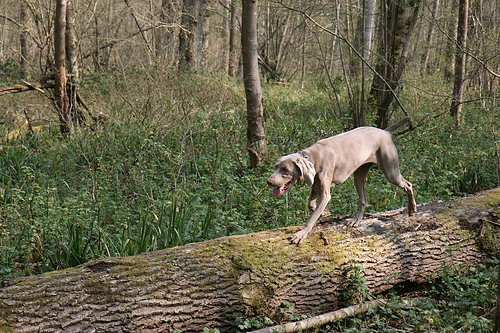

Real Caption: ['big hound dog walking on log in the woods', 'brown dog walks on top of felled tree trunk', 'grey dog walks on top of fallen tree in the woods', 'skinny brown dog walks across large piece of fallen tree', 'the skinny brown dog is walking on fallen tree']
Prediction Caption: grey dog is running toward the logs endseq


In [17]:
def evaluate(image, max_length):
    attention_plot = np.zeros((max_length, attention_features_shape))

    hidden = decoder.reset_state(batch_size=1)

    temp_input = tf.expand_dims(load_image(image)[0], 0)
    img_tensor_val = image_features_extract_model(temp_input)
    img_tensor_val = tf.reshape(img_tensor_val, (img_tensor_val.shape[0],
                                                 -1,
                                                 img_tensor_val.shape[3]))

    features = encoder(img_tensor_val)

    dec_input = tf.expand_dims([tokenizer.word_index['startseq']], 0)
    result = []

    for i in range(max_length):
        predictions, hidden, attention_weights = decoder(dec_input,
                                                         features,
                                                         hidden)

        attention_plot[i] = tf.reshape(attention_weights, (-1, )).numpy()

        predicted_id = tf.random.categorical(predictions, 1)[0][0].numpy()
        result.append(tokenizer.index_word[predicted_id])

        if tokenizer.index_word[predicted_id] == 'endseq':
            return result, attention_plot

        dec_input = tf.expand_dims([predicted_id], 0)

    attention_plot = attention_plot[:len(result), :]
    return result, attention_plot
  
def check_test(test_image_names, image_dict, image_dir, max_caption_words):
# captions on the validation set
  rid = np.random.randint(0, len(test_image_names))
  image_name = test_image_names[rid]
  real_caption = image_dict[image_name]
  image_path = image_dir + image_name + '.jpg'
  result, attention_plot = evaluate(image_path, max_caption_words)

  from IPython.display import Image, display
  display(Image(image_path))
  print('Real Caption:', real_caption)
  print('Prediction Caption:', ' '.join(result))
  
test_image_name_file = "/content/flickr8k/Flickr8k_text/Flickr_8k.testImages.txt"
test_image_names = subset_image_name (test_image_name_file)
image_dir = "/content/flickr8k/Flickr8k_Dataset/Flicker8k_Dataset/"
check_test(list(test_image_names), image_dict, image_dir, max_caption_words)